# Loading Libraries

In [41]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder

import warnings
warnings.filterwarnings('ignore')
import pickle

In [42]:
from ml_healthcare_toolkit_normal import run_healthcare_ml_pipeline
from ml_healthcare_toolkit_hyp import run_healthcare_ml_pipeline_hyp


In [43]:
df = pd.read_csv('../Dataset/df_clean_eng.csv')
df.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,cad,appet,pe,ane,classification,eGFR,comorb_score,anemia_severity,kidney_func_score,symptom_severity
0,48.0,80.0,1.020,1,0,missing,normal,notpresent,notpresent,121.000000,...,no,good,no,no,ckd,68.682456,2,-2.384153,-0.788205,0
1,7.0,50.0,1.020,4,0,missing,normal,notpresent,notpresent,140.798289,...,no,good,no,no,ckd,162.103427,0,0.807377,-1.296071,0
2,62.0,80.0,1.010,2,3,normal,normal,notpresent,notpresent,423.000000,...,no,poor,no,yes,ckd,40.838799,1,2.907140,-0.252869,2
3,48.0,70.0,1.005,4,0,normal,abnormal,present,notpresent,117.000000,...,no,poor,yes,yes,ckd,18.161458,1,2.028862,4.596228,3
4,51.0,80.0,1.010,2,0,normal,normal,notpresent,notpresent,106.000000,...,no,good,no,no,ckd,56.786414,0,0.759758,-0.964553,0


In [44]:
# Converting Object to Category
for col in df.select_dtypes(include='object').columns:
    df[col] = df[col].astype('category')

Ensuring the datatypes and non-null values are fine before moving on to train-test-split, scaling and transforms

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396 entries, 0 to 395
Data columns (total 30 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   age                396 non-null    float64 
 1   bp                 396 non-null    float64 
 2   sg                 396 non-null    float64 
 3   al                 396 non-null    int64   
 4   su                 396 non-null    int64   
 5   rbc                396 non-null    category
 6   pc                 396 non-null    category
 7   pcc                396 non-null    category
 8   ba                 396 non-null    category
 9   bgr                396 non-null    float64 
 10  bu                 396 non-null    float64 
 11  sc                 396 non-null    float64 
 12  sod                396 non-null    float64 
 13  pot                396 non-null    float64 
 14  hemo               396 non-null    float64 
 15  pcv                396 non-null    float64 
 16  wc      

# Train & Test Splitting

## Transformation and Scaling Plan

> Data Transformation Steps:
> - Log-transformed highly skewed variables: bgr, bu, sc, wc, eGFR.
> - Standard scaled all numerical features.
> - One-hot encoded all categorical variables.
> - All transformations were fit on the training set and applied to the test set to prevent data leakage.

### Version 0

Ensuring None That Require Log Transforms Have 0 or -ve Values

In [46]:
cols_to_check = ['bgr', 'bu', 'sc', 'wc', 'eGFR']

for col in cols_to_check:
    if col in df.columns:
        num_zeros = (df[col] == 0).sum()
        num_neg = (df[col] < 0).sum()
        print(f"{col}: {num_zeros} zeros, {num_neg} negatives")
        print(f"Min value: {df[col].min()}")
        print(f"Type: {df[col].dtype}\n")

bgr: 0 zeros, 0 negatives
Min value: 22.0
Type: float64

bu: 0 zeros, 0 negatives
Min value: 1.5
Type: float64

sc: 0 zeros, 0 negatives
Min value: 0.149489444642489
Type: float64

wc: 0 zeros, 0 negatives
Min value: 2200.0
Type: float64

eGFR: 0 zeros, 0 negatives
Min value: 0.9016358277259284
Type: float64



In [47]:

target = 'classification'
feature_cols = [col for col in df.columns if col not in [target, 'sc_bin', 'hemo_bin', 'bu_bin']]  # Exclude binned cols and target

X = df[feature_cols]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [48]:
print(X_train.columns.tolist())

['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane', 'eGFR', 'comorb_score', 'anemia_severity', 'kidney_func_score', 'symptom_severity']


In [49]:
print(X_train.head())

      age    bp        sg  al  su       rbc        pc         pcc          ba  \
232  45.0  70.0  1.010000   2   0   missing    normal  notpresent  notpresent   
145  69.0  60.0  1.017386   1   0   missing   missing  notpresent  notpresent   
239  69.0  70.0  1.010000   4   3    normal  abnormal     present     present   
290  75.0  60.0  1.020000   0   0    normal    normal  notpresent  notpresent   
142  57.0  90.0  1.015000   5   0  abnormal  abnormal  notpresent     present   

            bgr  ...   dm  cad  appet   pe  ane        eGFR  comorb_score  \
232  113.000000  ...   no  yes   good   no  yes   32.845576             1   
145  171.000000  ...   no   no   poor   no   no    0.901636             1   
239  214.000000  ...  yes  yes   good  yes  yes    9.414290             3   
290  110.000000  ...   no   no   good   no   no  116.850983             0   
142  195.313575  ...  yes  yes   poor  yes  yes    4.242088             3   

     anemia_severity kidney_func_score symptom_sev

In [50]:
print(y)

0         ckd
1         ckd
2         ckd
3         ckd
4         ckd
        ...  
391    notckd
392    notckd
393    notckd
394    notckd
395    notckd
Name: classification, Length: 396, dtype: category
Categories (2, object): ['ckd', 'notckd']


In [51]:
log_transform_cols = ['bgr', 'bu', 'sc', 'wc', 'eGFR']

for col in log_transform_cols:
    for x in [X_train, X_test]:
        x[col] = np.log(x[col])

In [52]:
X_train.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,dm,cad,appet,pe,ane,eGFR,comorb_score,anemia_severity,kidney_func_score,symptom_severity
232,45.0,70.0,1.010000,2,0,missing,normal,notpresent,notpresent,4.727388,...,no,yes,good,no,yes,3.491817,1,4.691069,0.778275,1
145,69.0,60.0,1.017386,1,0,missing,missing,notpresent,notpresent,5.141664,...,no,no,poor,no,no,-0.103545,1,0.044029,10.737466,1
239,69.0,70.0,1.010000,4,3,normal,abnormal,present,present,5.365976,...,yes,yes,good,yes,yes,2.242229,3,3.829682,4.676520,2
290,75.0,60.0,1.020000,0,0,normal,normal,notpresent,notpresent,4.700480,...,no,no,good,no,no,4.760899,0,-2.147557,-0.188470,0
142,57.0,90.0,1.015000,5,0,abnormal,abnormal,notpresent,present,5.274606,...,yes,yes,poor,yes,yes,1.445056,3,4.829802,10.505472,3


In [53]:
# Identify numerical columns (excluding categorical and binned)
num_cols = X_train.select_dtypes(include=['float64', 'int32']).columns.tolist()

scaler = StandardScaler()
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])

In [54]:
X_train.head()

,age,bp,sg,al,su,rbc,pc,pcc,ba,bgr,...,dm,cad,appet,pe,ane,eGFR,comorb_score,anemia_severity,kidney_func_score,symptom_severity
232,-0.364216,-0.441821,-1.444439,2,0,missing,normal,notpresent,notpresent,-0.422890,...,no,yes,good,no,yes,-0.314845,1,1.661909,0.299056,1
145,1.019392,-1.164782,-0.053023,1,0,missing,missing,notpresent,notpresent,0.559469,...,no,no,poor,no,no,-3.746295,1,0.028827,4.357767,1
239,1.019392,-0.441821,-1.444439,4,3,normal,abnormal,present,present,1.091373,...,yes,yes,good,yes,yes,-1.507465,3,1.359197,1.887724,2
290,1.365294,-1.164782,0.439451,0,0,normal,normal,notpresent,notpresent,-0.486695,...,no,no,good,no,no,0.896381,0,-0.741349,-0.094926,0
142,0.327588,1.004101,-0.502494,5,0,abnormal,abnormal,notpresent,present,0.874711,...,yes,yes,poor,yes,yes,-2.268295,3,1.710663,4.263221,3


In [55]:
cat_cols = X_train.select_dtypes(include='category').columns.tolist()

X_train = pd.get_dummies(X_train, columns=cat_cols, drop_first=True)
X_test = pd.get_dummies(X_test, columns=cat_cols, drop_first=True)

# Ensure columns match in train and test
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

In [56]:
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)

print(le.classes_)  # To see which label is 0 and which is 1

y_train = pd.Series(y_train)
y_test = pd.Series(y_test)

['ckd' 'notckd']


In [57]:
X_train.head()

,age,bp,sg,al,su,bgr,bu,sc,sod,pot,...,pc_missing,pc_normal,pcc_present,ba_present,htn_yes,dm_yes,cad_yes,appet_poor,pe_yes,ane_yes
232,-0.364216,-0.441821,-1.444439,2,0,-0.422890,1.136664,0.330391,-0.000938,0.306884,...,False,True,False,False,False,False,True,False,False,True
145,1.019392,-1.164782,-0.053023,1,0,0.559469,-0.789703,3.767945,-0.000938,0.306884,...,True,False,False,False,True,False,False,True,False,False
239,1.019392,-0.441821,-1.444439,4,3,1.091373,1.184651,1.469665,-2.779998,-0.799084,...,False,False,True,True,True,True,True,False,True,True
290,1.365294,-1.164782,0.439451,0,0,-0.486695,0.198684,-1.014595,-0.401854,0.902794,...,False,True,False,False,False,False,False,False,False,False
142,0.327588,1.004101,-0.502494,5,0,0.874711,3.013832,2.288697,-1.828740,0.593361,...,False,False,False,True,True,True,True,True,True,True


In [58]:
print(X_train.isnull().sum().sum(), X_test.isnull().sum().sum())

0 0


In [59]:
print(X_train.shape, X_test.shape)

(316, 31) (80, 31)


In [60]:
print(df.columns.tolist())

['age', 'bp', 'sg', 'al', 'su', 'rbc', 'pc', 'pcc', 'ba', 'bgr', 'bu', 'sc', 'sod', 'pot', 'hemo', 'pcv', 'wc', 'rc', 'htn', 'dm', 'cad', 'appet', 'pe', 'ane', 'classification', 'eGFR', 'comorb_score', 'anemia_severity', 'kidney_func_score', 'symptom_severity']


### Version 1

In [61]:

feature_cols_imp1 = ['anemia_severity','hemo','sg','comorb_score','eGFR','rbc','sc','dm','htn','bgr','symptom_severity']

X_imp1 = df[feature_cols_imp1]
y_imp1 = df[target]

X_train_imp1, X_test_imp1, y_train_imp1, y_test_imp1 = train_test_split(X_imp1, y_imp1, test_size=0.2, random_state=42, stratify=y_imp1)

In [62]:
y_train_imp1.value_counts()

classification
ckd       196
notckd    120
Name: count, dtype: int64

In [63]:
len(feature_cols_imp1)

11

In [64]:
log_transform_cols_imp1 = ['bgr','sc', 'eGFR']

for col in log_transform_cols_imp1:
    for x in [X_train_imp1, X_test_imp1]:
        x[col] = np.log(x[col])

In [65]:
# Identify numerical columns (excluding categorical and binned)
num_cols_imp1 = X_train_imp1.select_dtypes(include=['float64', 'int32']).columns.tolist()

scaler_imp1 = StandardScaler()
X_train_imp1[num_cols_imp1] = scaler_imp1.fit_transform(X_train_imp1[num_cols_imp1])
X_test_imp1[num_cols_imp1] = scaler_imp1.transform(X_test_imp1[num_cols_imp1])

In [66]:
cat_cols_imp1 = X_train_imp1.select_dtypes(include='category').columns.tolist()

X_train_imp1 = pd.get_dummies(X_train_imp1, columns=cat_cols_imp1, drop_first=True)
X_test_imp1 = pd.get_dummies(X_test_imp1, columns=cat_cols_imp1, drop_first=True)

# Ensure columns match in train and test
X_test_imp1 = X_test_imp1.reindex(columns=X_train_imp1.columns, fill_value=0)

In [67]:
y_test_imp1.value_counts()

classification
ckd       50
notckd    30
Name: count, dtype: int64

In [68]:
type(y_train_imp1)

pandas.core.series.Series

In [69]:
le_imp1 = LabelEncoder()
y_train_imp1 = le_imp1.fit_transform(y_train_imp1)
y_test_imp1 = le_imp1.transform(y_test_imp1)

print(le_imp1.classes_)  
y_train_imp1 = pd.Series(y_train_imp1)
y_test_imp1 = pd.Series(y_test_imp1)

['ckd' 'notckd']


In [70]:
print(y_train_imp1.value_counts())
print(y_test_imp1.value_counts())

0    196
1    120
Name: count, dtype: int64
0    50
1    30
Name: count, dtype: int64


### Version 2

In [71]:
# Exclude target and categorical columns from features
feature_cols_imp2 = ['hemo','sg','sc','htn','bgr']

X_imp2 = df[feature_cols_imp2]
y_imp2 = df[target]

X_train_imp2, X_test_imp2, y_train_imp2, y_test_imp2 = train_test_split(X_imp2, y_imp2, test_size=0.2, random_state=42, stratify=y_imp2)

In [72]:
y_test_imp2.value_counts()

classification
ckd       50
notckd    30
Name: count, dtype: int64

In [73]:
len(feature_cols_imp2)

5

In [74]:
log_transform_cols_imp2 = ['bgr','sc']

for col in log_transform_cols_imp2:
    for x in [X_train_imp2, X_test_imp2]:
        x[col] = np.log(x[col])

In [75]:
# Identify numerical columns (excluding categorical and binned)
num_cols_imp2 = X_train_imp2.select_dtypes(include=['float64', 'int32']).columns.tolist()

scaler_imp2 = StandardScaler()
X_train_imp2[num_cols_imp2] = scaler_imp2.fit_transform(X_train_imp2[num_cols_imp2])
X_test_imp2[num_cols_imp2] = scaler_imp2.transform(X_test_imp2[num_cols_imp2])

In [76]:
cat_cols_imp2 = X_train_imp2.select_dtypes(include='category').columns.tolist()

X_train_imp2 = pd.get_dummies(X_train_imp2, columns=cat_cols_imp2, drop_first=True)
X_test_imp2 = pd.get_dummies(X_test_imp2, columns=cat_cols_imp2, drop_first=True)

# Ensure columns match in train and test
X_test_imp2 = X_test_imp2.reindex(columns=X_train_imp2.columns, fill_value=0)

In [77]:
le_imp2 = LabelEncoder()
y_train_imp2 = le_imp2.fit_transform(y_train_imp2)
y_test_imp2 = le_imp2.transform(y_test_imp2)

print(le_imp2.classes_) 

y_train_imp2 = pd.Series(y_train_imp2)
y_test_imp2 = pd.Series(y_test_imp2)

['ckd' 'notckd']


In [78]:
X_test_imp2.isnull().sum().sum()

np.int64(0)

In [79]:
artifacts = {
    "scaler": scaler_imp2,
    "label_encoder": le_imp2,
    "feature_columns": X_train_imp2.columns.tolist(),
    "log_transform_cols": ['bgr', 'sc'],
    "num_cols": num_cols_imp2
}

with open("../PickleFiles/ckd_imp2_artifacts.pkl", "wb") as f:
    pickle.dump(artifacts, f)

# Model Training

## Without hyperparameter tuning

### Version 0


HEALTHCARE ML ANALYSIS PIPELINE
Kidney Disease Detection - Enhanced Overfitting Detection
 Dataset Info:
   Training samples: 316
   Test samples: 80
   Features: 31
   Classes: 2
   Class distribution: {np.int64(0): np.int64(196), np.int64(1): np.int64(120)}

Testing 26 different classification algorithms...

COMPREHENSIVE ANALYSIS: Logistic Regression (L1)
PERFORMANCE METRICS:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000
   PR AUC: 1.0000

 ENHANCED OVERFITTING ANALYSIS:
   Train F1 Score: 1.0000
   Test F1 Score: 1.0000
   F1 Performance Gap: 0.0000
   Accuracy Gap: 0.0000
   Overfitting Score: 1.000
   Overfitting Risk: CRITICAL
   Overfitting Indicators:
     • High confidence predictions: 92.4% of training predictions are >95% or <5% confident
     • Perfect training score detected (99.9%+) - highly suspicious
     • Perfect test score detected (99.9%+) - possible data leakage

STRATIFIED K-FOLD CROSS VALIDATION:
   CV Sc

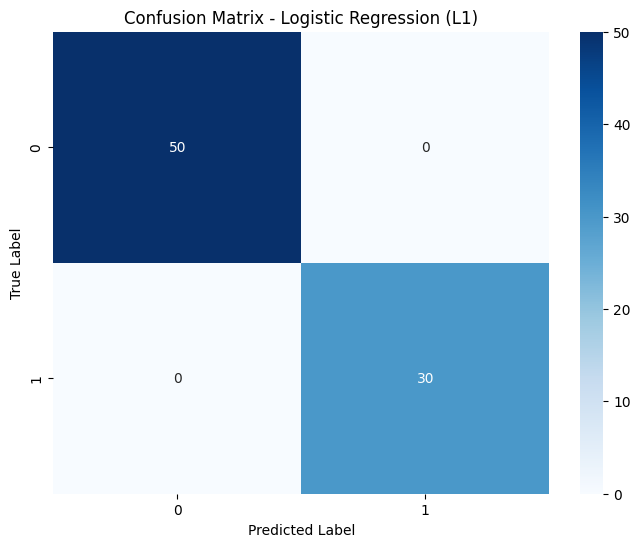

Generating ROC Curve...


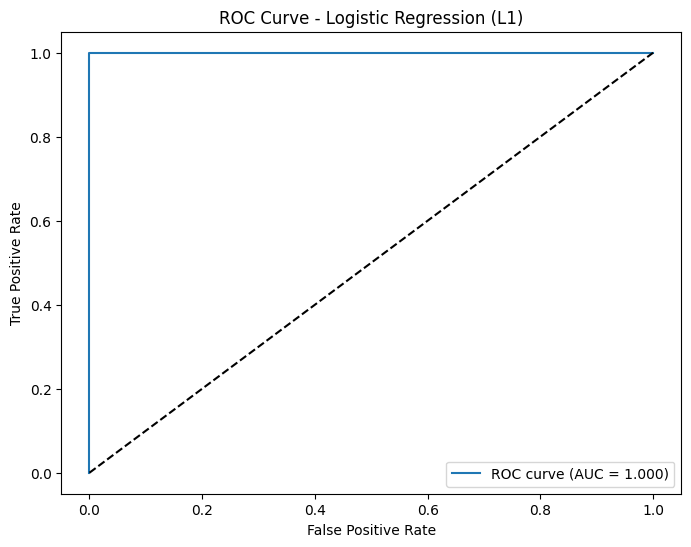

Generating Precision-Recall Curve...


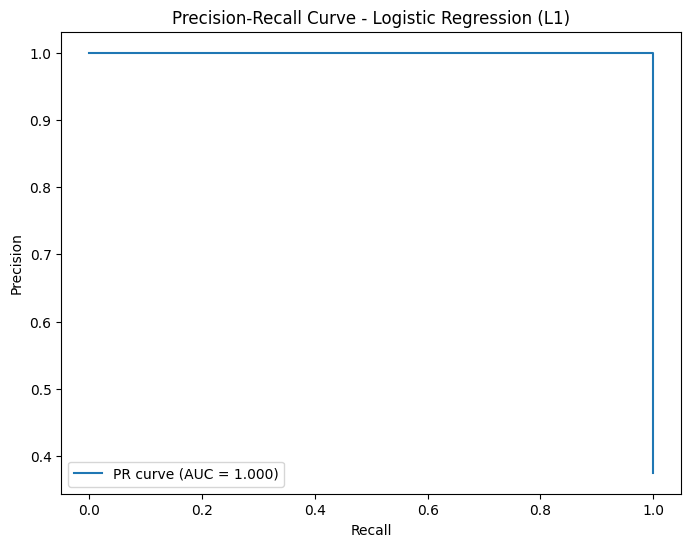

Generating Validation Curve Analysis...


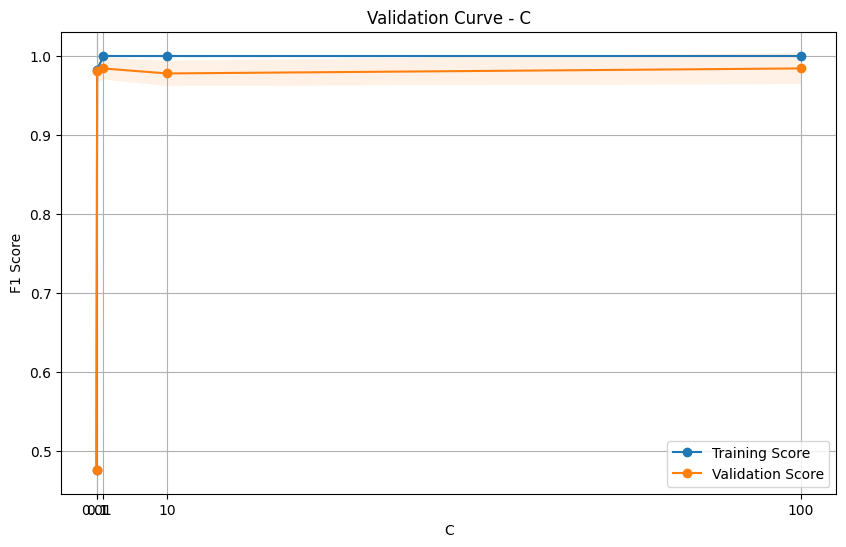

Completed analysis for Logistic Regression (L1)


ANALYZING: Logistic Regression (L2)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


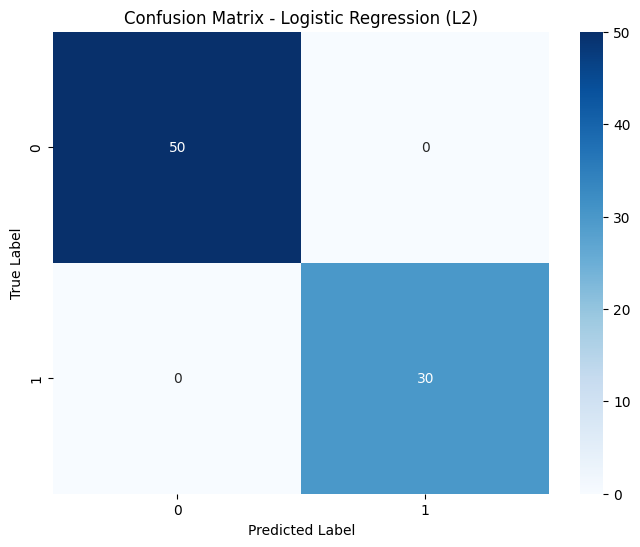

Generating ROC Curve...


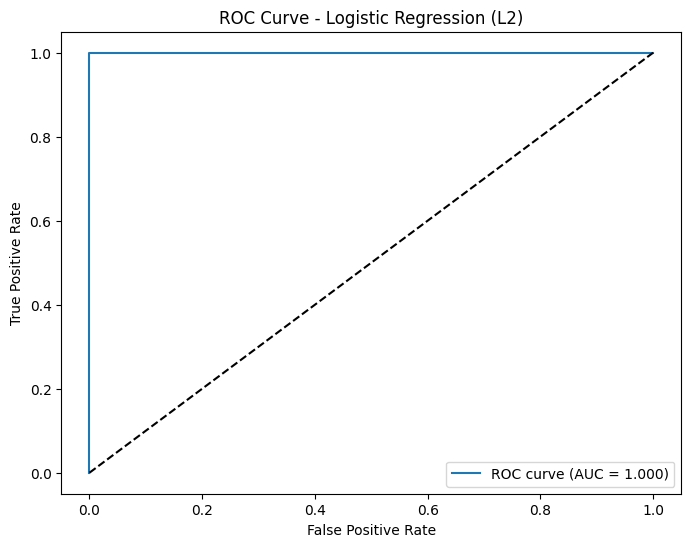

Generating Precision-Recall Curve...


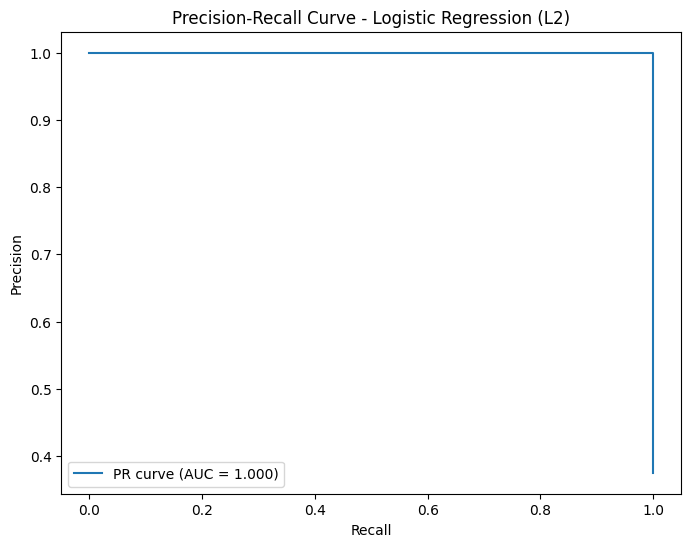

Generating Validation Curve Analysis...


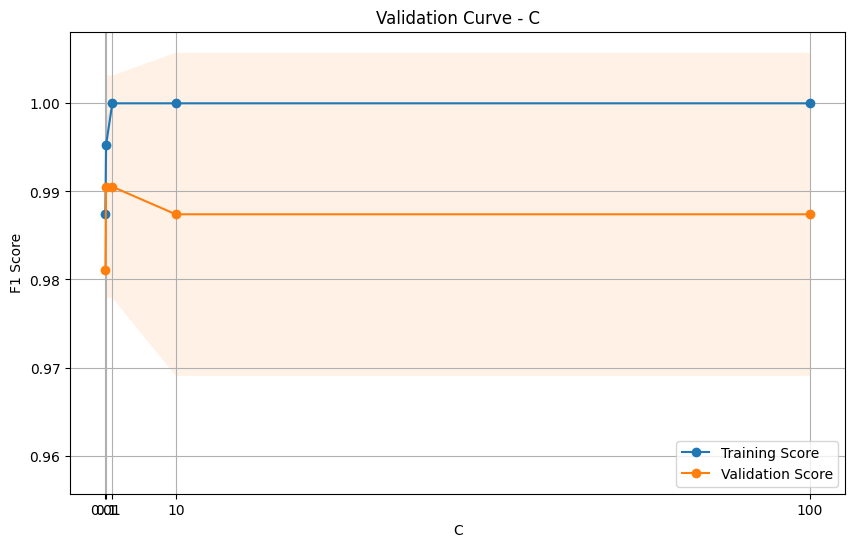

Completed analysis for Logistic Regression (L2)


ANALYZING: Logistic Regression (ElasticNet)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


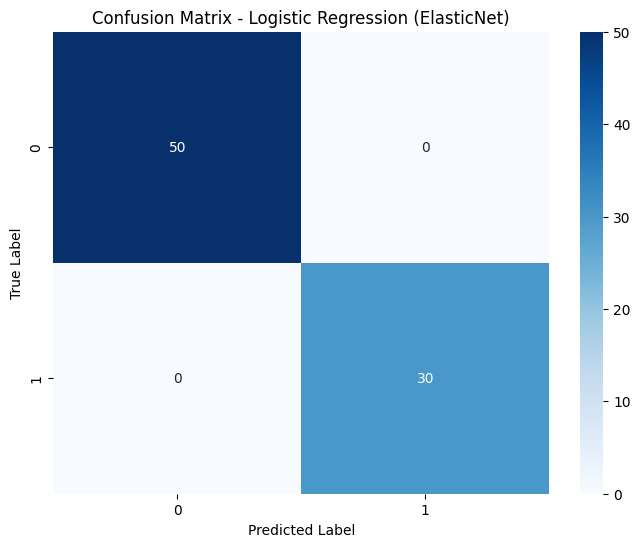

Generating ROC Curve...


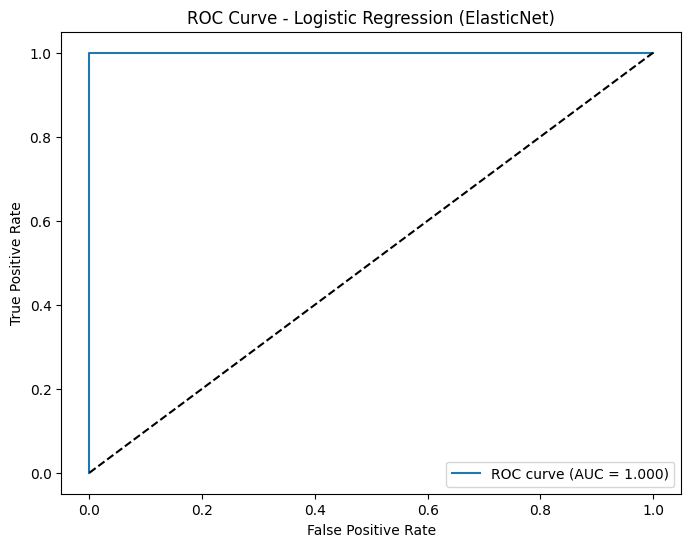

Generating Precision-Recall Curve...


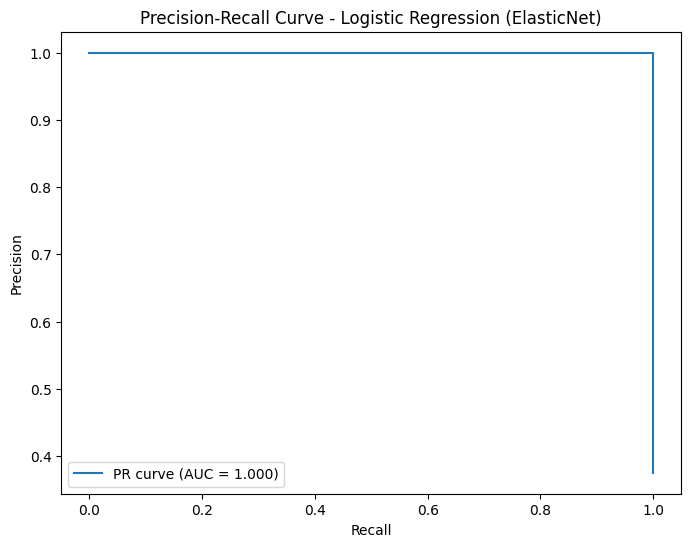

Generating Validation Curve Analysis...


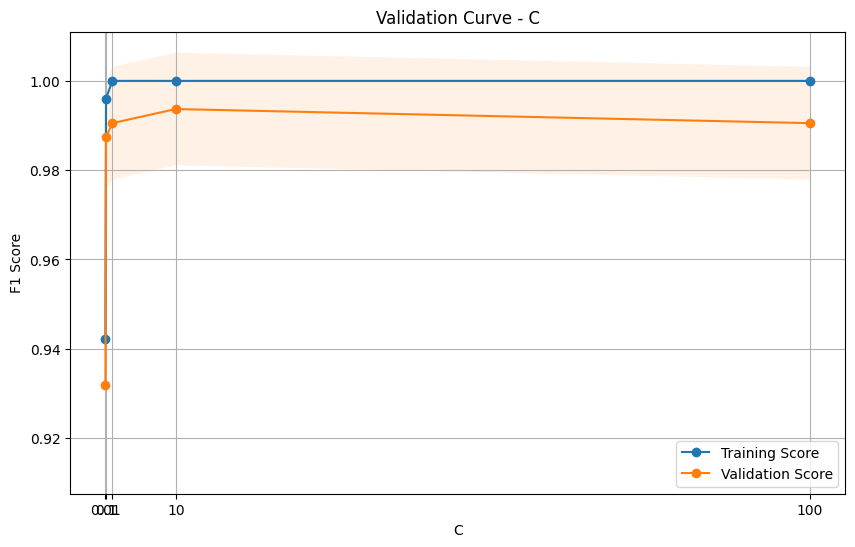

Completed analysis for Logistic Regression (ElasticNet)


ANALYZING: Ridge Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


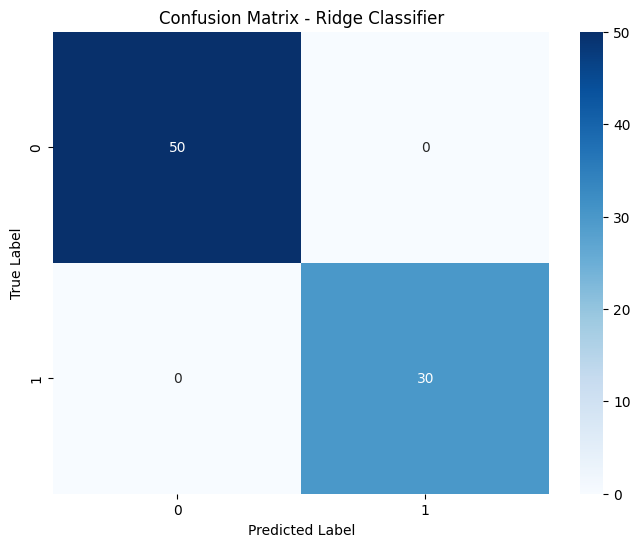

Generating ROC Curve...


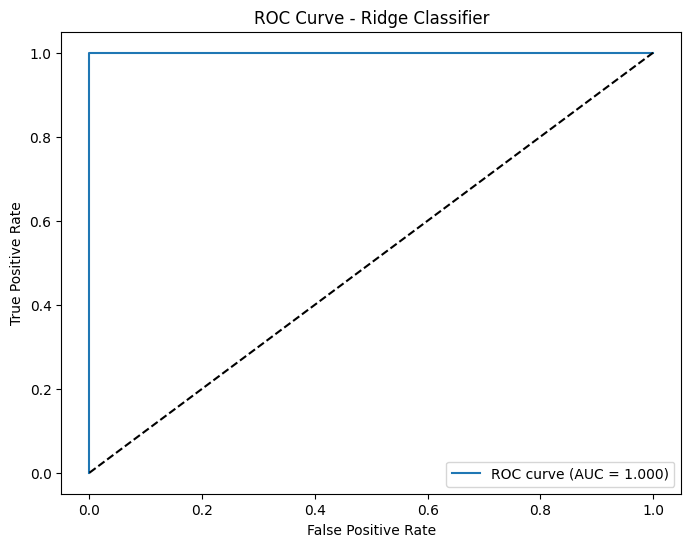

Generating Precision-Recall Curve...


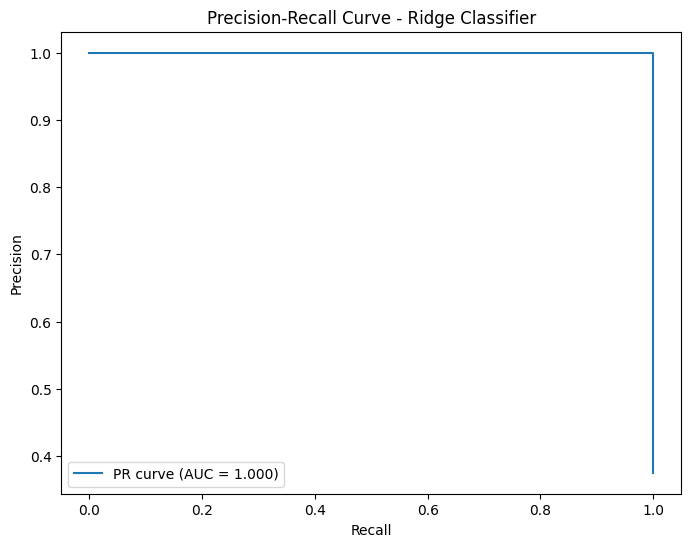

Generating Feature Coefficients Plot...


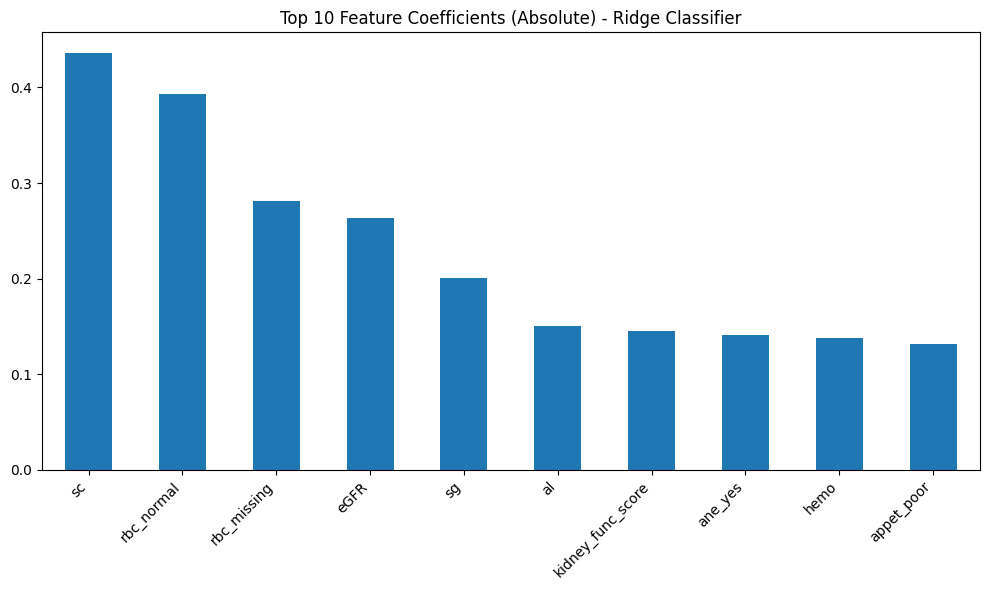

Generating Validation Curve Analysis...
Completed analysis for Ridge Classifier


ANALYZING: SGD Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


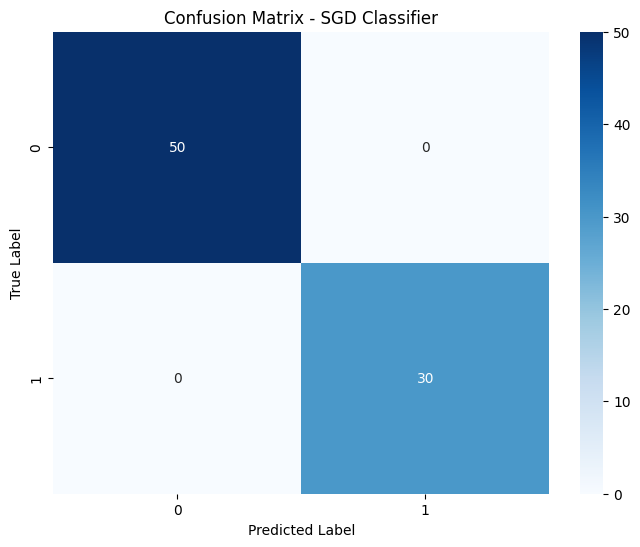

Generating ROC Curve...


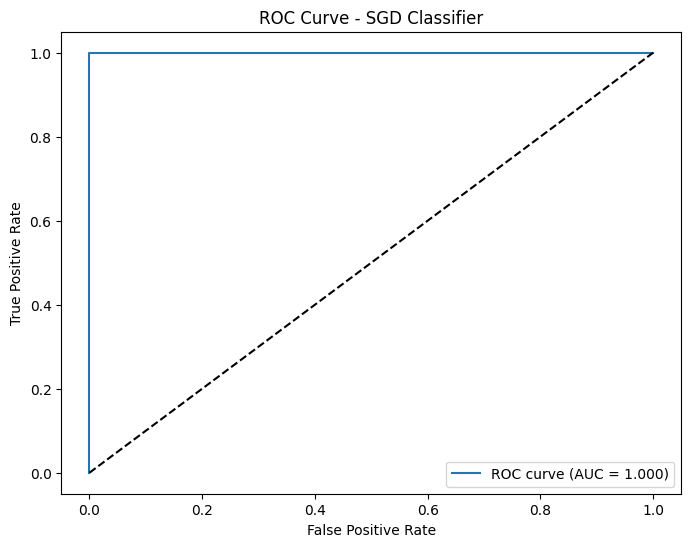

Generating Precision-Recall Curve...


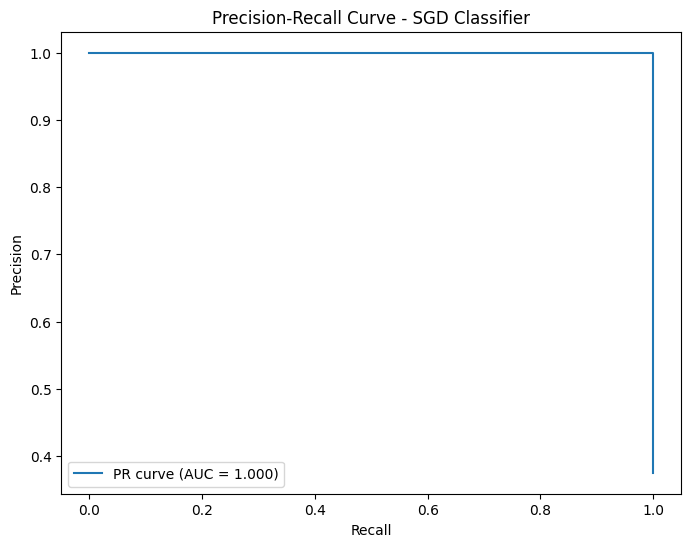

Generating Validation Curve Analysis...
Completed analysis for SGD Classifier


ANALYZING: Decision Tree
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9827

 Generating Confusion Matrix...


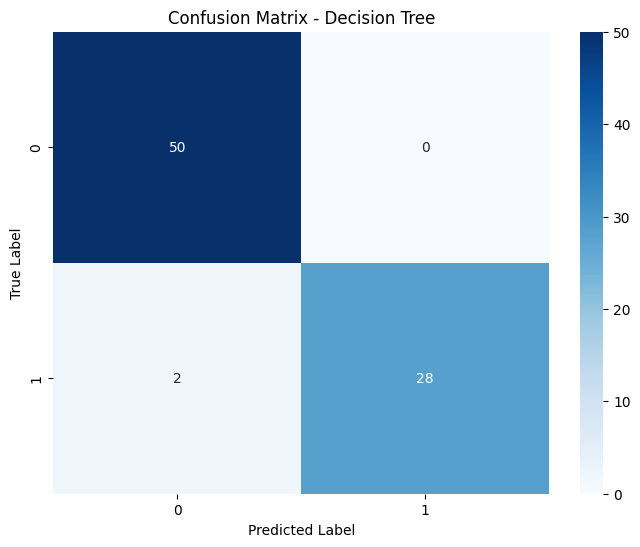

Generating ROC Curve...


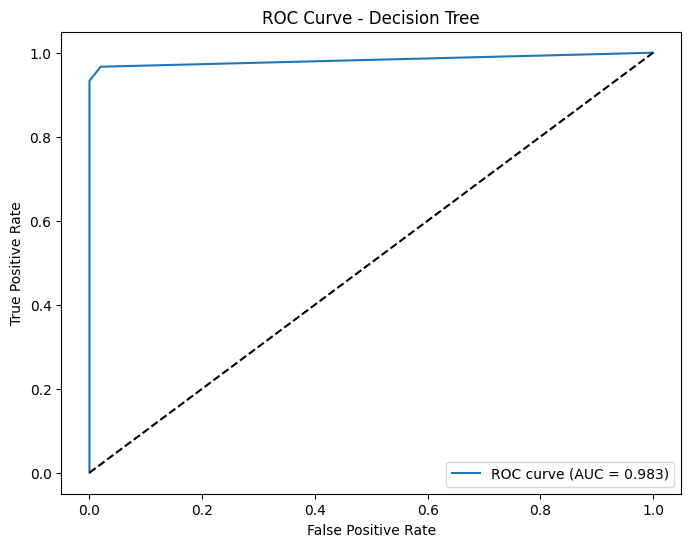

Generating Precision-Recall Curve...


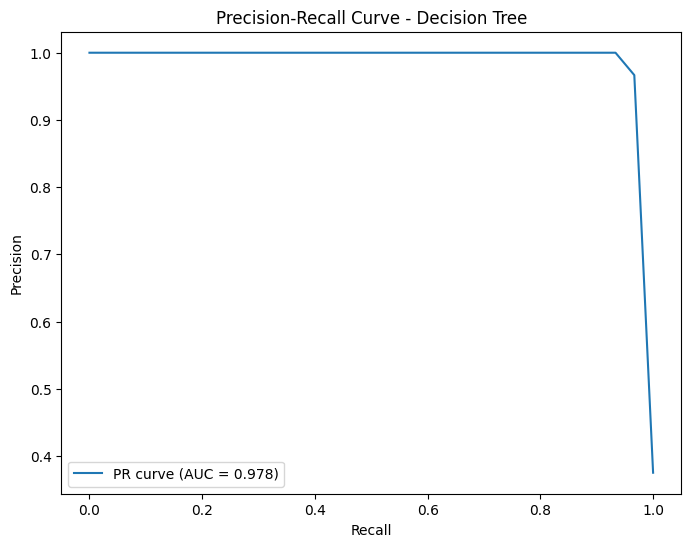

Generating Feature Importance Plot...


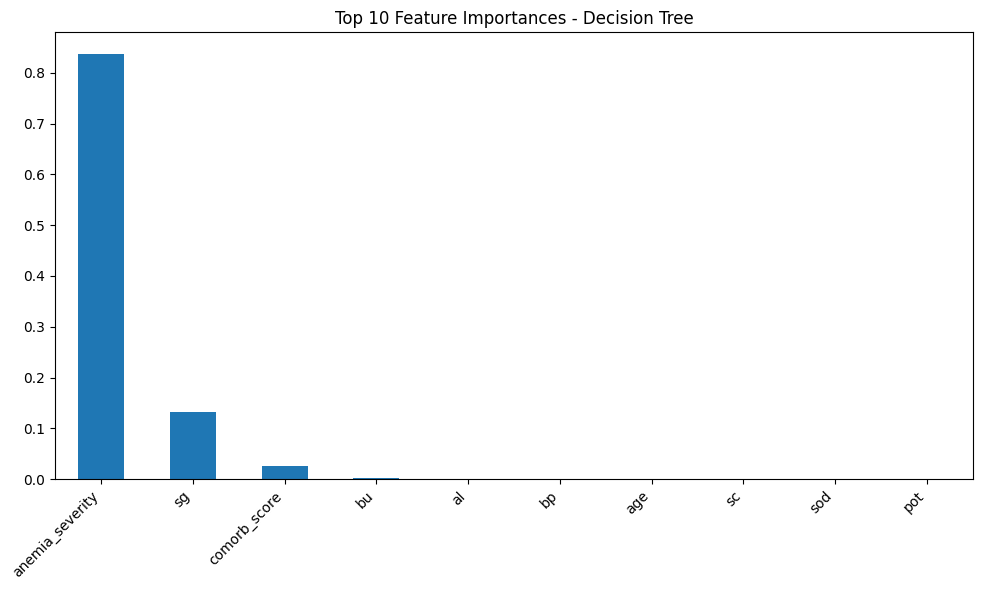

Generating Validation Curve Analysis...
Completed analysis for Decision Tree


ANALYZING: Random Forest
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9947

 Generating Confusion Matrix...


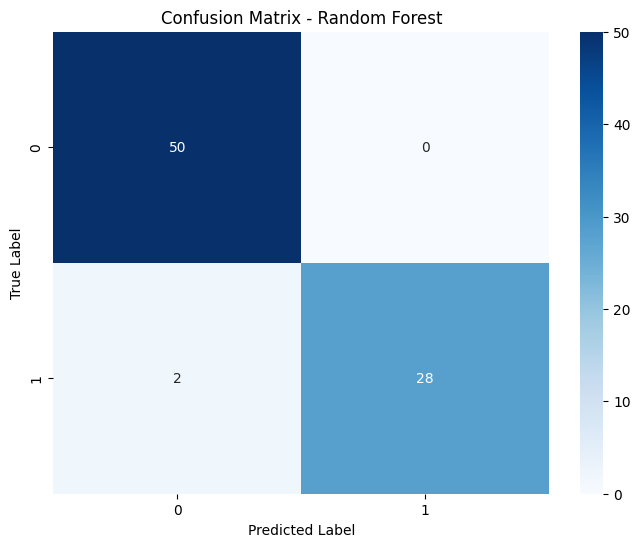

Generating ROC Curve...


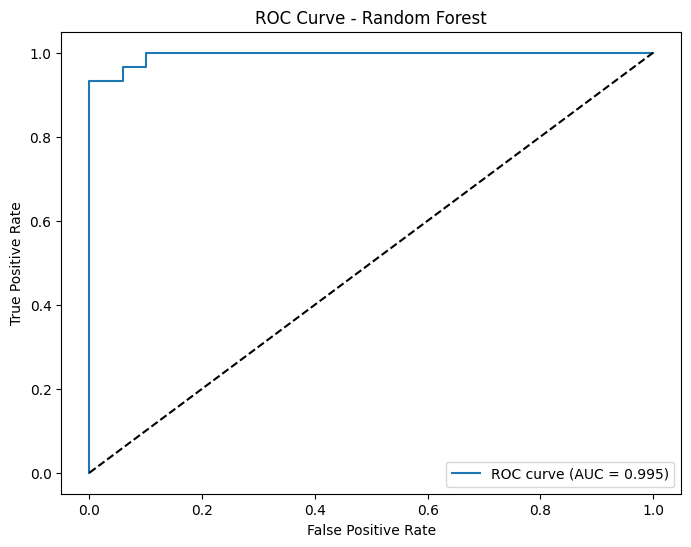

Generating Precision-Recall Curve...


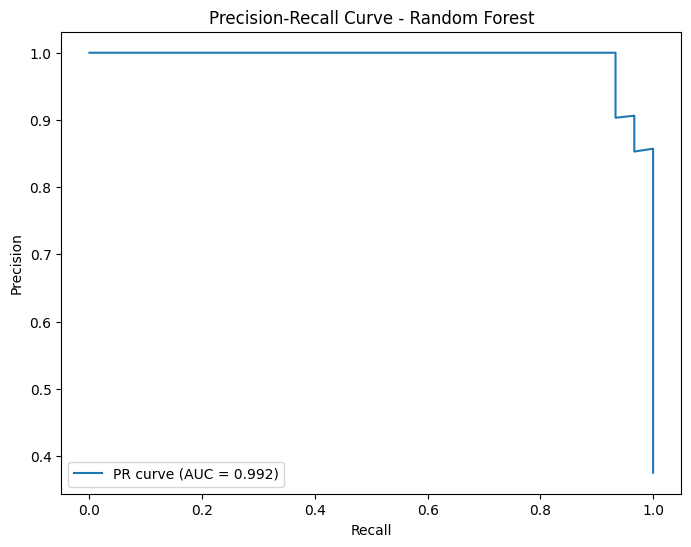

Generating Feature Importance Plot...


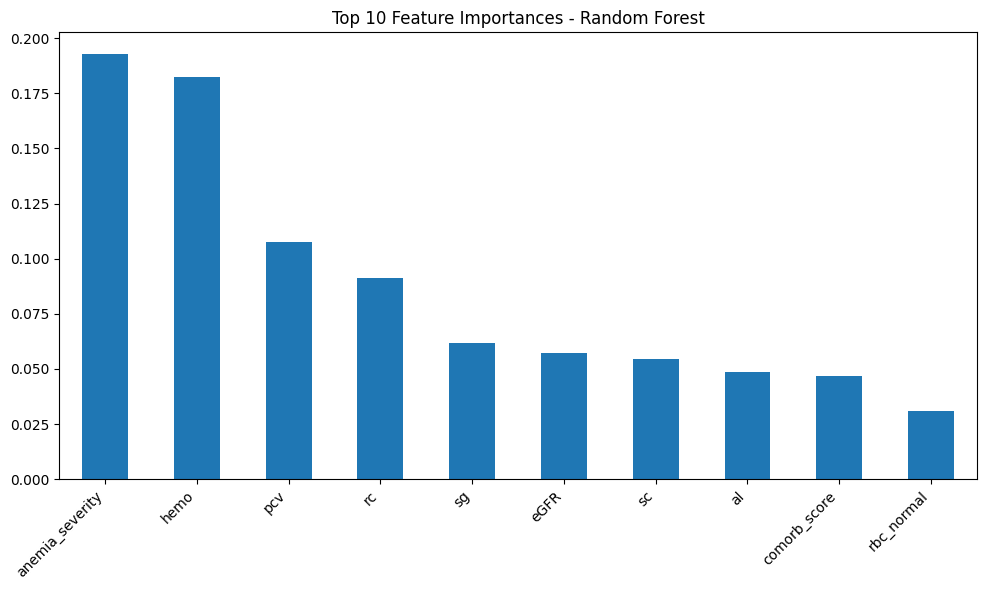

Generating Validation Curve Analysis...


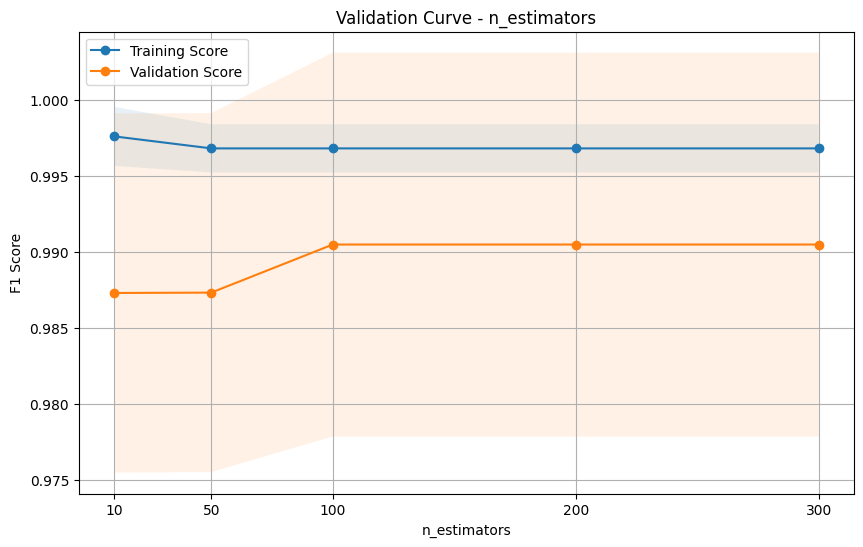

Completed analysis for Random Forest


ANALYZING: Extra Trees
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


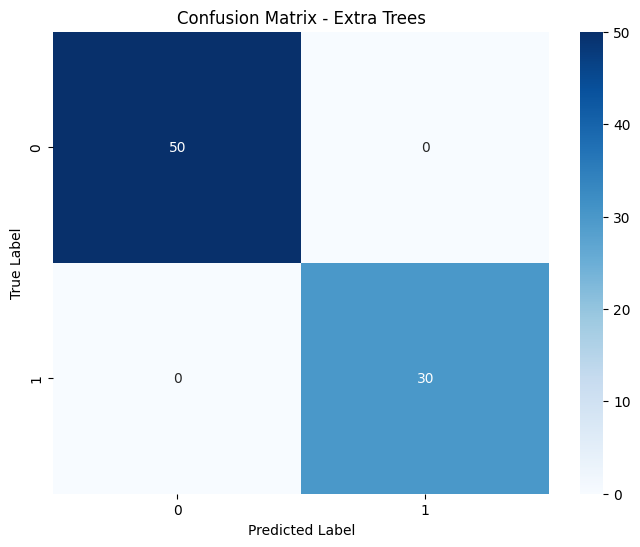

Generating ROC Curve...


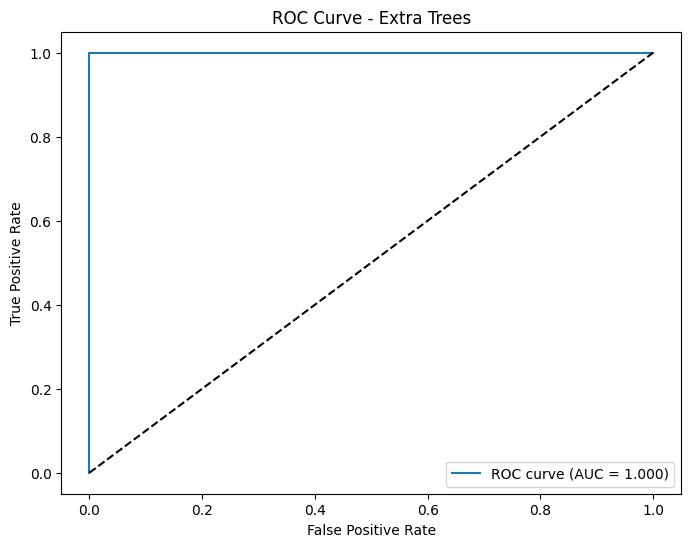

Generating Precision-Recall Curve...


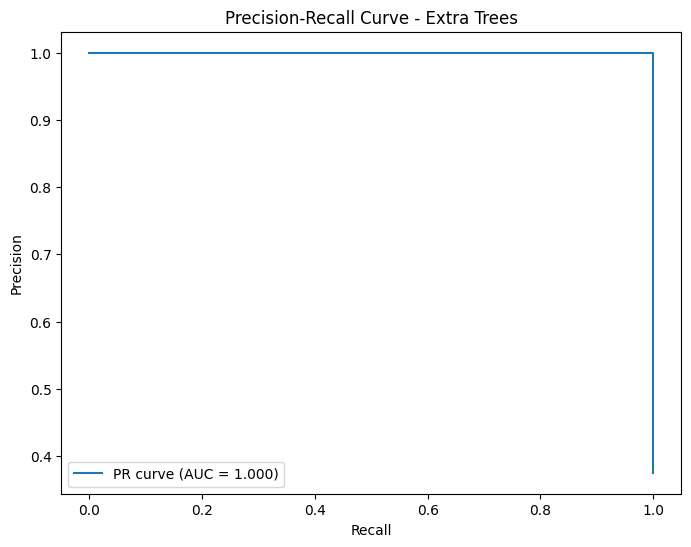

Generating Feature Importance Plot...


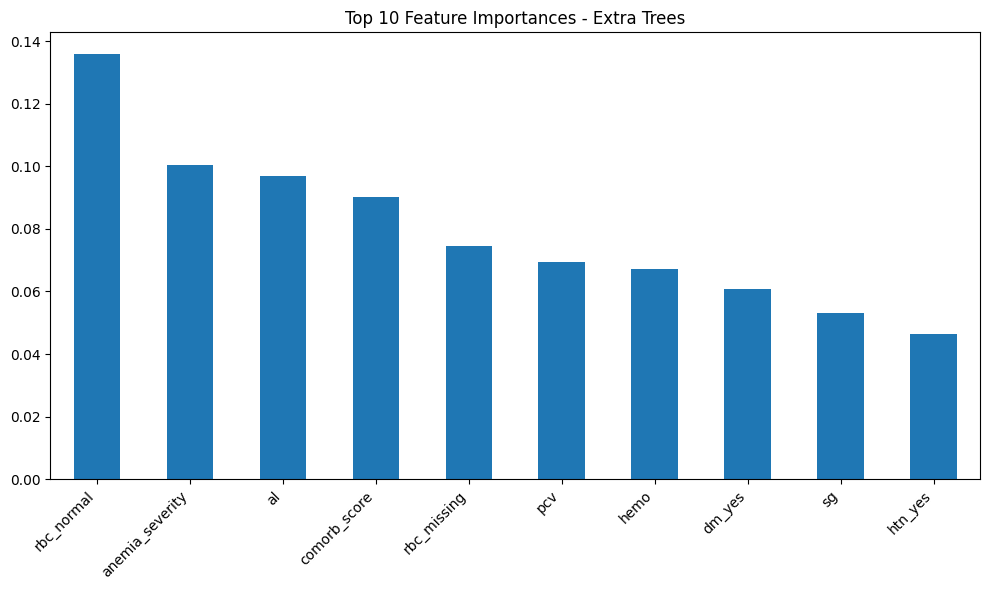

Generating Validation Curve Analysis...
Completed analysis for Extra Trees


ANALYZING: Gradient Boosting
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9877
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 0.9973

 Generating Confusion Matrix...


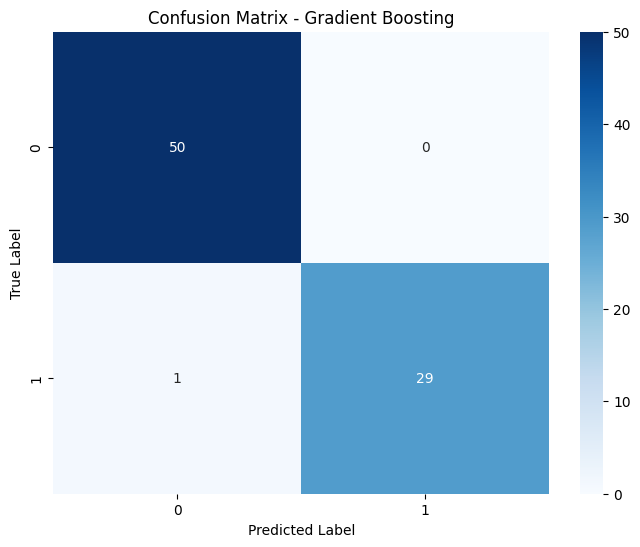

Generating ROC Curve...


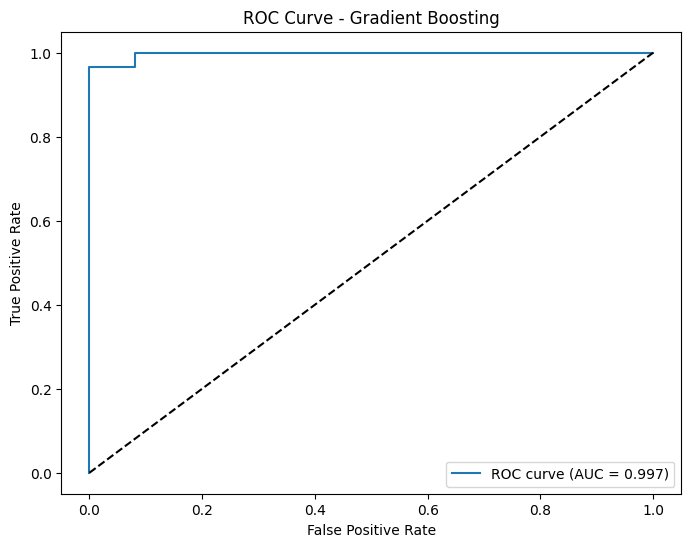

Generating Precision-Recall Curve...


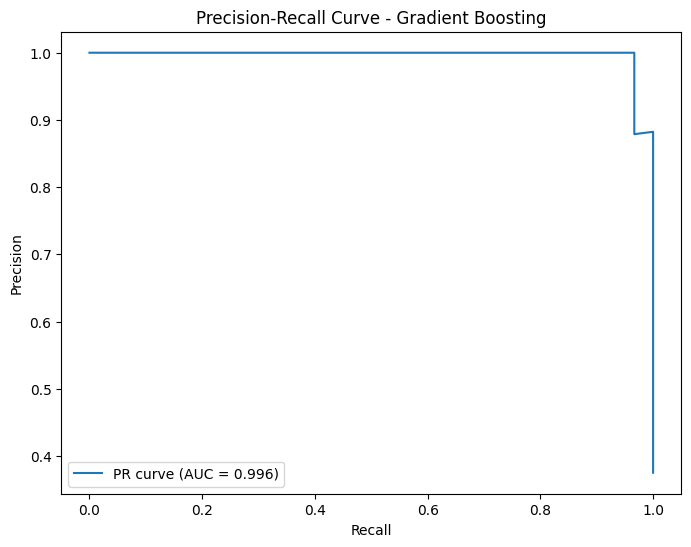

Generating Feature Importance Plot...


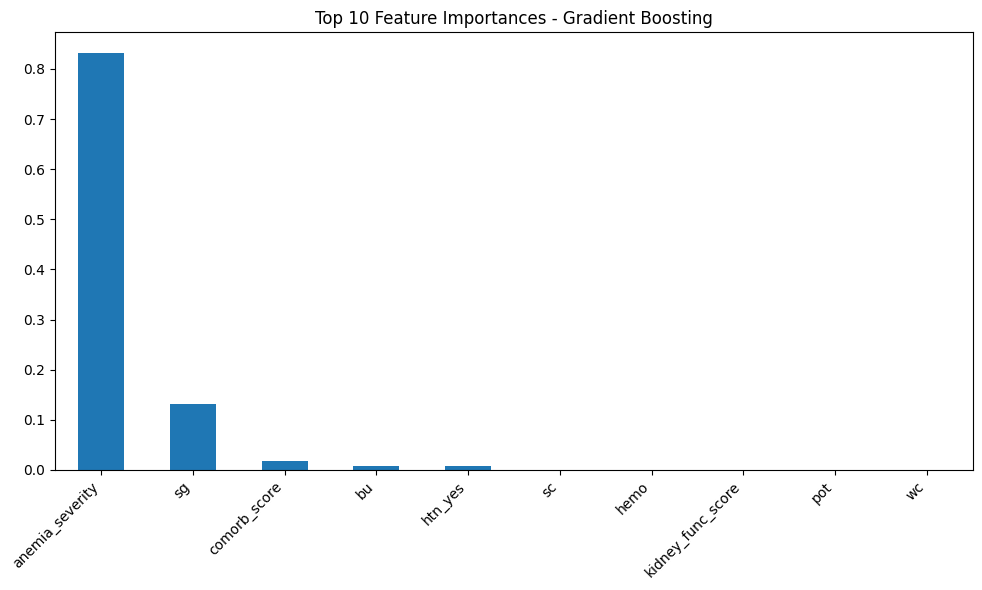

Generating Validation Curve Analysis...
Completed analysis for Gradient Boosting


ANALYZING: AdaBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


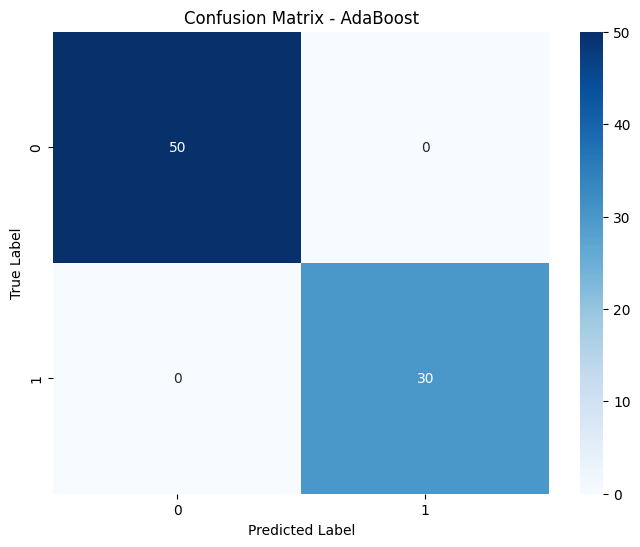

Generating ROC Curve...


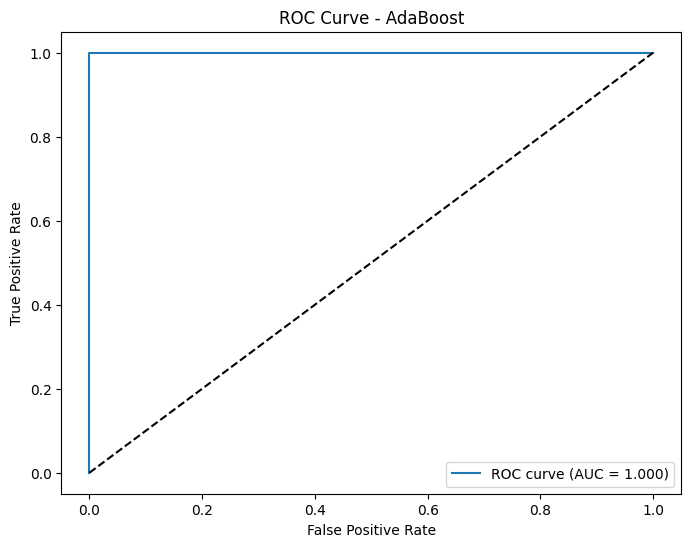

Generating Precision-Recall Curve...


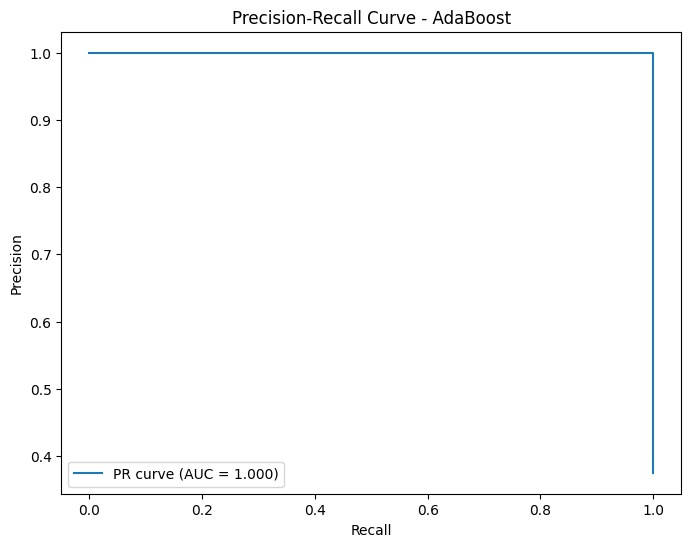

Generating Feature Importance Plot...


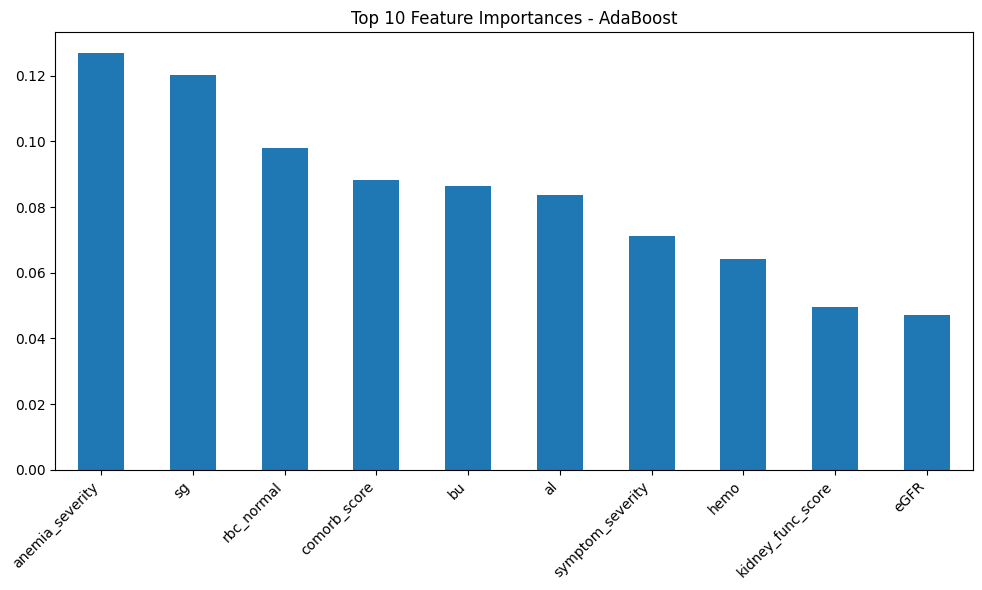

Generating Validation Curve Analysis...
Completed analysis for AdaBoost


ANALYZING: Bagging
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9790

 Generating Confusion Matrix...


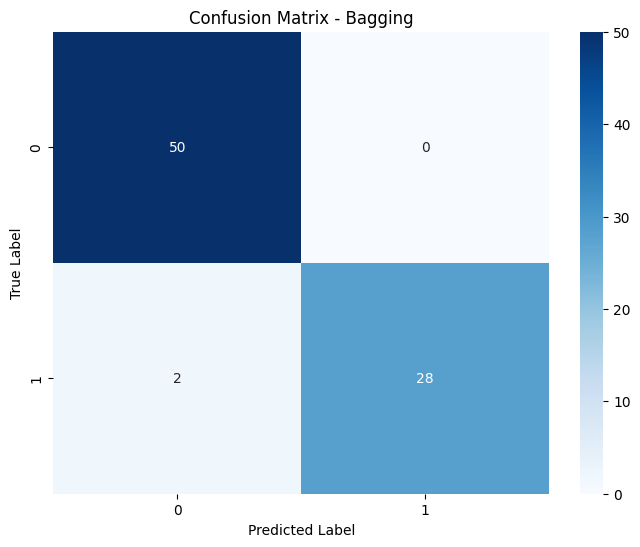

Generating ROC Curve...


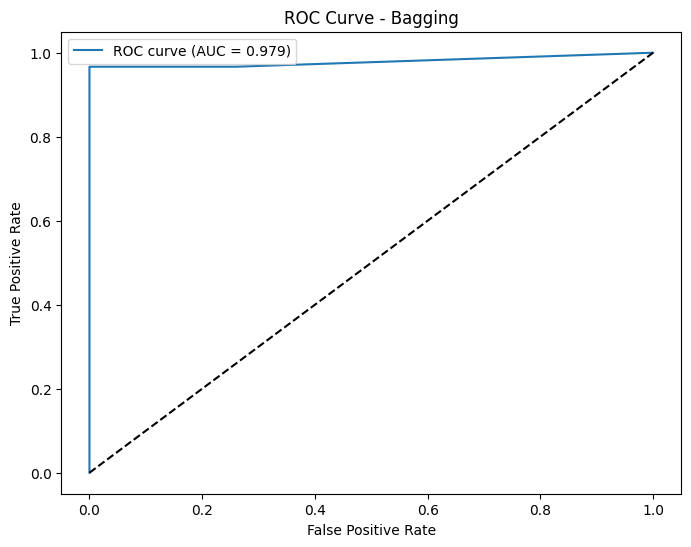

Generating Precision-Recall Curve...


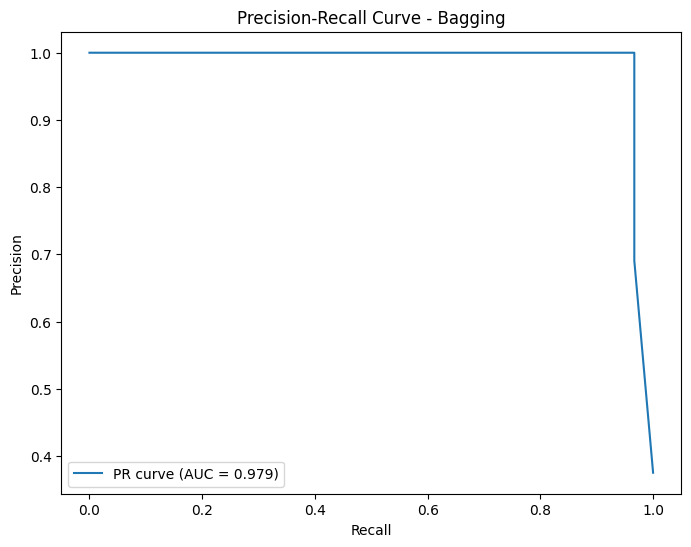

Generating Validation Curve Analysis...
Completed analysis for Bagging


ANALYZING: XGBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9877
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


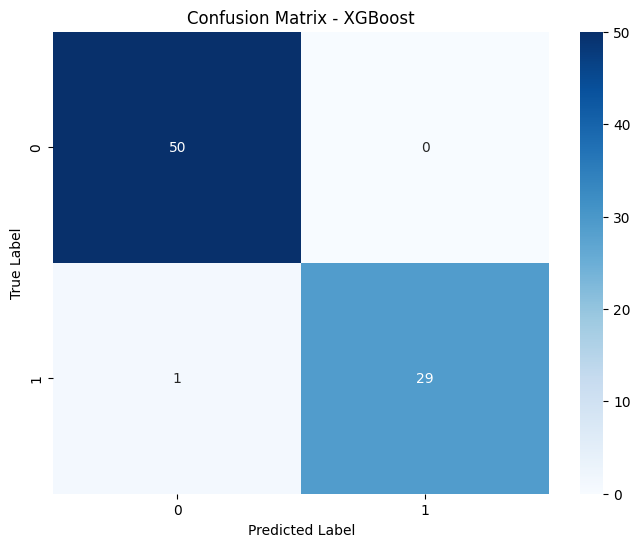

Generating ROC Curve...


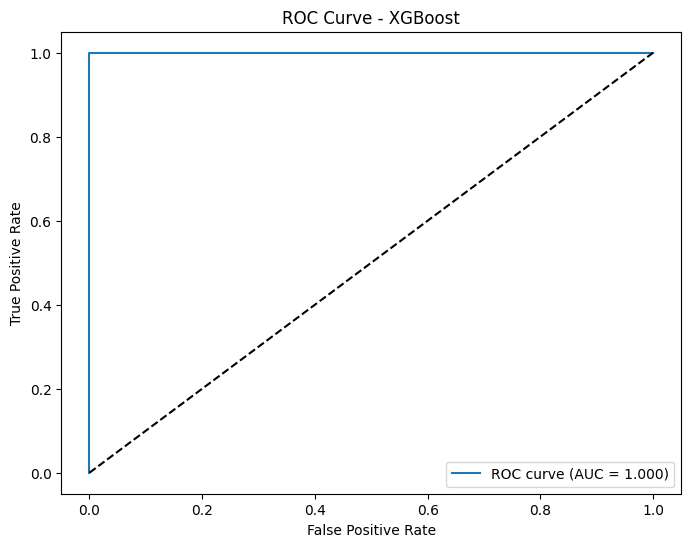

Generating Precision-Recall Curve...


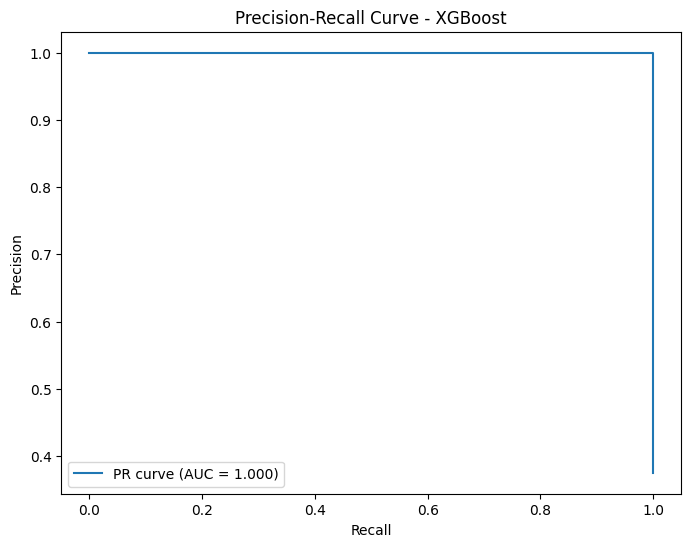

Generating Feature Importance Plot...


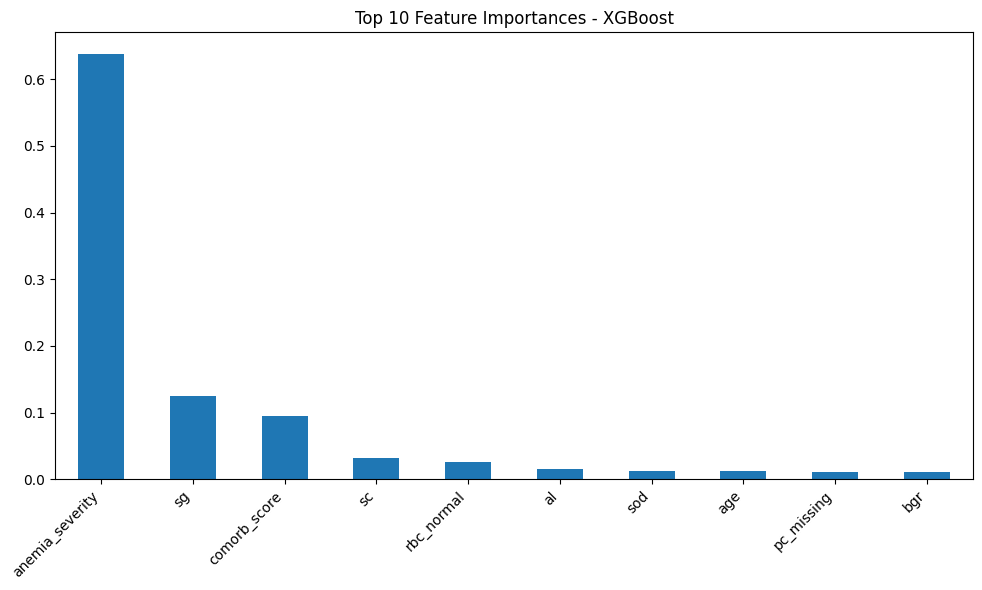

Generating Validation Curve Analysis...


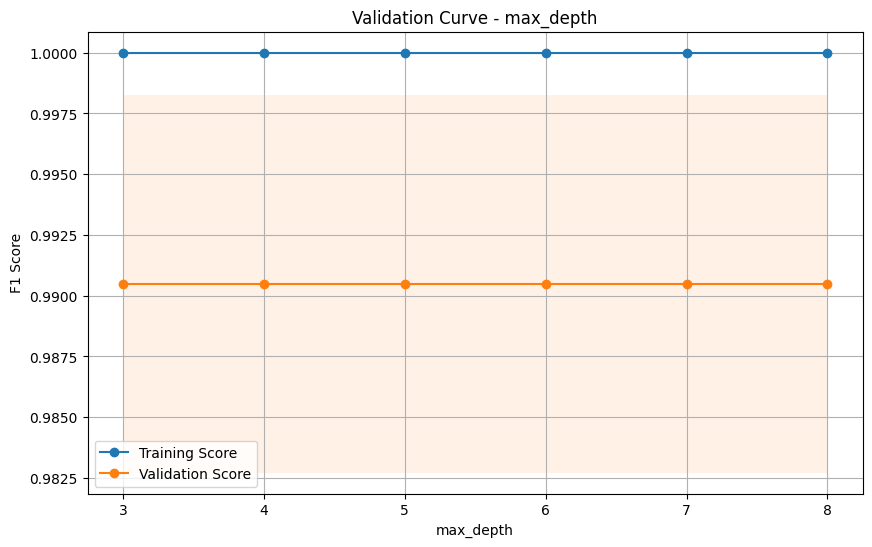

Completed analysis for XGBoost


ANALYZING: LightGBM
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


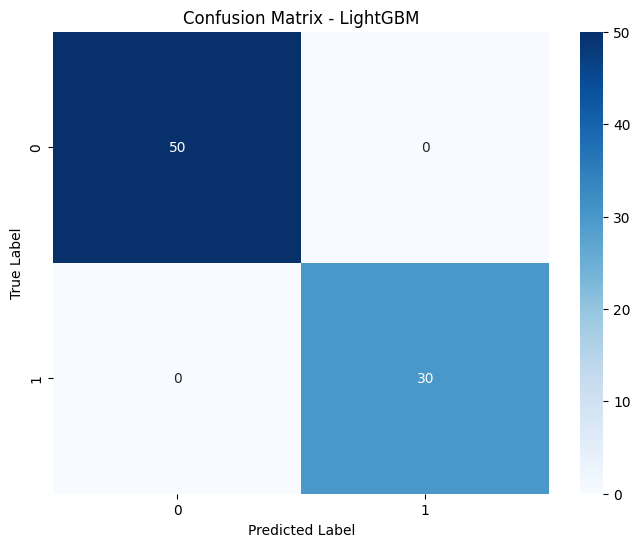

Generating ROC Curve...


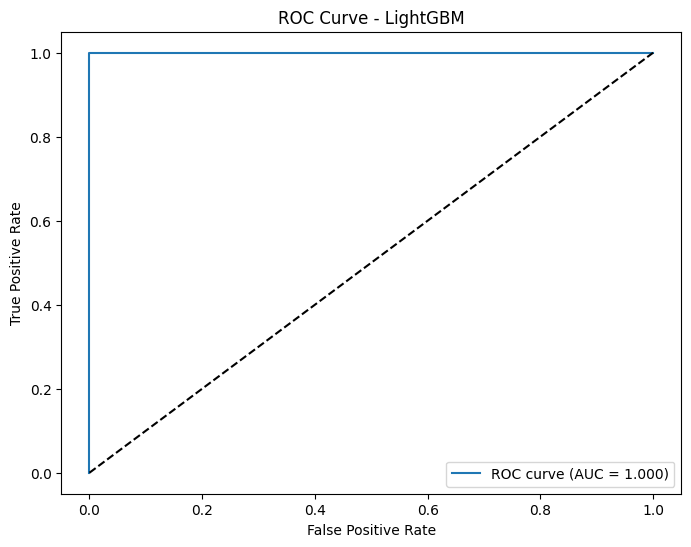

Generating Precision-Recall Curve...


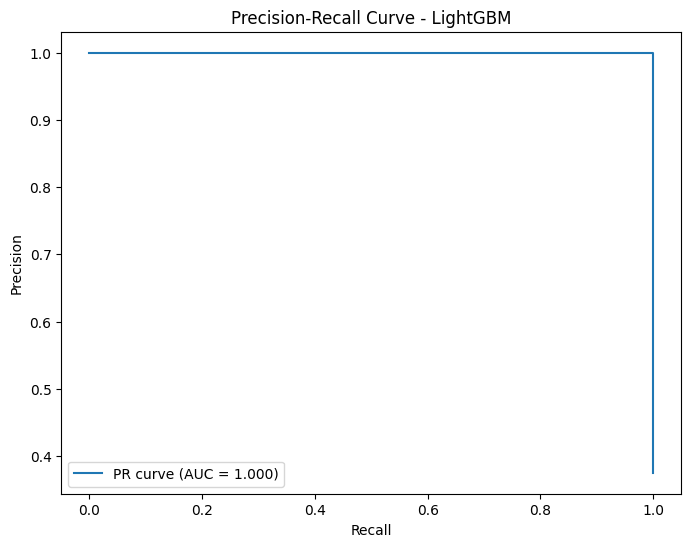

Generating Feature Importance Plot...


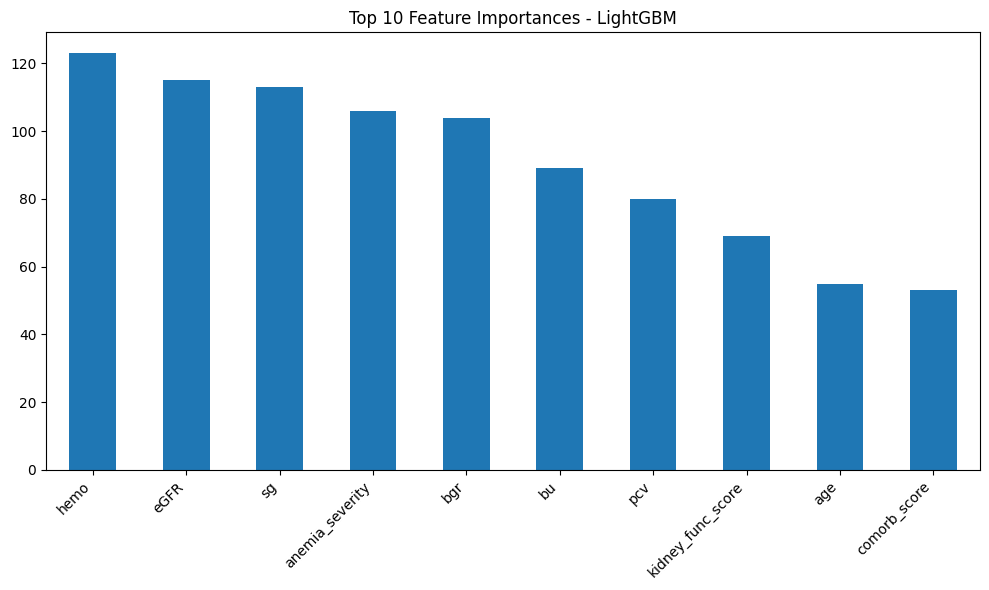

Generating Validation Curve Analysis...


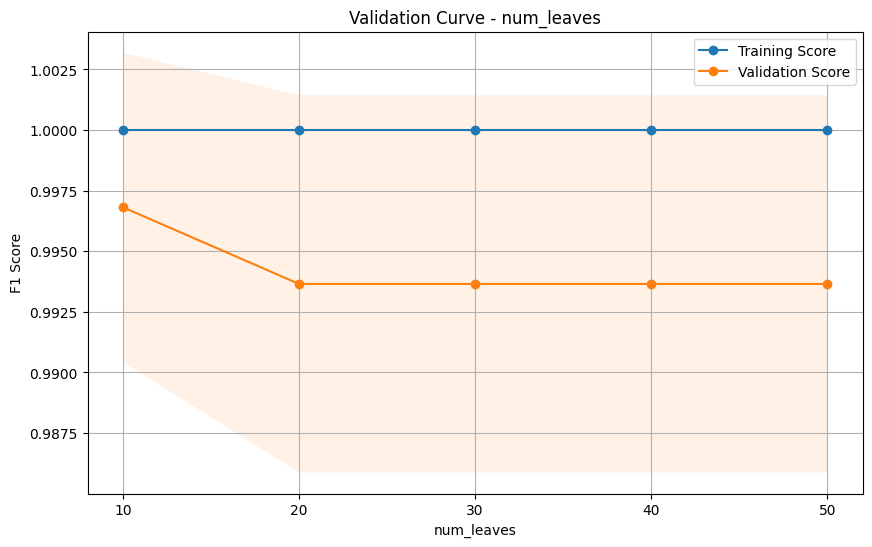

Completed analysis for LightGBM


ANALYZING: SVM (RBF)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


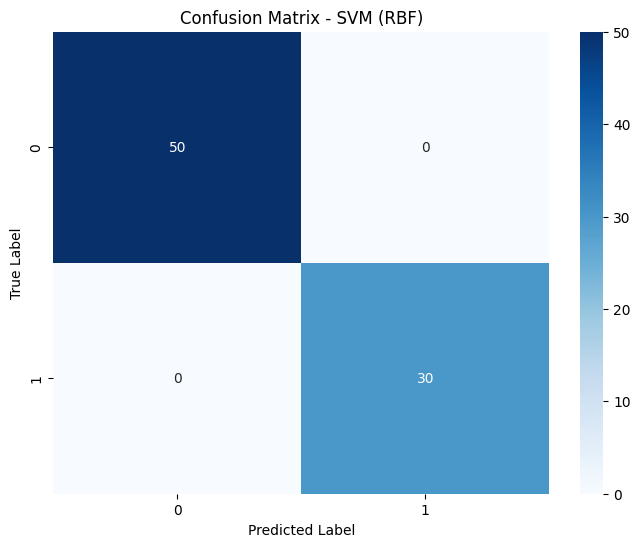

Generating ROC Curve...


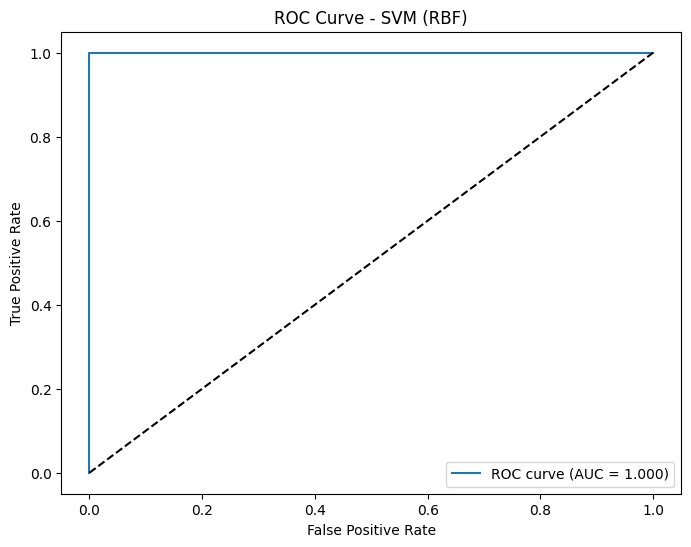

Generating Precision-Recall Curve...


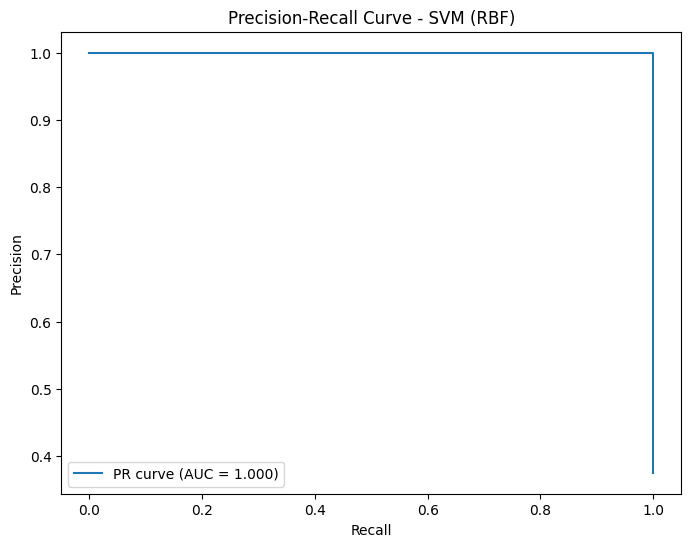

Generating Validation Curve Analysis...


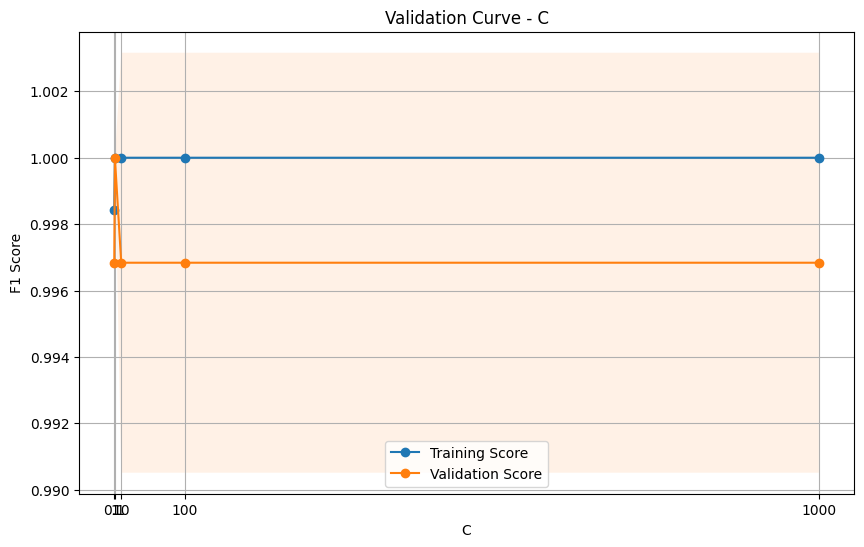

Completed analysis for SVM (RBF)


ANALYZING: SVM (Linear)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


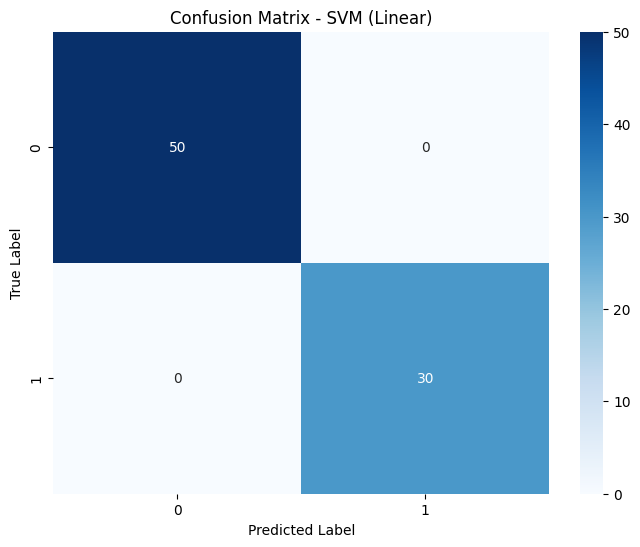

Generating ROC Curve...


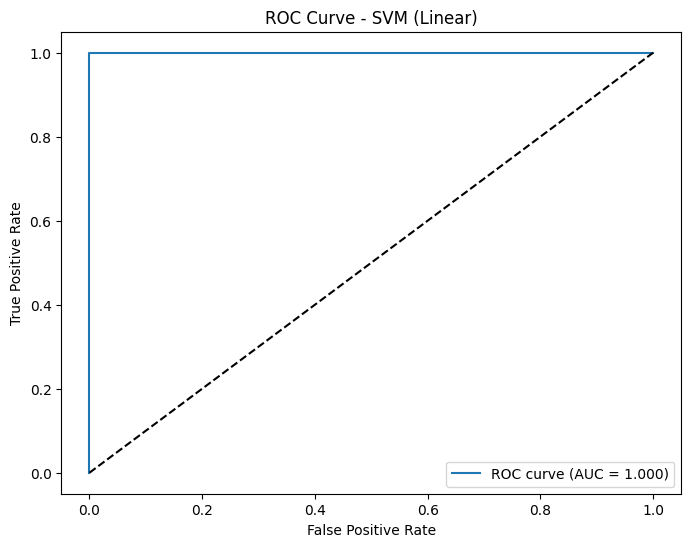

Generating Precision-Recall Curve...


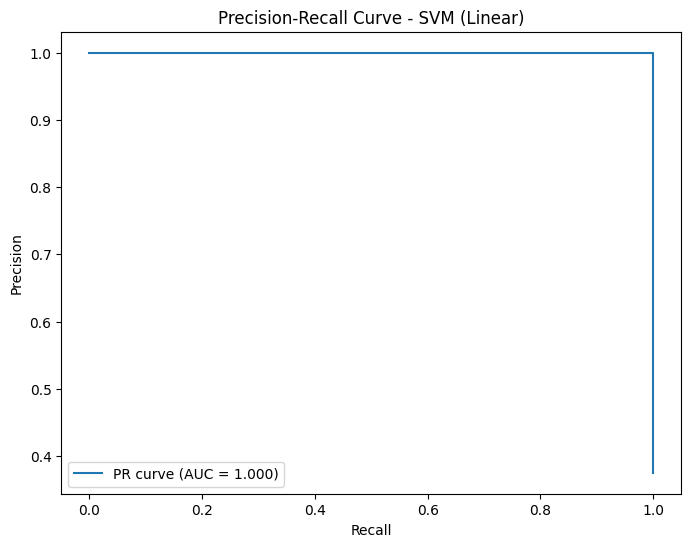

Generating Validation Curve Analysis...


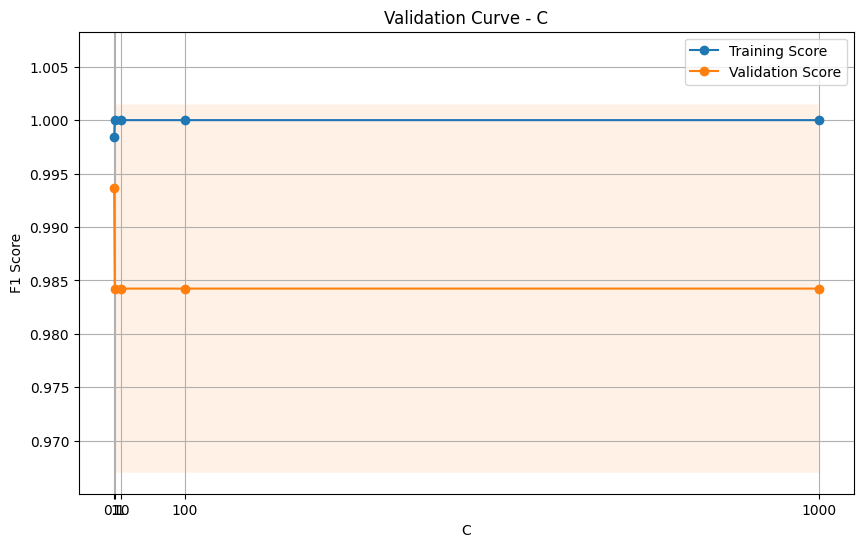

Completed analysis for SVM (Linear)


ANALYZING: SVM (Polynomial)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9877
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


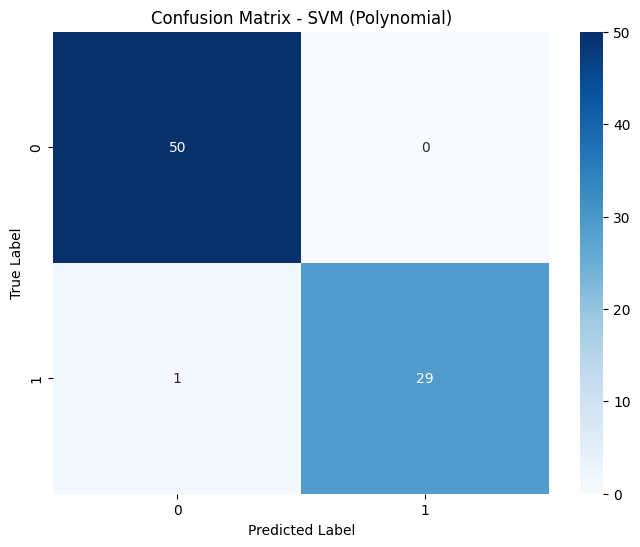

Generating ROC Curve...


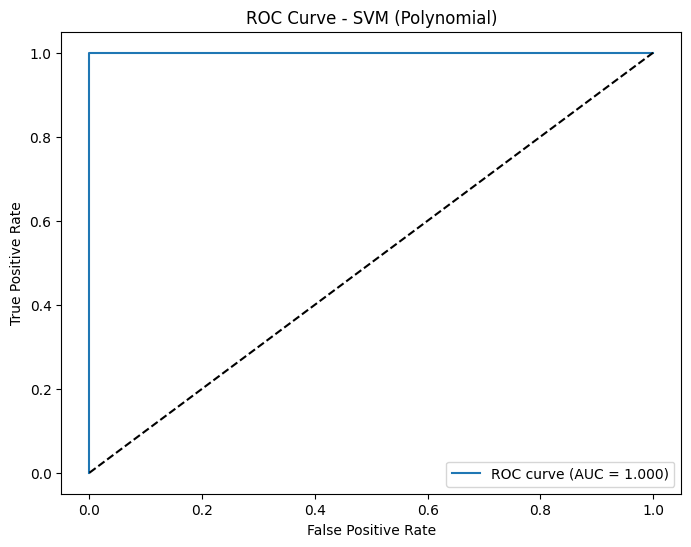

Generating Precision-Recall Curve...


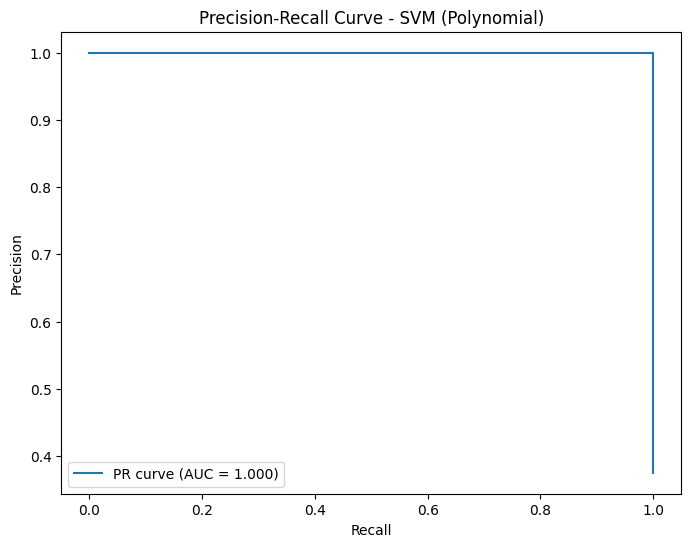

Generating Validation Curve Analysis...


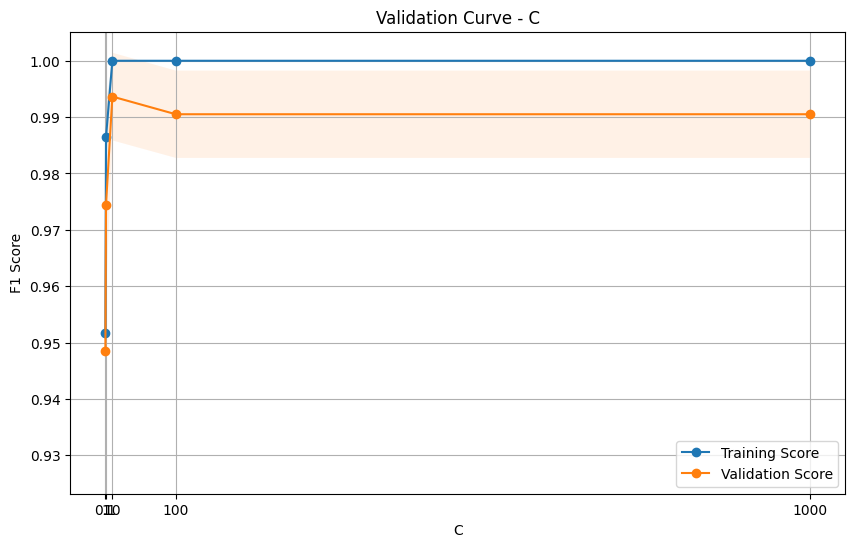

Completed analysis for SVM (Polynomial)


ANALYZING: K-Nearest Neighbors
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9766
   Recall: 0.9750
   F1 Score: 0.9751
   ROC AUC: 1.0000

 Generating Confusion Matrix...


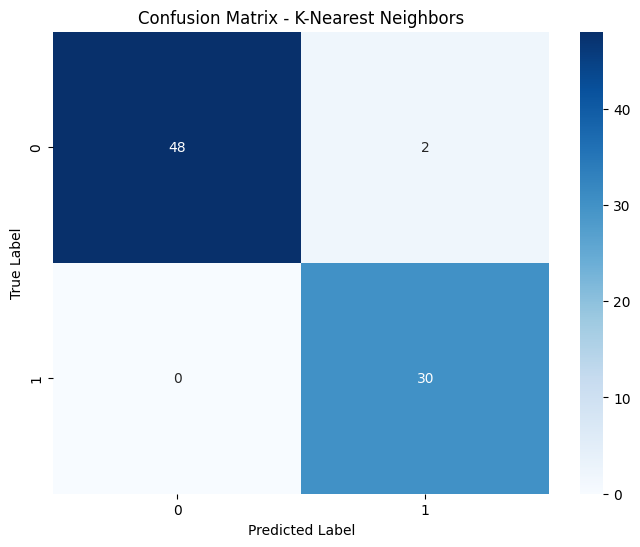

Generating ROC Curve...


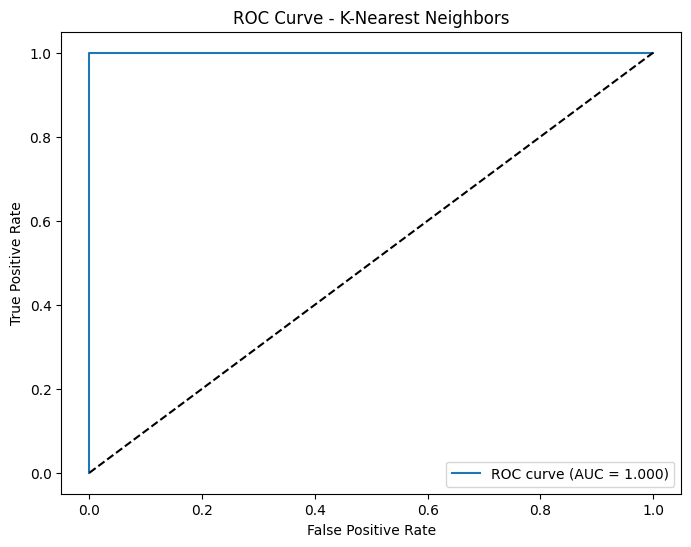

Generating Precision-Recall Curve...


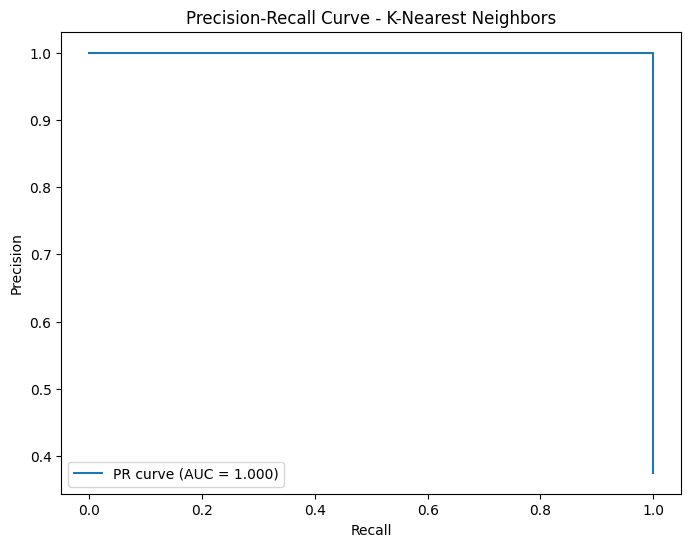

Generating Validation Curve Analysis...
Completed analysis for K-Nearest Neighbors


ANALYZING: Gaussian Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9125
   Precision: 0.9291
   Recall: 0.9125
   F1 Score: 0.9138
   ROC AUC: 0.9300

 Generating Confusion Matrix...


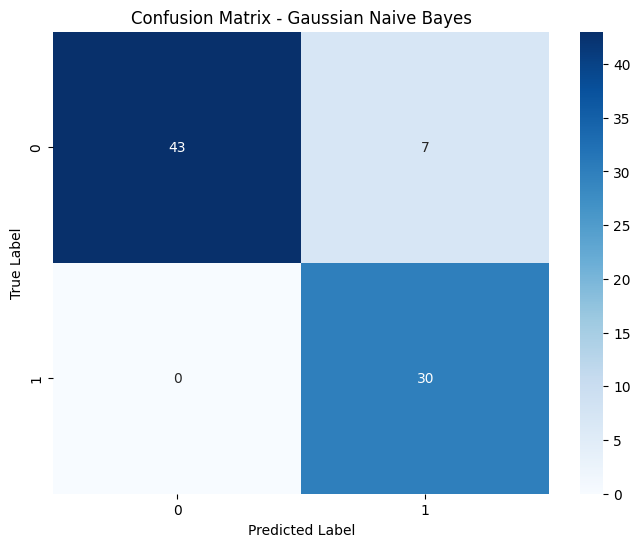

Generating ROC Curve...


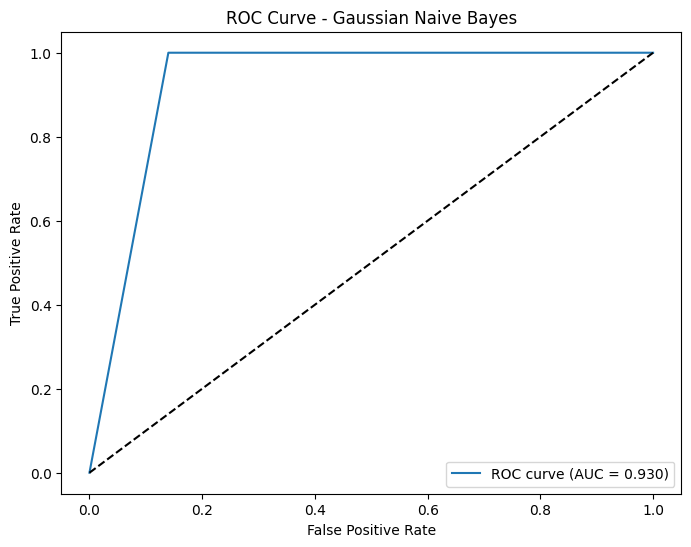

Generating Precision-Recall Curve...


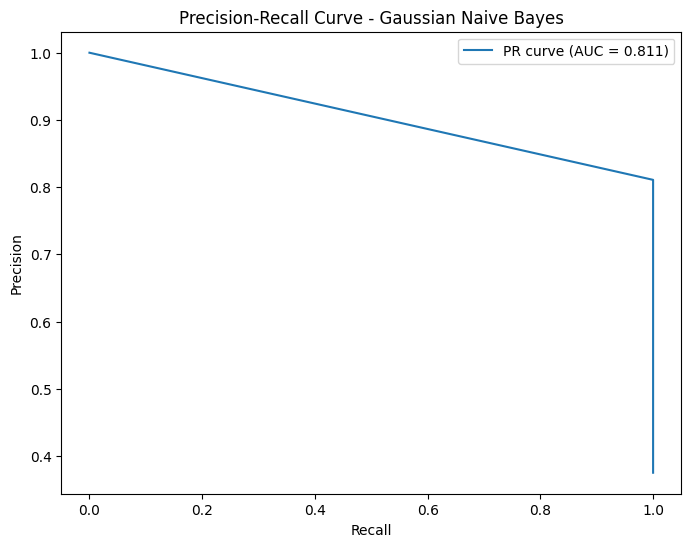

Generating Validation Curve Analysis...
Completed analysis for Gaussian Naive Bayes


ANALYZING: Bernoulli Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9625
   Precision: 0.9659
   Recall: 0.9625
   F1 Score: 0.9628
   ROC AUC: 0.9973

 Generating Confusion Matrix...


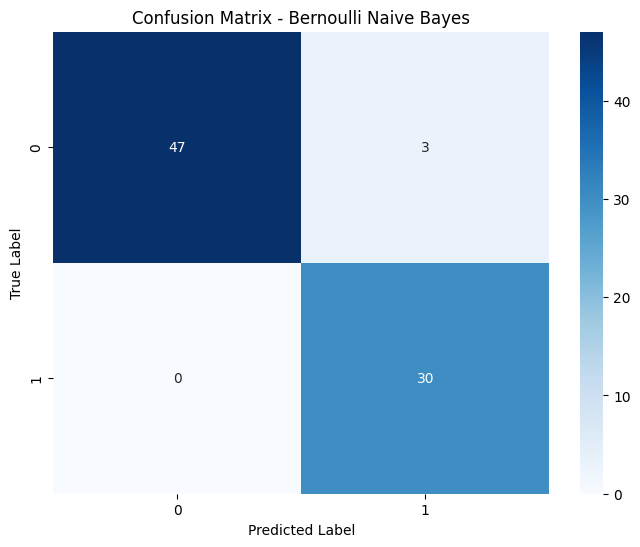

Generating ROC Curve...


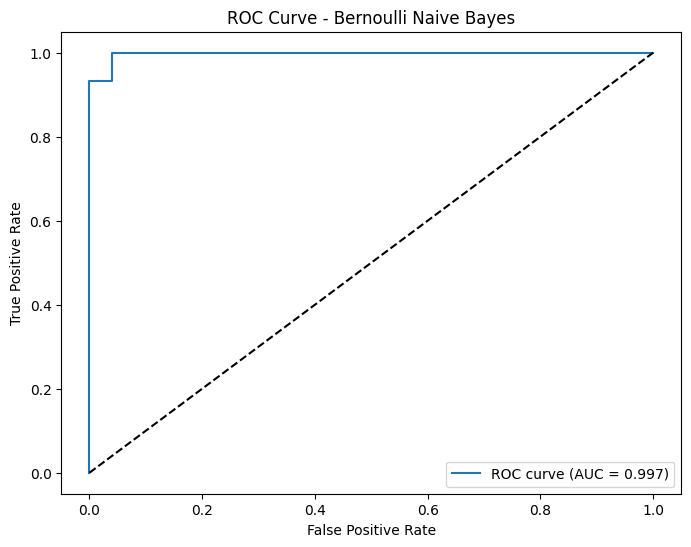

Generating Precision-Recall Curve...


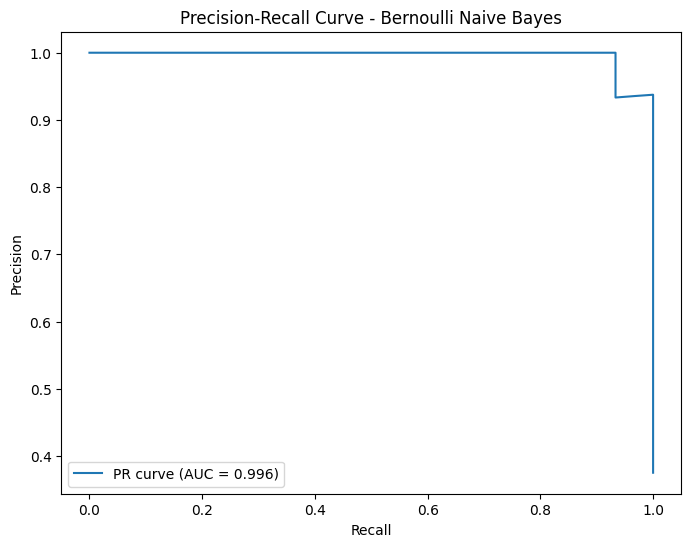

Generating Validation Curve Analysis...
Completed analysis for Bernoulli Naive Bayes


ANALYZING: Linear Discriminant Analysis
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


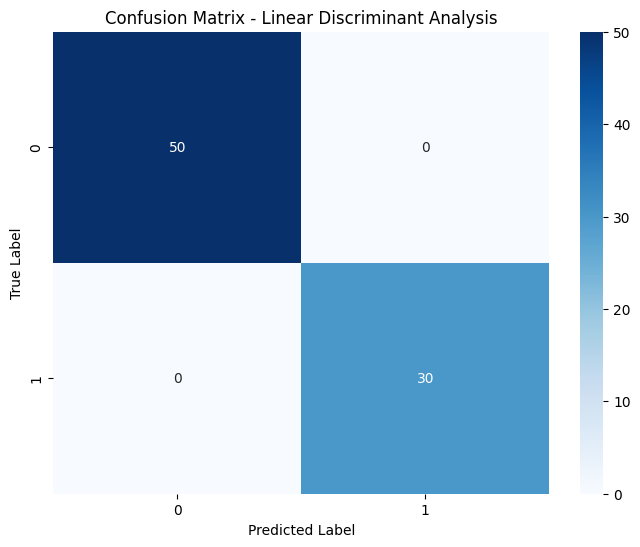

Generating ROC Curve...


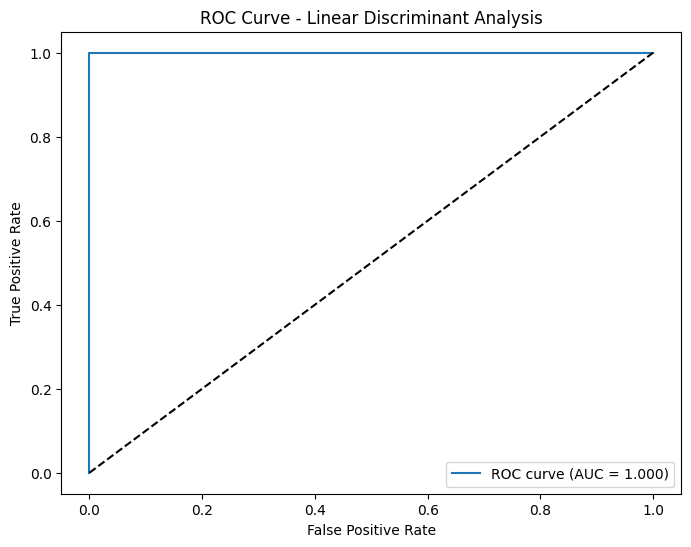

Generating Precision-Recall Curve...


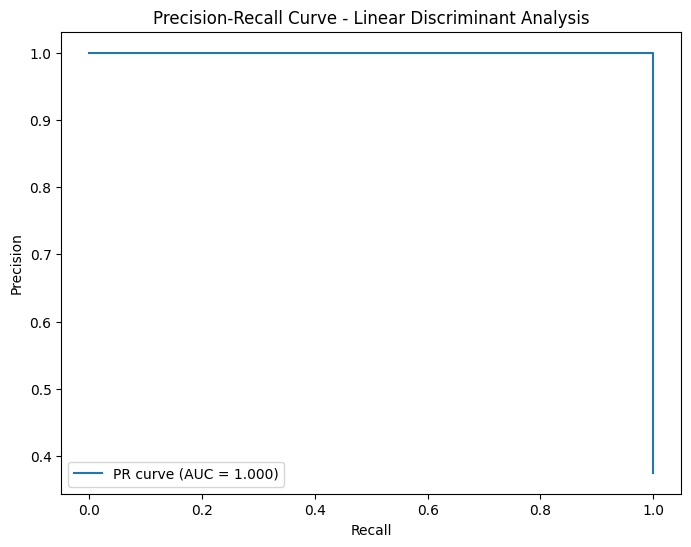

Generating Validation Curve Analysis...
Completed analysis for Linear Discriminant Analysis


ANALYZING: Multi-layer Perceptron
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


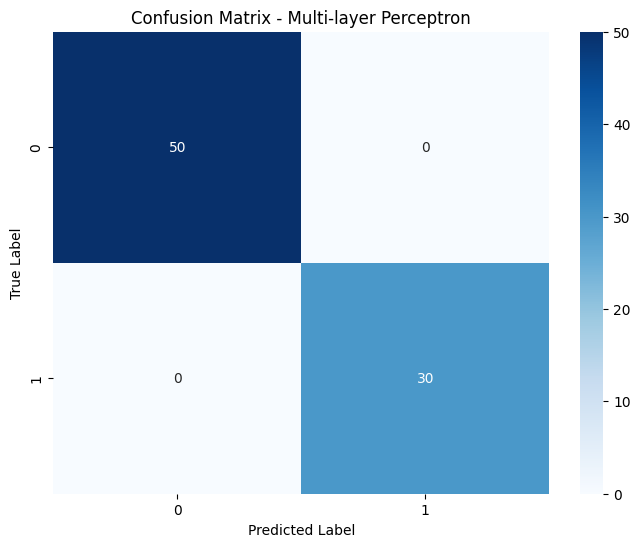

Generating ROC Curve...


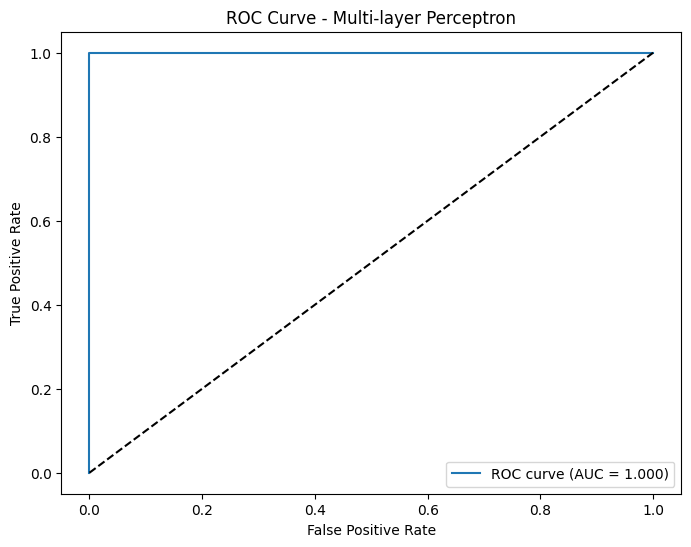

Generating Precision-Recall Curve...


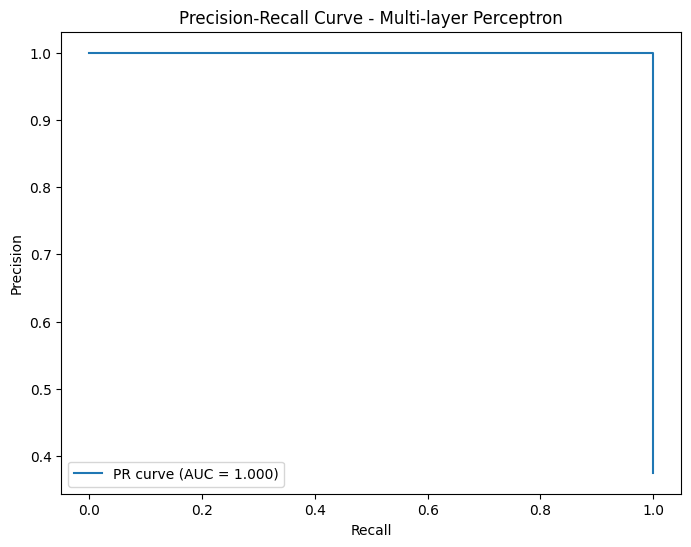

Generating Validation Curve Analysis...
Completed analysis for Multi-layer Perceptron


ANALYZING: Dummy Classifier (Stratified)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.5000
   Precision: 0.4858
   Recall: 0.5000
   F1 Score: 0.4918
   ROC AUC: 0.4533

 Generating Confusion Matrix...


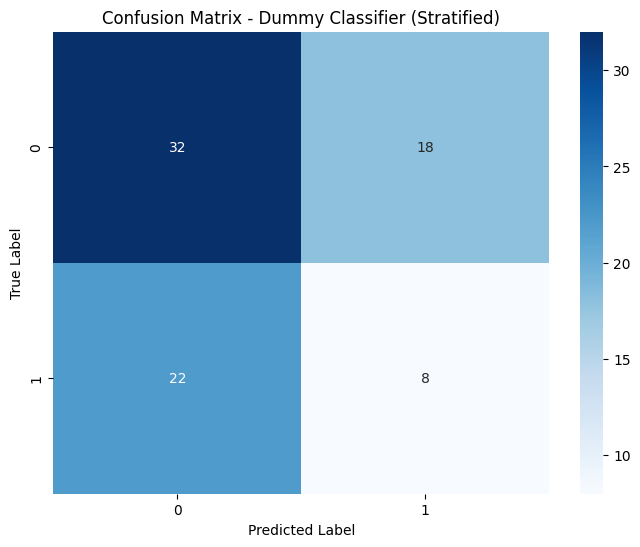

Generating ROC Curve...


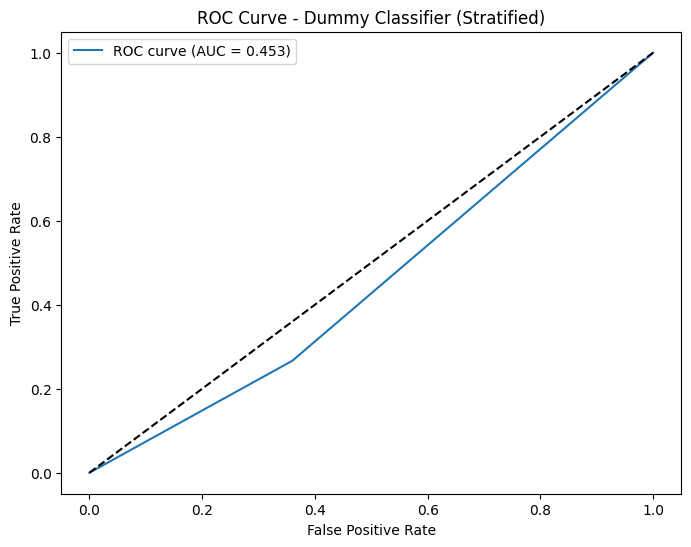

Generating Precision-Recall Curve...


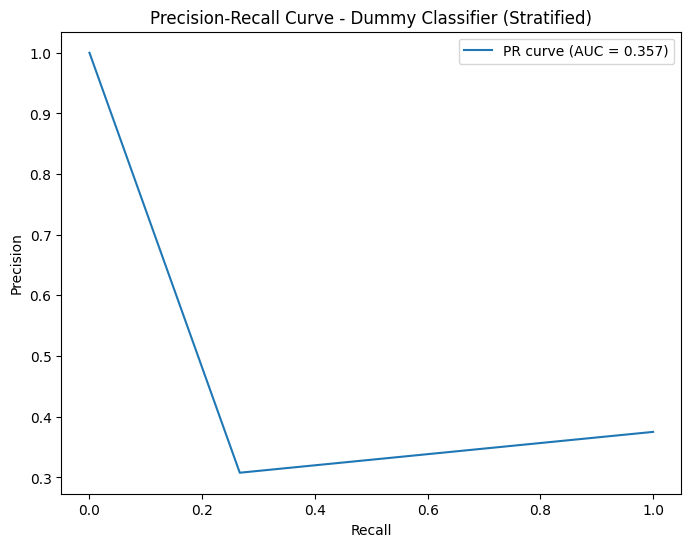

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Stratified)


ANALYZING: Dummy Classifier (Most Frequent)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.6250
   Precision: 0.3906
   Recall: 0.6250
   F1 Score: 0.4808
   ROC AUC: 0.5000

 Generating Confusion Matrix...


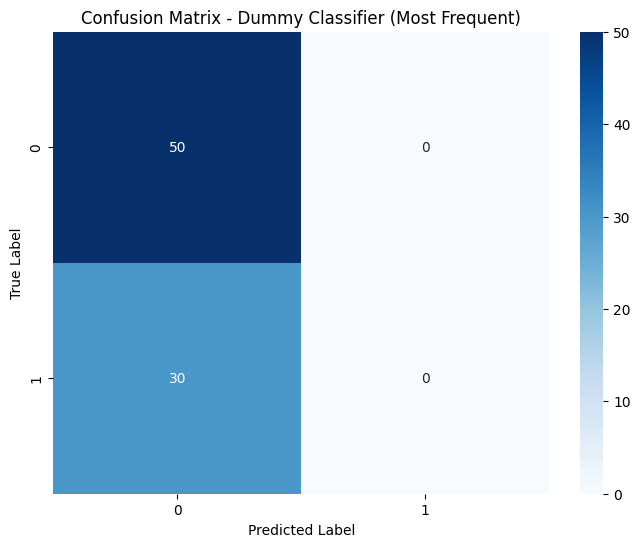

Generating ROC Curve...


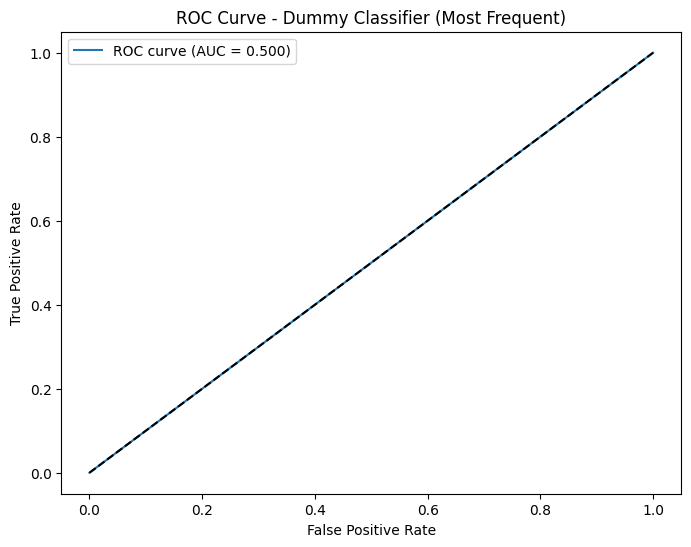

Generating Precision-Recall Curve...


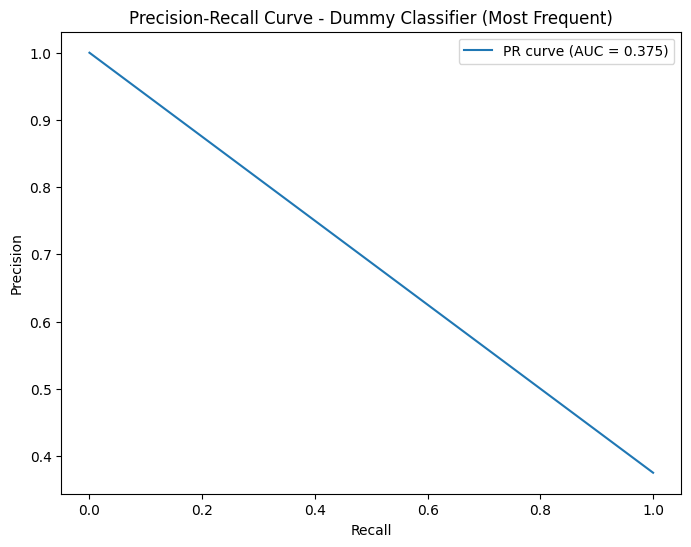

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Most Frequent)


OVERFITTING RISK SUMMARY

Critical CRITICAL OVERFITTING RISK (16 models):
------------------------------------------------------------
   • Logistic Regression (L1)
     Score: 1.000
     - High confidence predictions: 92.4% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • Logistic Regression (L2)
     Score: 1.000
     - High confidence predictions: 93.4% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • Logistic Regression (ElasticNet)
     Score: 1.000
     - High confidence predictions: 93.0% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • Ridge Classifier
     Score: 0.800
     - Perfect test score detected (99.9%+) - possible data leakage

   • SGD Classifier
   

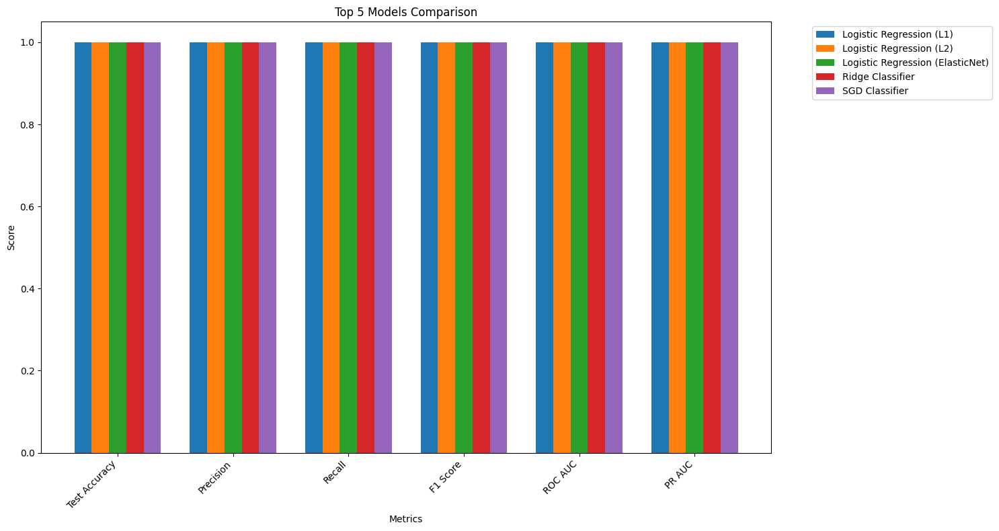

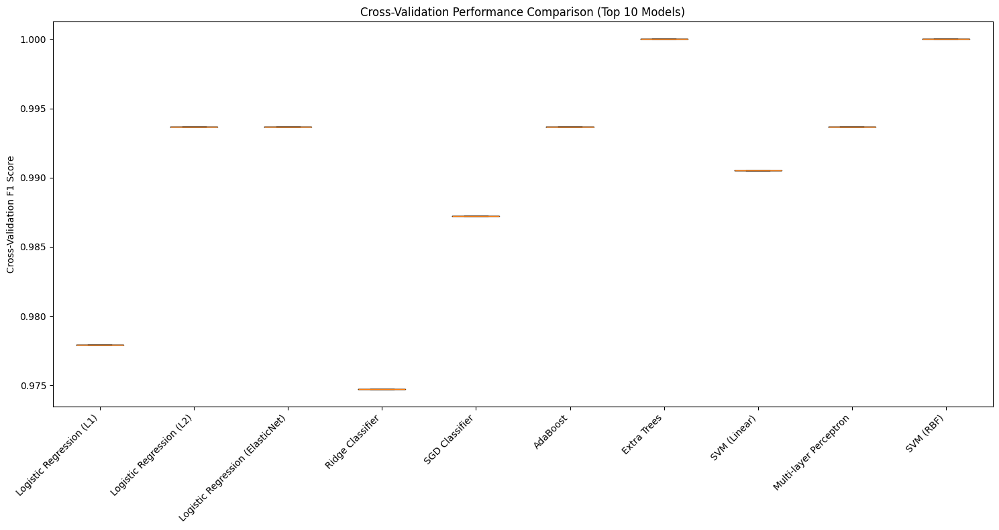


FINAL HEALTHCARE RECOMMENDATIONS
RECOMMENDED MODEL: Extra Trees
   Healthcare Score: 2.1000
   Recall (Sensitivity): 1.0000
   Precision: 1.0000
   F1 Score: 1.0000
   Overfitting Risk: CRITICAL

TOP 3 SAFE MODELS FOR HEALTHCARE:
   1. Random Forest (Score: 1.2122, Risk: MEDIUM)
   2. Decision Tree (Score: 1.2074, Risk: MEDIUM)
   3. K-Nearest Neighbors (Score: 1.1890, Risk: MEDIUM)

MODELS TO AVOID IN HEALTHCARE:
  Extra Trees
  SVM (RBF)
  Logistic Regression (ElasticNet)
  SVM (Linear)
  Multi-layer Perceptron

 GENERATING ADDITIONAL ANALYSIS PLOTS...


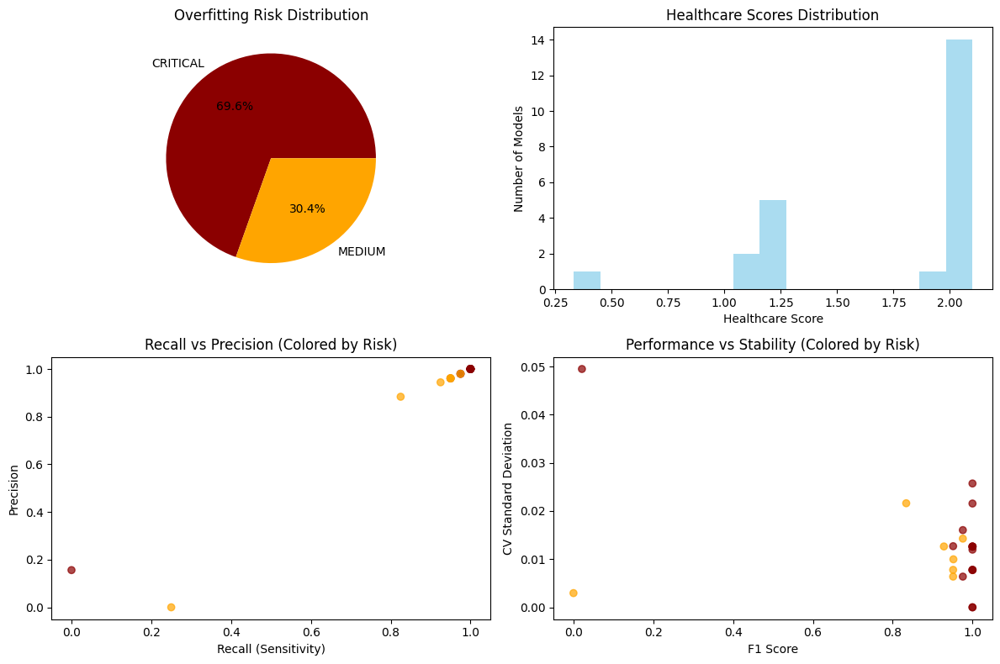

In [80]:
v0_results = run_healthcare_ml_pipeline(X_train, X_test, y_train, y_test)

In [81]:
print(v0_results)

{'results': {'Logistic Regression (L1)': {'Model': 'Logistic Regression (L1)', 'Train F1': 1.0, 'CV Mean F1': np.float64(0.9779336355254722), 'CV Std F1': np.float64(0.0125990125185135), 'Overfitting Gap': 0.0, 'Overfitting Score': 1.0, 'Overfitting Risk': 'CRITICAL', 'Test Accuracy': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'F1 Score': 1.0, 'ROC AUC': 1.0, 'PR AUC': 0.9999999999999999}, 'Logistic Regression (L2)': {'Model': 'Logistic Regression (L2)', 'Train F1': 1.0, 'CV Mean F1': np.float64(0.9936942355889723), 'CV Std F1': np.float64(0.01261152882205514), 'Overfitting Gap': 0.0, 'Overfitting Score': 1.0, 'Overfitting Risk': 'CRITICAL', 'Test Accuracy': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'F1 Score': 1.0, 'ROC AUC': 1.0, 'PR AUC': 0.9999999999999999}, 'Logistic Regression (ElasticNet)': {'Model': 'Logistic Regression (ElasticNet)', 'Train F1': 1.0, 'CV Mean F1': np.float64(0.9936488933053678), 'CV Std F1': np.float64(0.007778589514941453), 'Overfitting Gap': 0.0, 'Overfitting Score':

### Version 1


HEALTHCARE ML ANALYSIS PIPELINE
Kidney Disease Detection - Enhanced Overfitting Detection
 Dataset Info:
   Training samples: 316
   Test samples: 80
   Features: 12
   Classes: 2
   Class distribution: {np.int64(0): np.int64(196), np.int64(1): np.int64(120)}

Testing 26 different classification algorithms...

COMPREHENSIVE ANALYSIS: Logistic Regression (L1)
PERFORMANCE METRICS:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000
   PR AUC: 1.0000

 ENHANCED OVERFITTING ANALYSIS:
   Train F1 Score: 0.9968
   Test F1 Score: 1.0000
   F1 Performance Gap: -0.0032
   Accuracy Gap: -0.0032
   Overfitting Score: 1.000
   Overfitting Risk: CRITICAL
   Overfitting Indicators:
     • High confidence predictions: 89.2% of training predictions are >95% or <5% confident
     • Perfect test score detected (99.9%+) - possible data leakage

STRATIFIED K-FOLD CROSS VALIDATION:
   CV Scores: ['0.9844', '1.0000', '0.9842', '0.9842', '0.9842']
   CV Mea

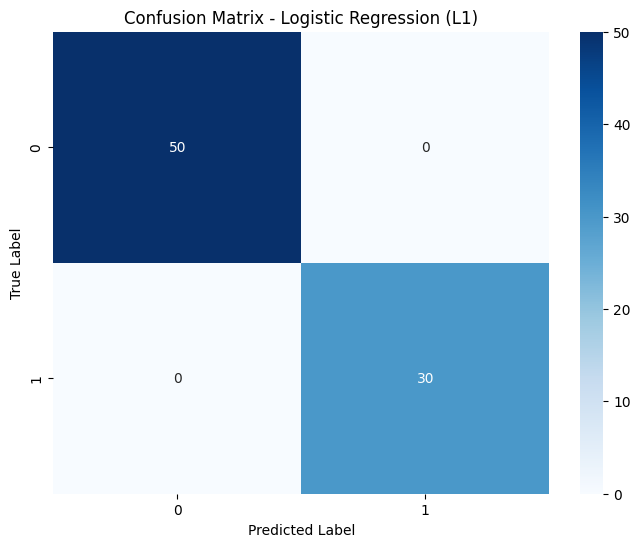

Generating ROC Curve...


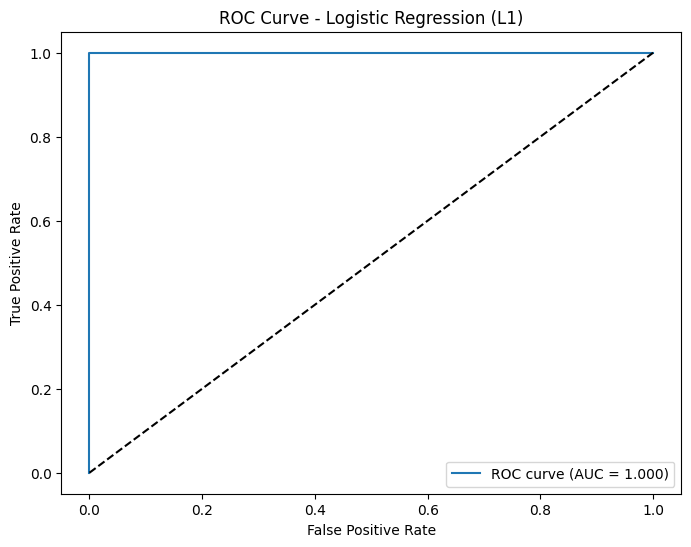

Generating Precision-Recall Curve...


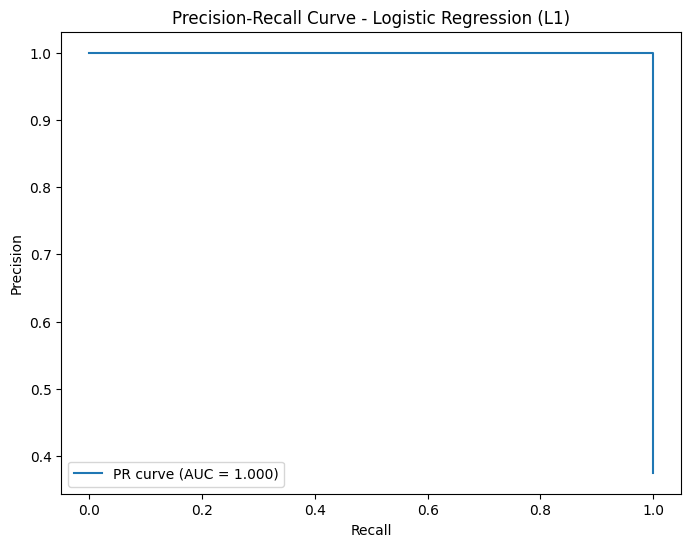

Generating Validation Curve Analysis...


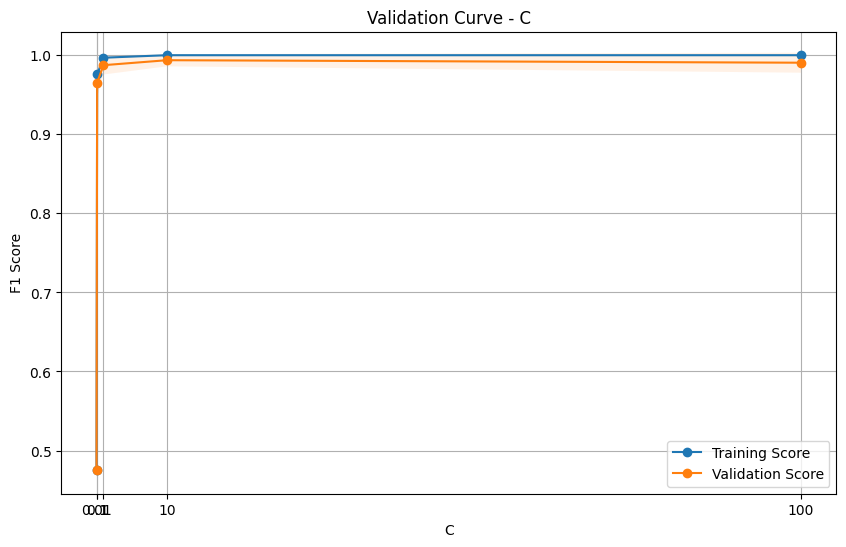

Completed analysis for Logistic Regression (L1)


ANALYZING: Logistic Regression (L2)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


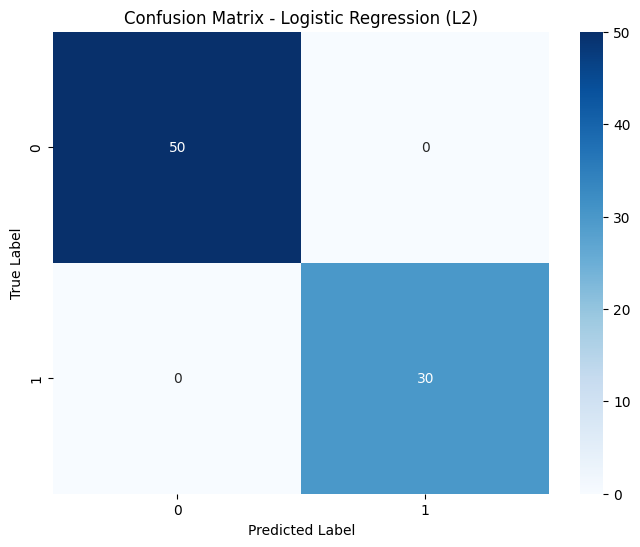

Generating ROC Curve...


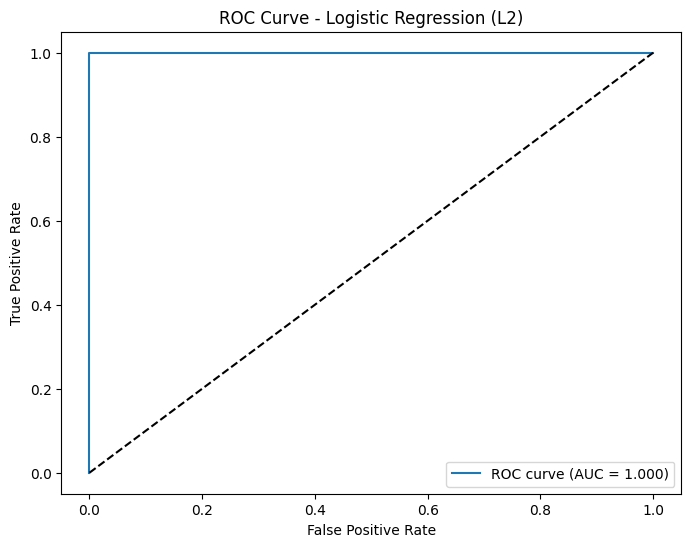

Generating Precision-Recall Curve...


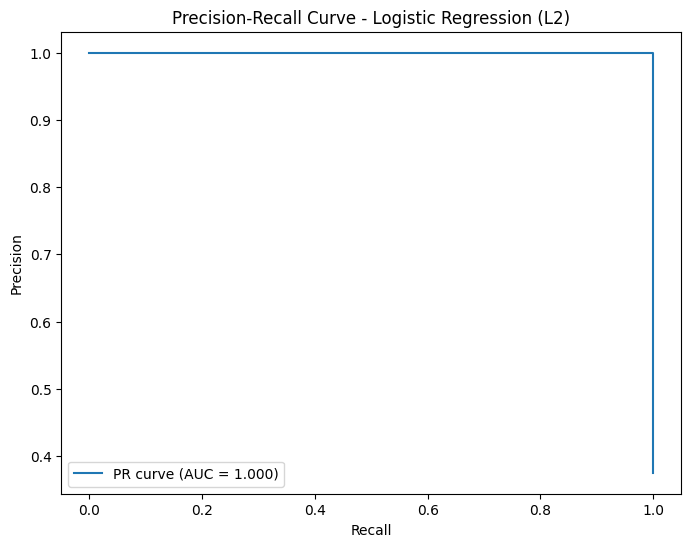

Generating Validation Curve Analysis...


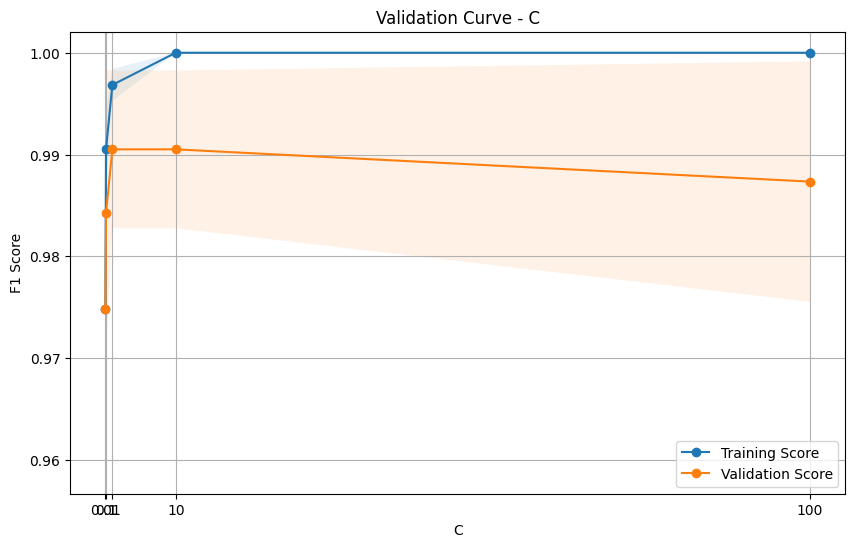

Completed analysis for Logistic Regression (L2)


ANALYZING: Logistic Regression (ElasticNet)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


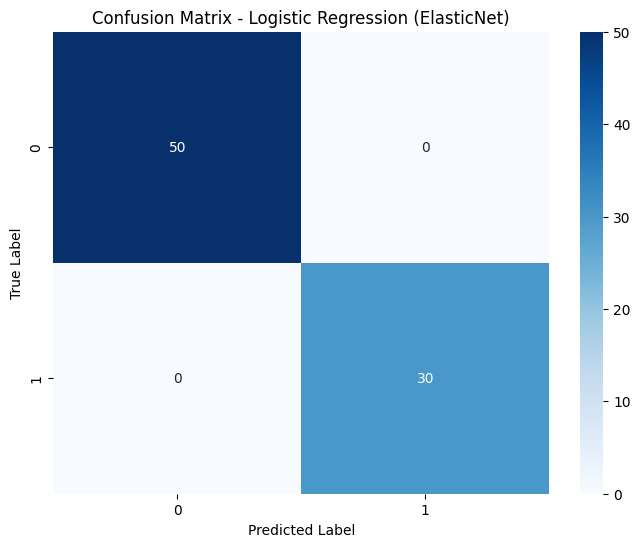

Generating ROC Curve...


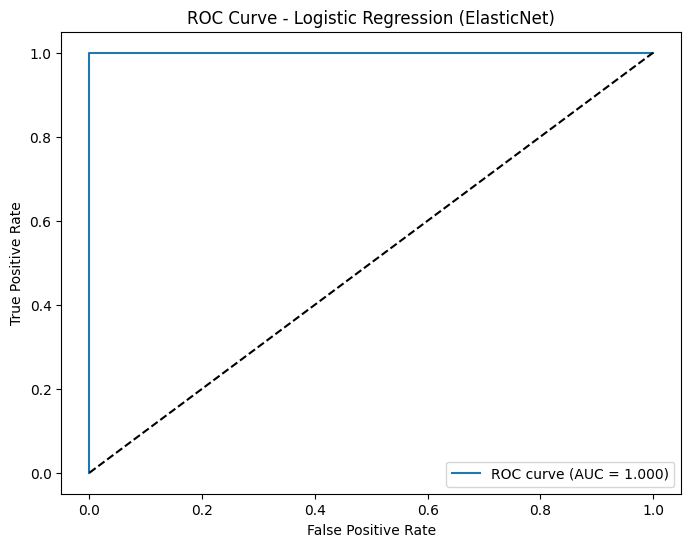

Generating Precision-Recall Curve...


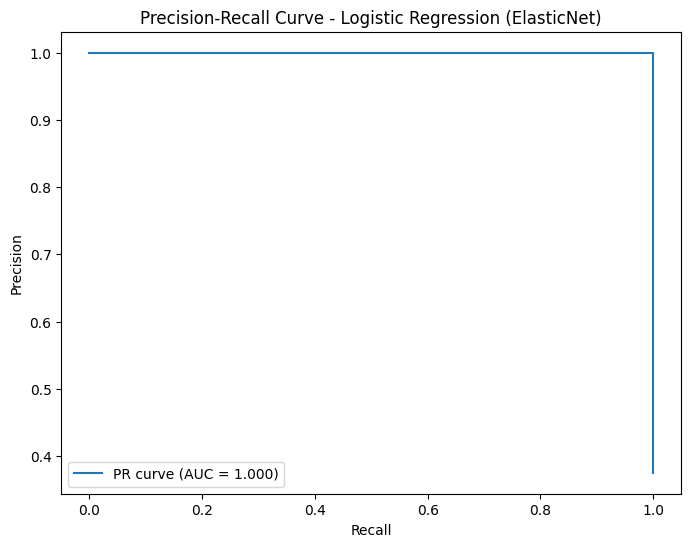

Generating Validation Curve Analysis...


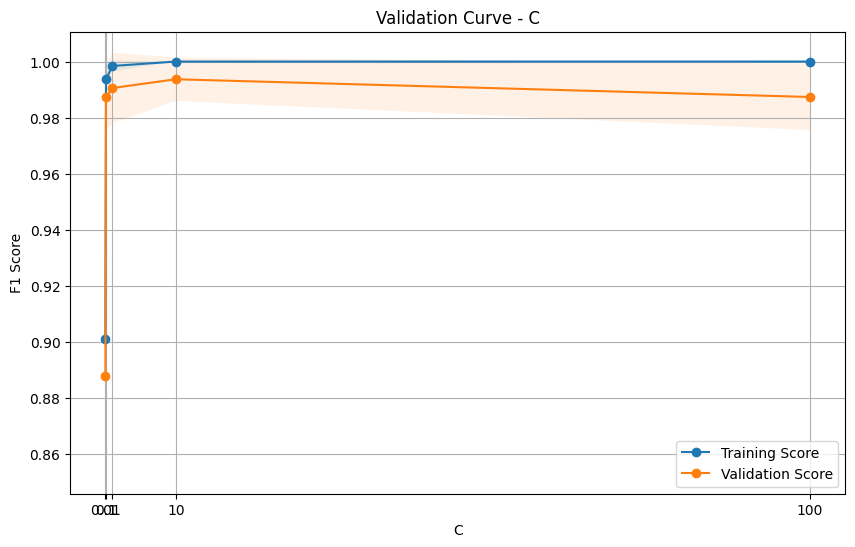

Completed analysis for Logistic Regression (ElasticNet)


ANALYZING: Ridge Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


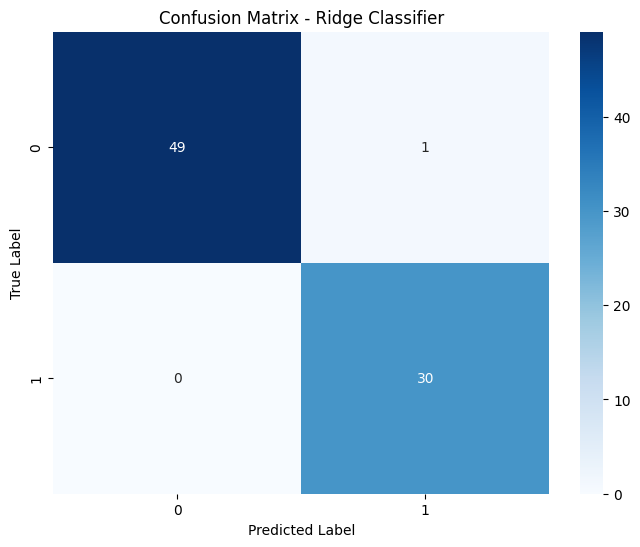

Generating ROC Curve...


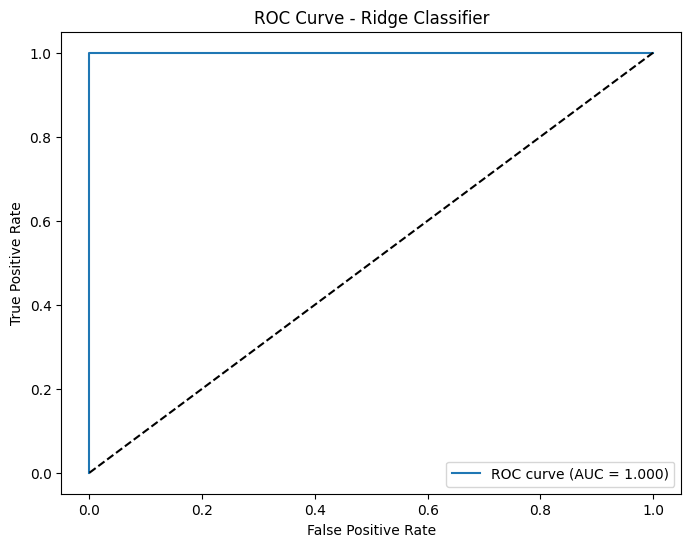

Generating Precision-Recall Curve...


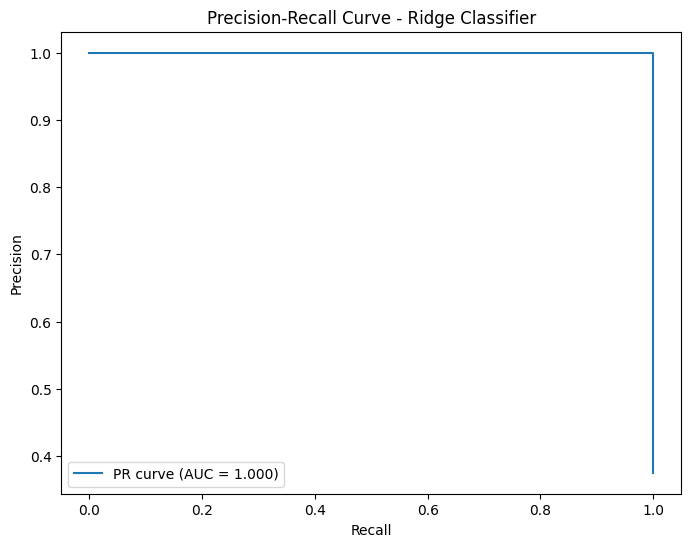

Generating Feature Coefficients Plot...


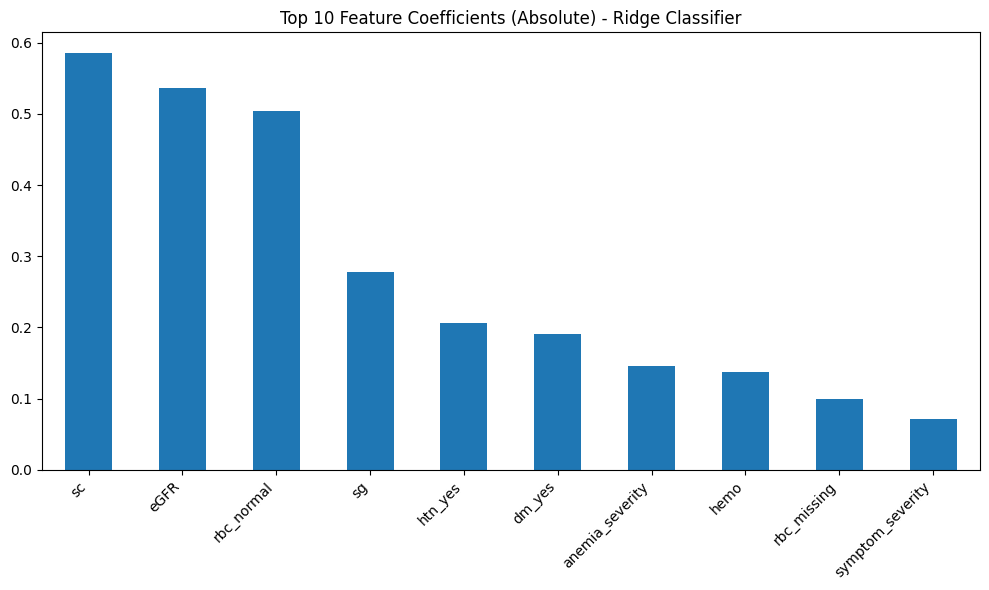

Generating Validation Curve Analysis...
Completed analysis for Ridge Classifier


ANALYZING: SGD Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


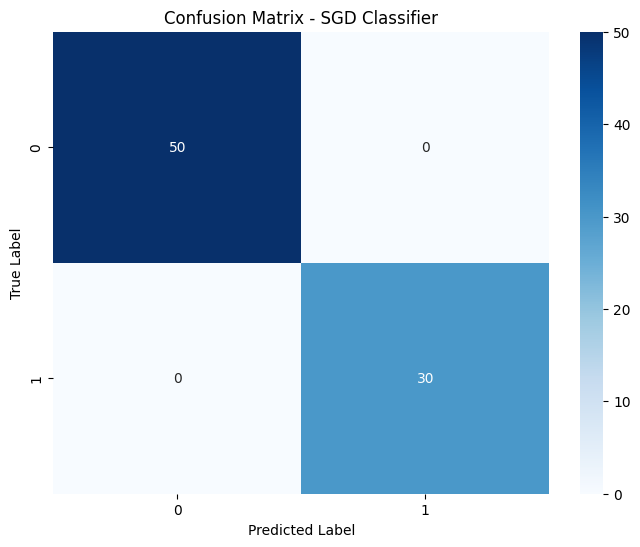

Generating ROC Curve...


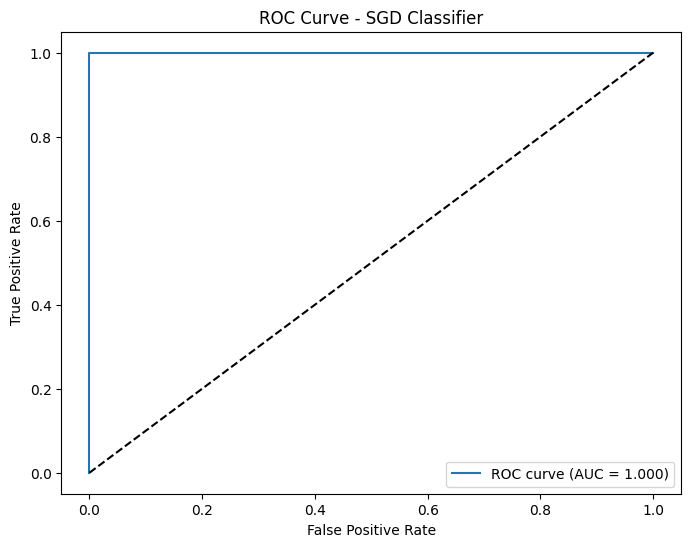

Generating Precision-Recall Curve...


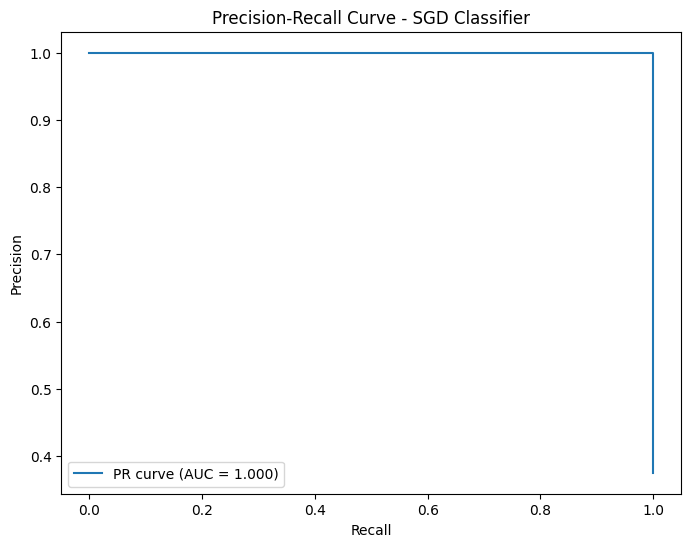

Generating Validation Curve Analysis...
Completed analysis for SGD Classifier


ANALYZING: Decision Tree
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9667

 Generating Confusion Matrix...


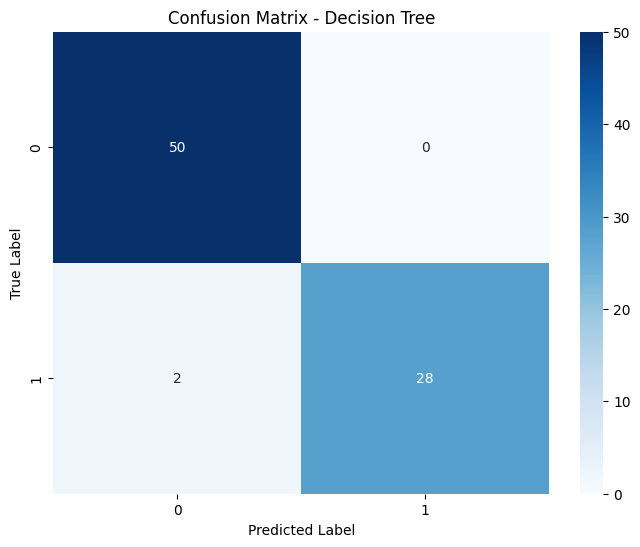

Generating ROC Curve...


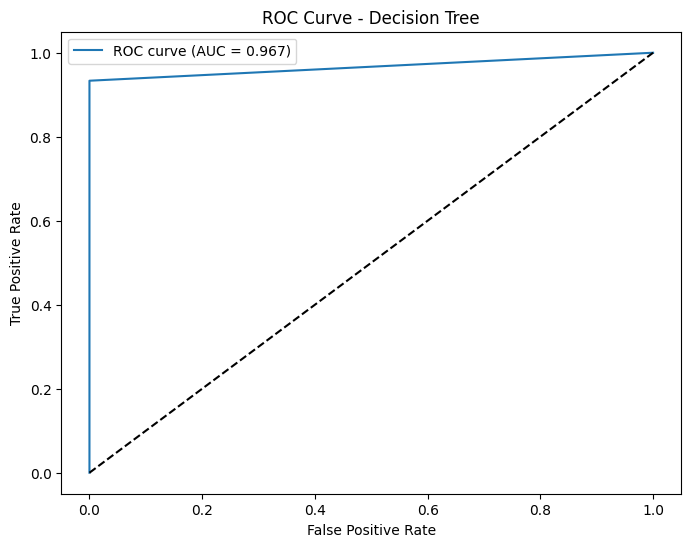

Generating Precision-Recall Curve...


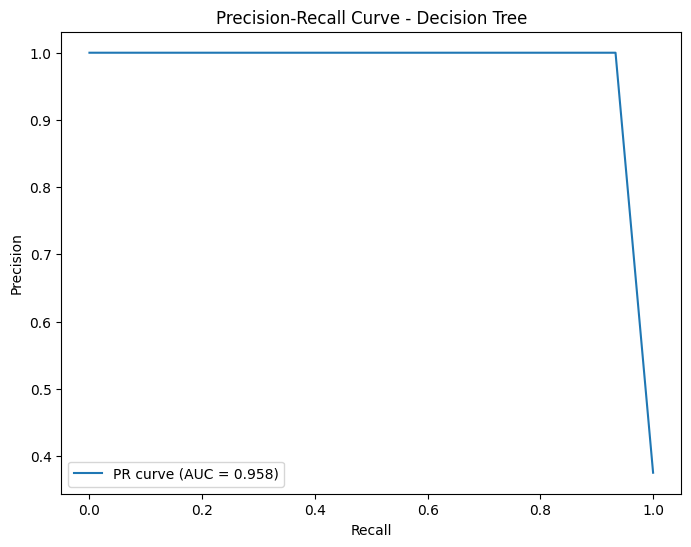

Generating Feature Importance Plot...


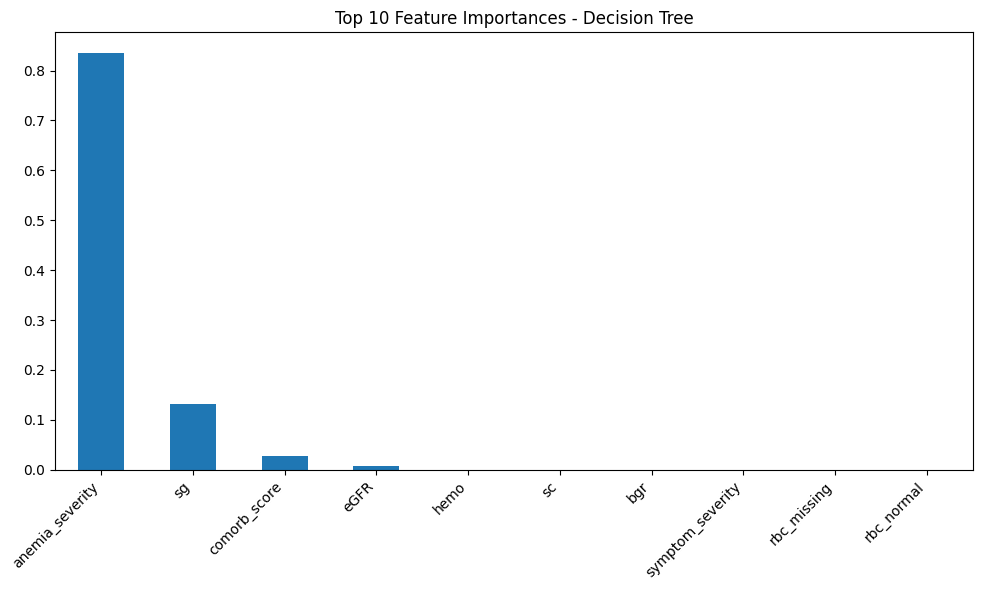

Generating Validation Curve Analysis...
Completed analysis for Decision Tree


ANALYZING: Random Forest
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9947

 Generating Confusion Matrix...


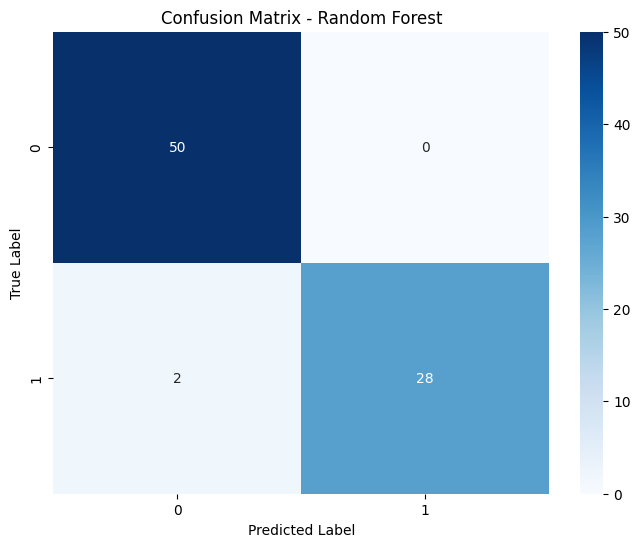

Generating ROC Curve...


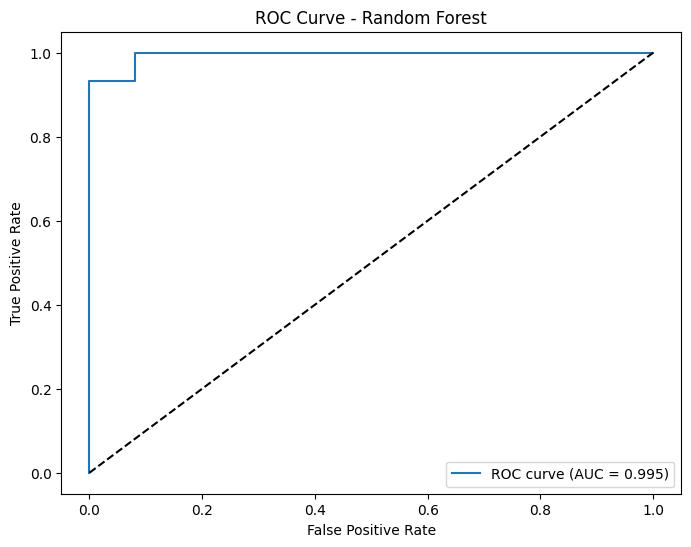

Generating Precision-Recall Curve...


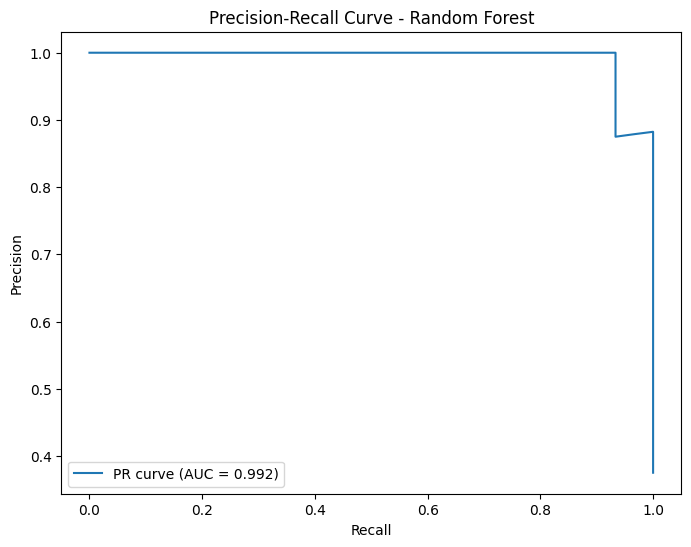

Generating Feature Importance Plot...


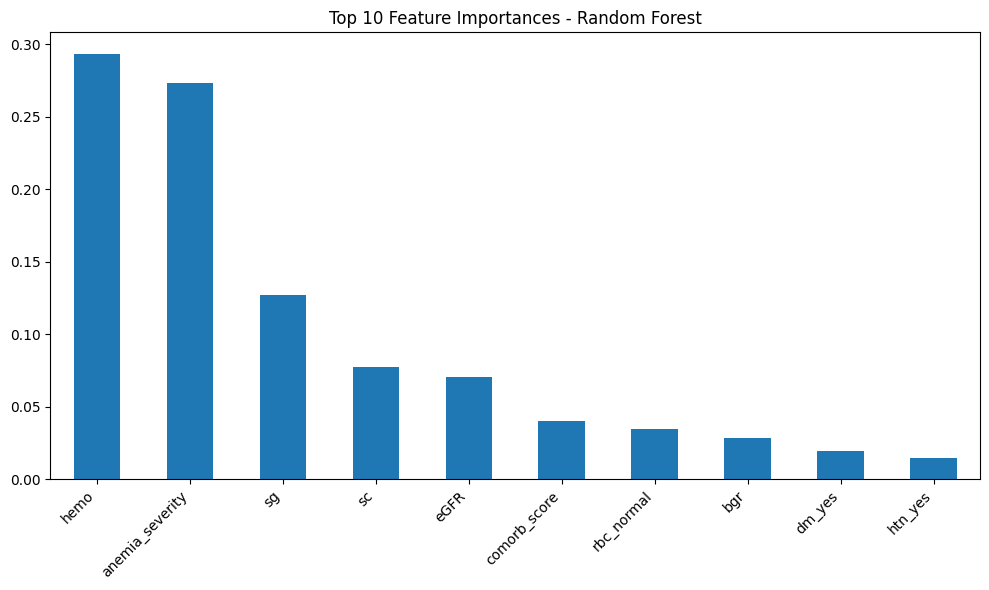

Generating Validation Curve Analysis...


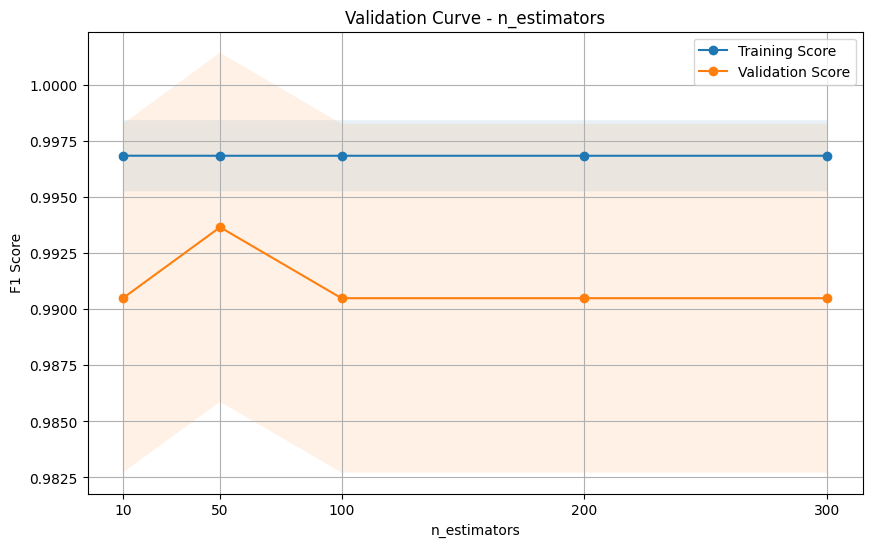

Completed analysis for Random Forest


ANALYZING: Extra Trees
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


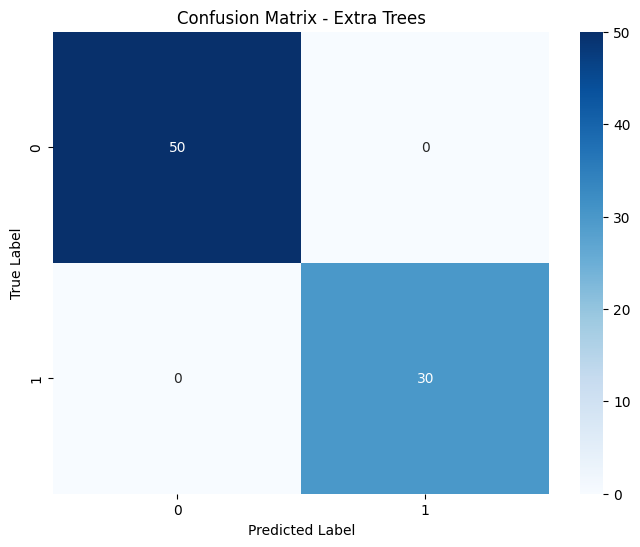

Generating ROC Curve...


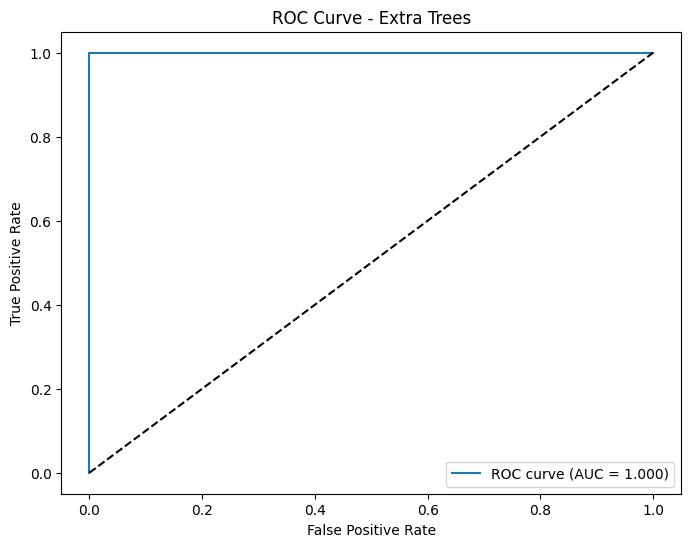

Generating Precision-Recall Curve...


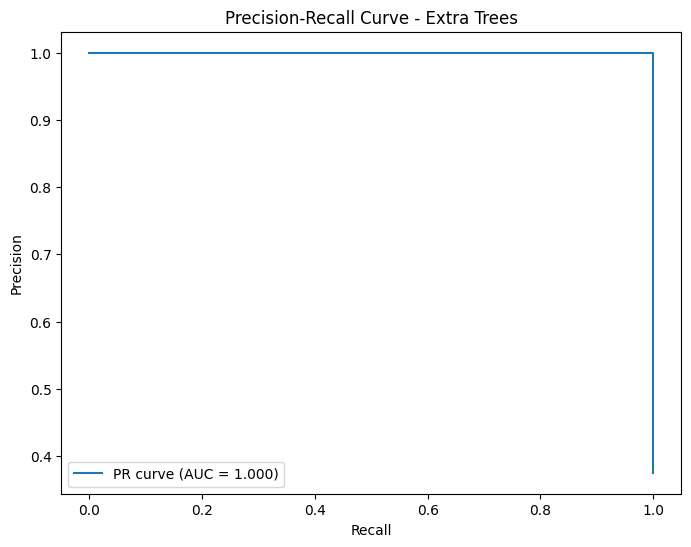

Generating Feature Importance Plot...


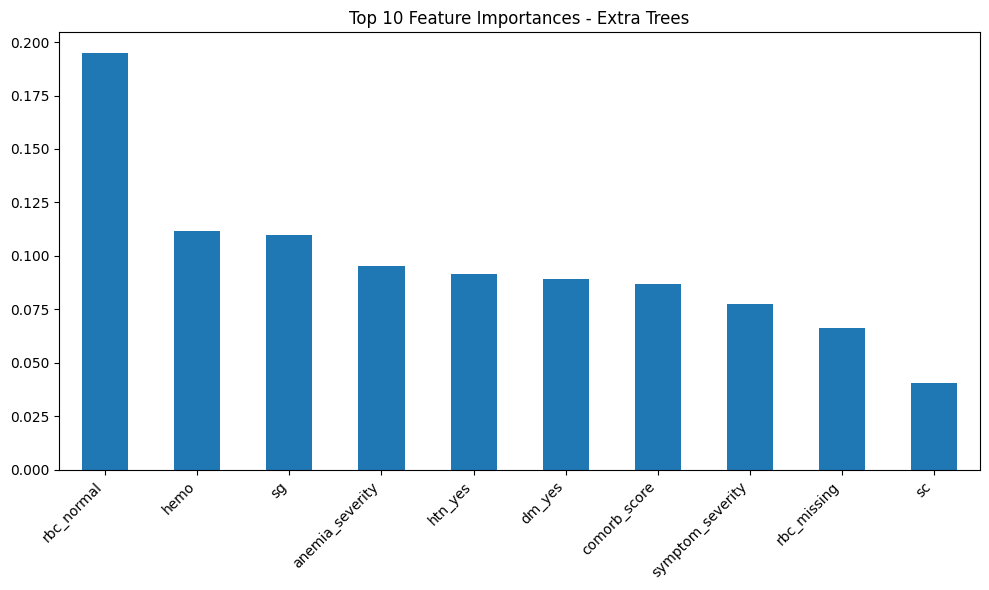

Generating Validation Curve Analysis...
Completed analysis for Extra Trees


ANALYZING: Gradient Boosting
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9993

 Generating Confusion Matrix...


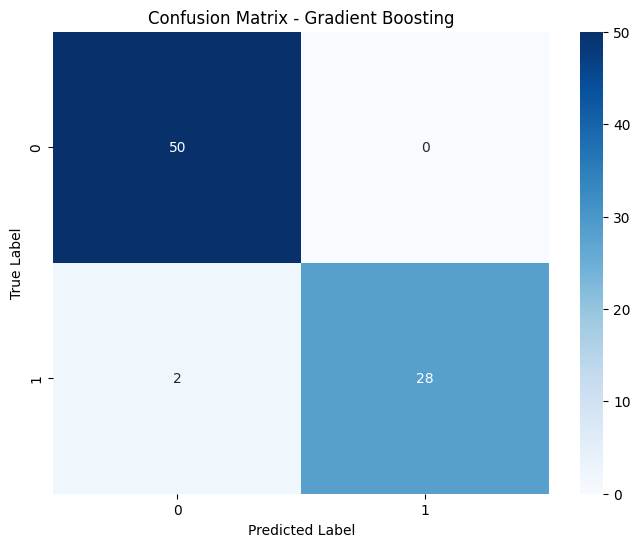

Generating ROC Curve...


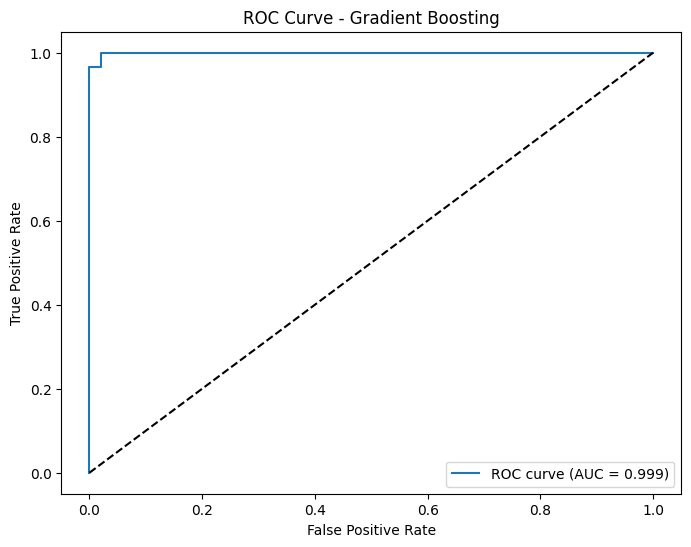

Generating Precision-Recall Curve...


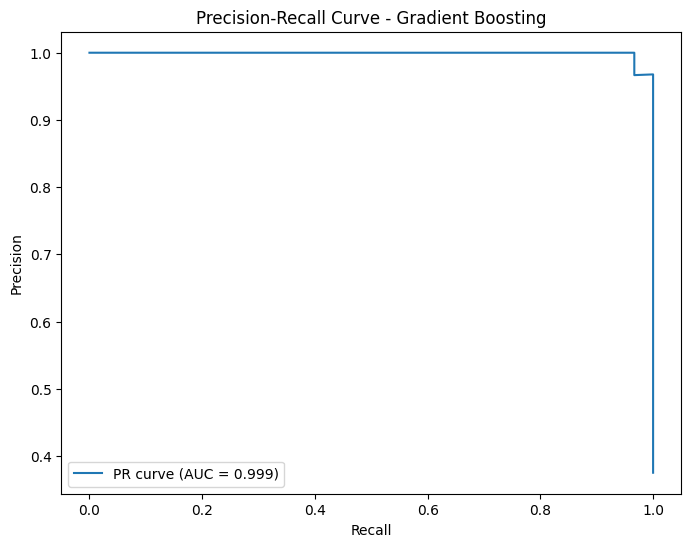

Generating Feature Importance Plot...


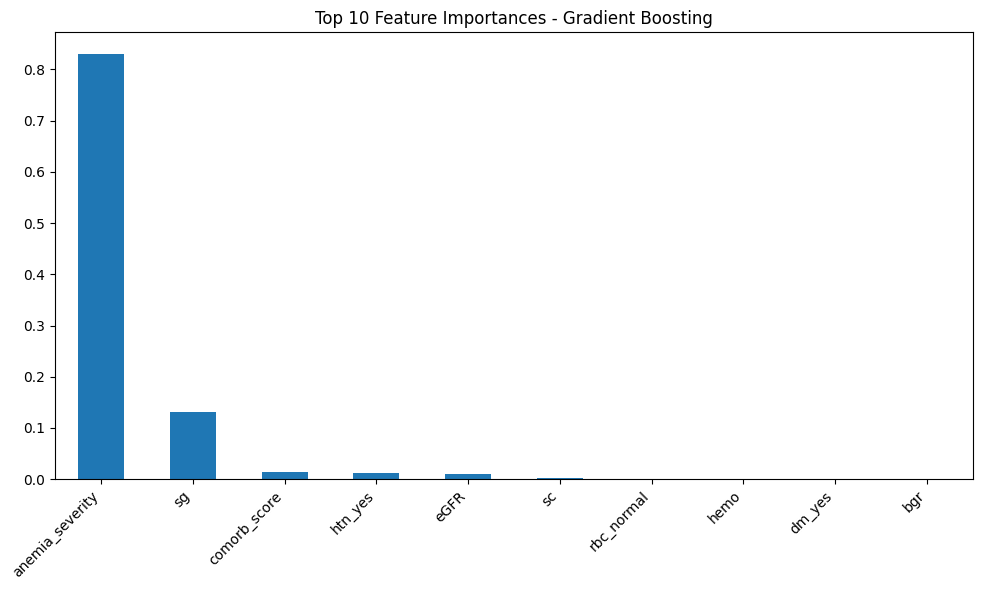

Generating Validation Curve Analysis...
Completed analysis for Gradient Boosting


ANALYZING: AdaBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


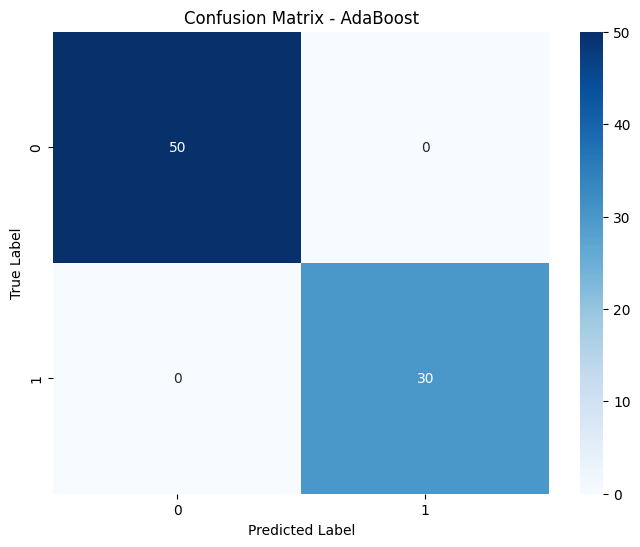

Generating ROC Curve...


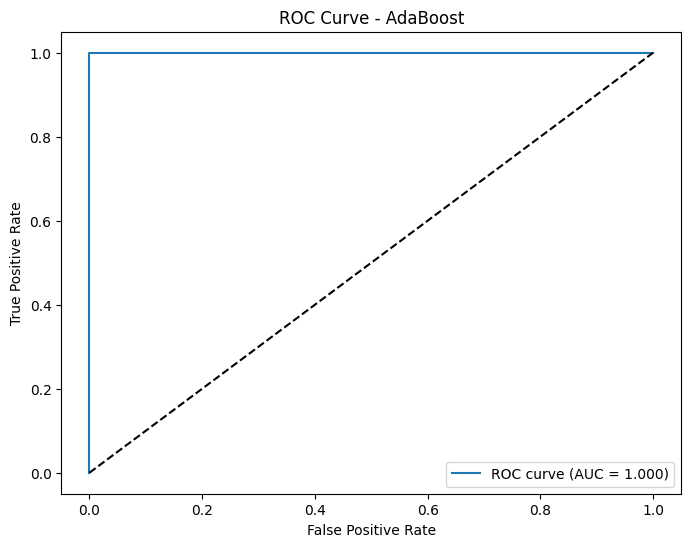

Generating Precision-Recall Curve...


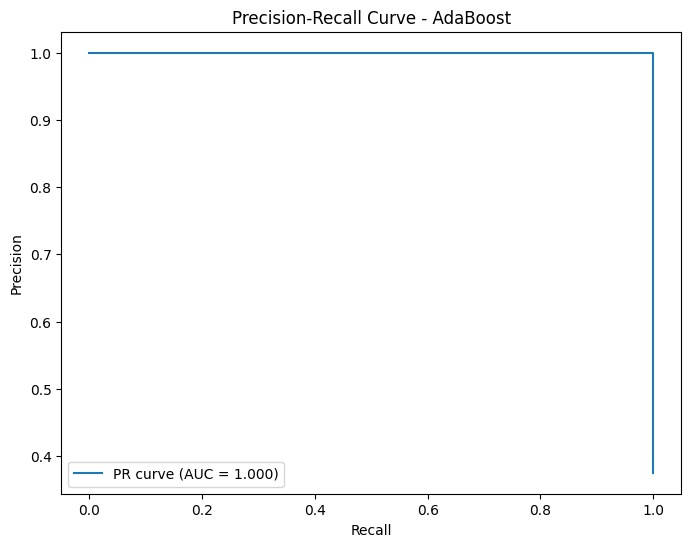

Generating Feature Importance Plot...


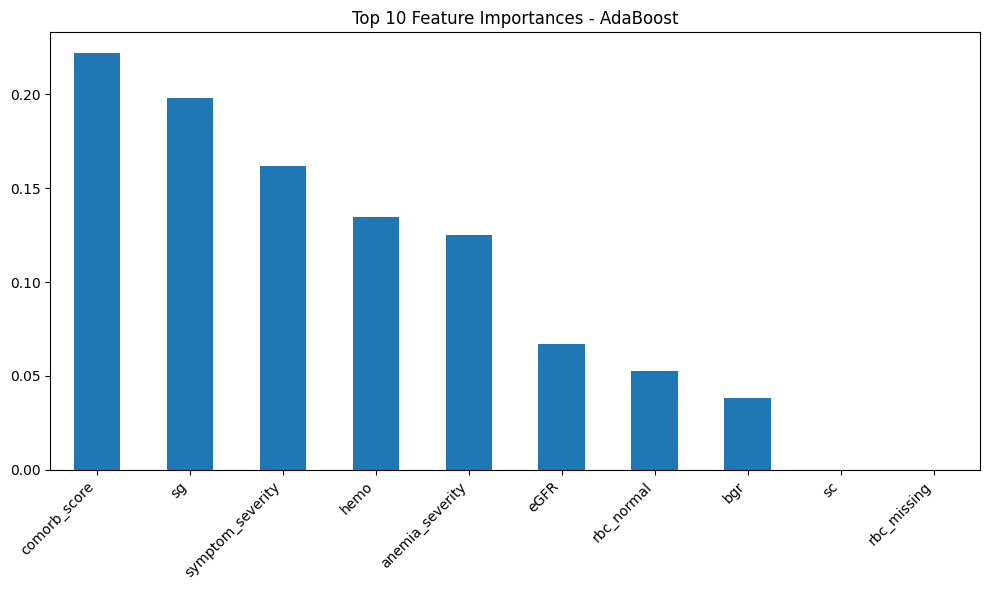

Generating Validation Curve Analysis...
Completed analysis for AdaBoost


ANALYZING: Bagging
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9860

 Generating Confusion Matrix...


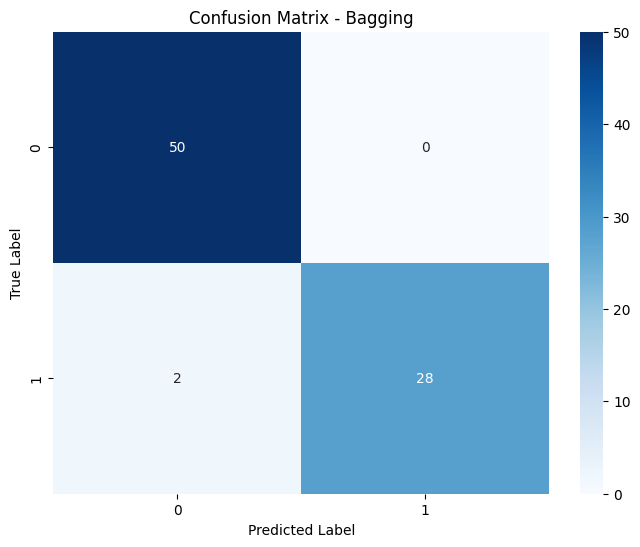

Generating ROC Curve...


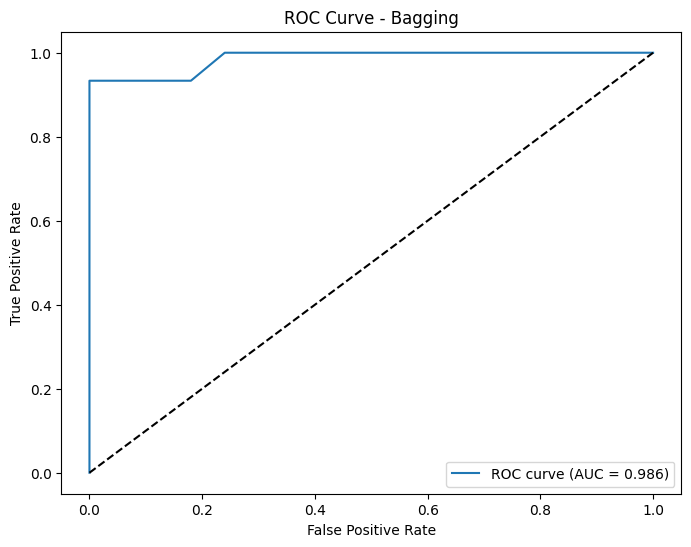

Generating Precision-Recall Curve...


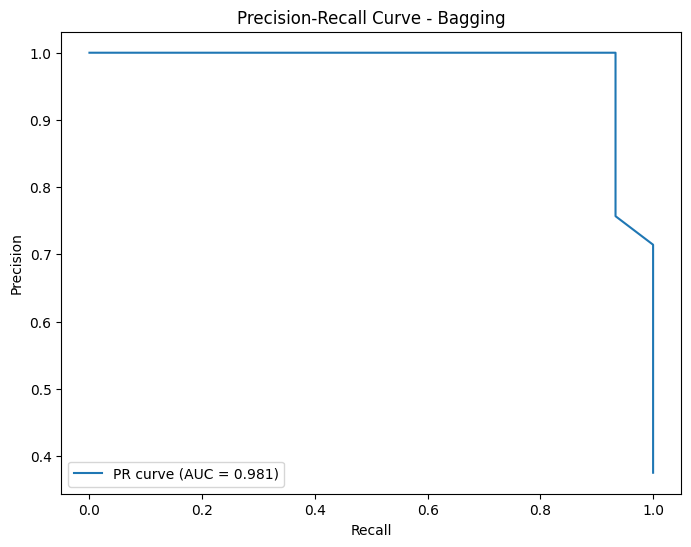

Generating Validation Curve Analysis...
Completed analysis for Bagging


ANALYZING: XGBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 1.0000

 Generating Confusion Matrix...


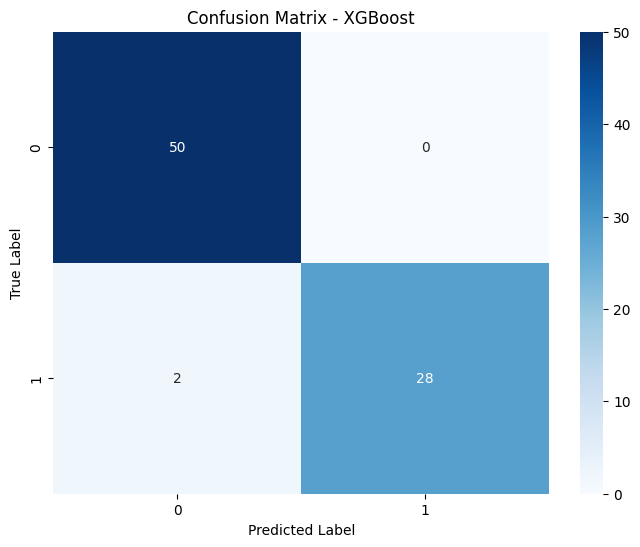

Generating ROC Curve...


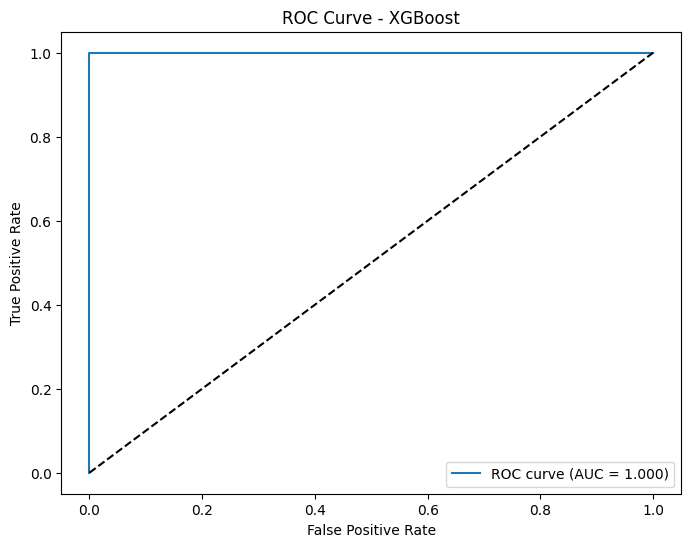

Generating Precision-Recall Curve...


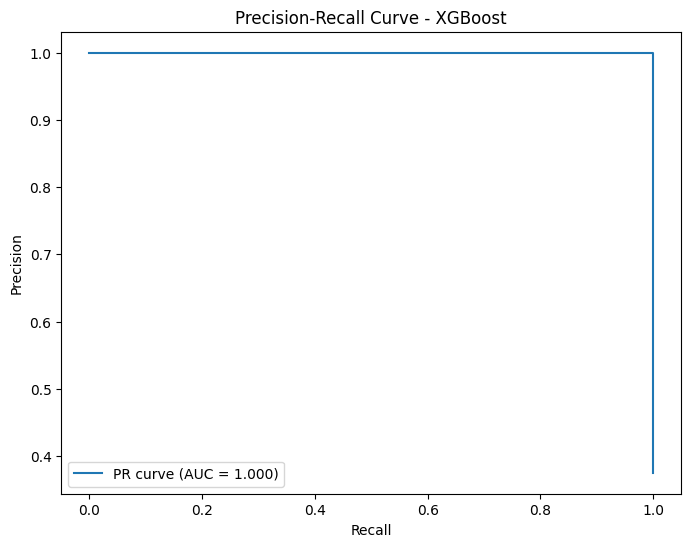

Generating Feature Importance Plot...


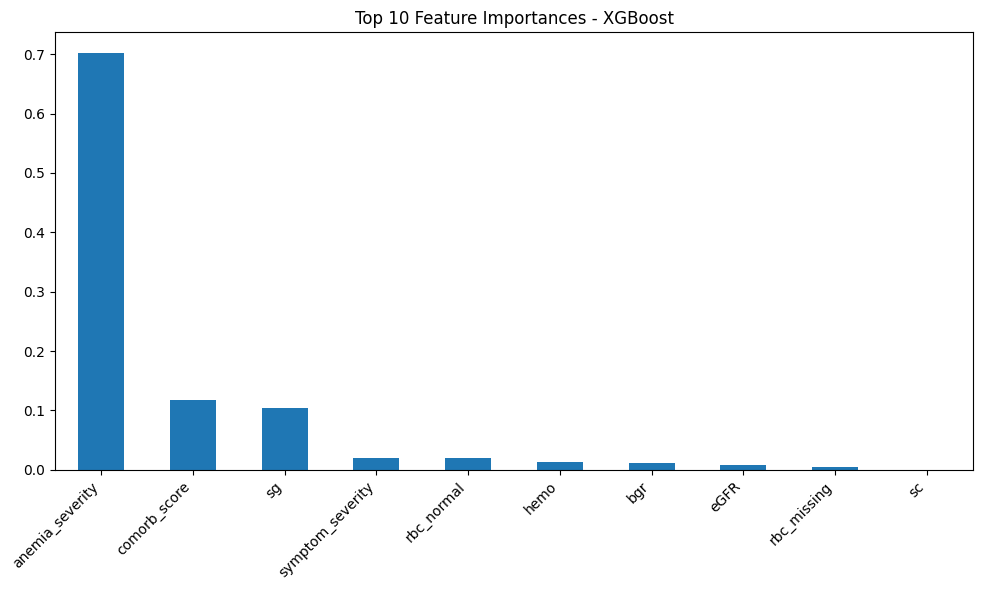

Generating Validation Curve Analysis...


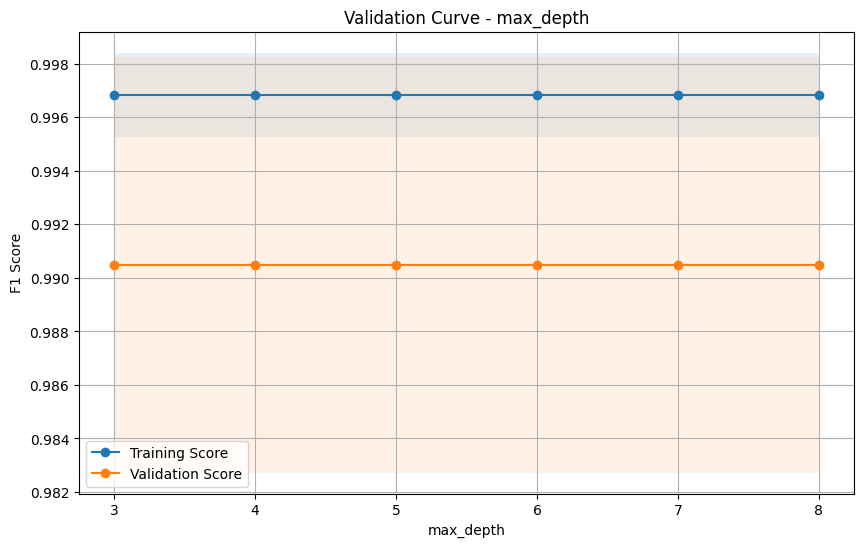

Completed analysis for XGBoost


ANALYZING: LightGBM
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


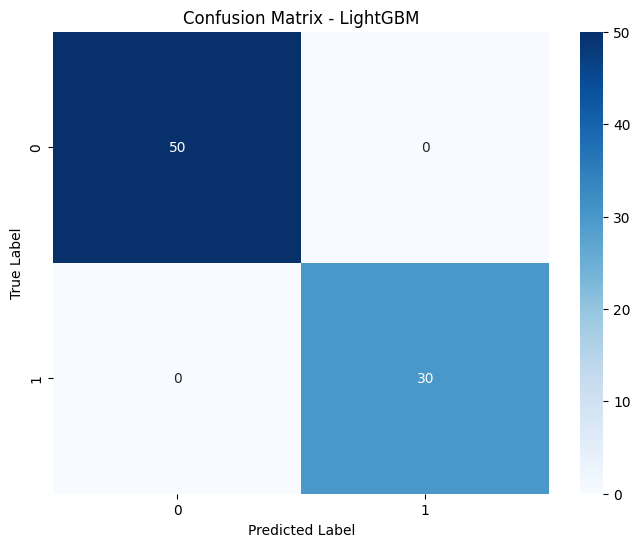

Generating ROC Curve...


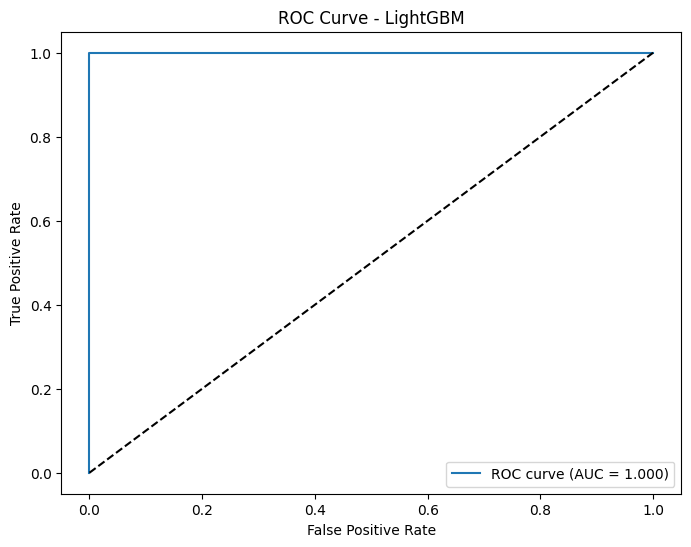

Generating Precision-Recall Curve...


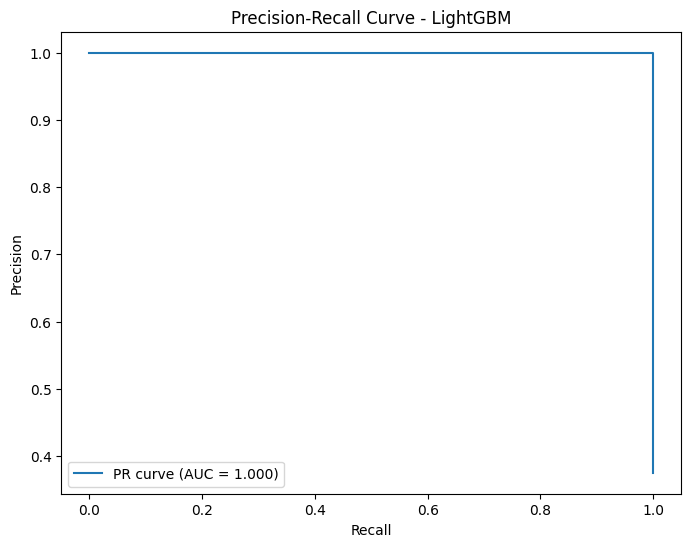

Generating Feature Importance Plot...


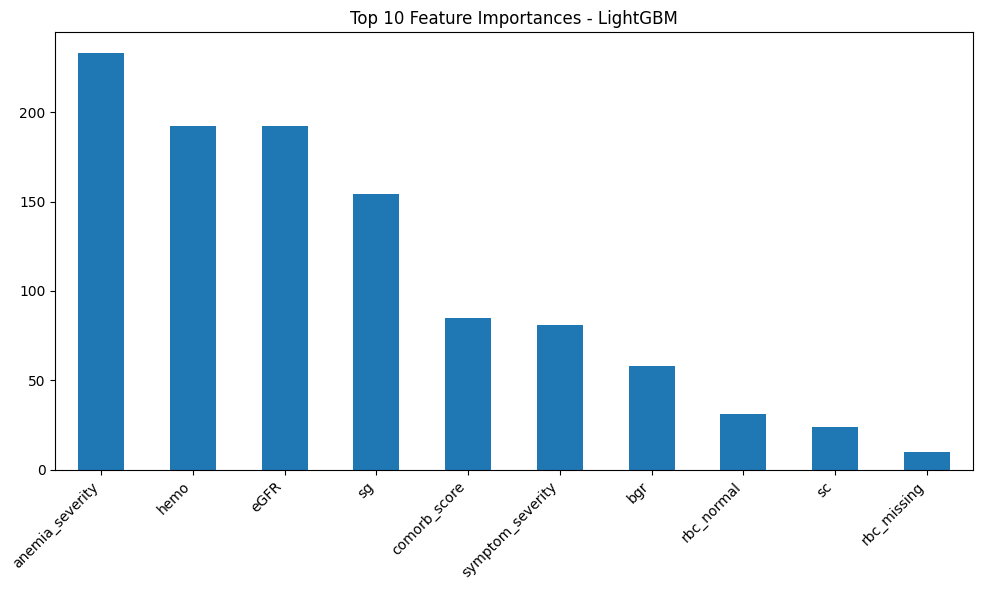

Generating Validation Curve Analysis...


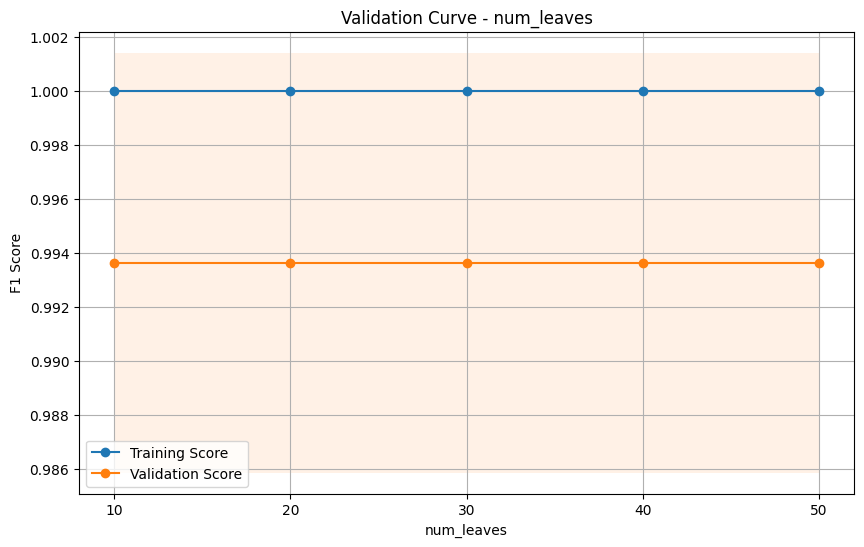

Completed analysis for LightGBM


ANALYZING: SVM (RBF)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


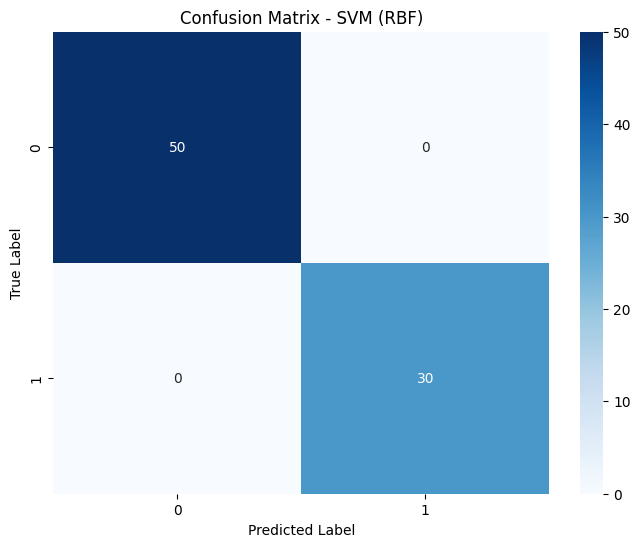

Generating ROC Curve...


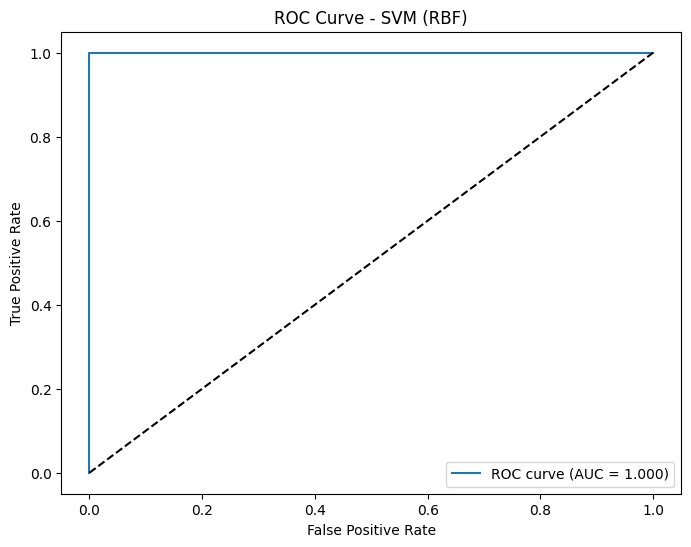

Generating Precision-Recall Curve...


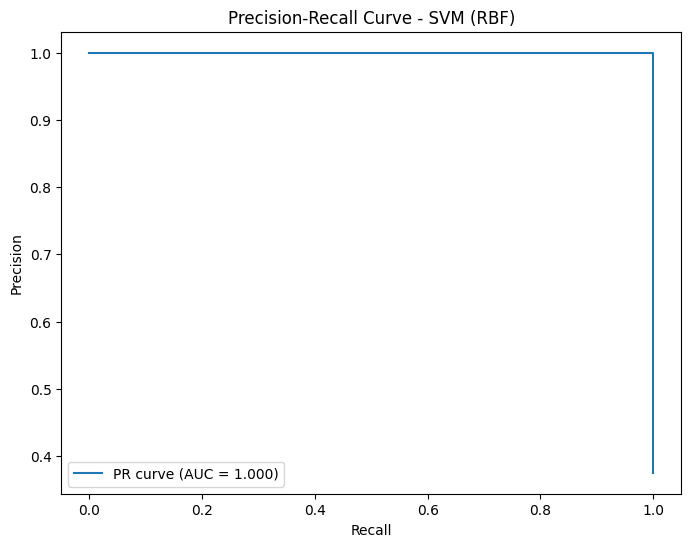

Generating Validation Curve Analysis...


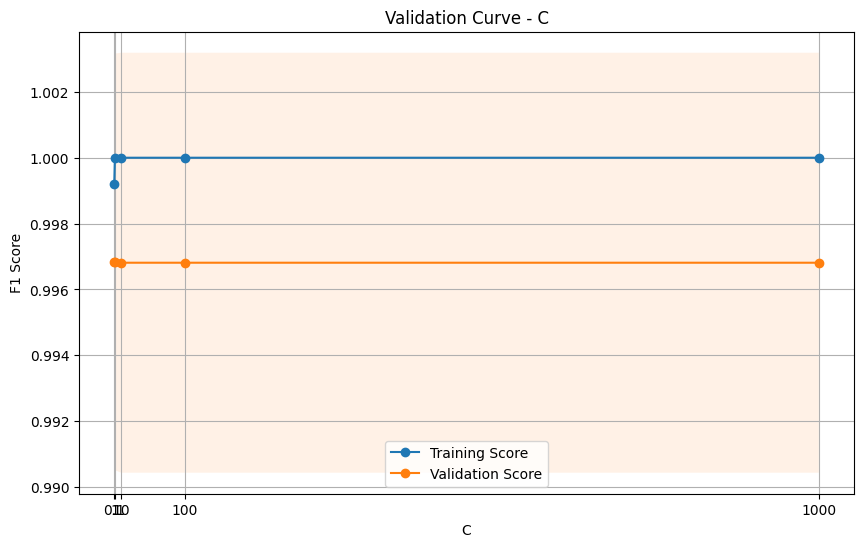

Completed analysis for SVM (RBF)


ANALYZING: SVM (Linear)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


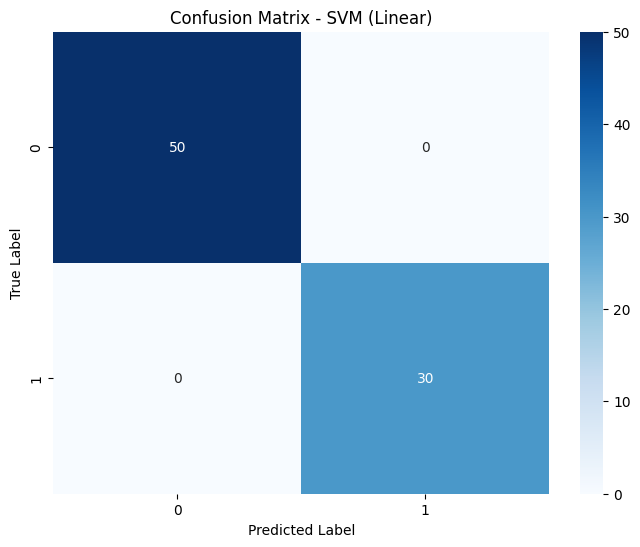

Generating ROC Curve...


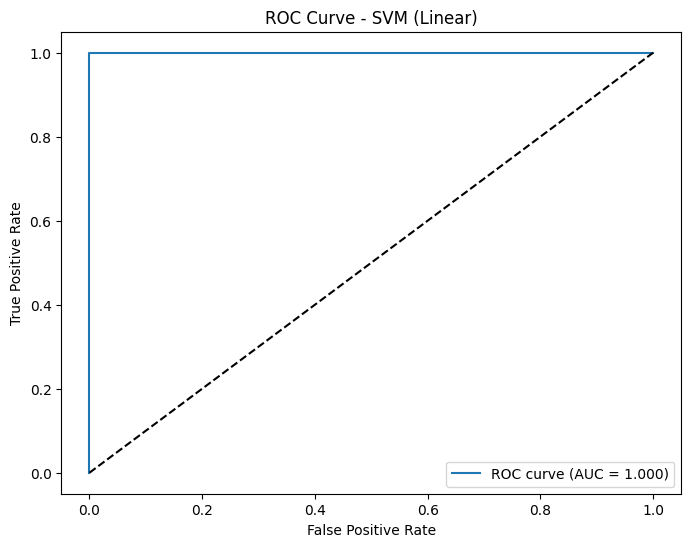

Generating Precision-Recall Curve...


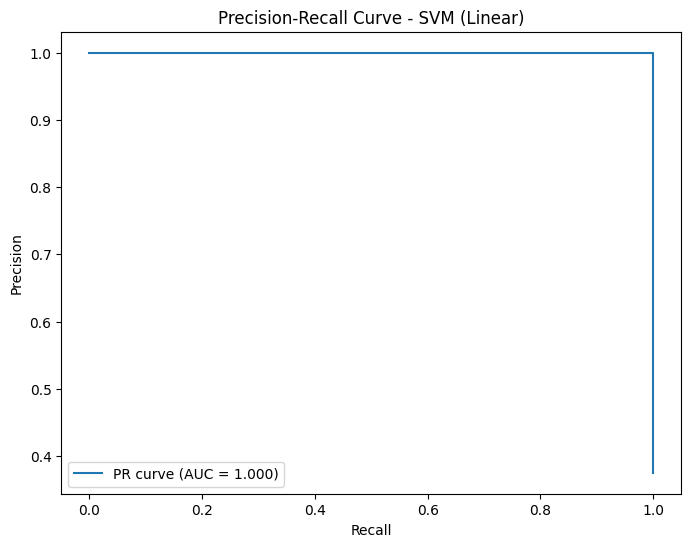

Generating Validation Curve Analysis...


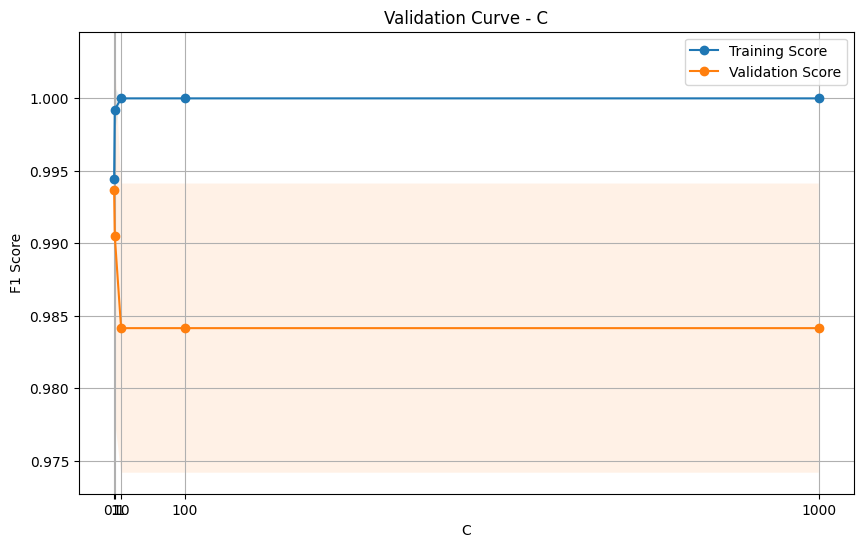

Completed analysis for SVM (Linear)


ANALYZING: SVM (Polynomial)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 1.0000

 Generating Confusion Matrix...


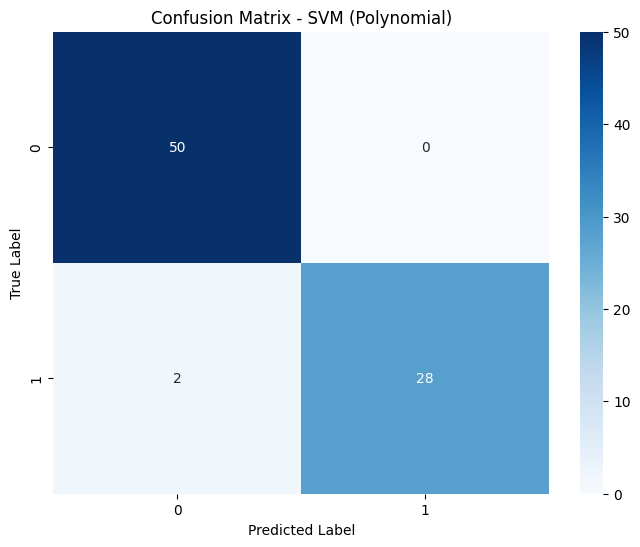

Generating ROC Curve...


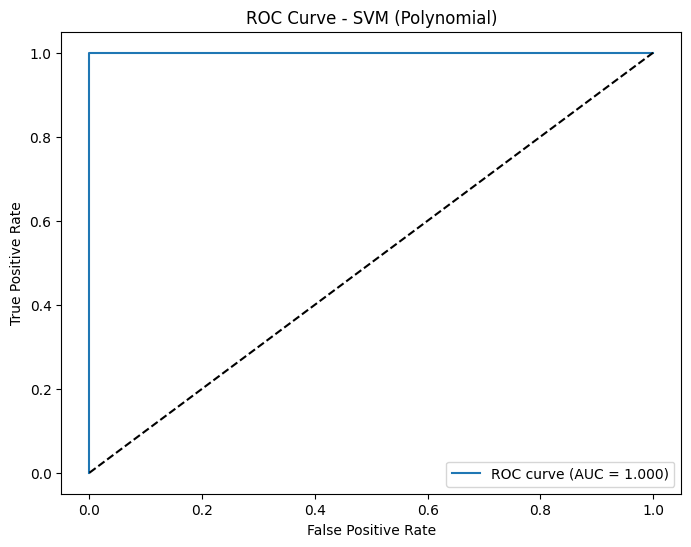

Generating Precision-Recall Curve...


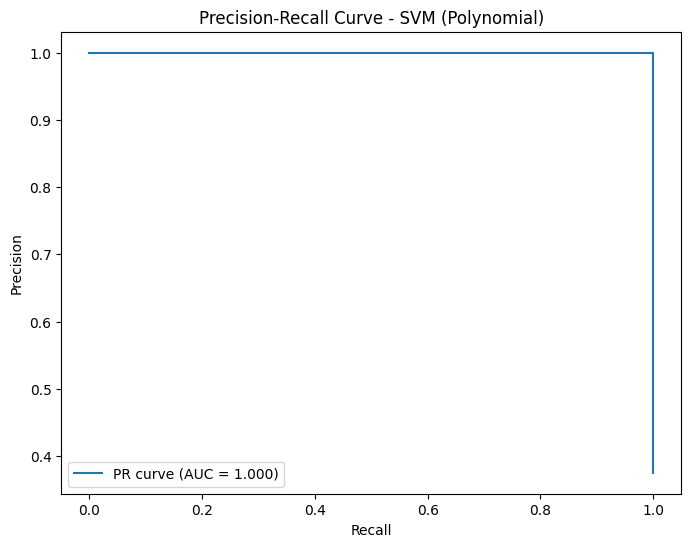

Generating Validation Curve Analysis...


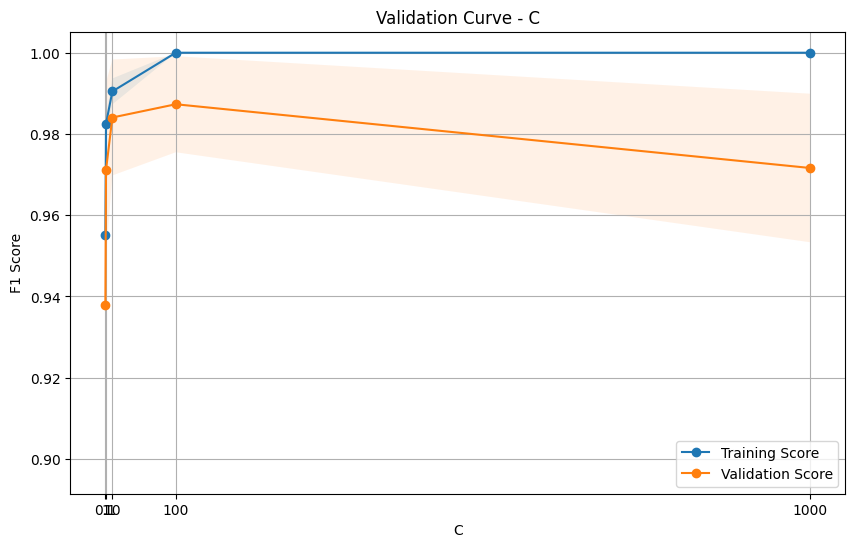

Completed analysis for SVM (Polynomial)


ANALYZING: K-Nearest Neighbors
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


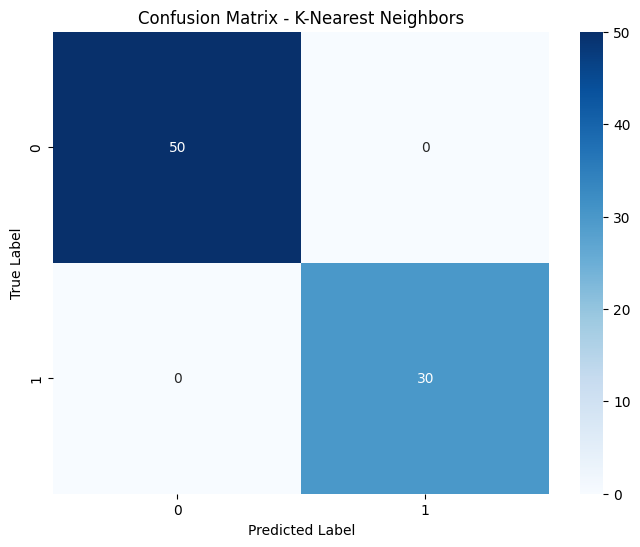

Generating ROC Curve...


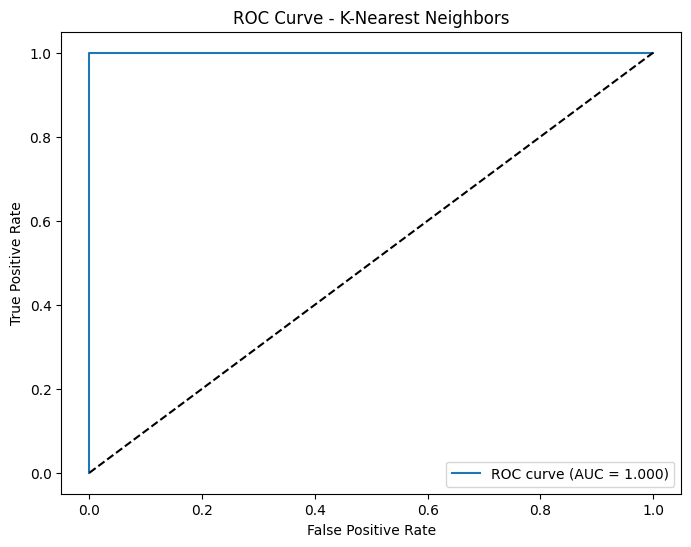

Generating Precision-Recall Curve...


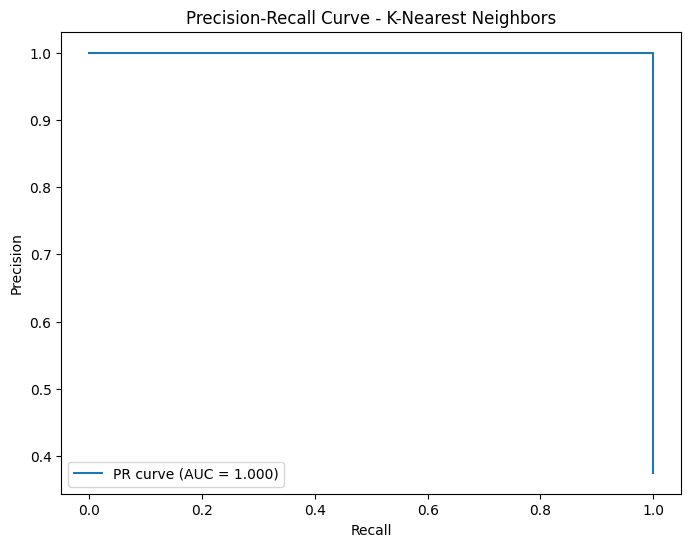

Generating Validation Curve Analysis...
Completed analysis for K-Nearest Neighbors


ANALYZING: Gaussian Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9000
   Precision: 0.9211
   Recall: 0.9000
   F1 Score: 0.9015
   ROC AUC: 1.0000

 Generating Confusion Matrix...


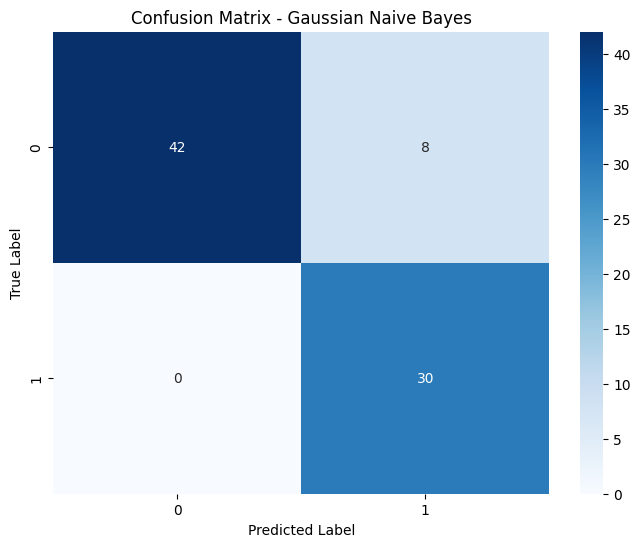

Generating ROC Curve...


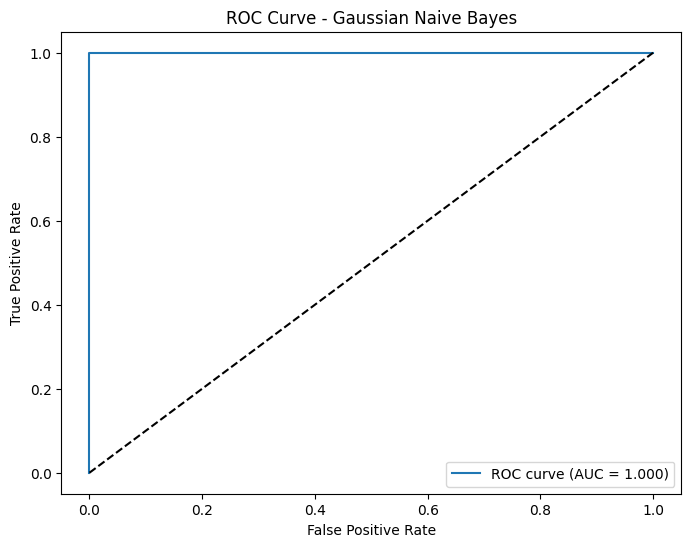

Generating Precision-Recall Curve...


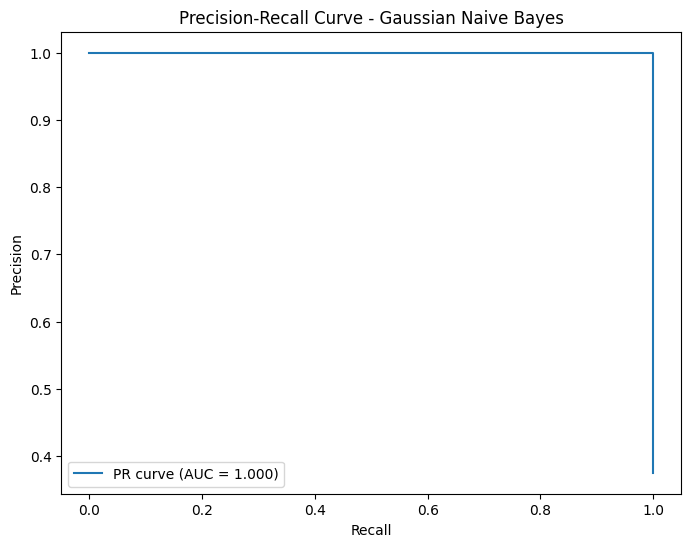

Generating Validation Curve Analysis...
Completed analysis for Gaussian Naive Bayes


ANALYZING: Bernoulli Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9766
   Recall: 0.9750
   F1 Score: 0.9751
   ROC AUC: 1.0000

 Generating Confusion Matrix...


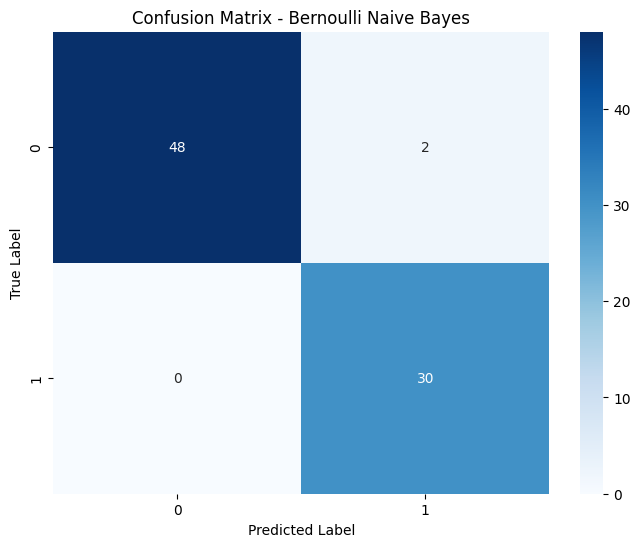

Generating ROC Curve...


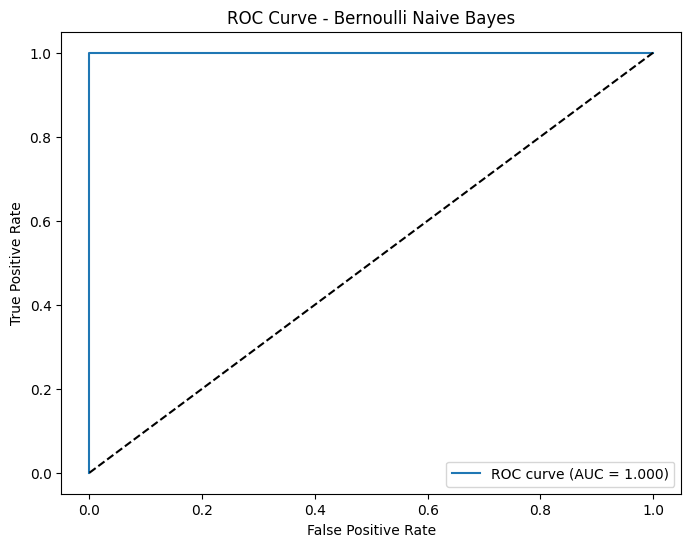

Generating Precision-Recall Curve...


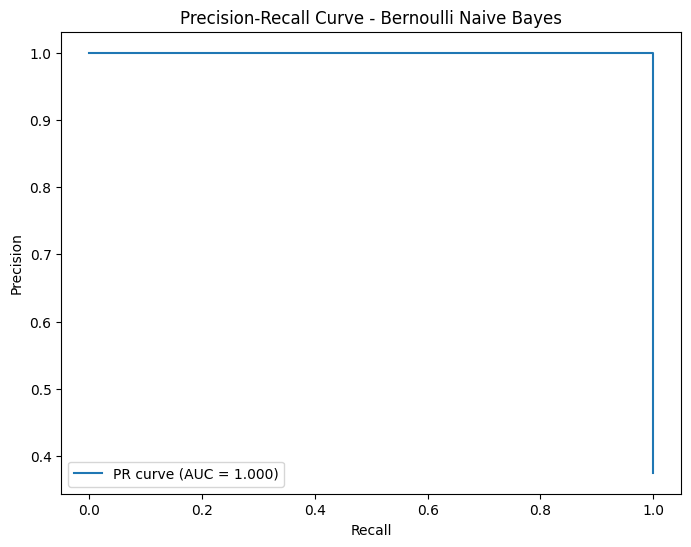

Generating Validation Curve Analysis...
Completed analysis for Bernoulli Naive Bayes


ANALYZING: Linear Discriminant Analysis
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


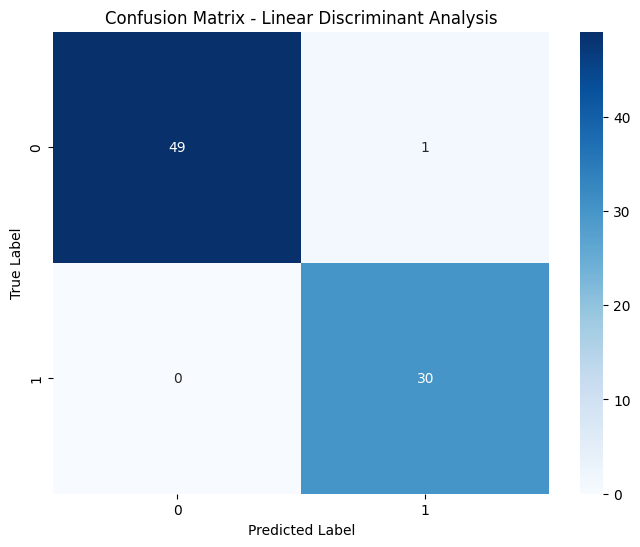

Generating ROC Curve...


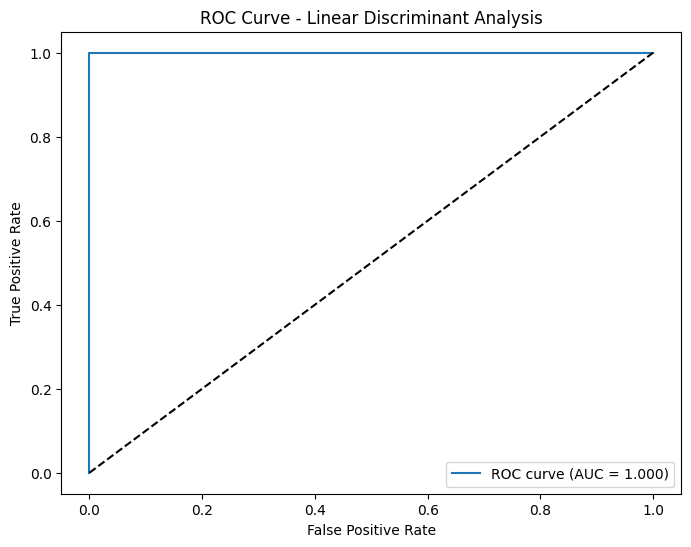

Generating Precision-Recall Curve...


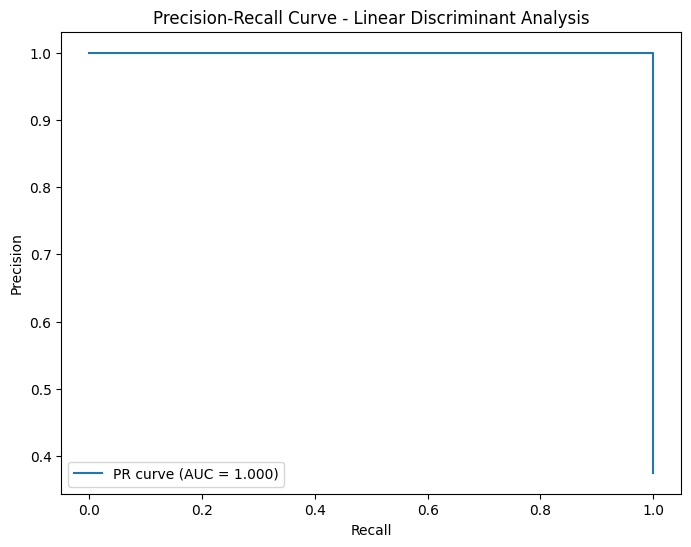

Generating Validation Curve Analysis...
Completed analysis for Linear Discriminant Analysis


ANALYZING: Multi-layer Perceptron
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


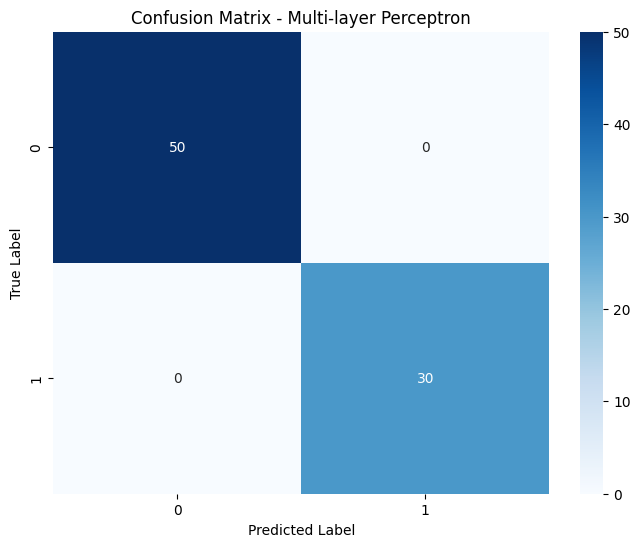

Generating ROC Curve...


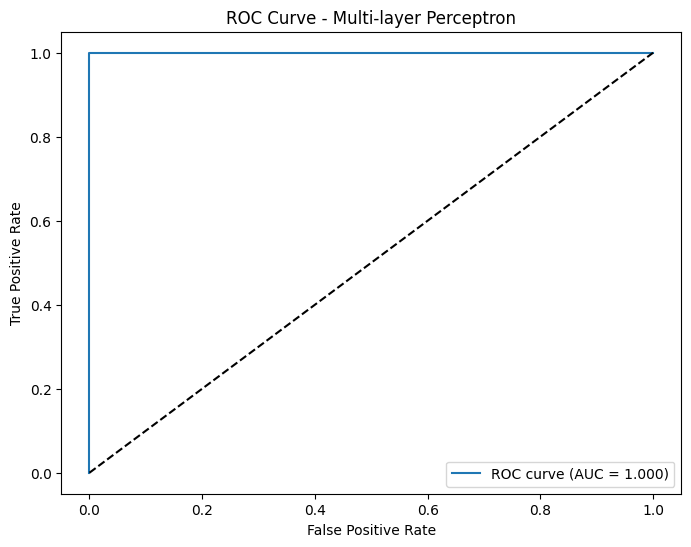

Generating Precision-Recall Curve...


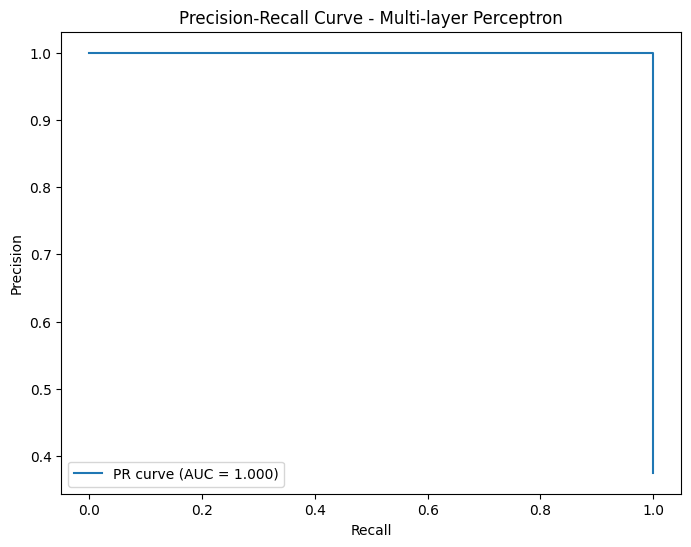

Generating Validation Curve Analysis...
Completed analysis for Multi-layer Perceptron


ANALYZING: Dummy Classifier (Stratified)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.5000
   Precision: 0.4858
   Recall: 0.5000
   F1 Score: 0.4918
   ROC AUC: 0.4533

 Generating Confusion Matrix...


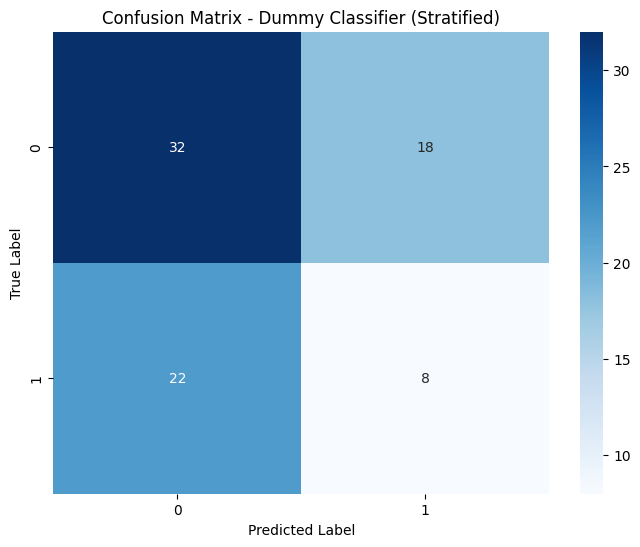

Generating ROC Curve...


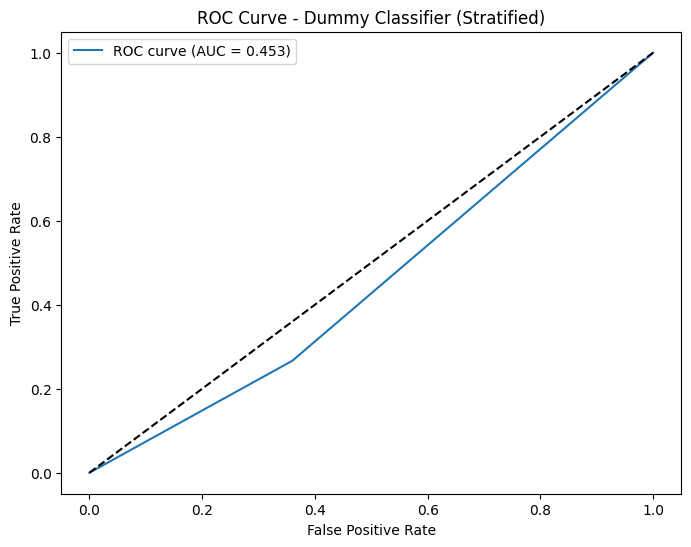

Generating Precision-Recall Curve...


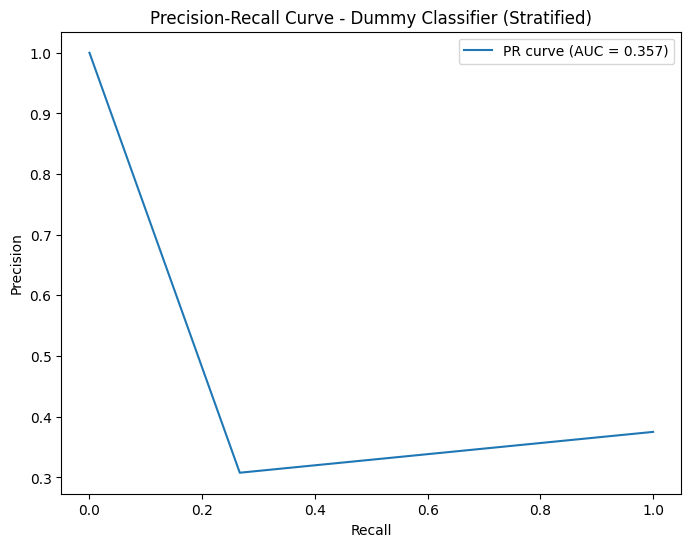

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Stratified)


ANALYZING: Dummy Classifier (Most Frequent)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.6250
   Precision: 0.3906
   Recall: 0.6250
   F1 Score: 0.4808
   ROC AUC: 0.5000

 Generating Confusion Matrix...


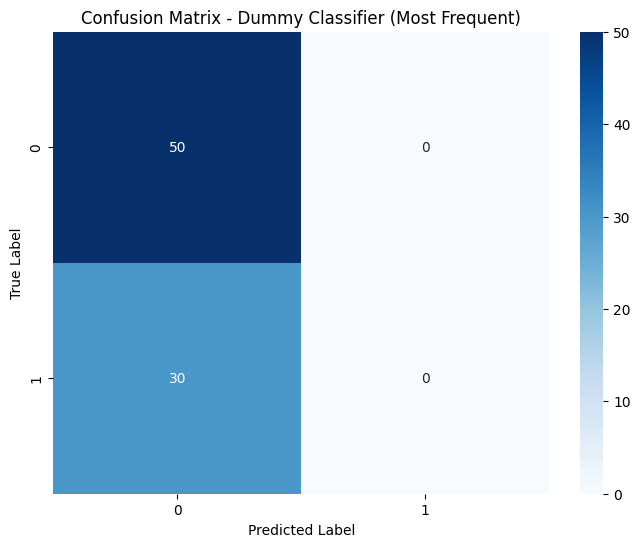

Generating ROC Curve...


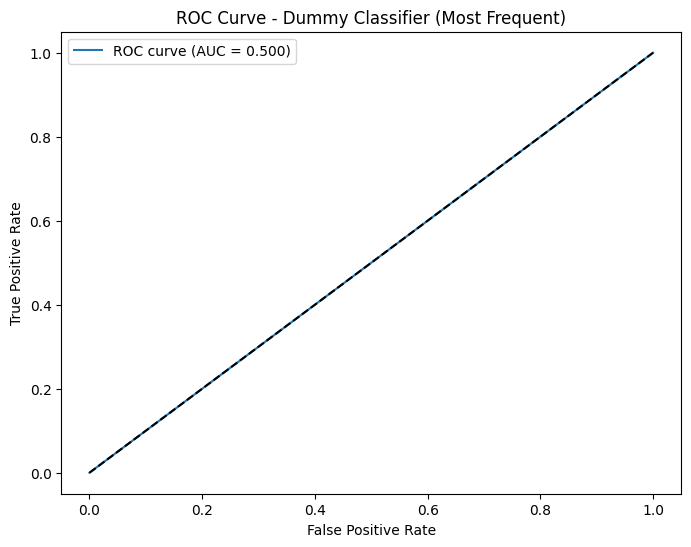

Generating Precision-Recall Curve...


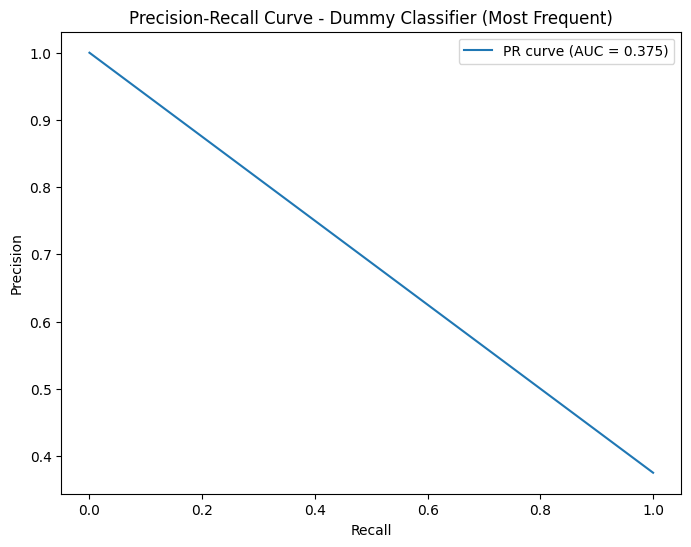

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Most Frequent)


OVERFITTING RISK SUMMARY

Critical CRITICAL OVERFITTING RISK (14 models):
------------------------------------------------------------
   • Logistic Regression (L1)
     Score: 1.000
     - High confidence predictions: 89.2% of training predictions are >95% or <5% confident
     - Perfect test score detected (99.9%+) - possible data leakage

   • Logistic Regression (L2)
     Score: 1.000
     - High confidence predictions: 87.3% of training predictions are >95% or <5% confident
     - Perfect test score detected (99.9%+) - possible data leakage

   • Logistic Regression (ElasticNet)
     Score: 1.000
     - High confidence predictions: 88.6% of training predictions are >95% or <5% confident
     - Perfect test score detected (99.9%+) - possible data leakage

   • SGD Classifier
     Score: 1.000
     - High confidence predictions: 99.1% of training predictions are >95% or <5% confident
  

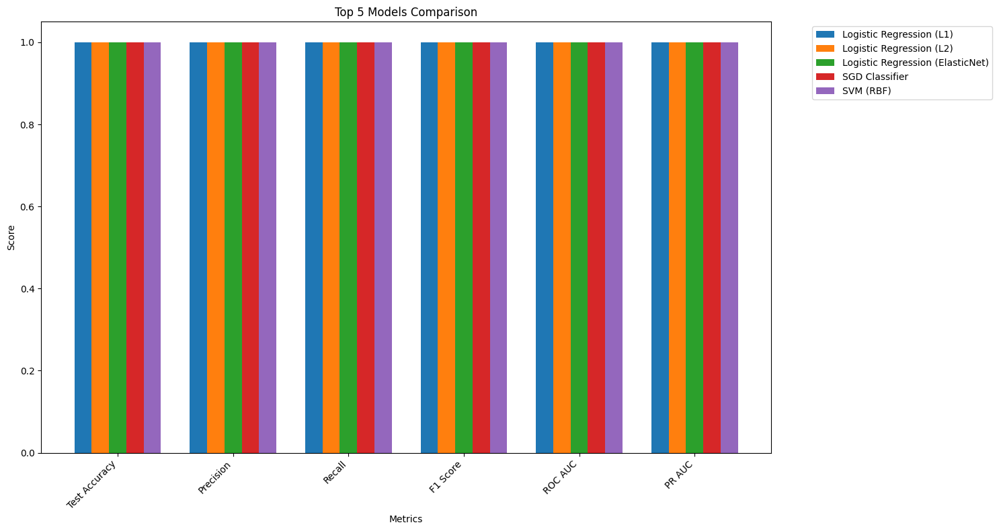

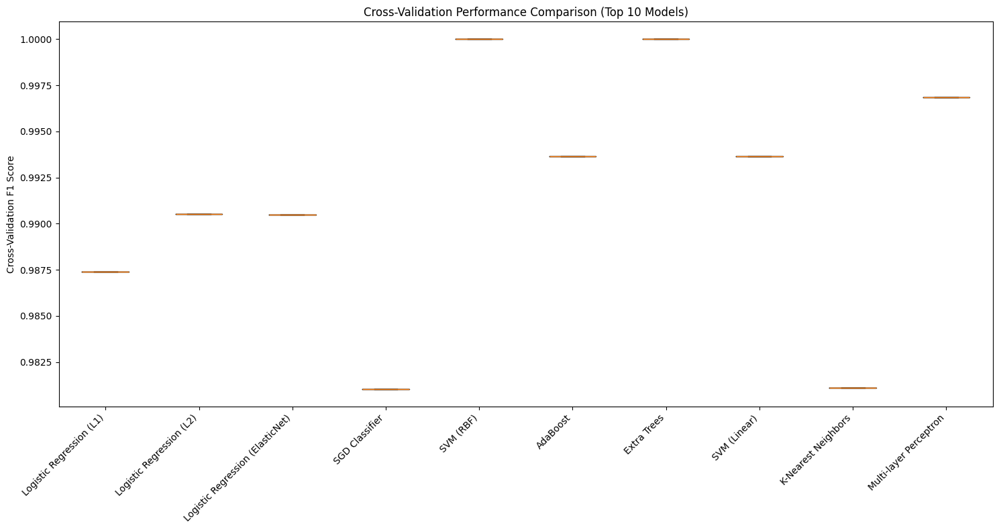


FINAL HEALTHCARE RECOMMENDATIONS
RECOMMENDED MODEL: Extra Trees
   Healthcare Score: 2.1000
   Recall (Sensitivity): 1.0000
   Precision: 1.0000
   F1 Score: 1.0000
   Overfitting Risk: CRITICAL

TOP 3 SAFE MODELS FOR HEALTHCARE:
   1. XGBoost (Score: 1.2090, Risk: MEDIUM)
   2. Random Forest (Score: 1.2085, Risk: MEDIUM)
   3. Decision Tree (Score: 1.2060, Risk: MEDIUM)

MODELS TO AVOID IN HEALTHCARE:
  Extra Trees
  SVM (RBF)
  Multi-layer Perceptron
  LightGBM
  Logistic Regression (L1)

 GENERATING ADDITIONAL ANALYSIS PLOTS...


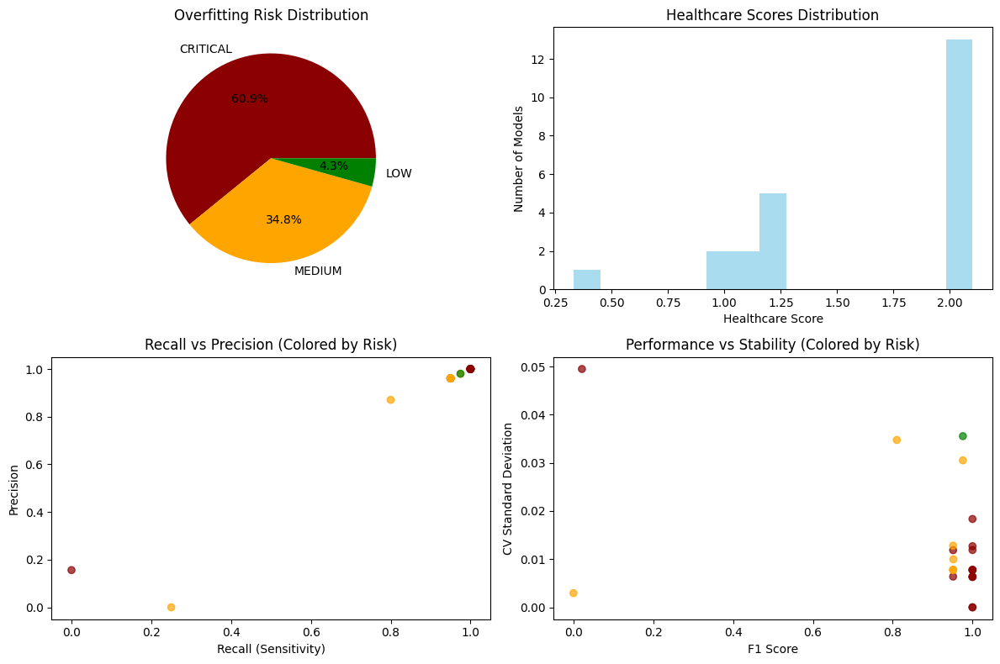

In [82]:
v1_results = run_healthcare_ml_pipeline(X_train_imp1, X_test_imp1, y_train_imp1, y_test_imp1)


In [83]:
print(v1_results)

{'results': {'Logistic Regression (L1)': {'Model': 'Logistic Regression (L1)', 'Train F1': 0.996837961760817, 'CV Mean F1': np.float64(0.9873986385611287), 'CV Std F1': np.float64(0.006301422645885812), 'Overfitting Gap': -0.0031620382391830404, 'Overfitting Score': 1.0, 'Overfitting Risk': 'CRITICAL', 'Test Accuracy': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'F1 Score': 1.0, 'ROC AUC': 1.0, 'PR AUC': 0.9999999999999999}, 'Logistic Regression (L2)': {'Model': 'Logistic Regression (L2)', 'Train F1': 0.996837961760817, 'CV Mean F1': np.float64(0.9905115292870393), 'CV Std F1': np.float64(0.007747303895365152), 'Overfitting Gap': -0.0031620382391830404, 'Overfitting Score': 1.0, 'Overfitting Risk': 'CRITICAL', 'Test Accuracy': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'F1 Score': 1.0, 'ROC AUC': 1.0, 'PR AUC': 0.9999999999999999}, 'Logistic Regression (ElasticNet)': {'Model': 'Logistic Regression (ElasticNet)', 'Train F1': 0.996837961760817, 'CV Mean F1': np.float64(0.9904879700798068), 'CV Std 

### Version 2


HEALTHCARE ML ANALYSIS PIPELINE
Kidney Disease Detection - Enhanced Overfitting Detection
 Dataset Info:
   Training samples: 316
   Test samples: 80
   Features: 5
   Classes: 2
   Class distribution: {np.int64(0): np.int64(196), np.int64(1): np.int64(120)}

Testing 26 different classification algorithms...

COMPREHENSIVE ANALYSIS: Logistic Regression (L1)
PERFORMANCE METRICS:
   Test Accuracy: 0.9875
   Precision: 0.9877
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000
   PR AUC: 1.0000

 ENHANCED OVERFITTING ANALYSIS:
   Train F1 Score: 0.9747
   Test F1 Score: 0.9875
   F1 Performance Gap: -0.0128
   Accuracy Gap: -0.0128
   Overfitting Score: 0.300
   Overfitting Risk: MEDIUM
   Overfitting Indicators:
     • High confidence predictions: 82.3% of training predictions are >95% or <5% confident

STRATIFIED K-FOLD CROSS VALIDATION:
   CV Scores: ['1.0000', '0.9842', '0.9683', '0.9526', '0.9683']
   CV Mean: 0.9747
   CV Std: 0.0161
   CV Coefficient of Variation: 0.0166

📋 D

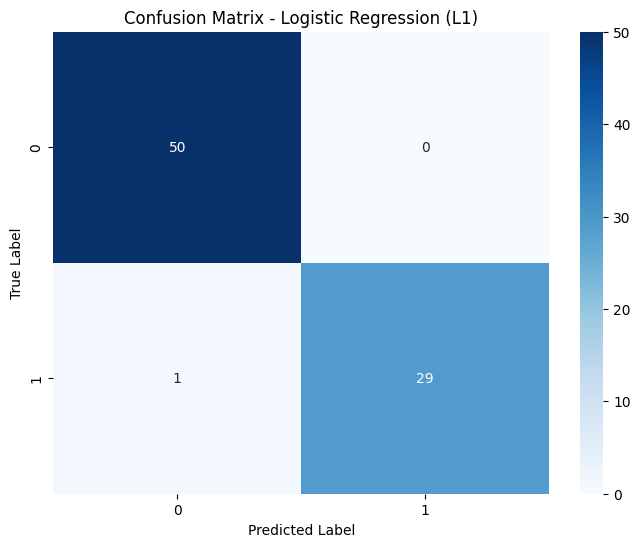

Generating ROC Curve...


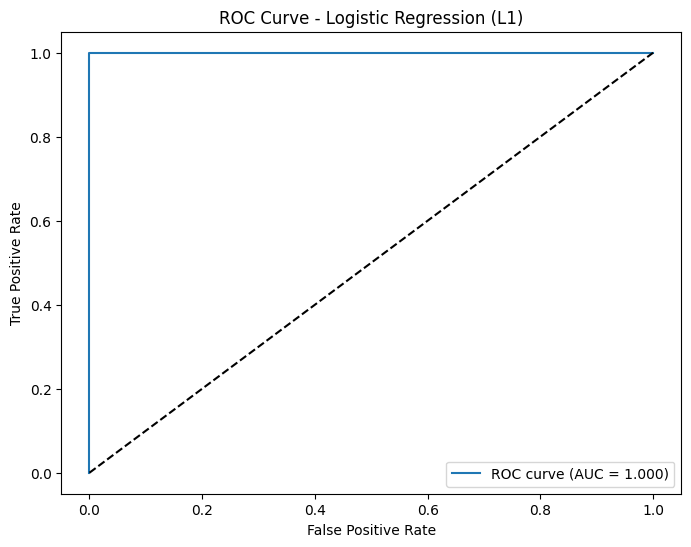

Generating Precision-Recall Curve...


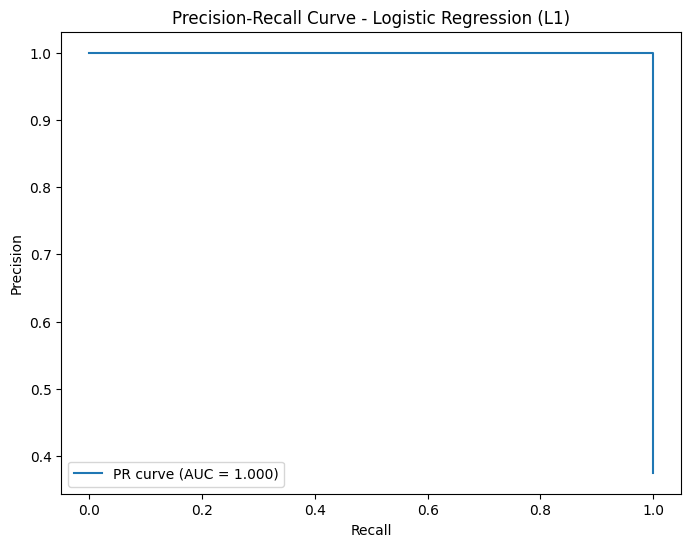

Generating Validation Curve Analysis...


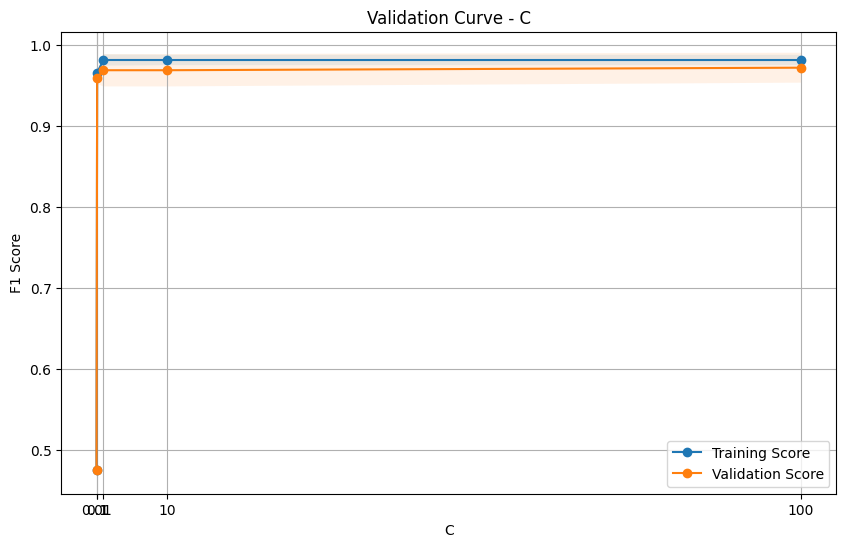

Completed analysis for Logistic Regression (L1)


ANALYZING: Logistic Regression (L2)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


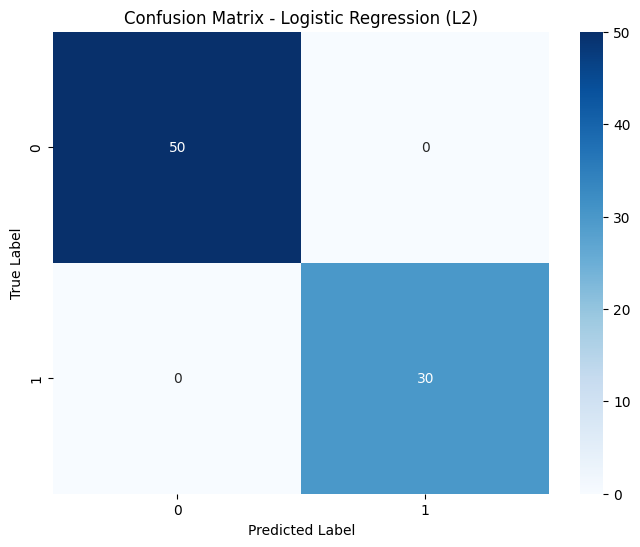

Generating ROC Curve...


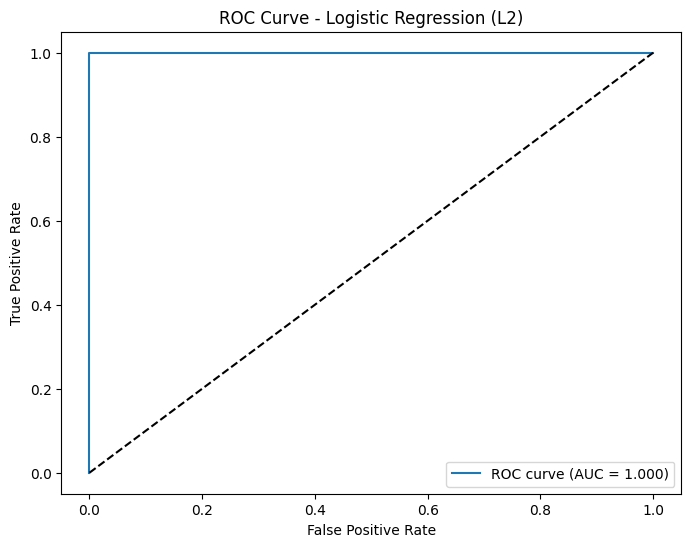

Generating Precision-Recall Curve...


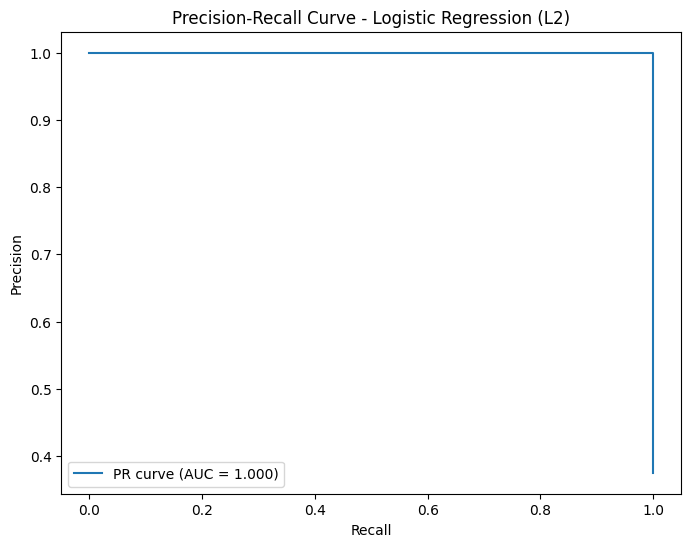

Generating Validation Curve Analysis...


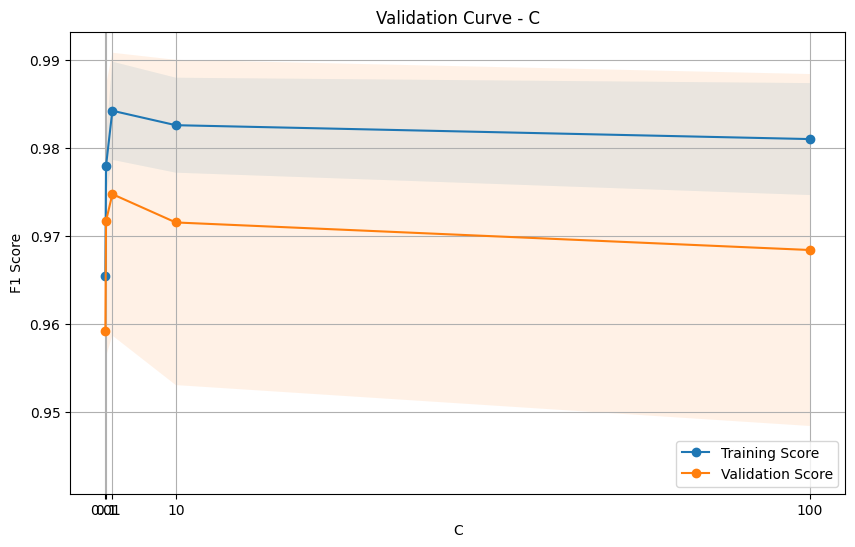

Completed analysis for Logistic Regression (L2)


ANALYZING: Logistic Regression (ElasticNet)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9877
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


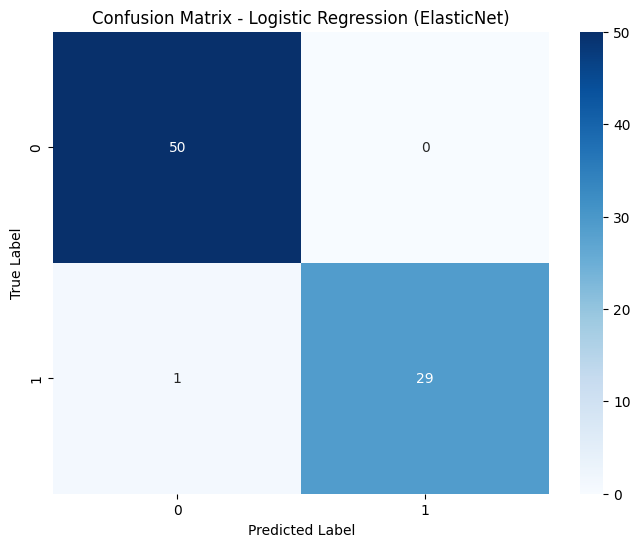

Generating ROC Curve...


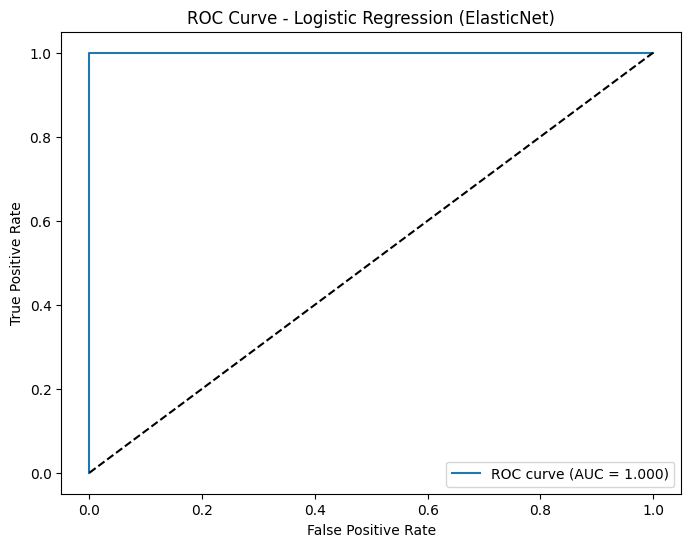

Generating Precision-Recall Curve...


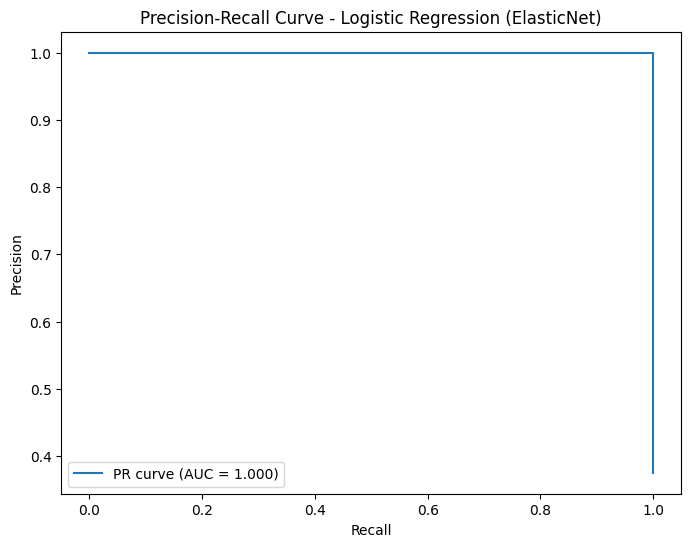

Generating Validation Curve Analysis...


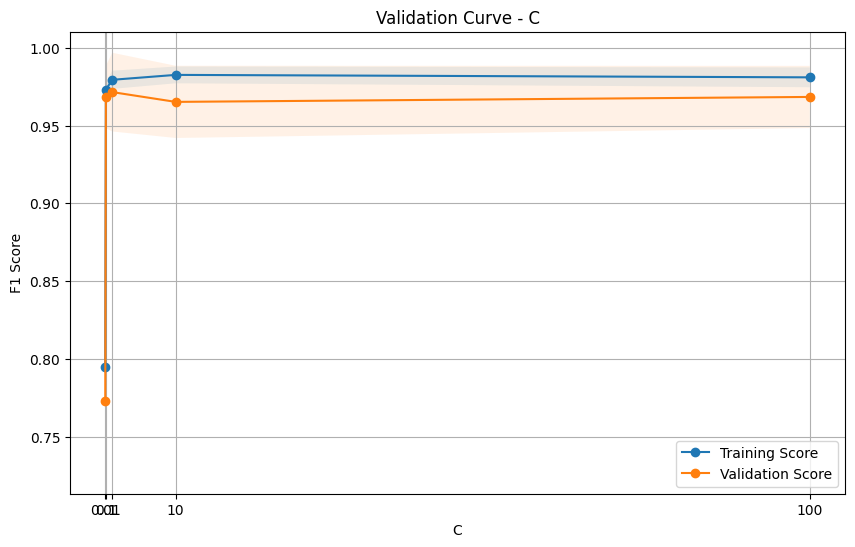

Completed analysis for Logistic Regression (ElasticNet)


ANALYZING: Ridge Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


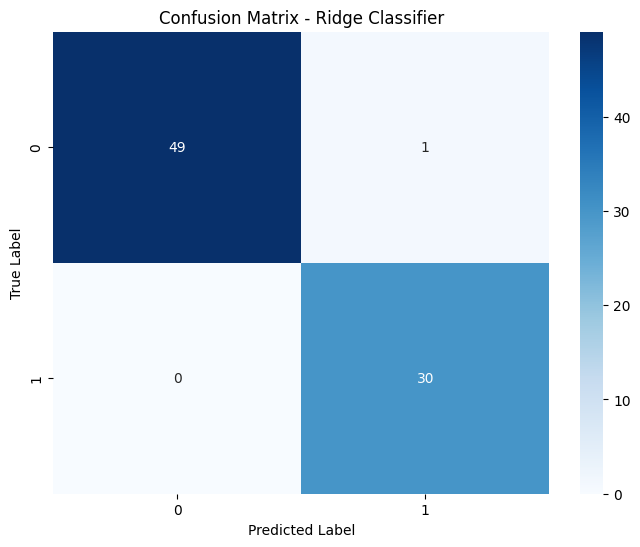

Generating ROC Curve...


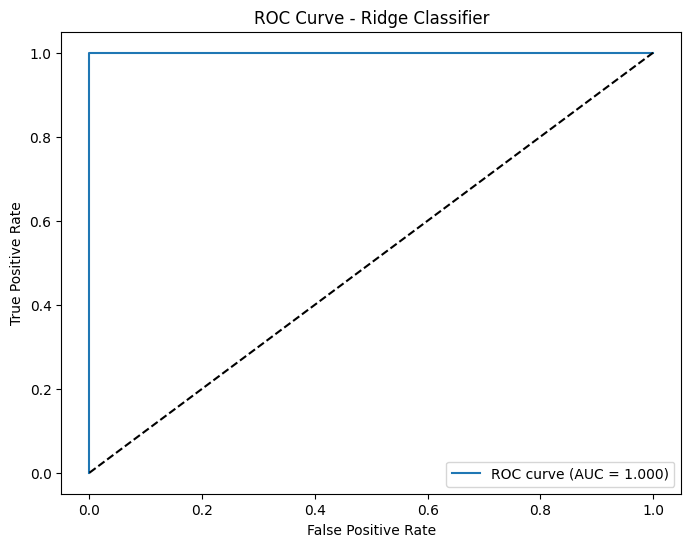

Generating Precision-Recall Curve...


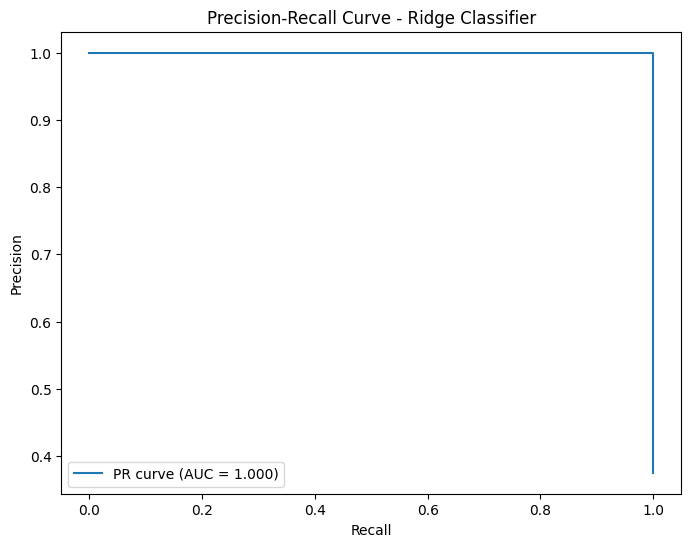

Generating Feature Coefficients Plot...


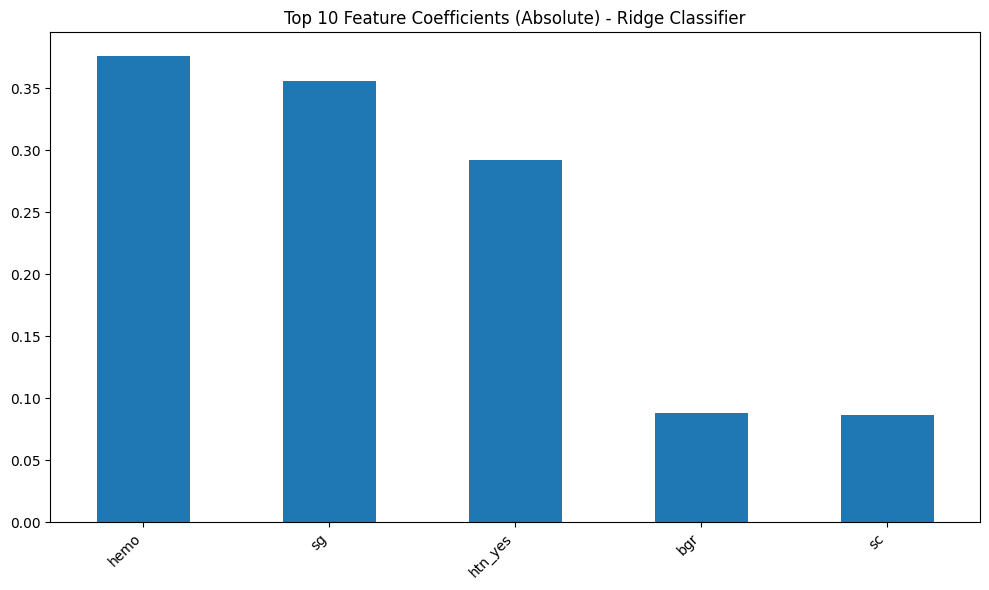

Generating Validation Curve Analysis...
Completed analysis for Ridge Classifier


ANALYZING: SGD Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 1.0000

 Generating Confusion Matrix...


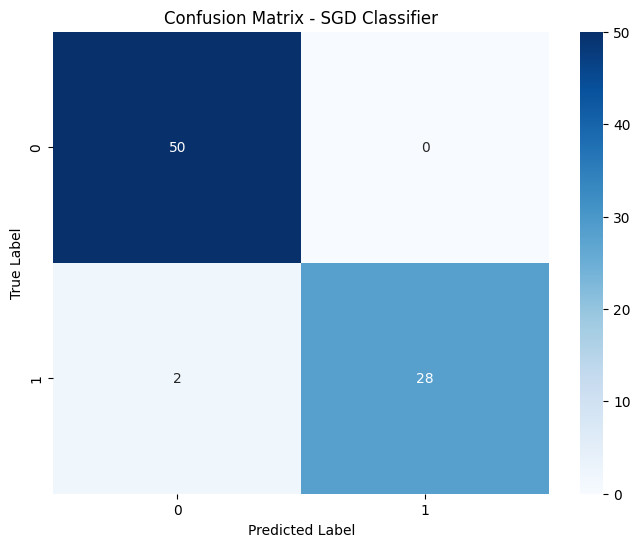

Generating ROC Curve...


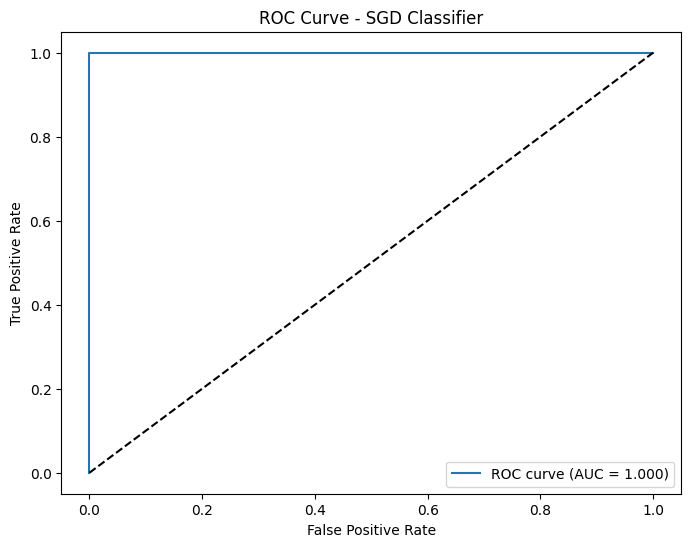

Generating Precision-Recall Curve...


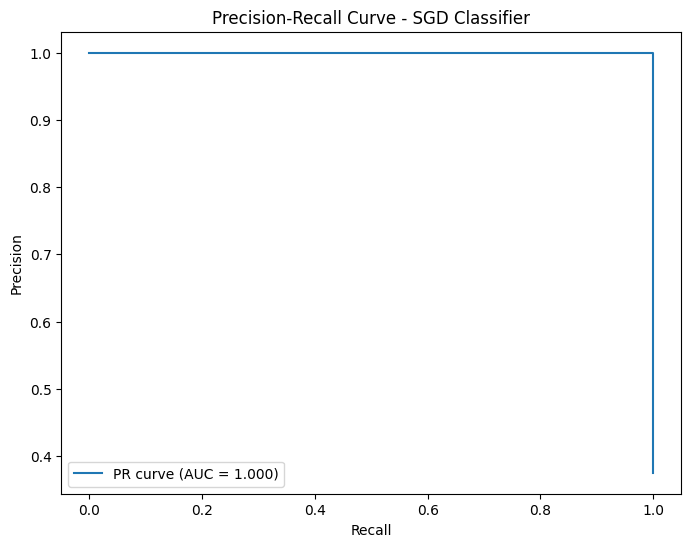

Generating Validation Curve Analysis...
Completed analysis for SGD Classifier


ANALYZING: Decision Tree
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9667

 Generating Confusion Matrix...


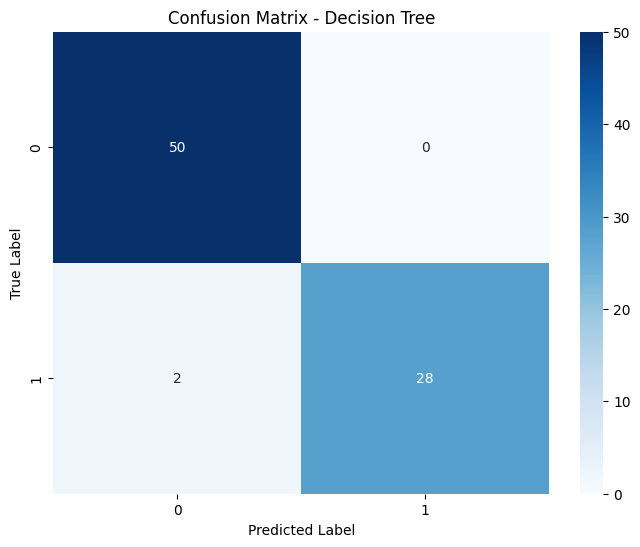

Generating ROC Curve...


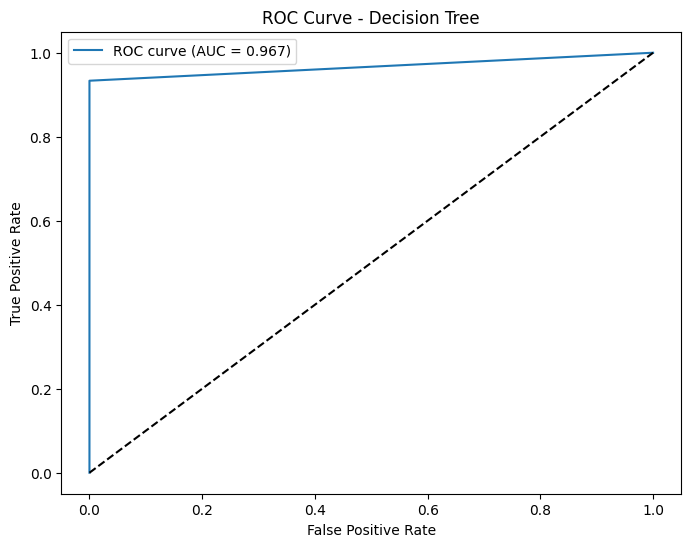

Generating Precision-Recall Curve...


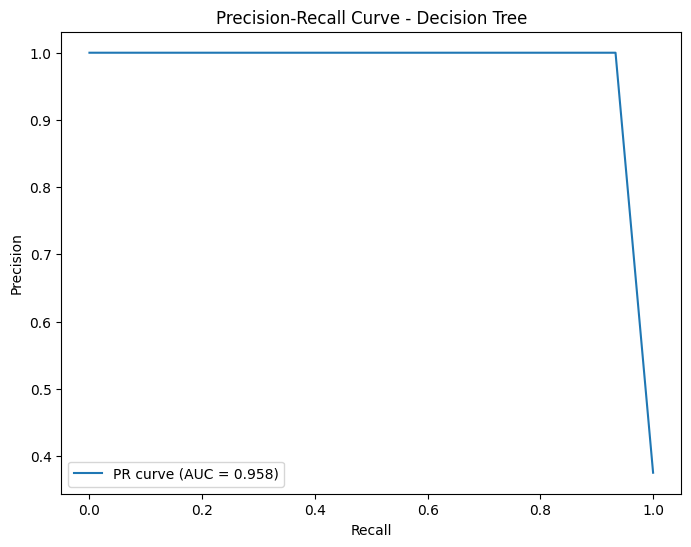

Generating Feature Importance Plot...


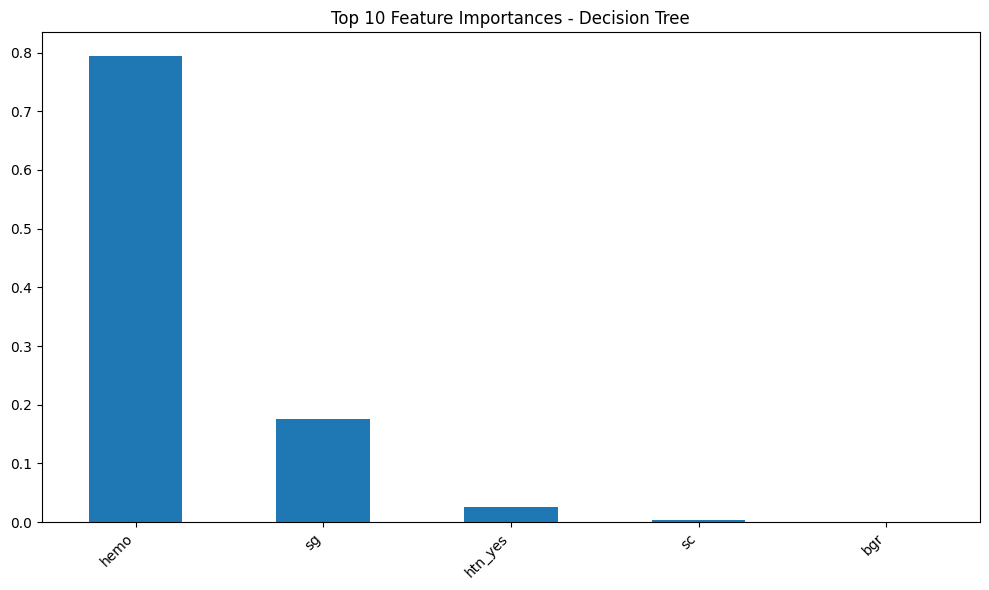

Generating Validation Curve Analysis...
Completed analysis for Decision Tree


ANALYZING: Random Forest
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 1.0000

 Generating Confusion Matrix...


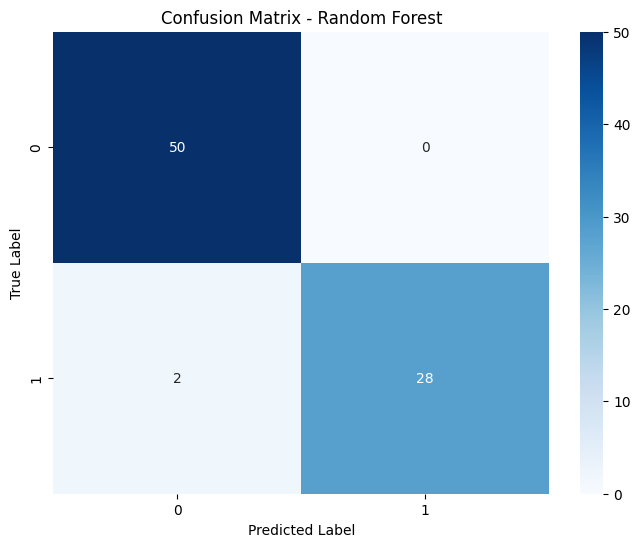

Generating ROC Curve...


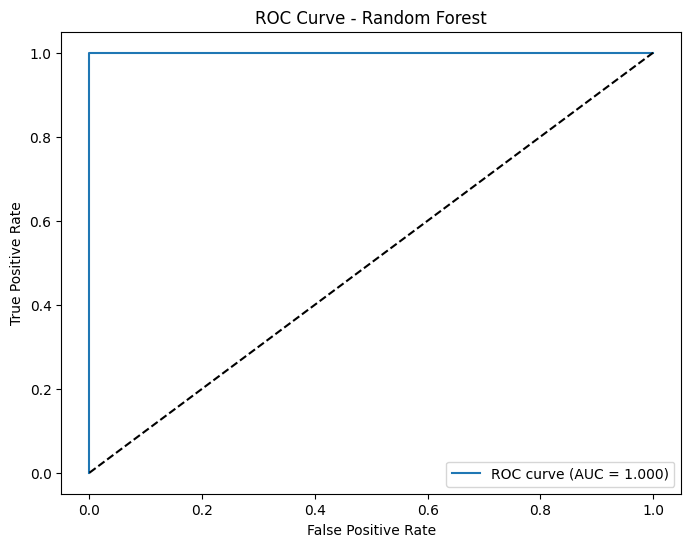

Generating Precision-Recall Curve...


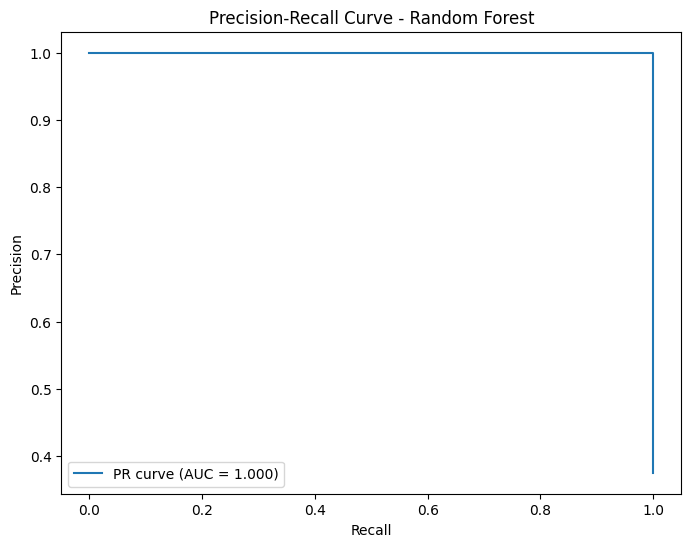

Generating Feature Importance Plot...


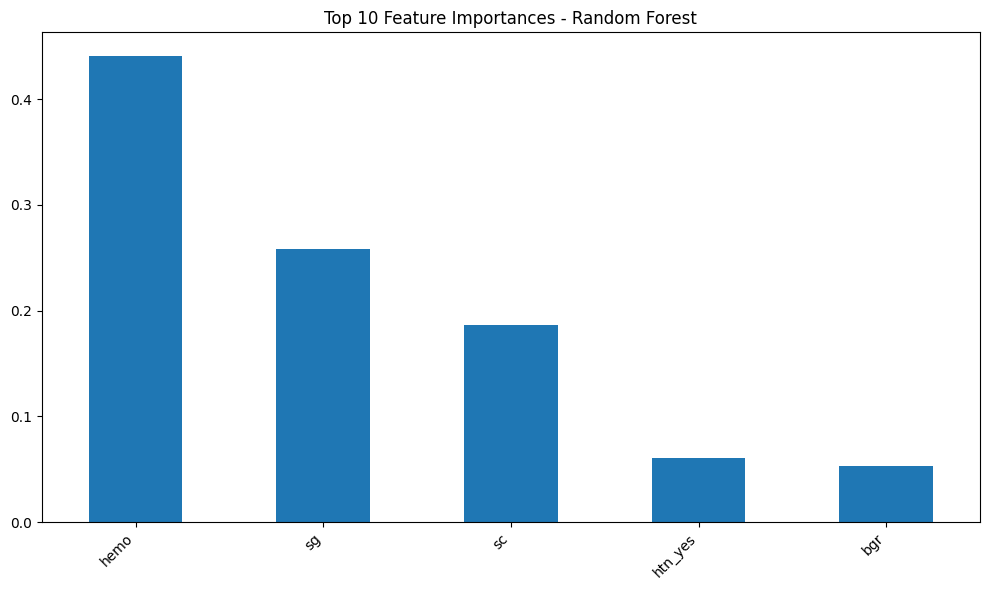

Generating Validation Curve Analysis...


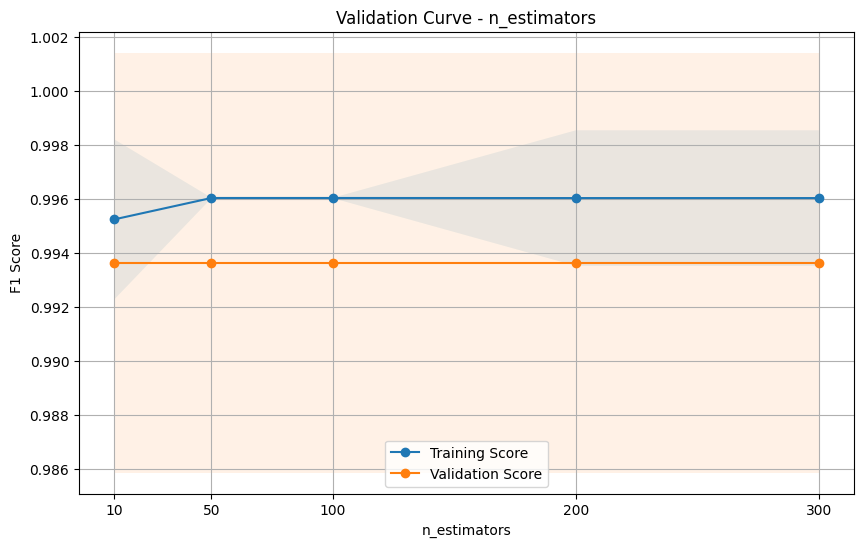

Completed analysis for Random Forest


ANALYZING: Extra Trees
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


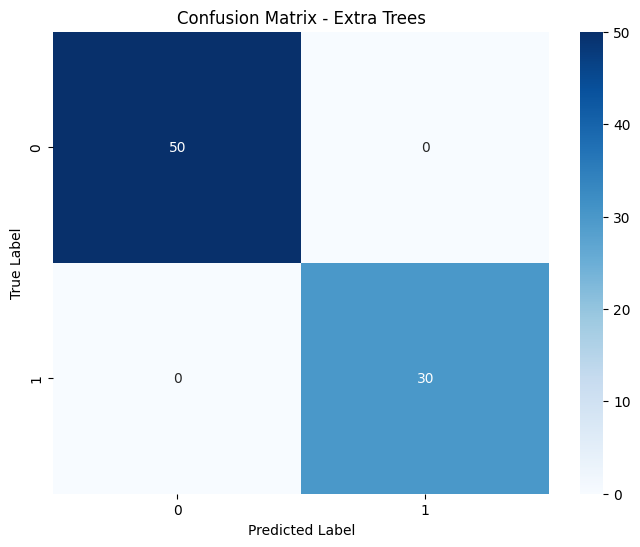

Generating ROC Curve...


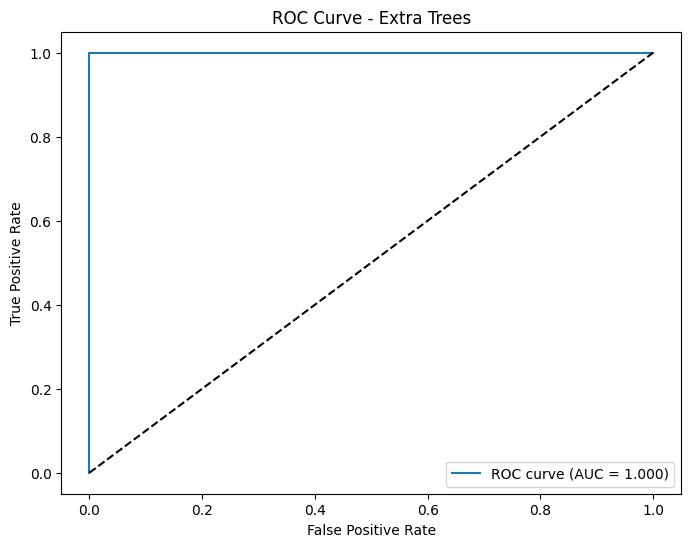

Generating Precision-Recall Curve...


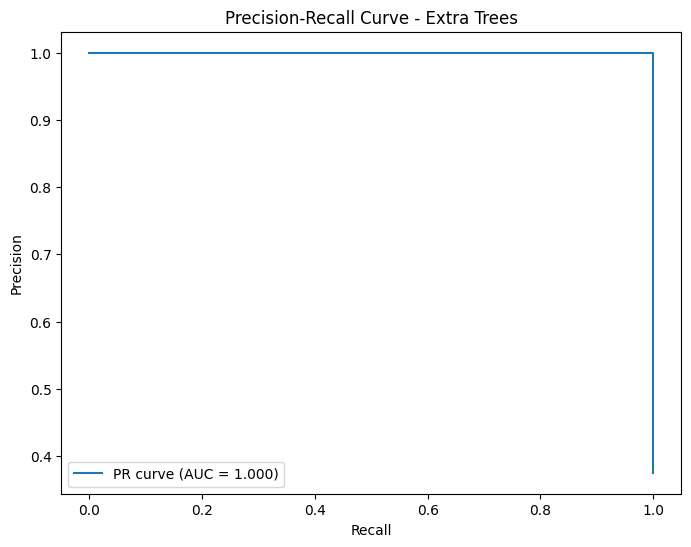

Generating Feature Importance Plot...


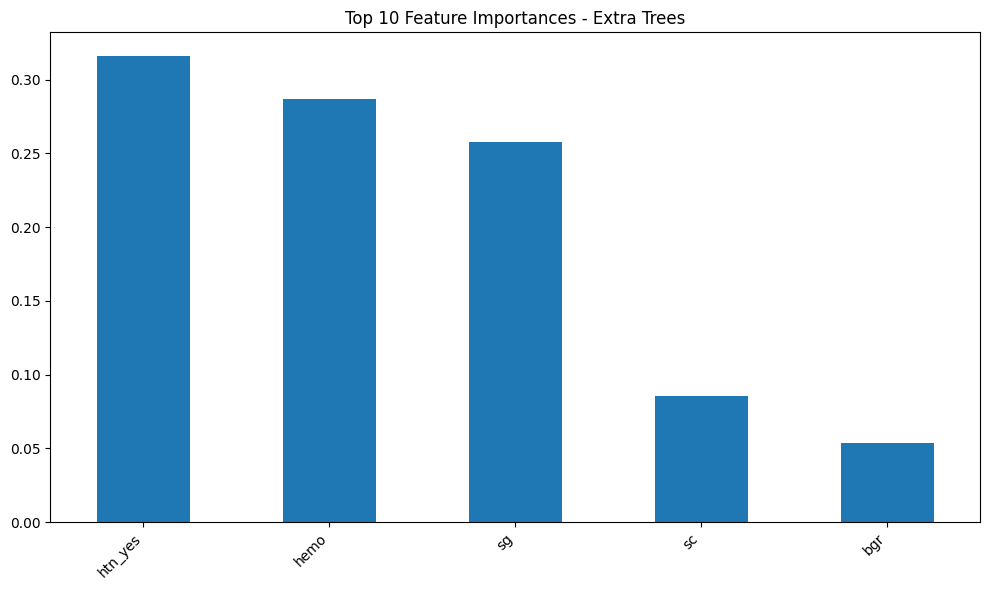

Generating Validation Curve Analysis...
Completed analysis for Extra Trees


ANALYZING: Gradient Boosting
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 1.0000

 Generating Confusion Matrix...


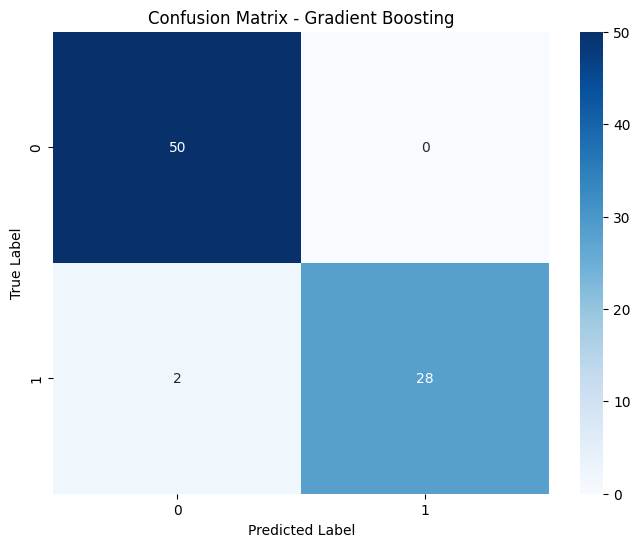

Generating ROC Curve...


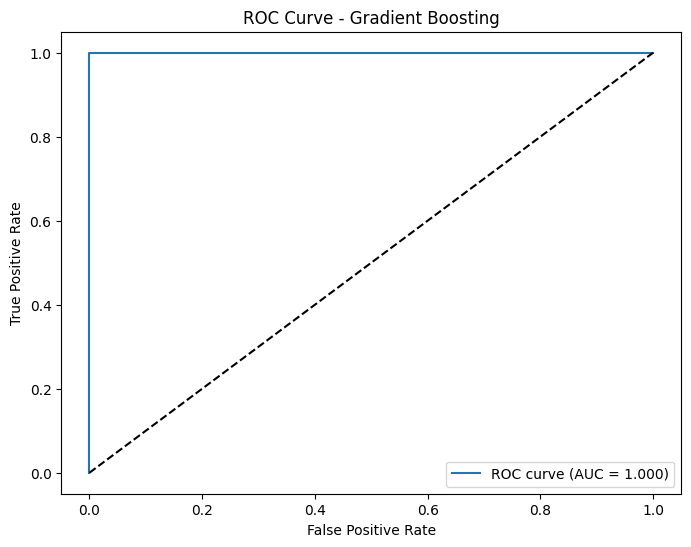

Generating Precision-Recall Curve...


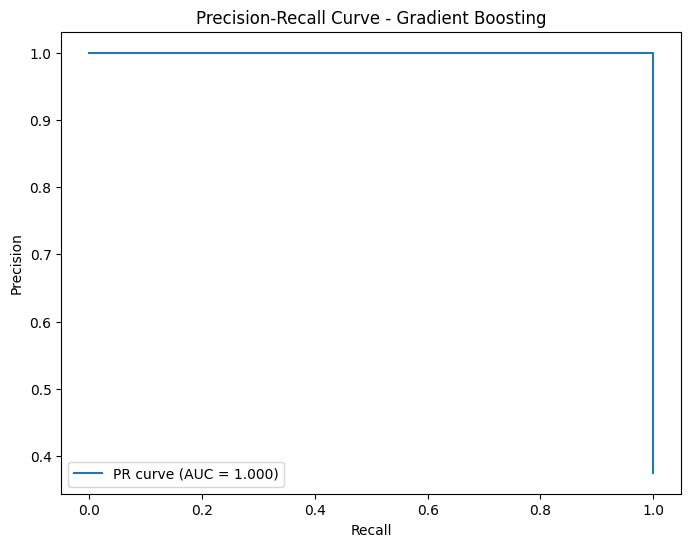

Generating Feature Importance Plot...


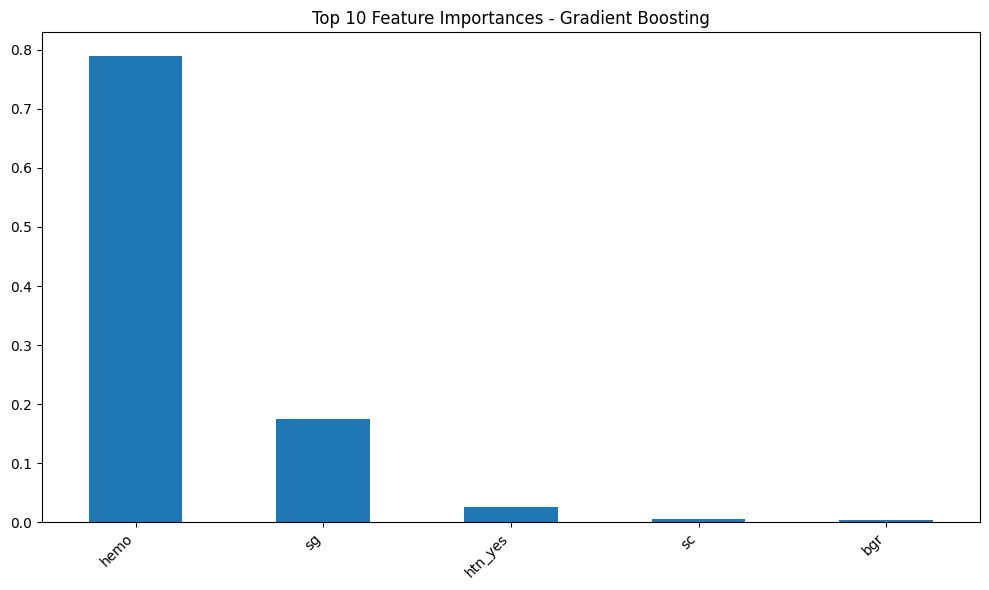

Generating Validation Curve Analysis...
Completed analysis for Gradient Boosting


ANALYZING: AdaBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9987

 Generating Confusion Matrix...


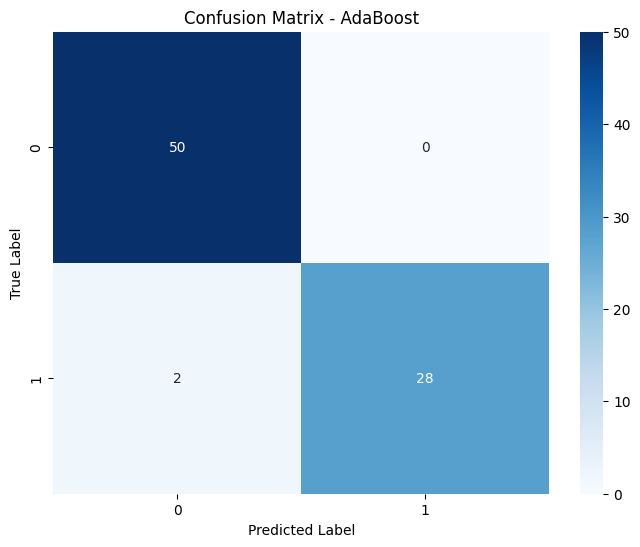

Generating ROC Curve...


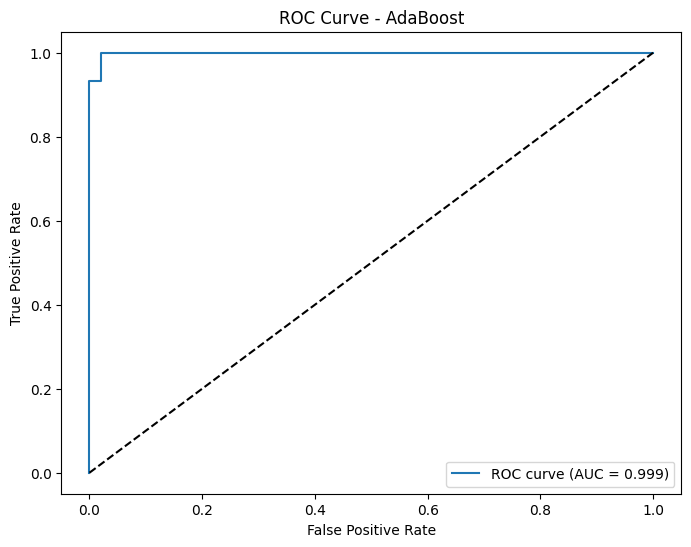

Generating Precision-Recall Curve...


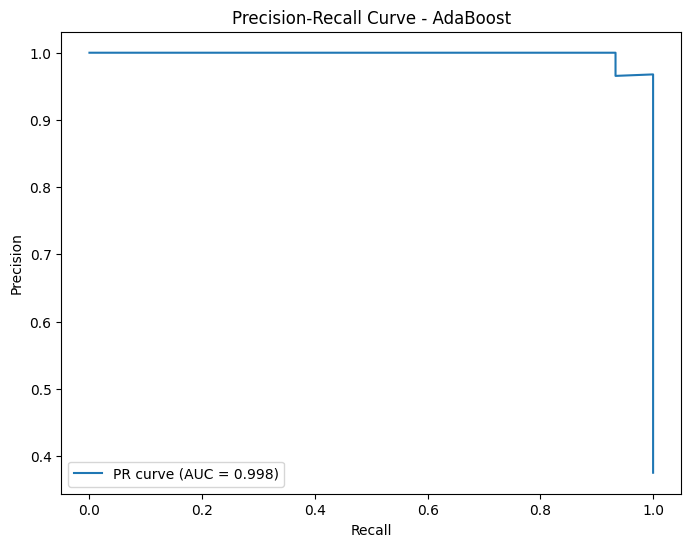

Generating Feature Importance Plot...


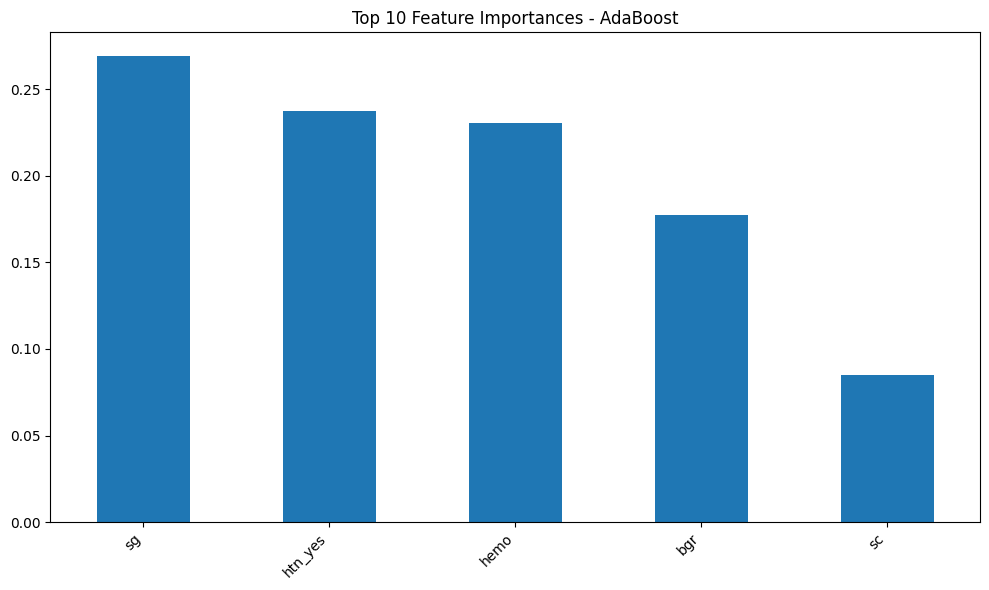

Generating Validation Curve Analysis...
Completed analysis for AdaBoost


ANALYZING: Bagging
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 1.0000

 Generating Confusion Matrix...


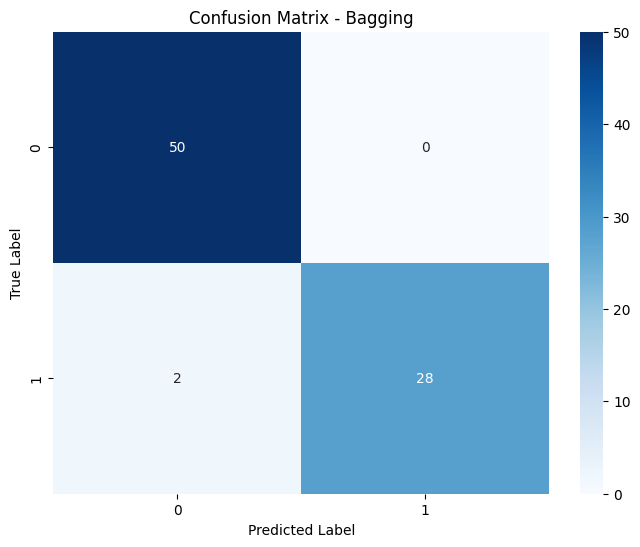

Generating ROC Curve...


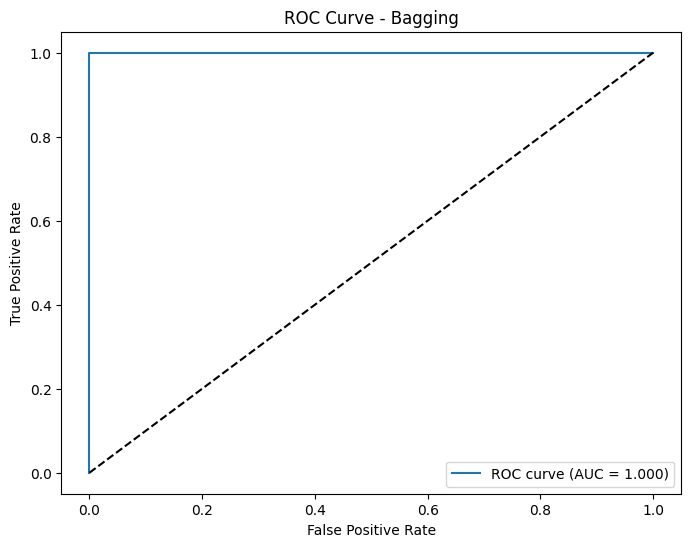

Generating Precision-Recall Curve...


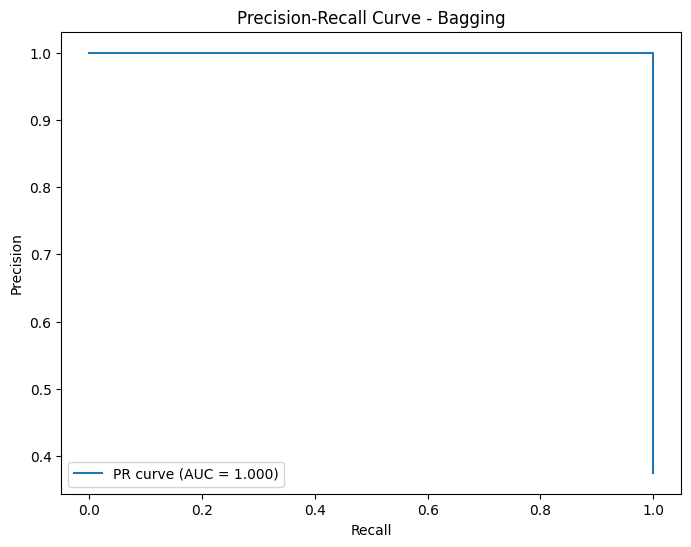

Generating Validation Curve Analysis...
Completed analysis for Bagging


ANALYZING: XGBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 1.0000

 Generating Confusion Matrix...


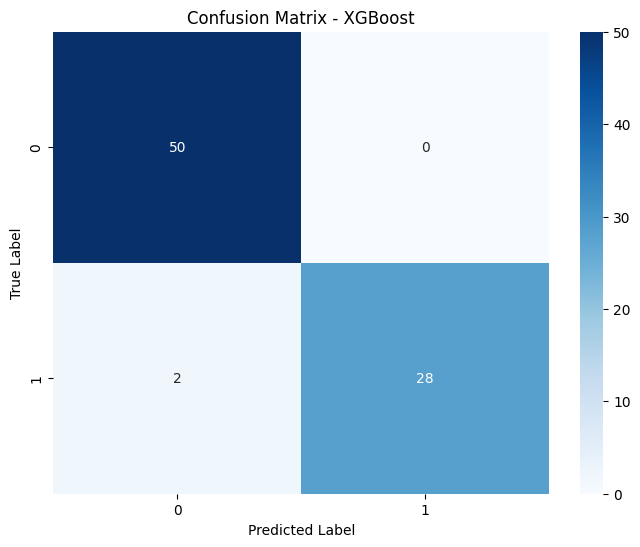

Generating ROC Curve...


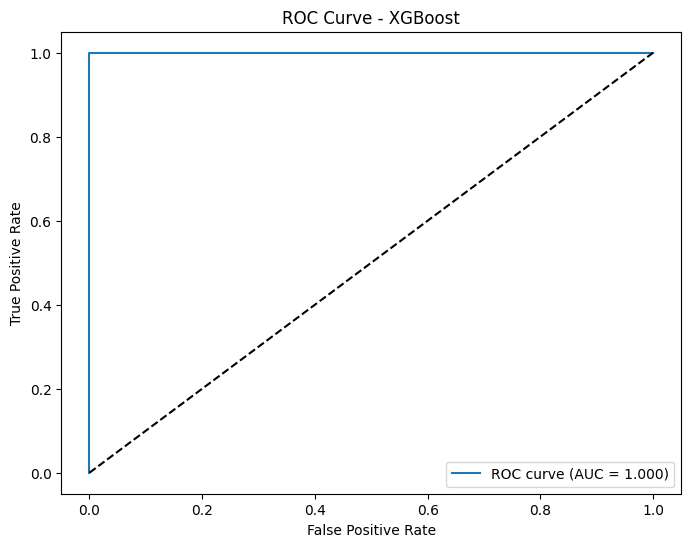

Generating Precision-Recall Curve...


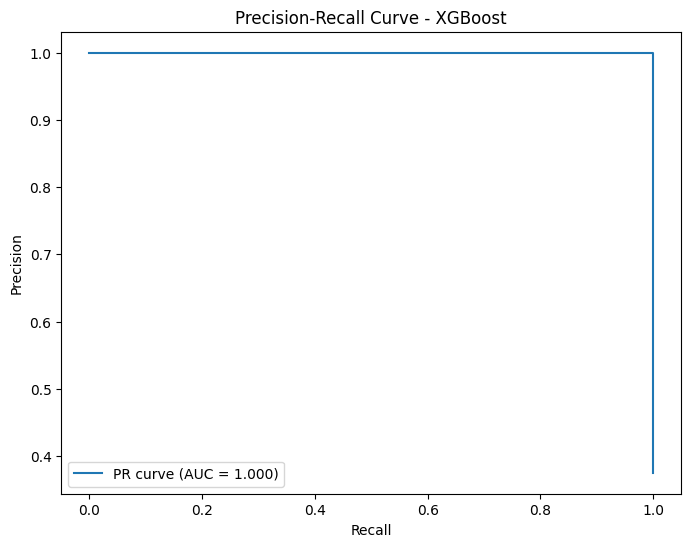

Generating Feature Importance Plot...


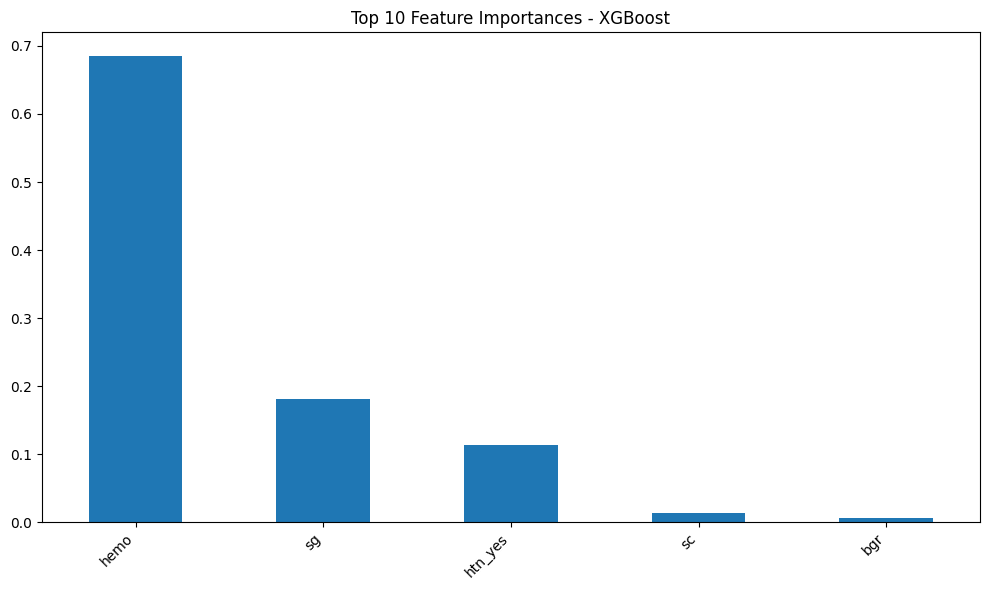

Generating Validation Curve Analysis...


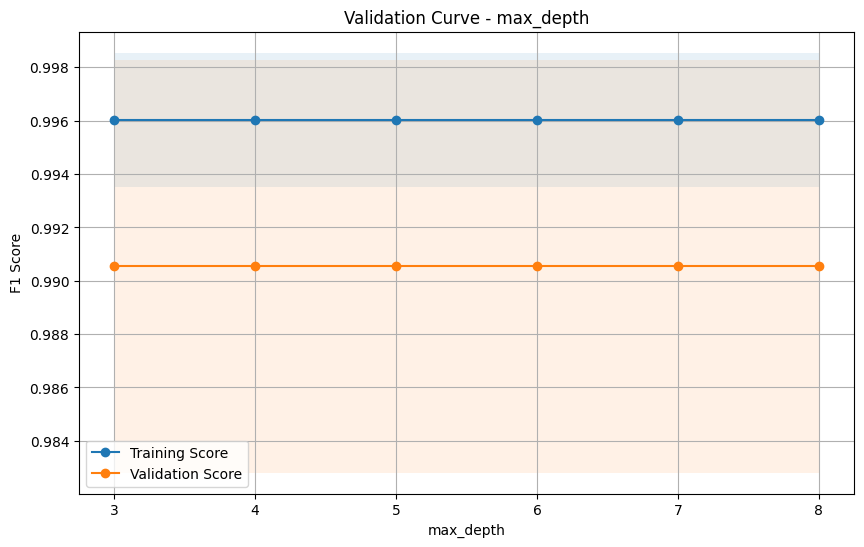

Completed analysis for XGBoost


ANALYZING: LightGBM
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 1.0000

 Generating Confusion Matrix...


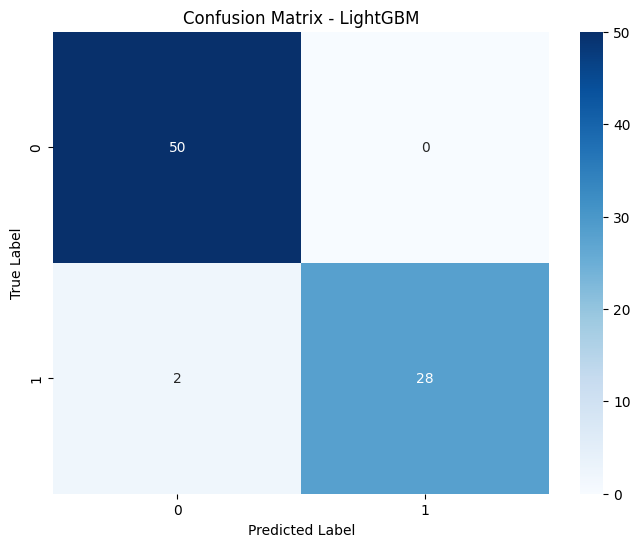

Generating ROC Curve...


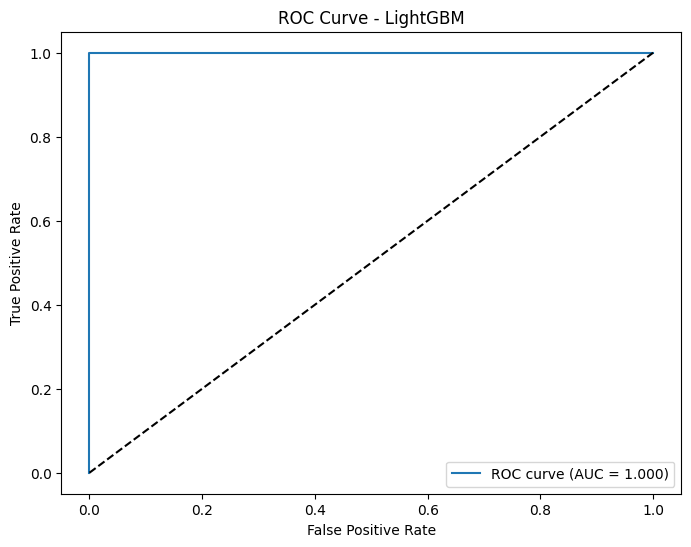

Generating Precision-Recall Curve...


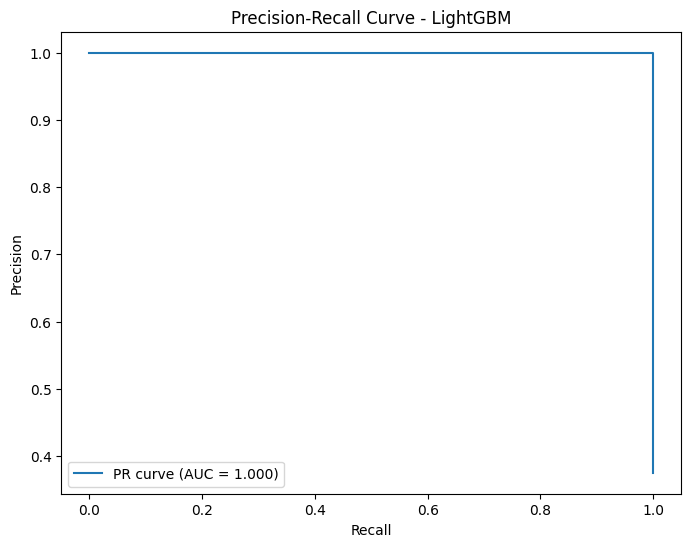

Generating Feature Importance Plot...


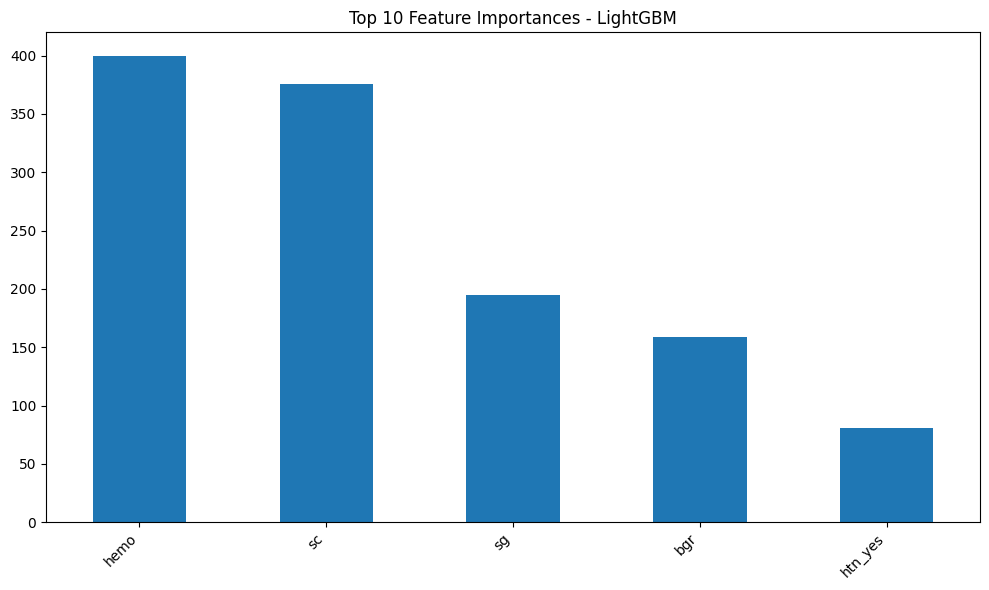

Generating Validation Curve Analysis...


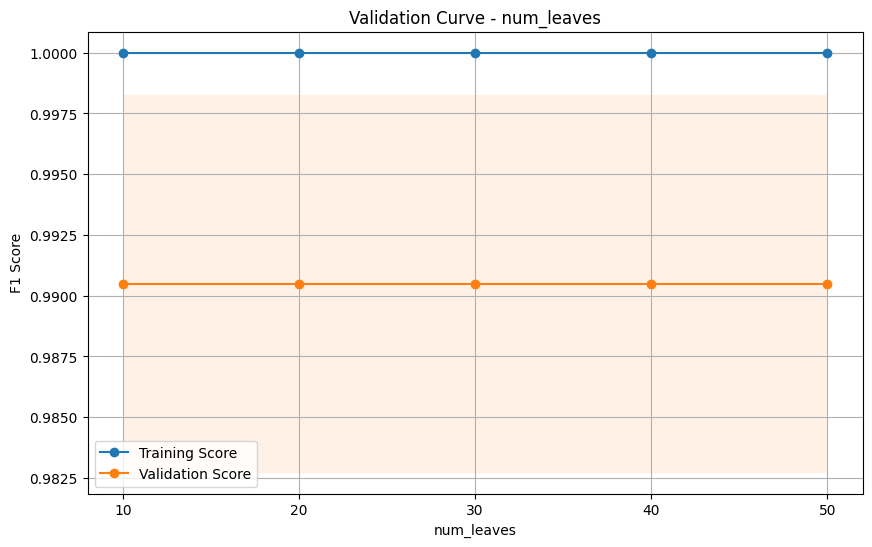

Completed analysis for LightGBM


ANALYZING: SVM (RBF)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


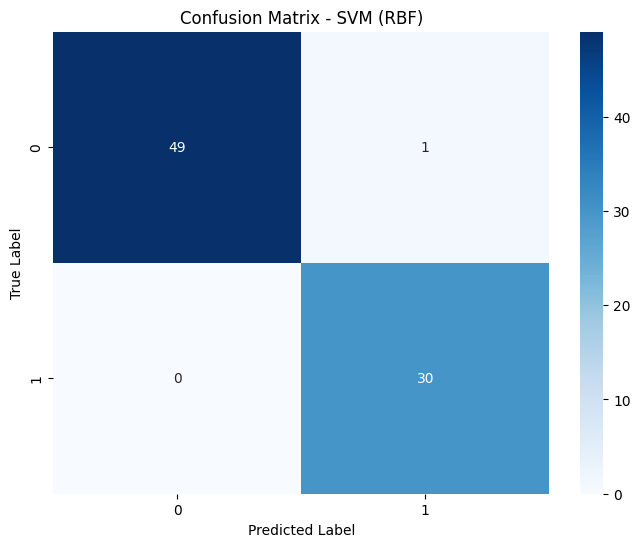

Generating ROC Curve...


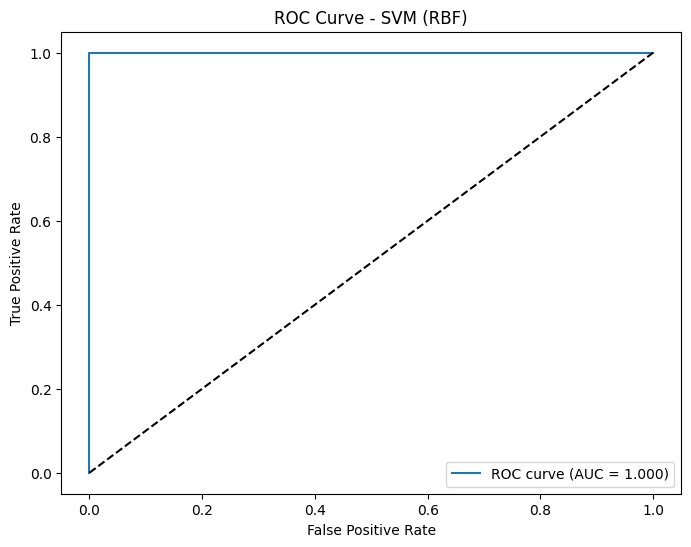

Generating Precision-Recall Curve...


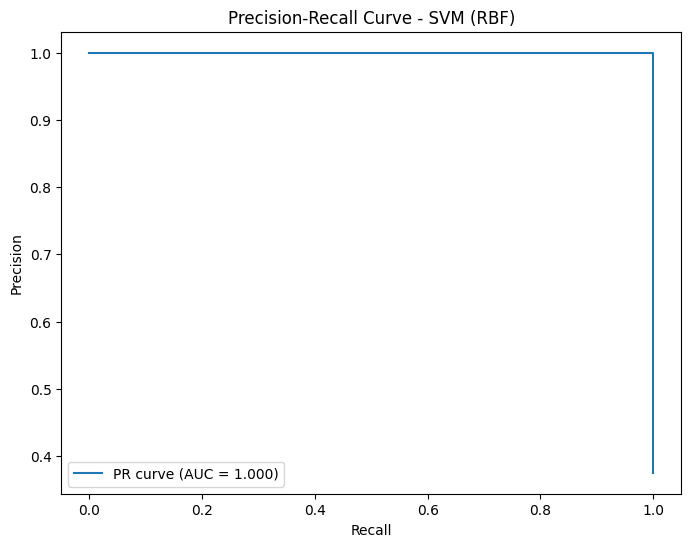

Generating Validation Curve Analysis...


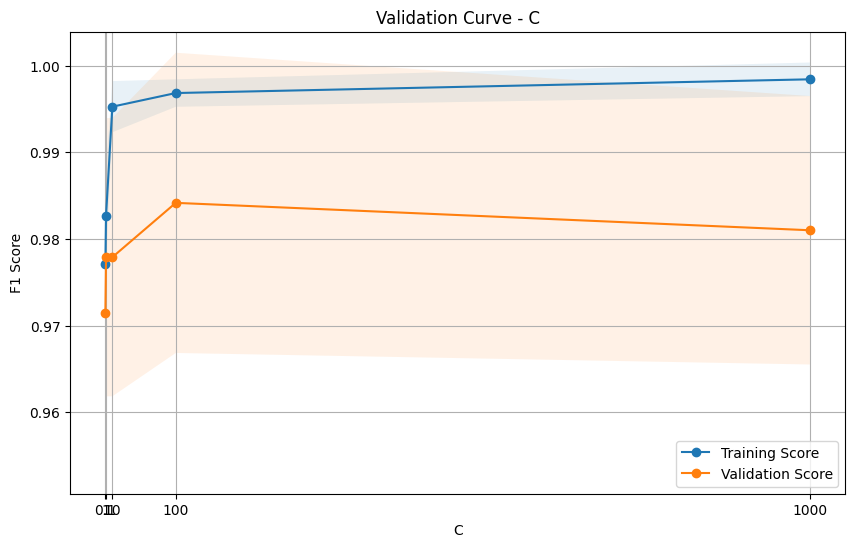

Completed analysis for SVM (RBF)


ANALYZING: SVM (Linear)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

 Generating Confusion Matrix...


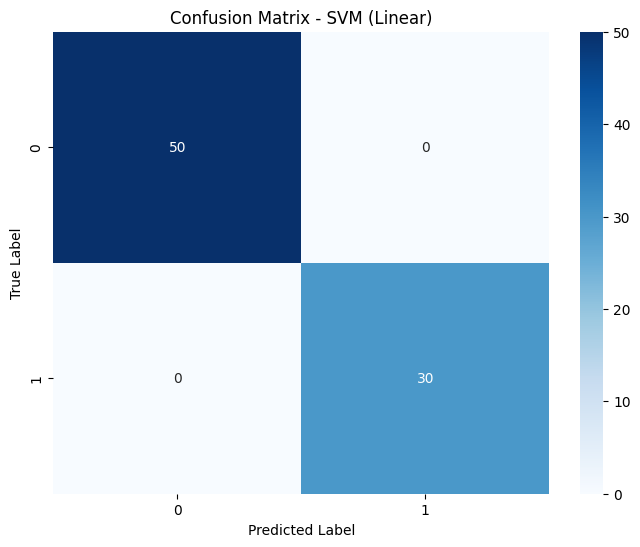

Generating ROC Curve...


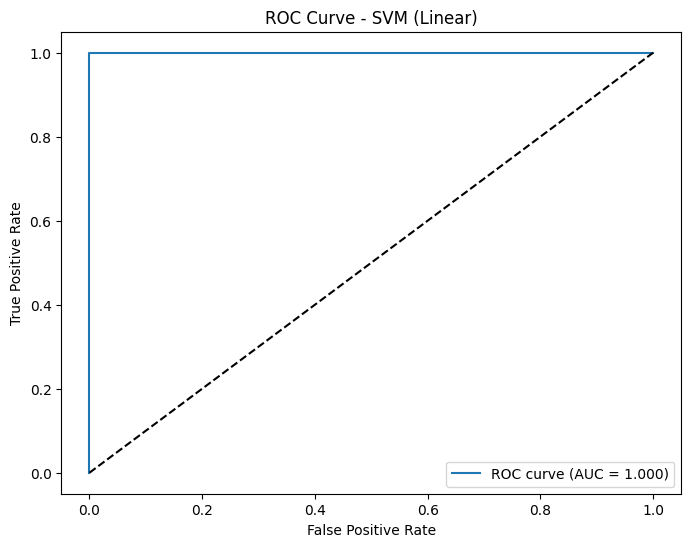

Generating Precision-Recall Curve...


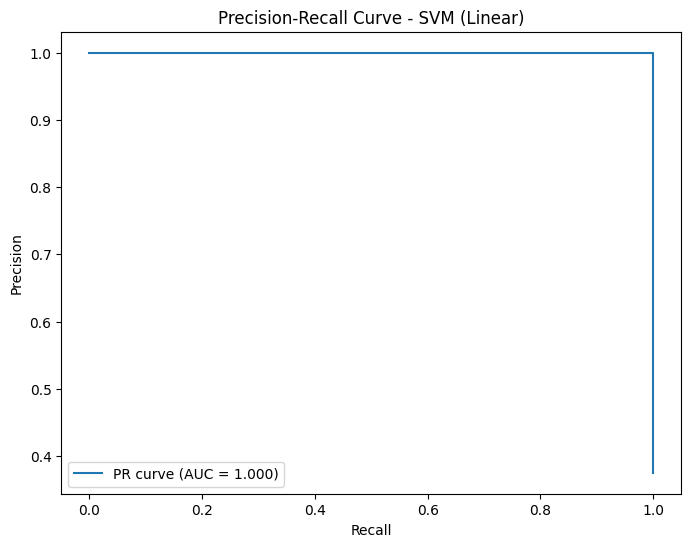

Generating Validation Curve Analysis...


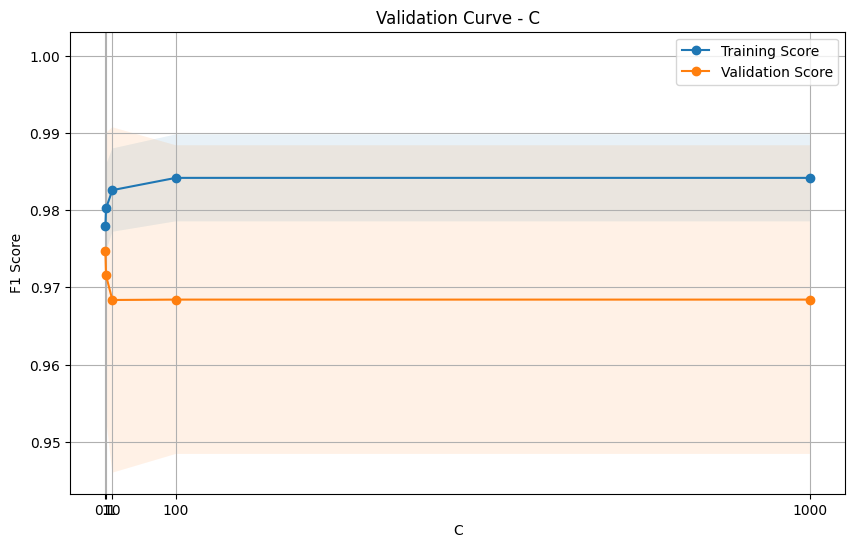

Completed analysis for SVM (Linear)


ANALYZING: SVM (Polynomial)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9125
   Precision: 0.9232
   Recall: 0.9125
   F1 Score: 0.9096
   ROC AUC: 1.0000

 Generating Confusion Matrix...


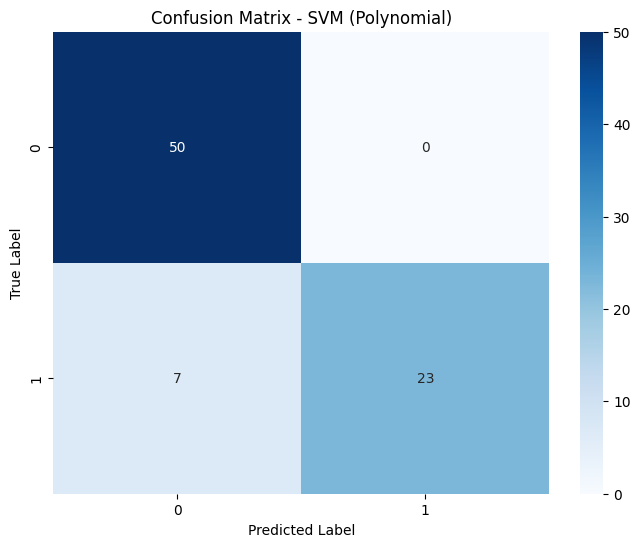

Generating ROC Curve...


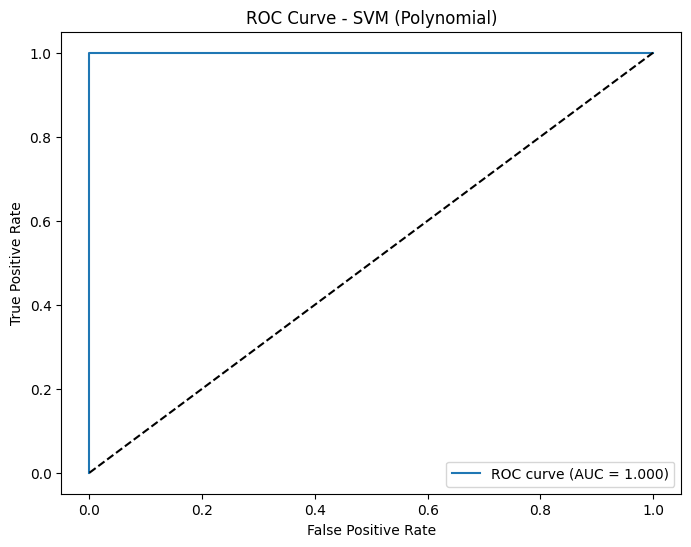

Generating Precision-Recall Curve...


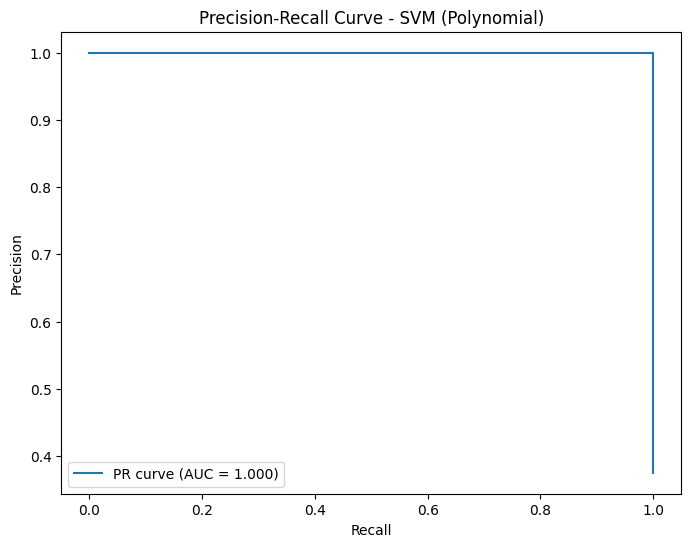

Generating Validation Curve Analysis...


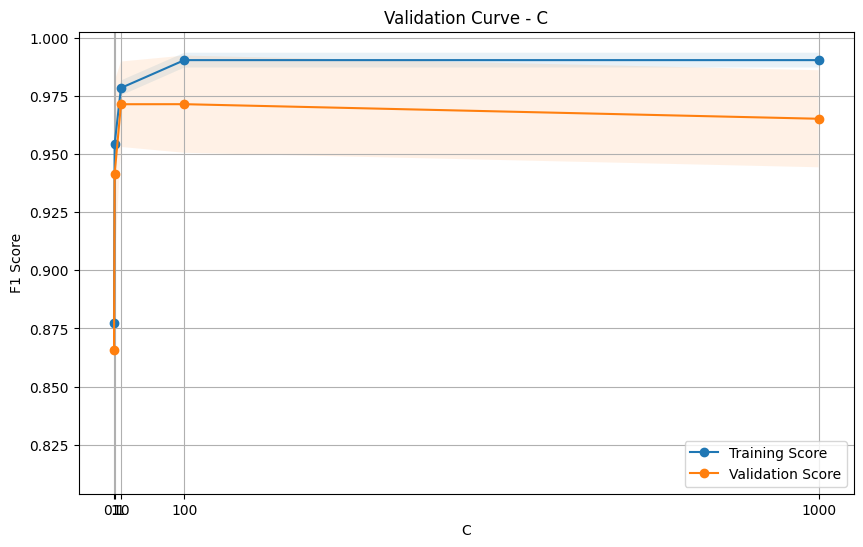

Completed analysis for SVM (Polynomial)


ANALYZING: K-Nearest Neighbors
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9625
   Precision: 0.9631
   Recall: 0.9625
   F1 Score: 0.9626
   ROC AUC: 0.9977

 Generating Confusion Matrix...


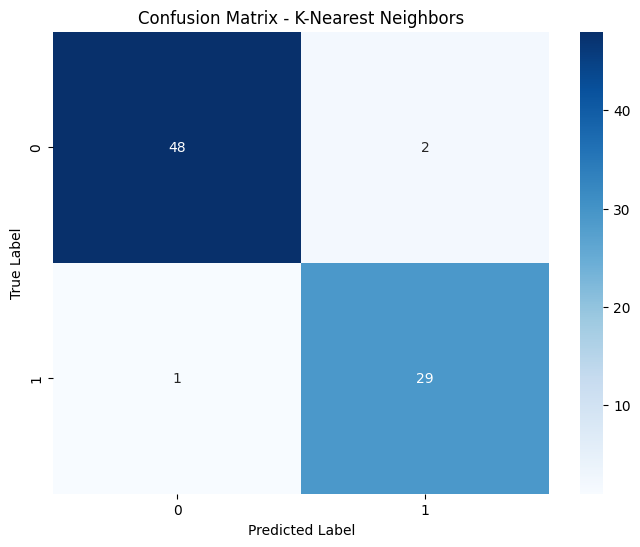

Generating ROC Curve...


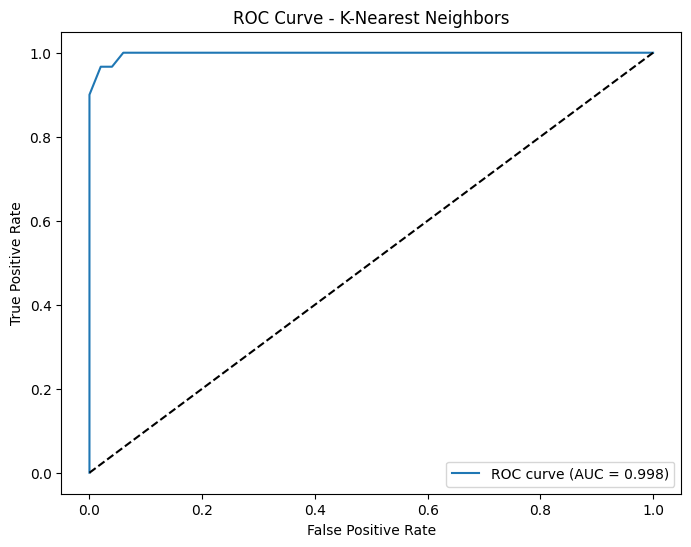

Generating Precision-Recall Curve...


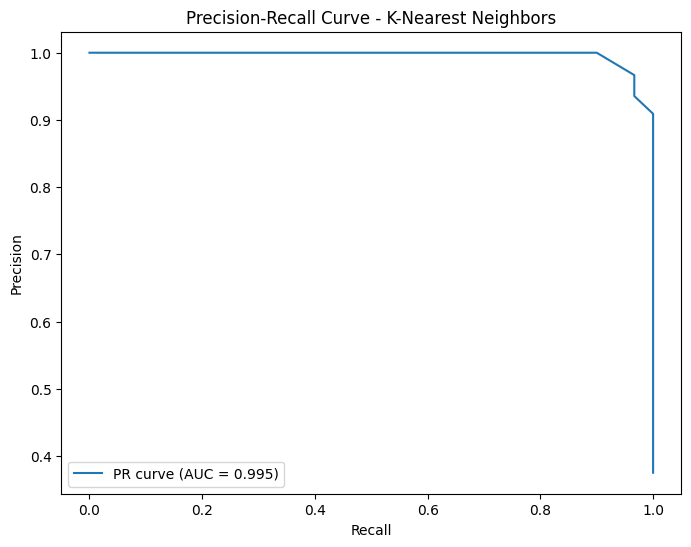

Generating Validation Curve Analysis...
Completed analysis for K-Nearest Neighbors


ANALYZING: Gaussian Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9125
   Precision: 0.9291
   Recall: 0.9125
   F1 Score: 0.9138
   ROC AUC: 1.0000

 Generating Confusion Matrix...


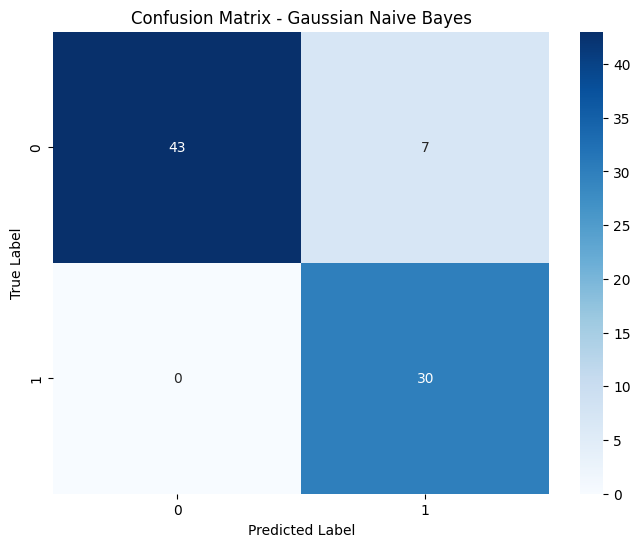

Generating ROC Curve...


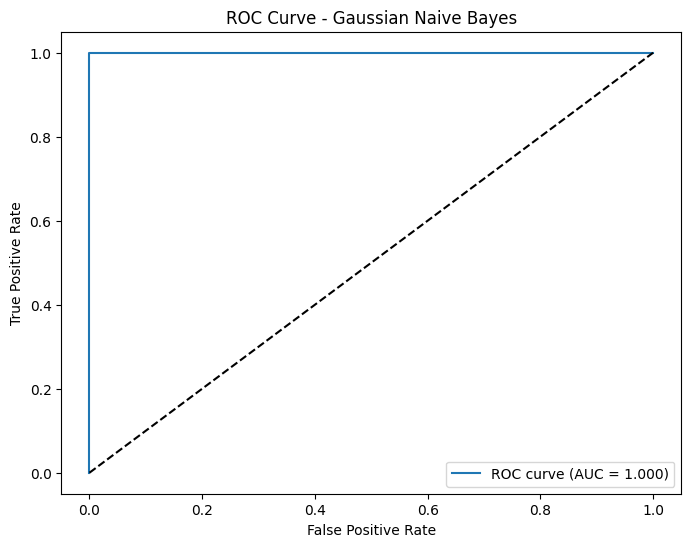

Generating Precision-Recall Curve...


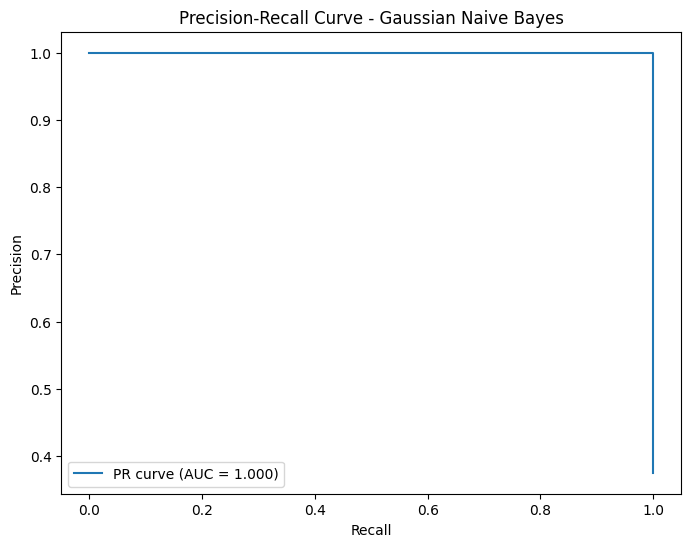

Generating Validation Curve Analysis...
Completed analysis for Gaussian Naive Bayes


ANALYZING: Bernoulli Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9987

 Generating Confusion Matrix...


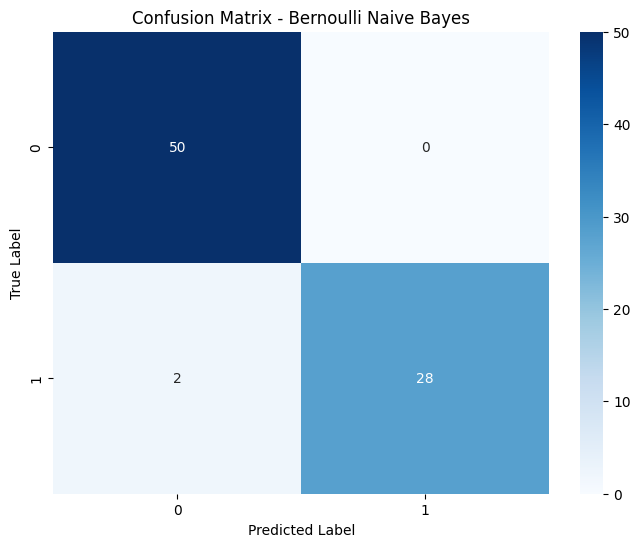

Generating ROC Curve...


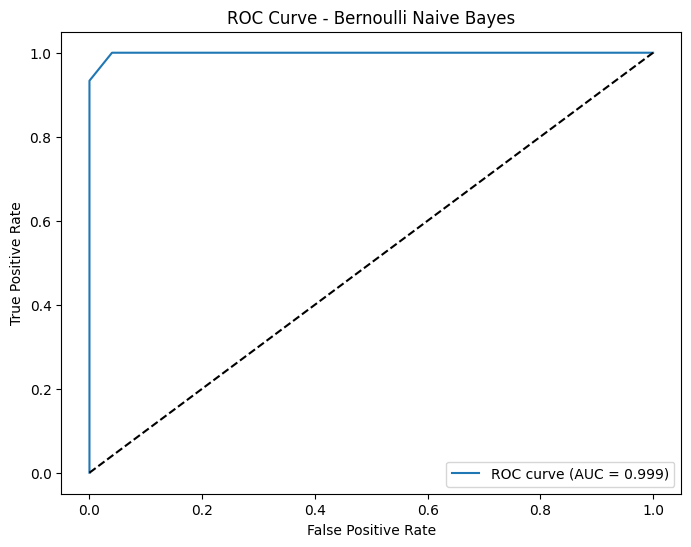

Generating Precision-Recall Curve...


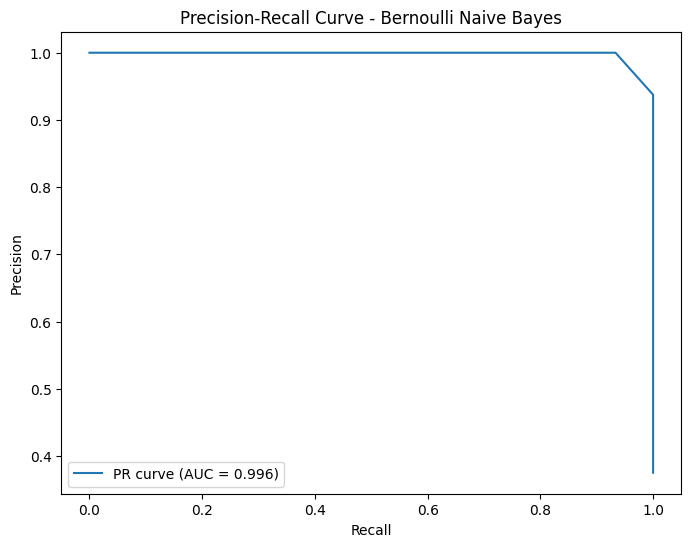

Generating Validation Curve Analysis...
Completed analysis for Bernoulli Naive Bayes


ANALYZING: Linear Discriminant Analysis
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


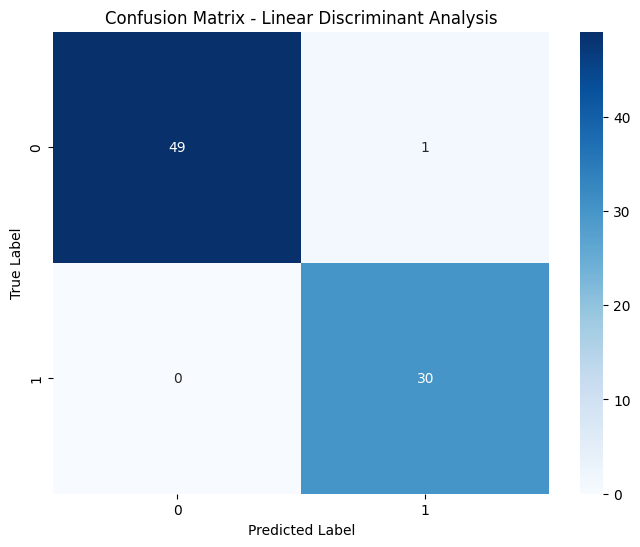

Generating ROC Curve...


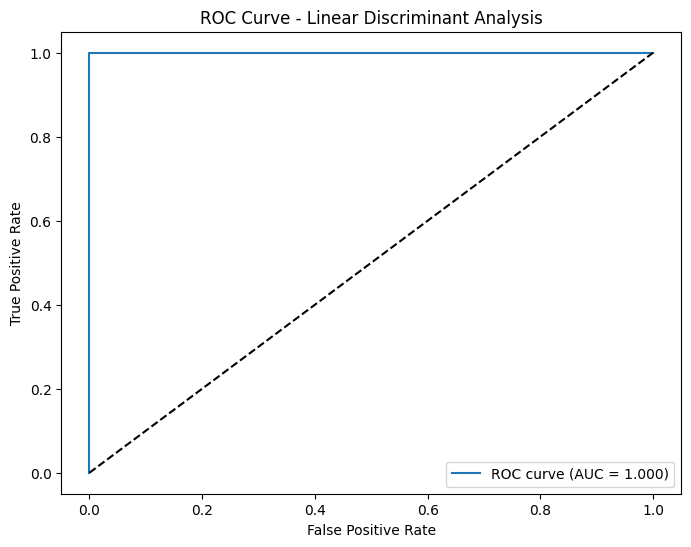

Generating Precision-Recall Curve...


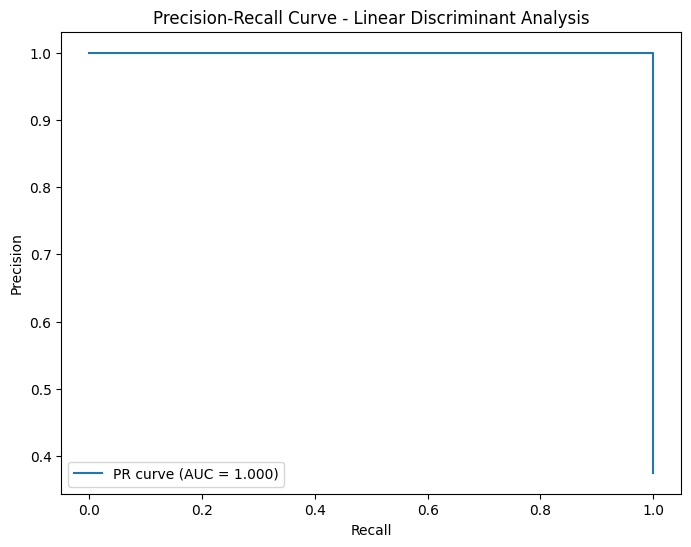

Generating Validation Curve Analysis...
Completed analysis for Linear Discriminant Analysis


ANALYZING: Multi-layer Perceptron
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9877
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

 Generating Confusion Matrix...


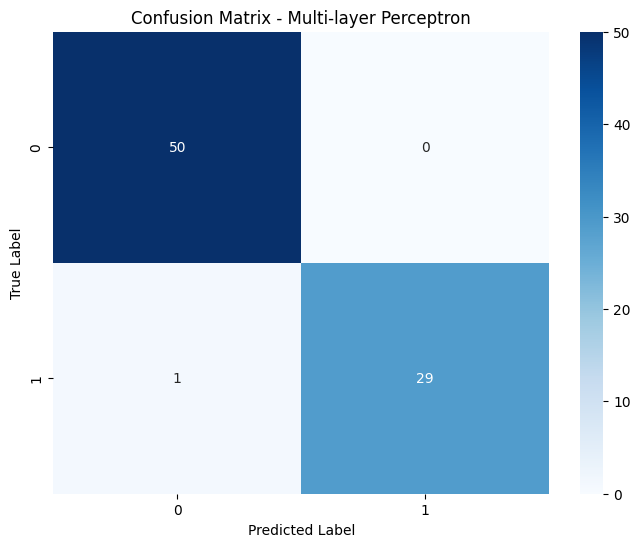

Generating ROC Curve...


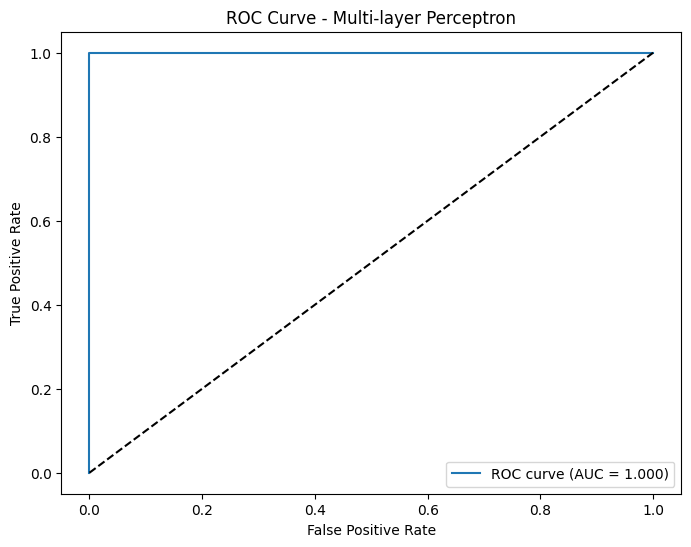

Generating Precision-Recall Curve...


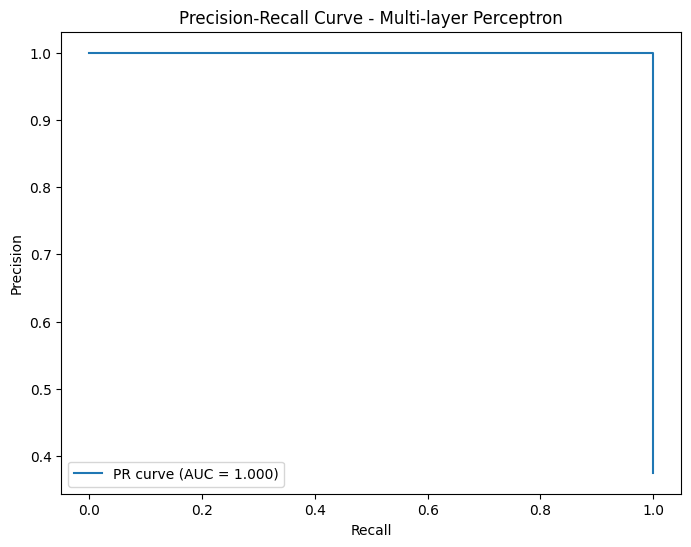

Generating Validation Curve Analysis...
Completed analysis for Multi-layer Perceptron


ANALYZING: Dummy Classifier (Stratified)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.5000
   Precision: 0.4858
   Recall: 0.5000
   F1 Score: 0.4918
   ROC AUC: 0.4533

 Generating Confusion Matrix...


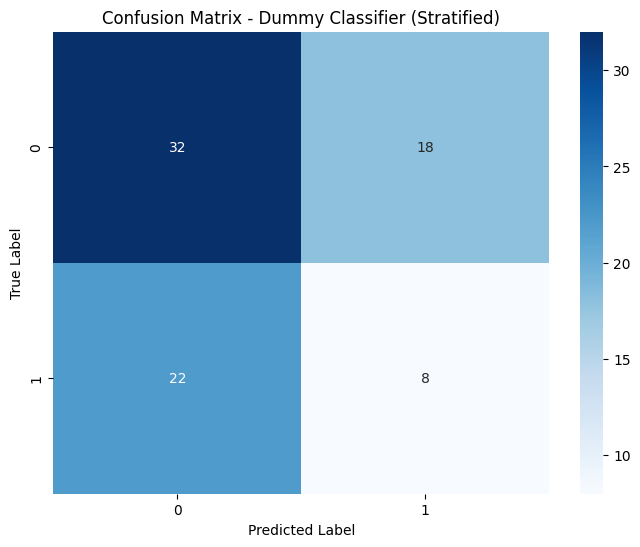

Generating ROC Curve...


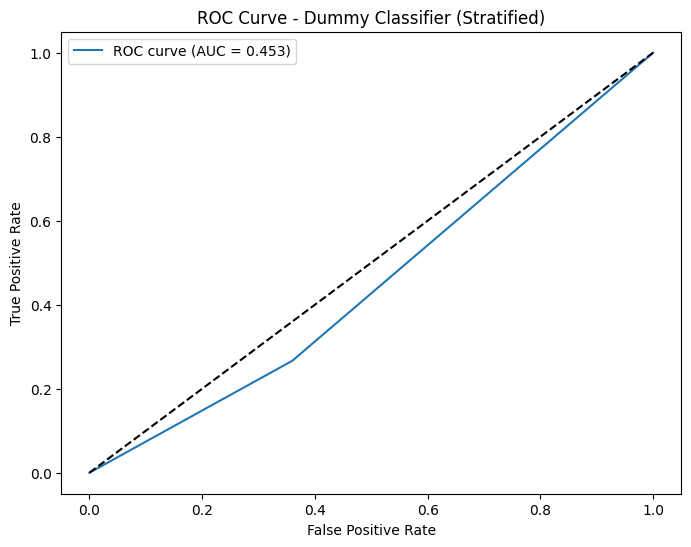

Generating Precision-Recall Curve...


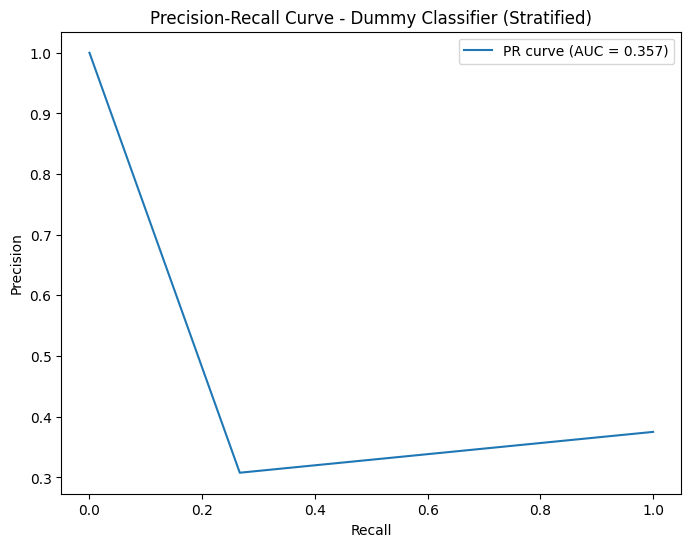

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Stratified)


ANALYZING: Dummy Classifier (Most Frequent)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.6250
   Precision: 0.3906
   Recall: 0.6250
   F1 Score: 0.4808
   ROC AUC: 0.5000

 Generating Confusion Matrix...


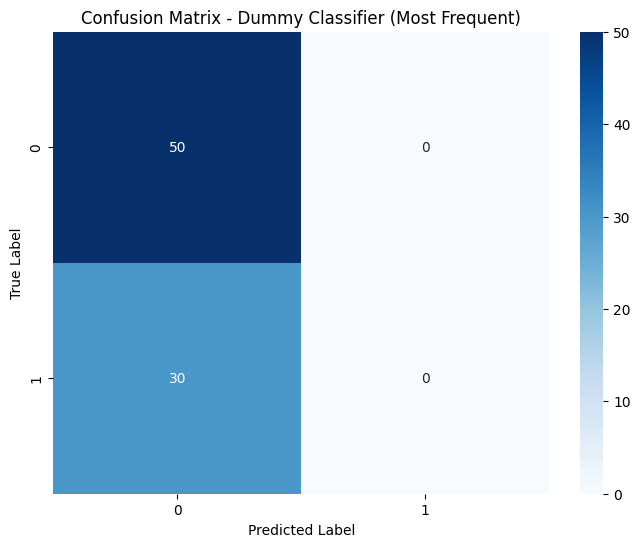

Generating ROC Curve...


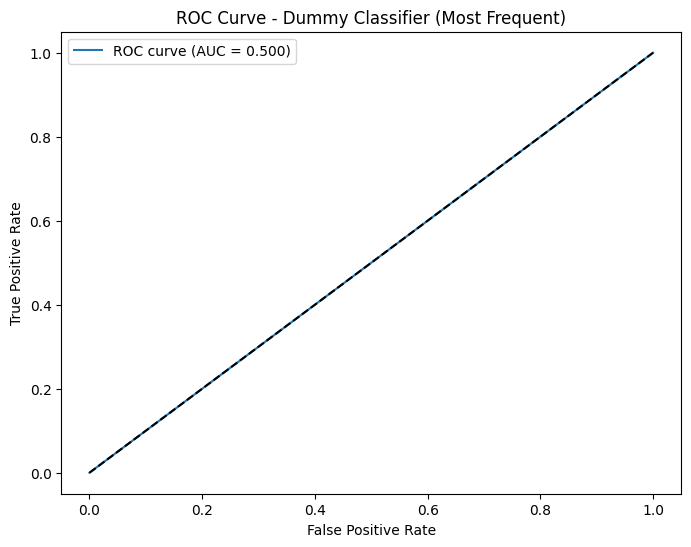

Generating Precision-Recall Curve...


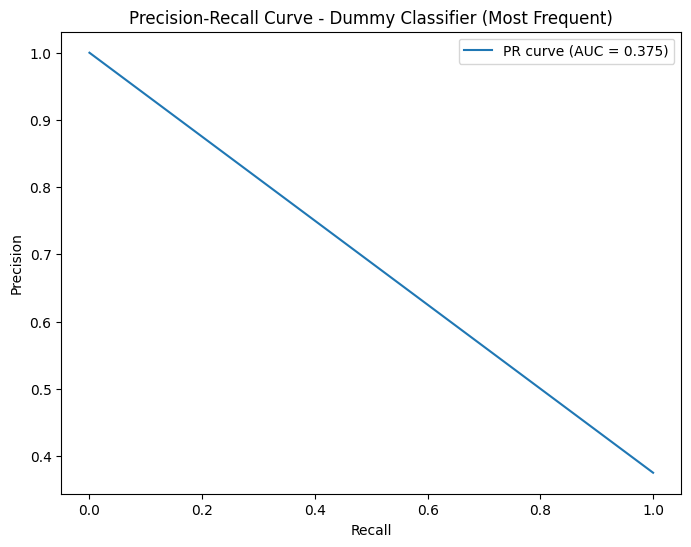

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Most Frequent)


OVERFITTING RISK SUMMARY

Critical CRITICAL OVERFITTING RISK (8 models):
------------------------------------------------------------
   • Logistic Regression (L2)
     Score: 0.800
     - Perfect test score detected (99.9%+) - possible data leakage

   • Extra Trees
     Score: 0.800
     - Perfect test score detected (99.9%+) - possible data leakage

   • Gradient Boosting
     Score: 1.000
     - High confidence predictions: 100.0% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • AdaBoost
     Score: 0.926
     - Perfect training score detected (99.9%+) - highly suspicious

   • Bagging
     Score: 1.000
     - High confidence predictions: 97.2% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • LightGBM
     Score: 1.000
     - High confide

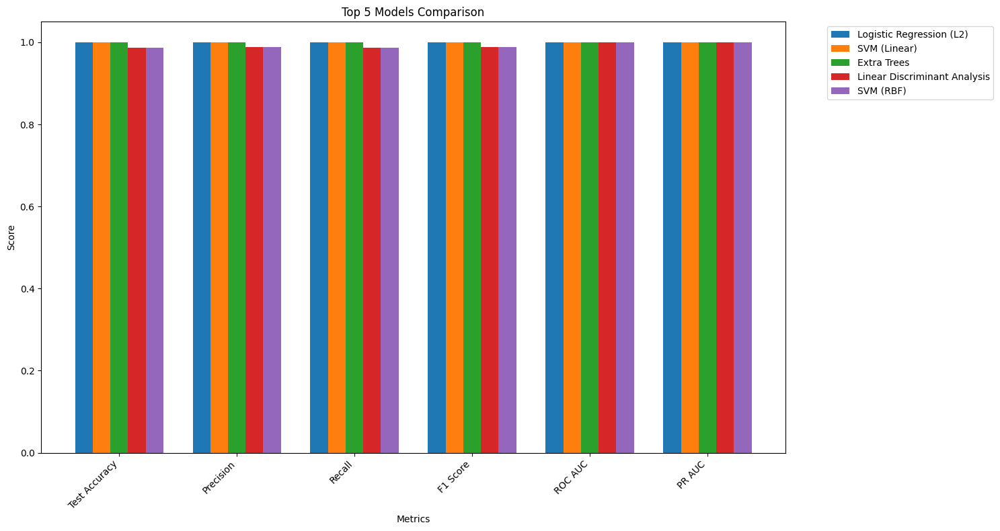

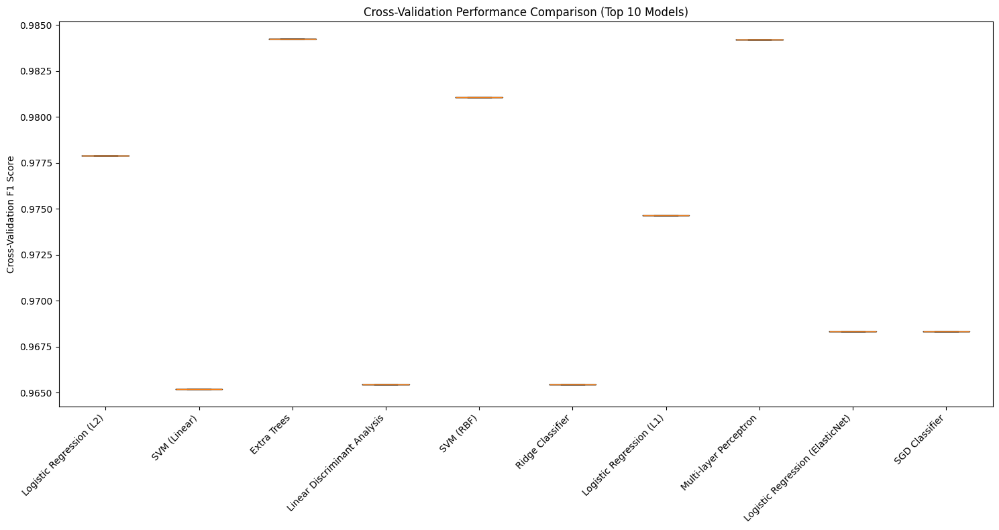


FINAL HEALTHCARE RECOMMENDATIONS
RECOMMENDED MODEL: SVM (Linear)
   Healthcare Score: 2.0605
   Recall (Sensitivity): 1.0000
   Precision: 1.0000
   F1 Score: 1.0000
   Overfitting Risk: CRITICAL

TOP 3 SAFE MODELS FOR HEALTHCARE:
   1. Random Forest (Score: 1.2108, Risk: MEDIUM)
   2. XGBoost (Score: 1.2001, Risk: MEDIUM)
   3. Decision Tree (Score: 1.1970, Risk: MEDIUM)

MODELS TO AVOID IN HEALTHCARE:
  SVM (Linear)
  Bagging
  LightGBM
  Gradient Boosting
  AdaBoost

 GENERATING ADDITIONAL ANALYSIS PLOTS...


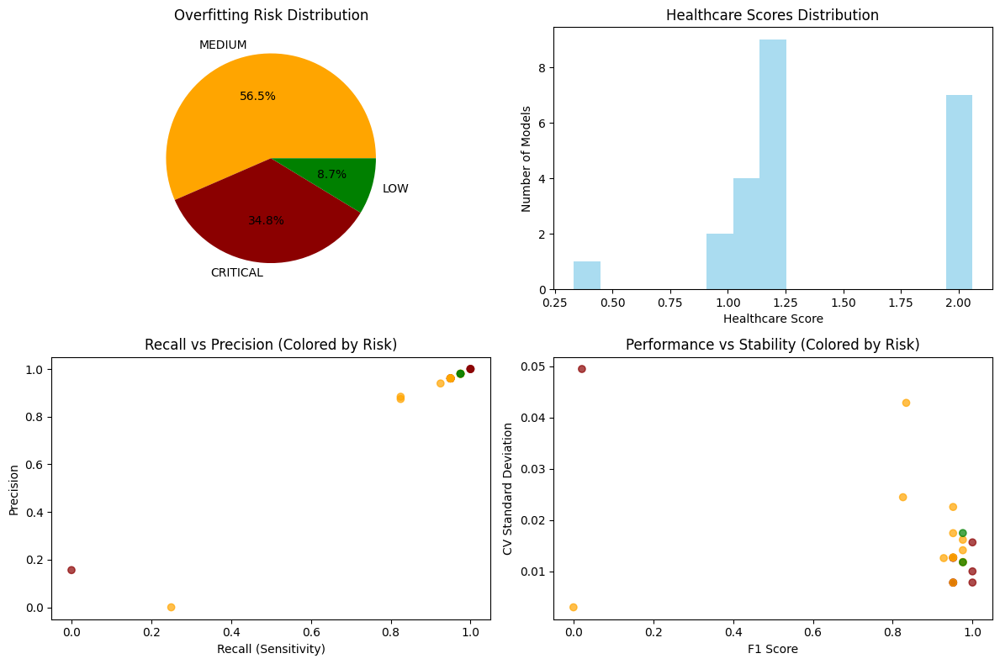

In [84]:
v2_results = run_healthcare_ml_pipeline(X_train_imp2, X_test_imp2, y_train_imp2, y_test_imp2)


In [85]:
print(v2_results)

{'results': {'Logistic Regression (L1)': {'Model': 'Logistic Regression (L1)', 'Train F1': 0.9746835443037974, 'CV Mean F1': np.float64(0.97465029301764), 'CV Std F1': np.float64(0.016145873021178026), 'Overfitting Gap': -0.012772404680931548, 'Overfitting Score': 0.3, 'Overfitting Risk': 'MEDIUM', 'Test Accuracy': 0.9875, 'Precision': 0.9877450980392156, 'Recall': 0.9875, 'F1 Score': 0.987455948984729, 'ROC AUC': 1.0, 'PR AUC': 0.9999999999999999}, 'Logistic Regression (L2)': {'Model': 'Logistic Regression (L2)', 'Train F1': 0.9842138733920106, 'CV Mean F1': np.float64(0.9779064913718816), 'CV Std F1': np.float64(0.007793412579184252), 'Overfitting Gap': -0.015786126607989392, 'Overfitting Score': 0.8, 'Overfitting Risk': 'CRITICAL', 'Test Accuracy': 1.0, 'Precision': 1.0, 'Recall': 1.0, 'F1 Score': 1.0, 'ROC AUC': 1.0, 'PR AUC': 0.9999999999999999}, 'Logistic Regression (ElasticNet)': {'Model': 'Logistic Regression (ElasticNet)', 'Train F1': 0.9778299414587116, 'CV Mean F1': np.float

## (II) With Hyperparameter tuning

### Version 0


HEALTHCARE ML ANALYSIS PIPELINE
Kidney Disease Detection - Enhanced with Hyperparameter Tuning
   Dataset Info:
   Training samples: 316
   Test samples: 80
   Features: 31
   Classes: 2
   Class distribution: {np.int64(0): np.int64(196), np.int64(1): np.int64(120)}

HEALTHCARE-OPTIMIZED HYPERPARAMETER TUNING
Optimizing for Minimal False Negatives in Kidney Disease Detection

TUNING PRIORITY MODELS (Healthcare Critical):

HEALTHCARE HYPERPARAMETER TUNING: Random Forest
----------------------------------------------------------------------
   Primary Objective: Maximize Recall (Minimize False Negatives)
   Secondary Objective: Minimize Overfitting
   Cross-Validation Folds: 5
   Scoring Metric: recall
   Parameter combinations to test: 81920
   Search Strategy: RandomizedSearchCV (n_iter=100)
   Training in progress...

HYPERPARAMETER TUNING RESULTS:
   Best RECALL Score (CV): 0.9917
   Training Score: 0.9917
   Overfitting Gap: 0.0000
   Overfitting Ratio: 0.0000
   Low risk Overfitti

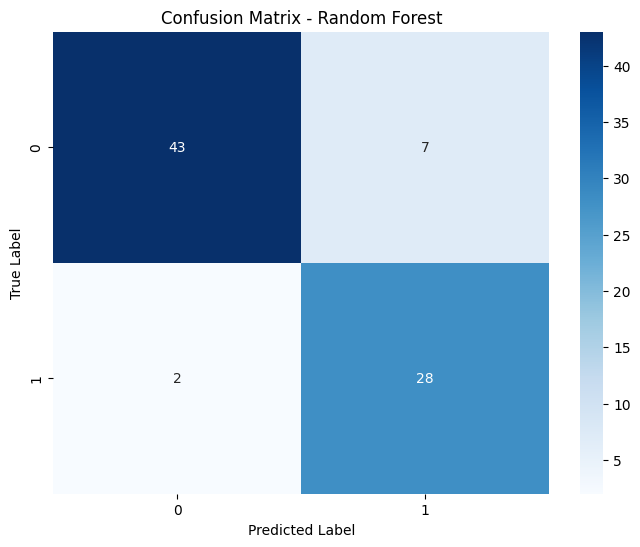

Generating ROC Curve...


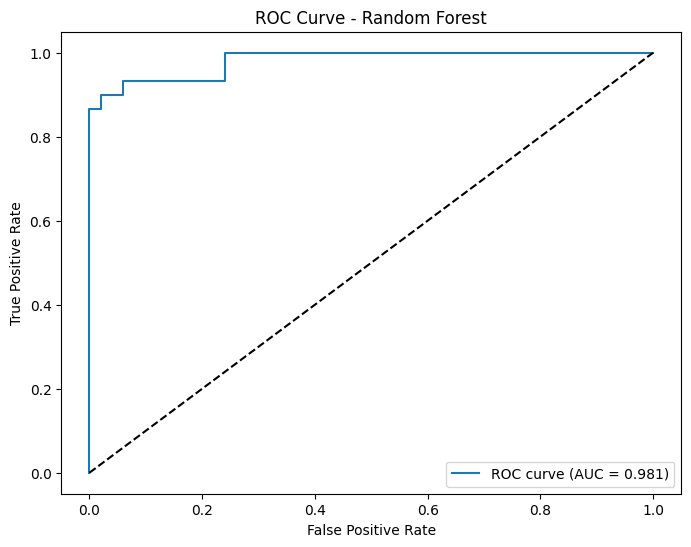

Generating Precision-Recall Curve...


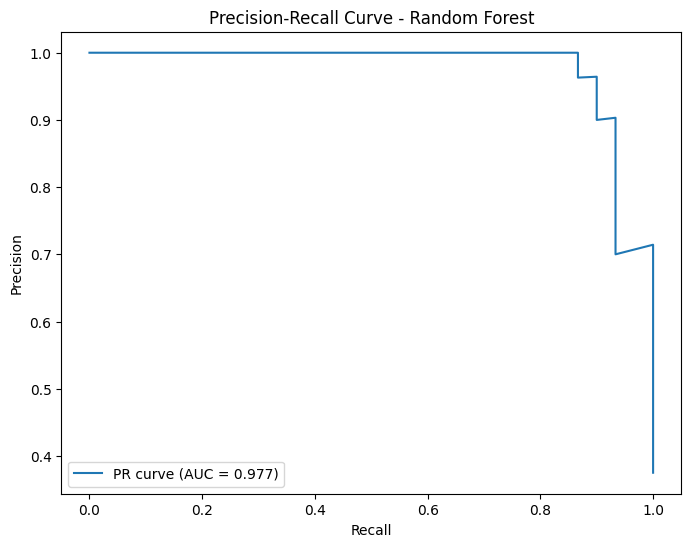

Generating Feature Importance Plot...


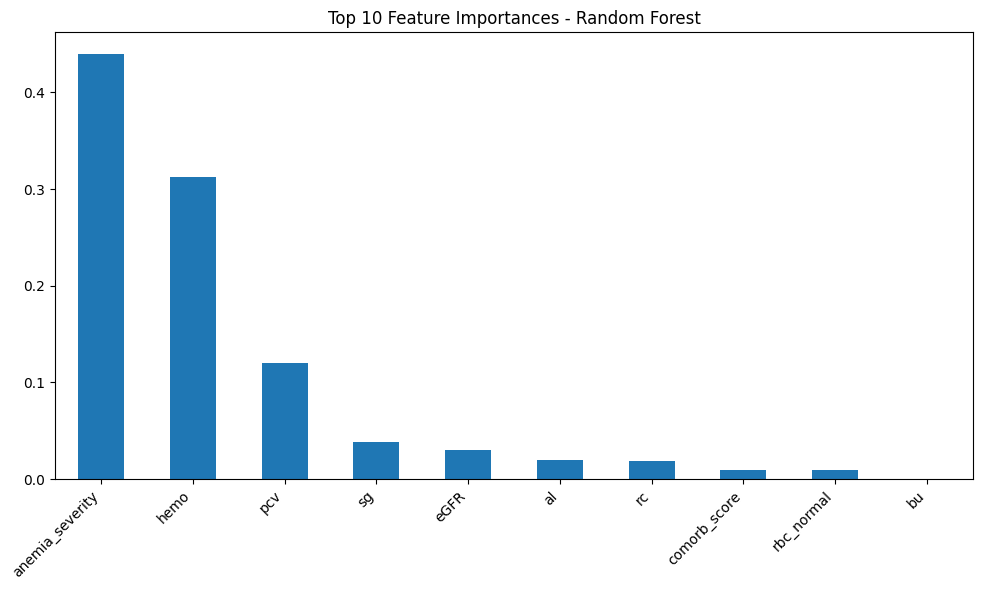

Generating Validation Curve Analysis...


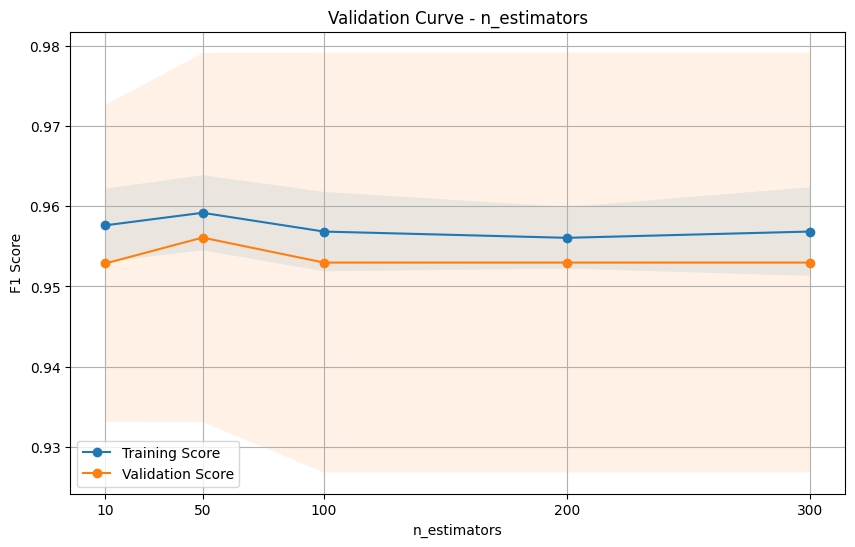

Completed analysis for Random Forest


 ANALYZING: XGBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9625
   Precision: 0.9626
   Recall: 0.9625
   F1 Score: 0.9624
   ROC AUC: 0.9933

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 0.9
scale_pos_weight: 1
reg_lambda: 10

Generating Confusion Matrix...


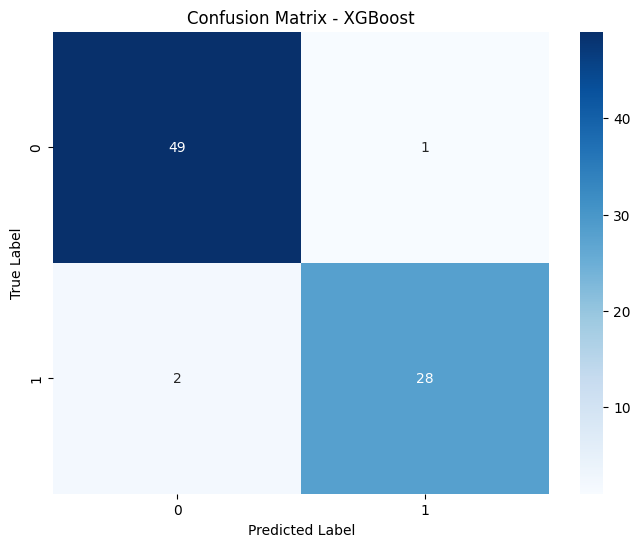

Generating ROC Curve...


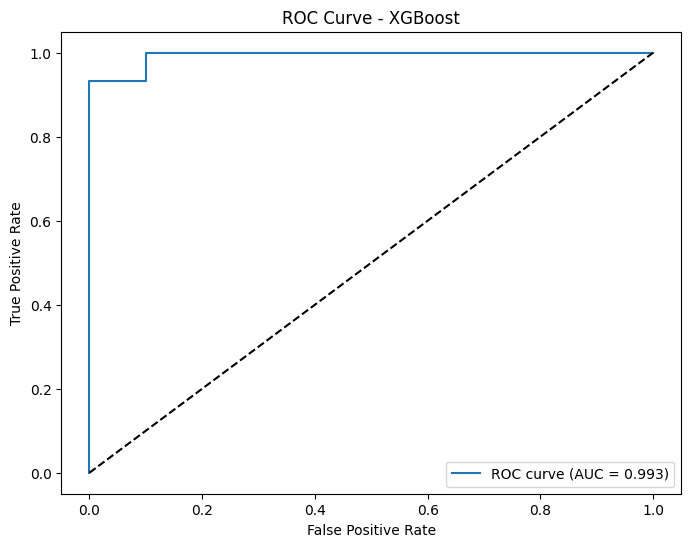

Generating Precision-Recall Curve...


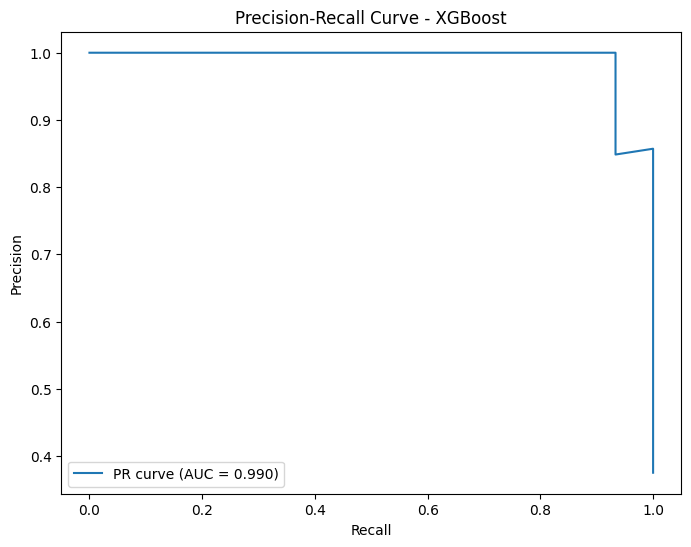

Generating Feature Importance Plot...


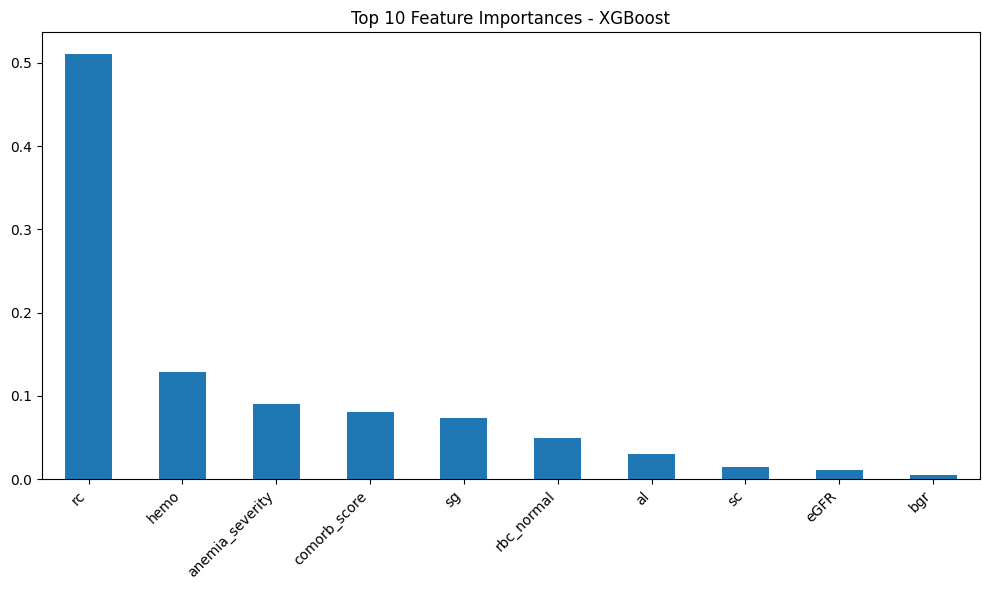

Generating Validation Curve Analysis...


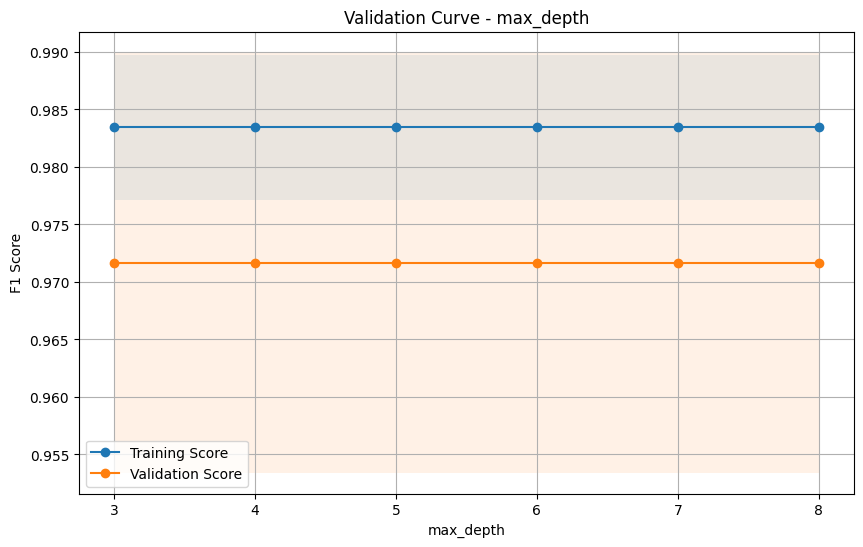

Completed analysis for XGBoost


 ANALYZING: LightGBM
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9947

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 0.9
reg_lambda: 0.1
reg_alpha: 1

Generating Confusion Matrix...


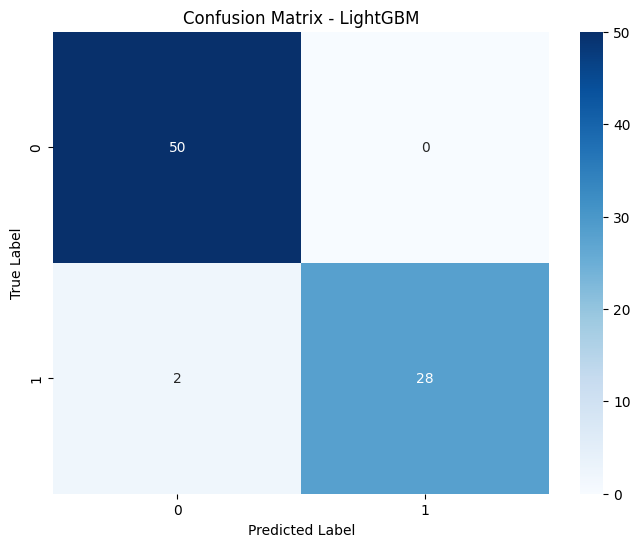

Generating ROC Curve...


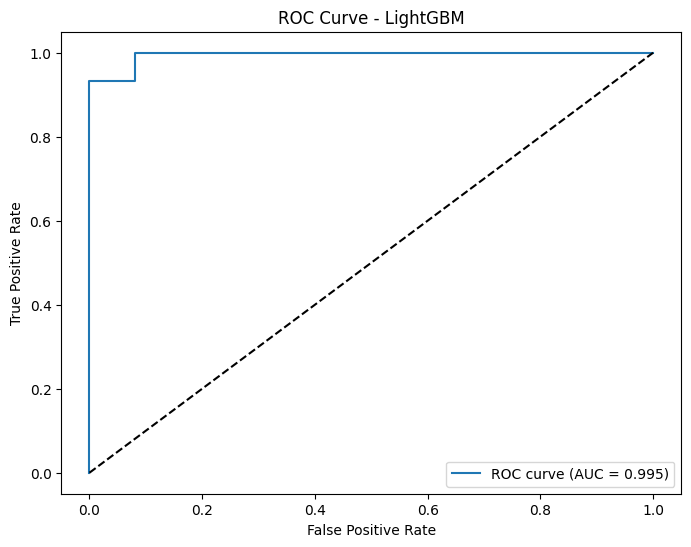

Generating Precision-Recall Curve...


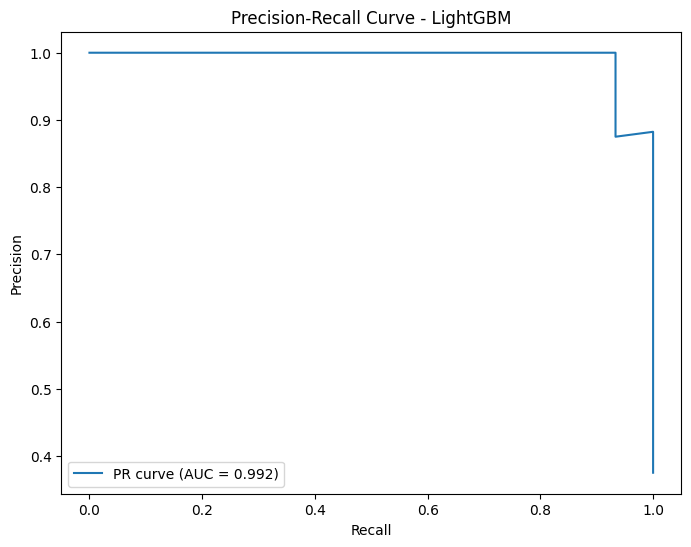

Generating Feature Importance Plot...


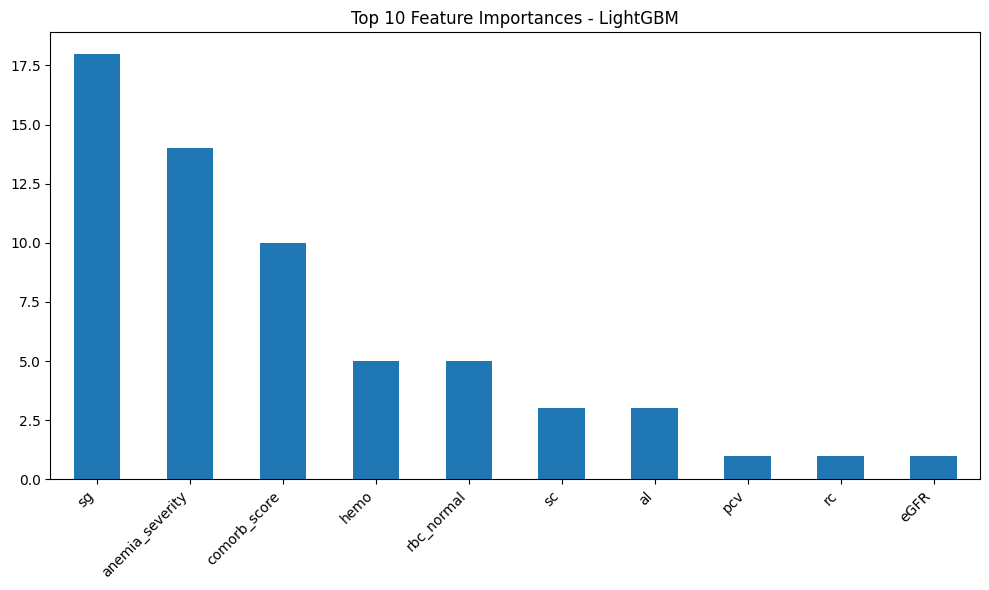

Generating Validation Curve Analysis...


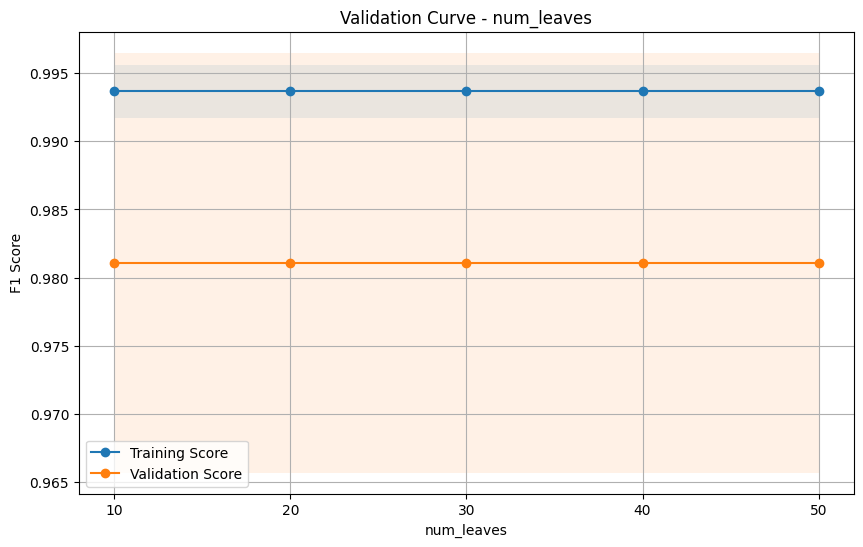

Completed analysis for LightGBM


 ANALYZING: Logistic Regression
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
solver: liblinear
penalty: l2
l1_ratio: 0.5

Generating Confusion Matrix...


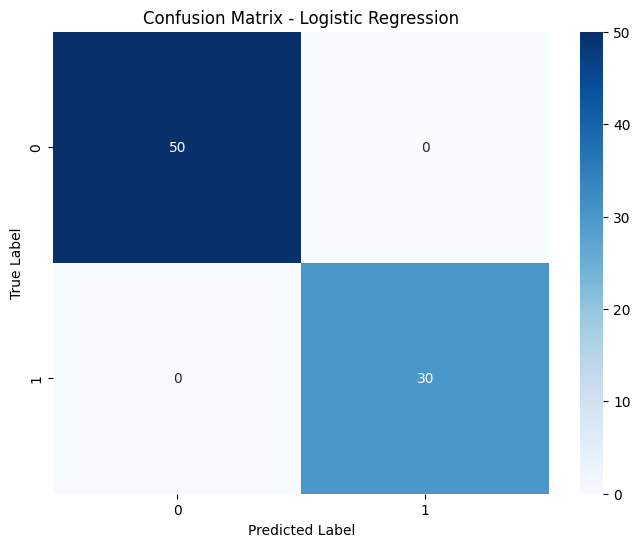

Generating ROC Curve...


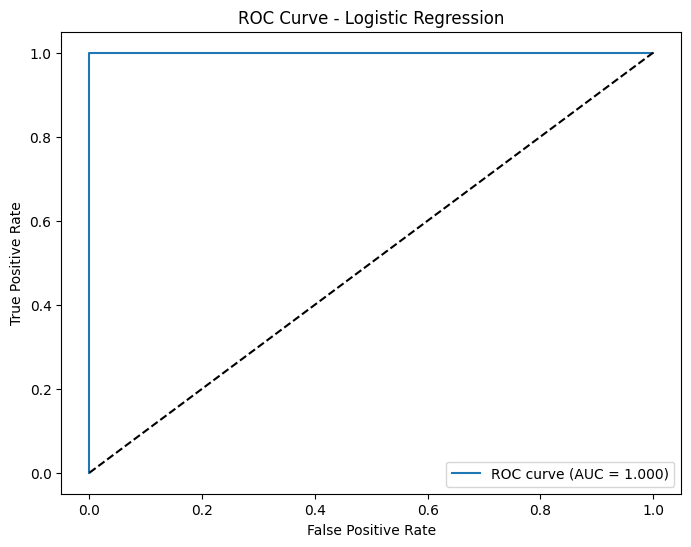

Generating Precision-Recall Curve...


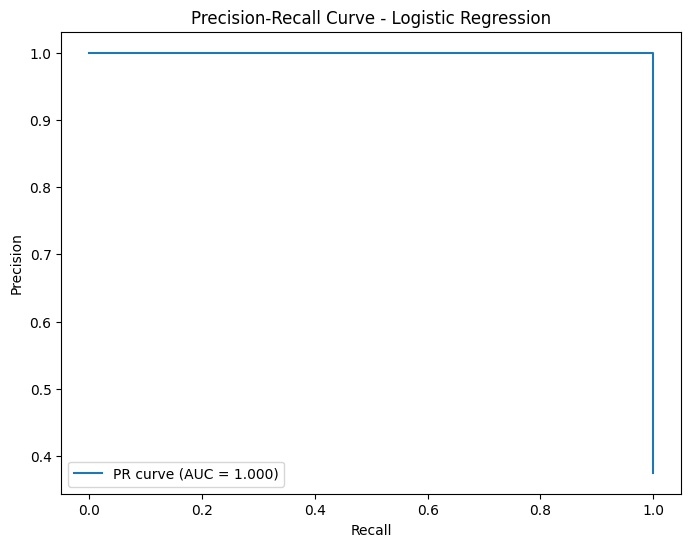

Generating Validation Curve Analysis...


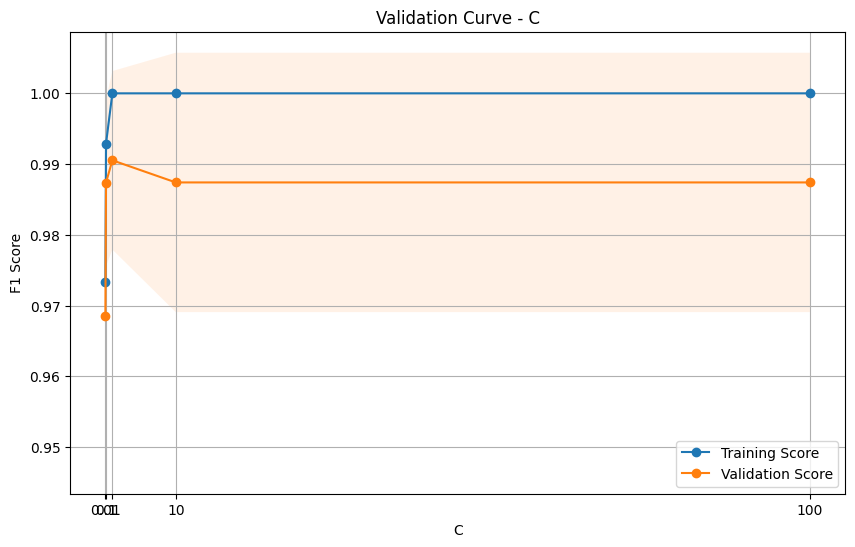

Completed analysis for Logistic Regression


 ANALYZING: SVM (RBF)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
shrinking: False
kernel: rbf
gamma: 0.1

Generating Confusion Matrix...


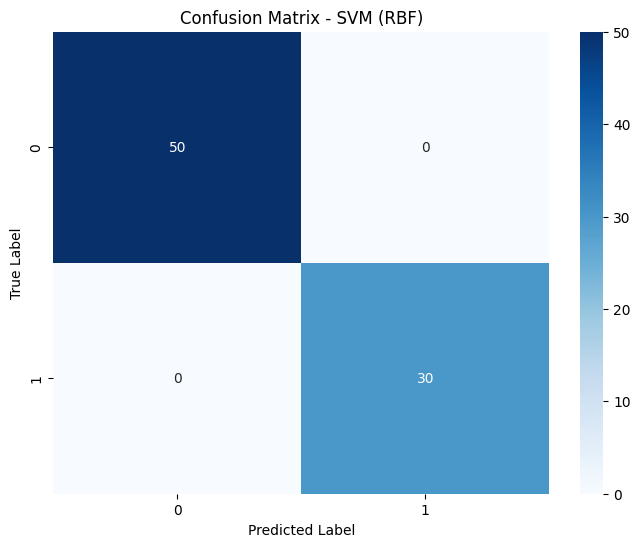

Generating ROC Curve...


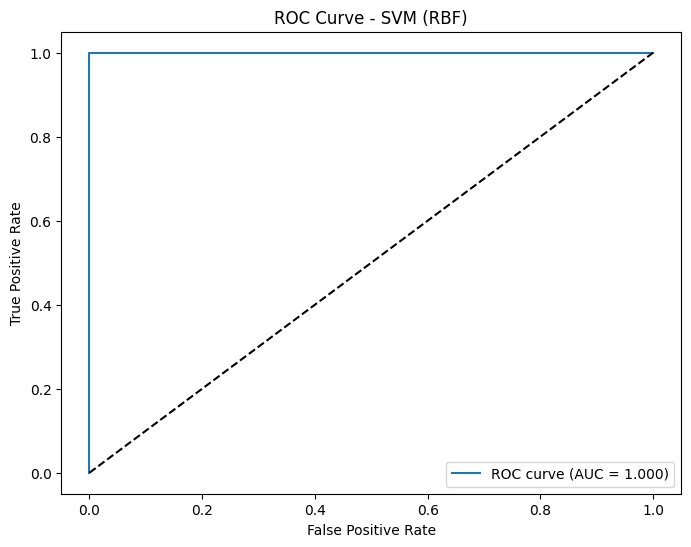

Generating Precision-Recall Curve...


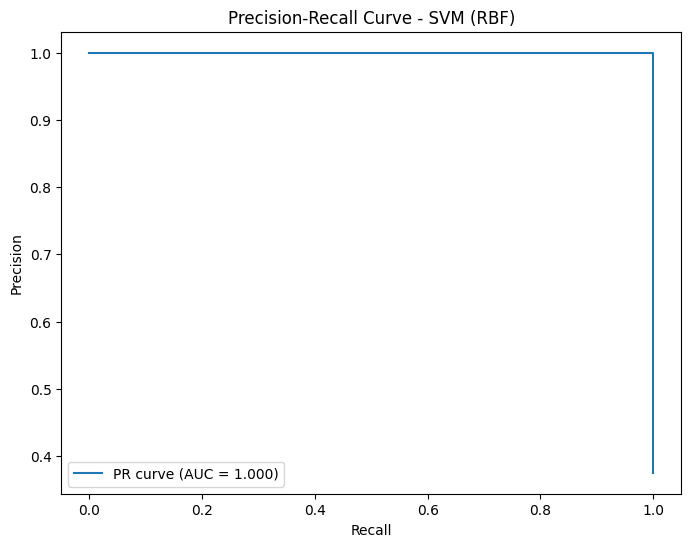

Generating Validation Curve Analysis...


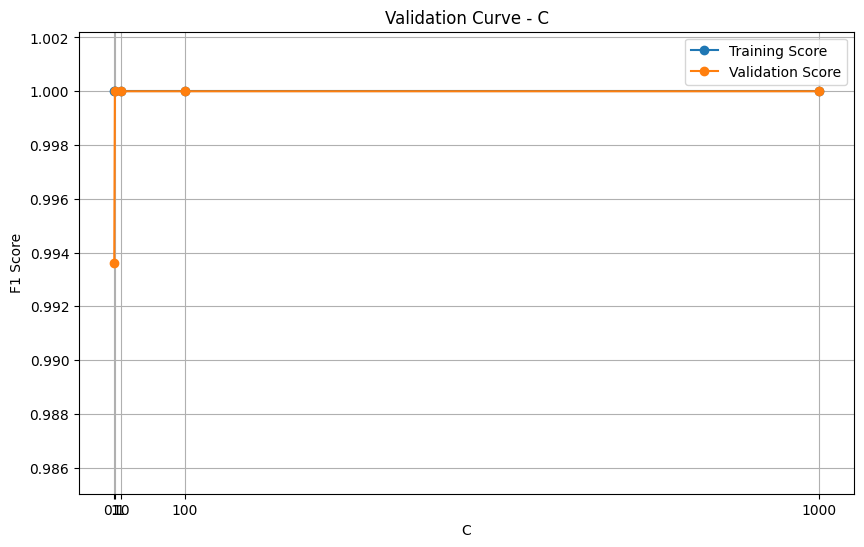

Completed analysis for SVM (RBF)


 ANALYZING: Gradient Boosting
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9375
   Precision: 0.9382
   Recall: 0.9375
   F1 Score: 0.9377
   ROC AUC: 0.9920

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: -0.0042
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 0.6
n_estimators: 100
min_samples_split: 80

Generating Confusion Matrix...


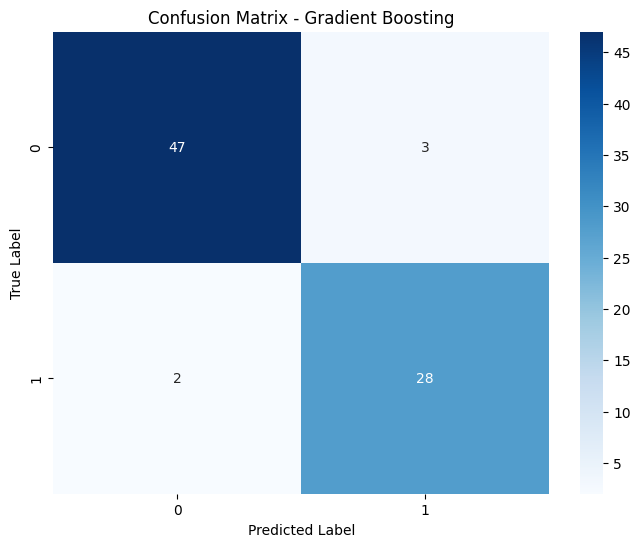

Generating ROC Curve...


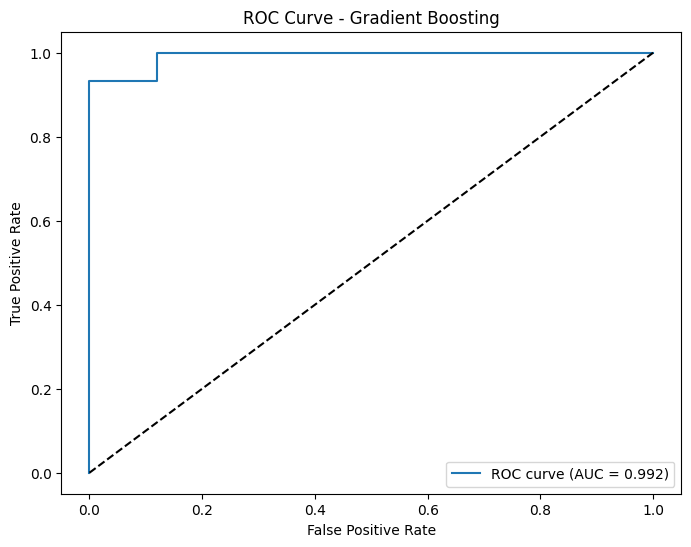

Generating Precision-Recall Curve...


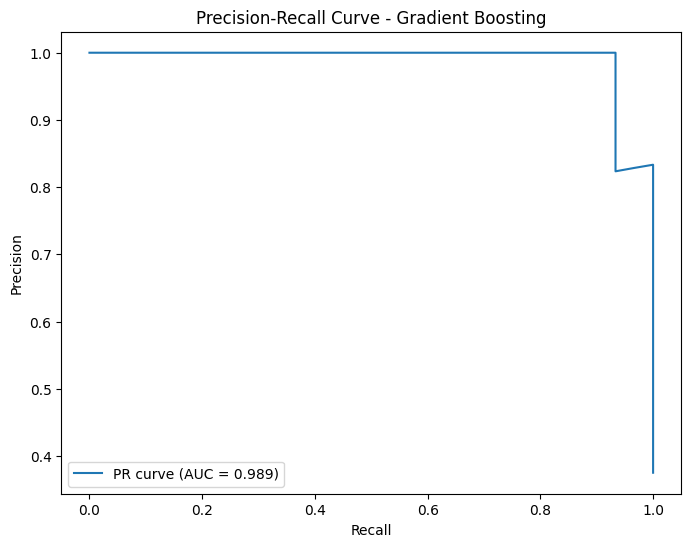

Generating Feature Importance Plot...


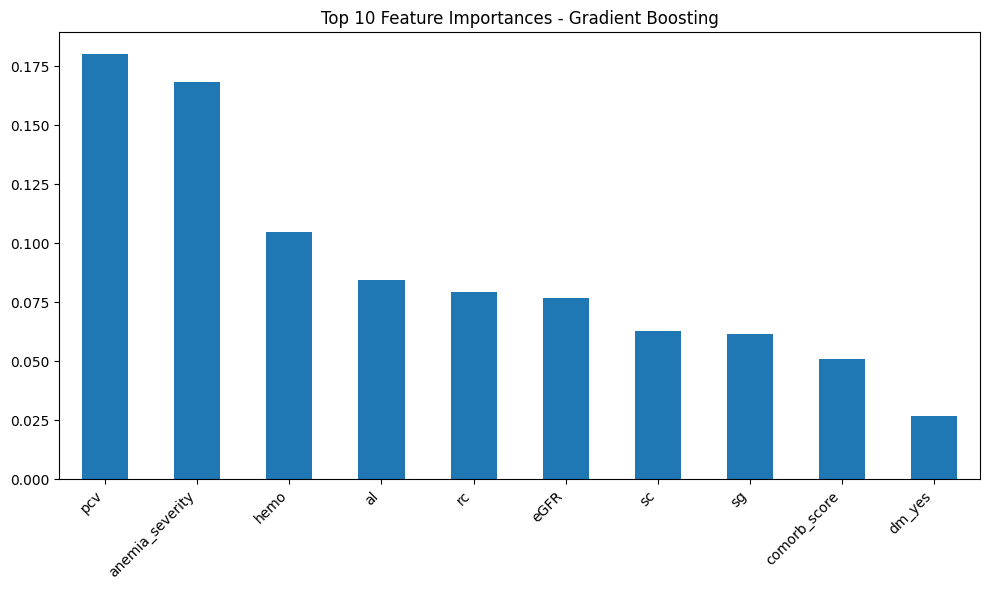

Generating Validation Curve Analysis...
Completed analysis for Gradient Boosting


 ANALYZING: Decision Tree
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.8750
   Precision: 0.8883
   Recall: 0.8750
   F1 Score: 0.8767
   ROC AUC: 0.8867

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
min_samples_split: 40
min_samples_leaf: 40
min_impurity_decrease: 0.01

Generating Confusion Matrix...


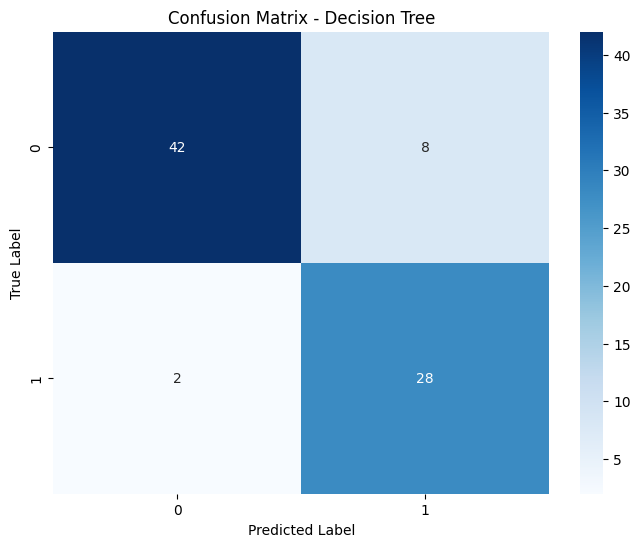

Generating ROC Curve...


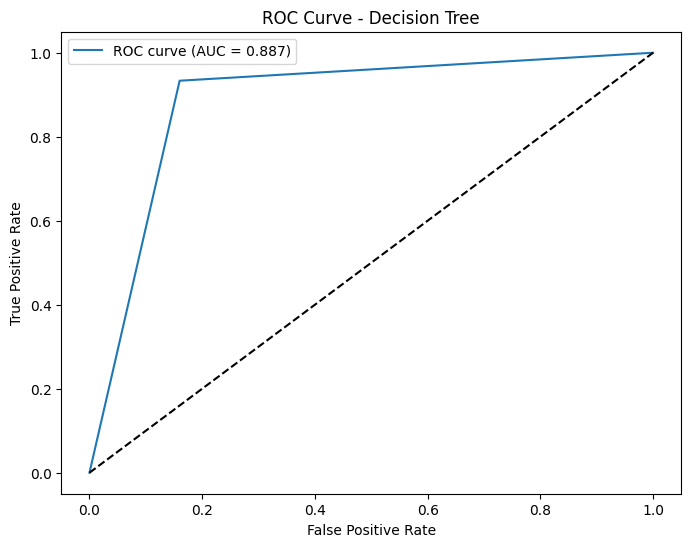

Generating Precision-Recall Curve...


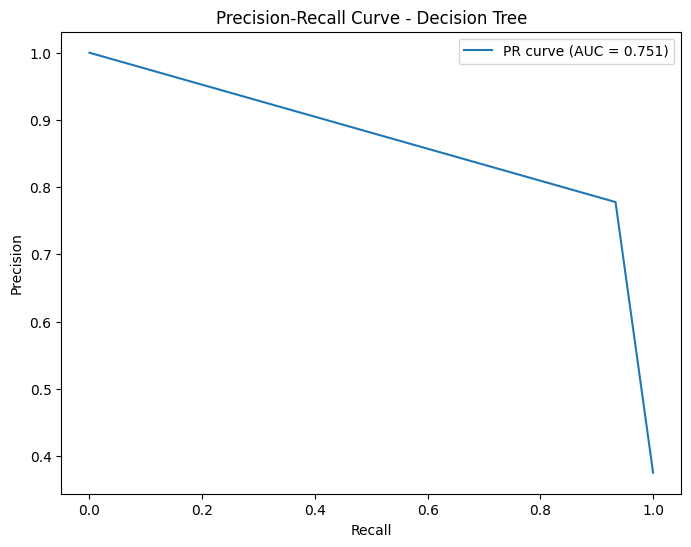

Generating Feature Importance Plot...


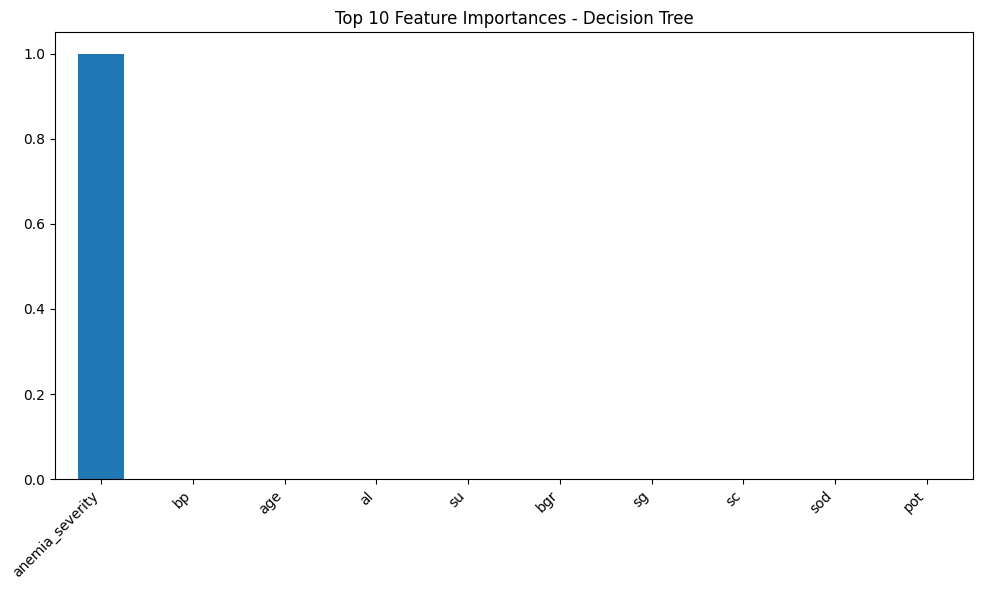

Generating Validation Curve Analysis...
Completed analysis for Decision Tree


 ANALYZING: K-Nearest Neighbors
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9500
   Precision: 0.9559
   Recall: 0.9500
   F1 Score: 0.9505
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
weights: distance
p: 2
n_neighbors: 21

Generating Confusion Matrix...


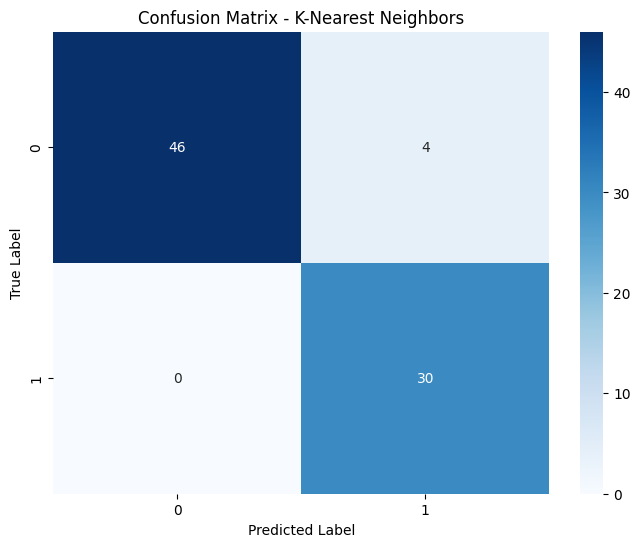

Generating ROC Curve...


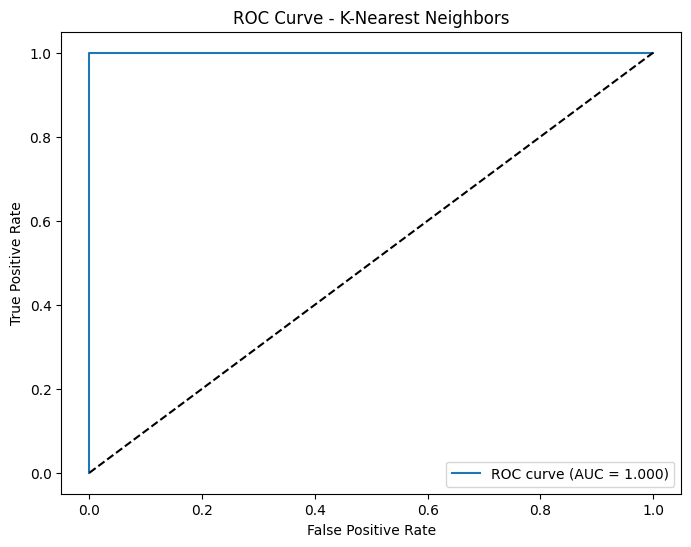

Generating Precision-Recall Curve...


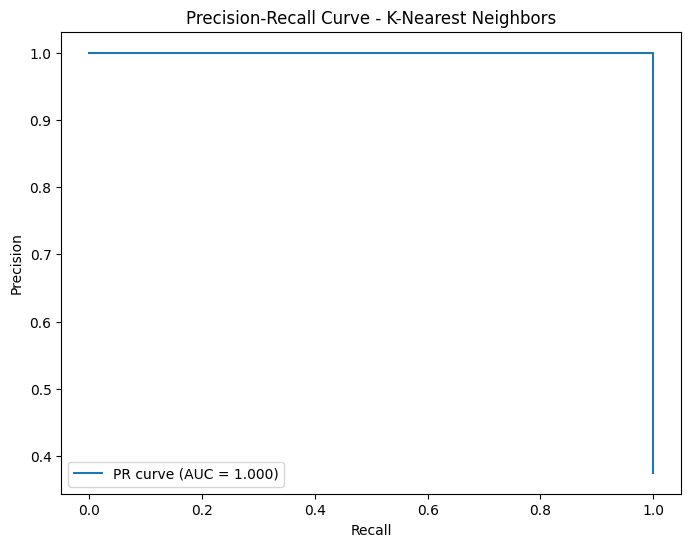

Generating Validation Curve Analysis...
Completed analysis for K-Nearest Neighbors


 ANALYZING: Linear Discriminant Analysis
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: GridSearchCV (exhaustive)
Key Tuned Parameters:
n_components: None
priors: None
shrinkage: 0.5

Generating Confusion Matrix...


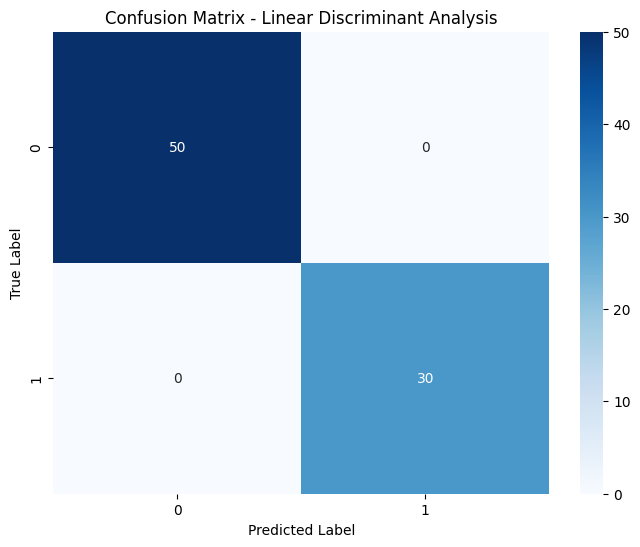

Generating ROC Curve...


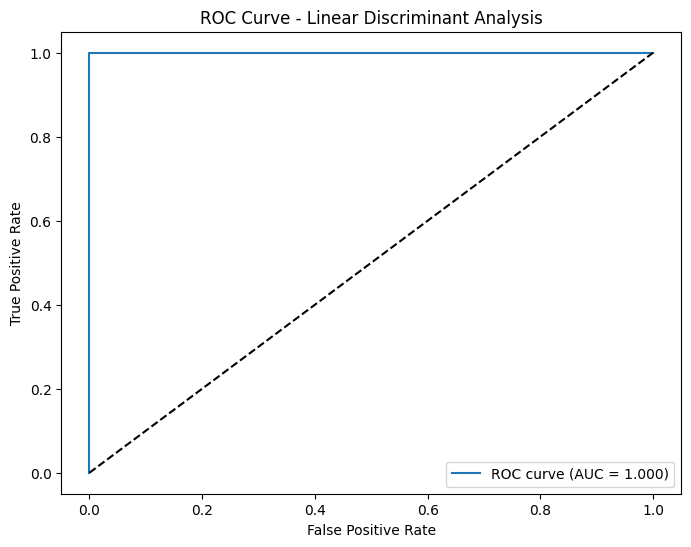

Generating Precision-Recall Curve...


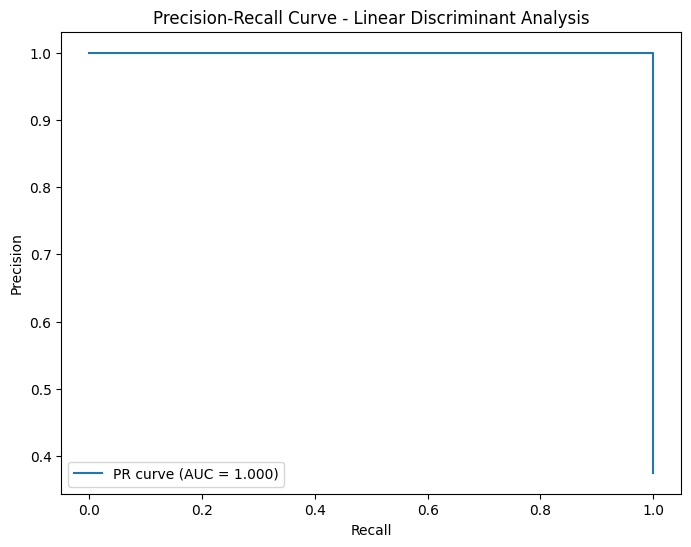

Generating Validation Curve Analysis...
Completed analysis for Linear Discriminant Analysis


 ANALYZING: Multi-layer Perceptron
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
validation_fraction: 0.1
solver: lbfgs
learning_rate_init: 0.01

Generating Confusion Matrix...


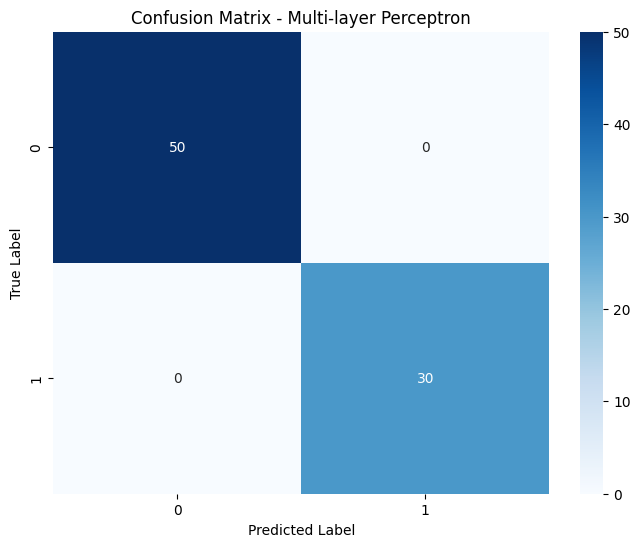

Generating ROC Curve...


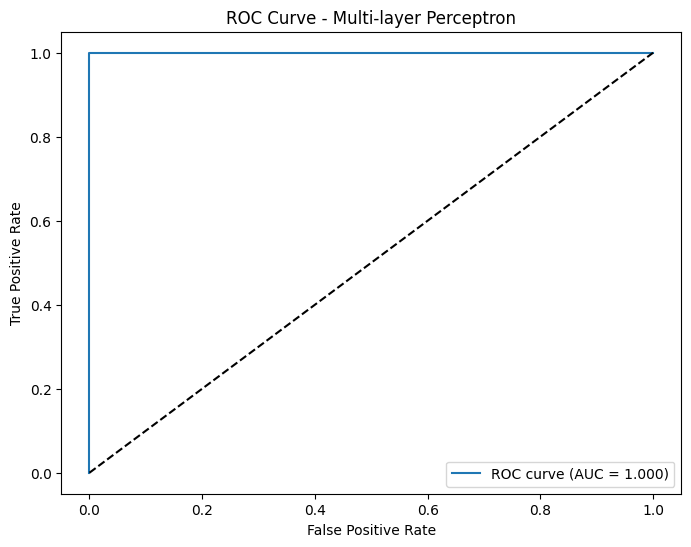

Generating Precision-Recall Curve...


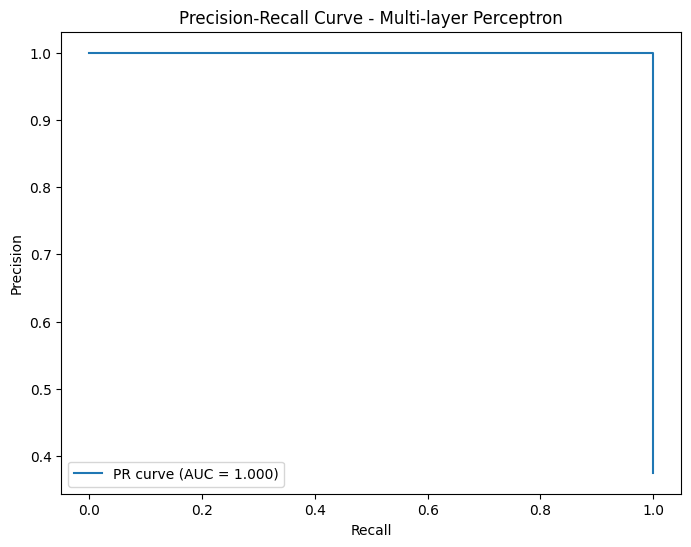

Generating Validation Curve Analysis...
Completed analysis for Multi-layer Perceptron


 ANALYZING: SGD Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
validation_fraction: 0.3
penalty: l1
learning_rate: constant

Generating Confusion Matrix...


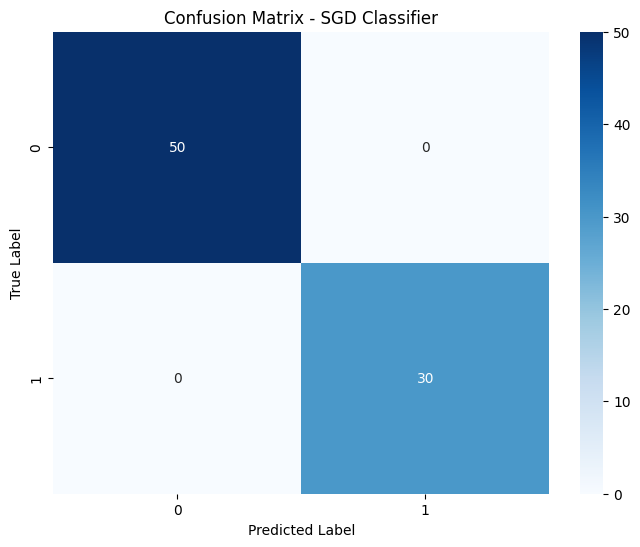

Generating ROC Curve...


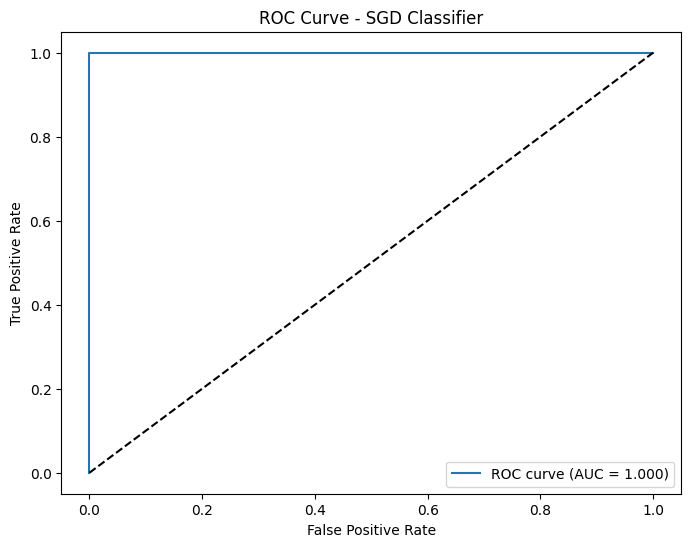

Generating Precision-Recall Curve...


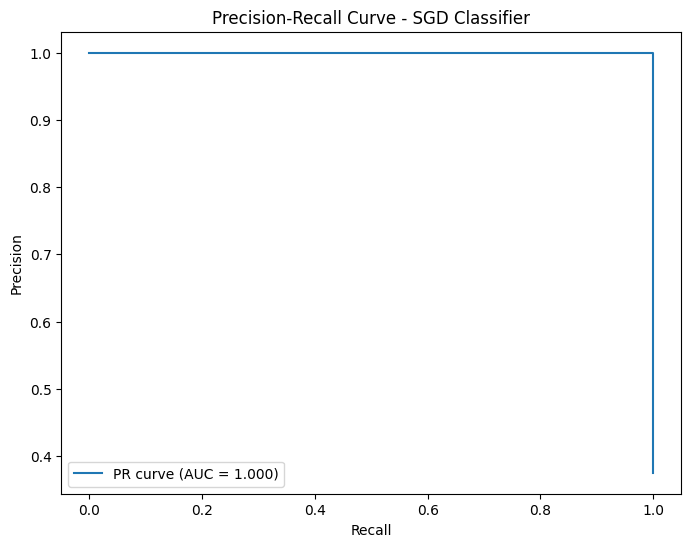

Generating Validation Curve Analysis...
Completed analysis for SGD Classifier


 ANALYZING: Gaussian Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9125
   Precision: 0.9291
   Recall: 0.9125
   F1 Score: 0.9138
   ROC AUC: 0.9300

Generating Confusion Matrix...


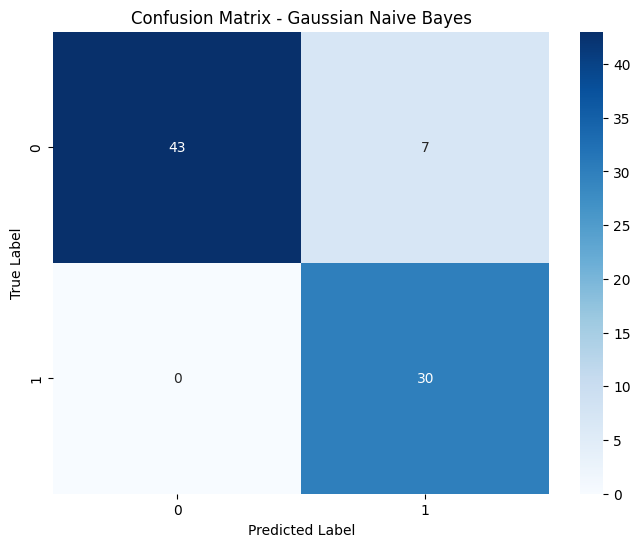

Generating ROC Curve...


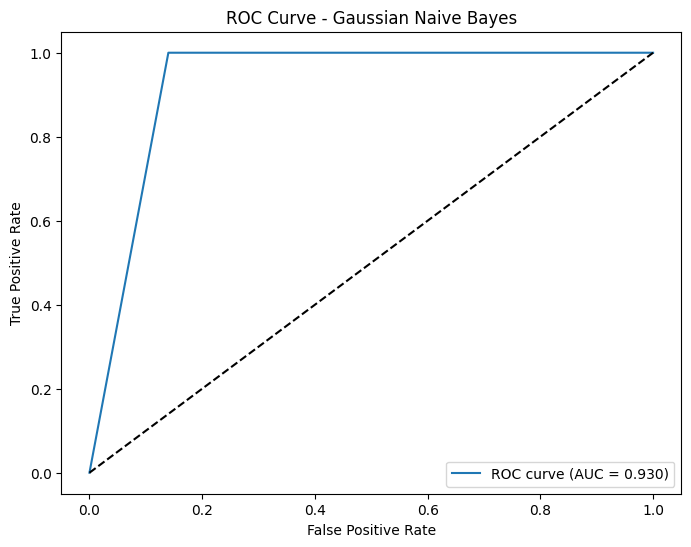

Generating Precision-Recall Curve...


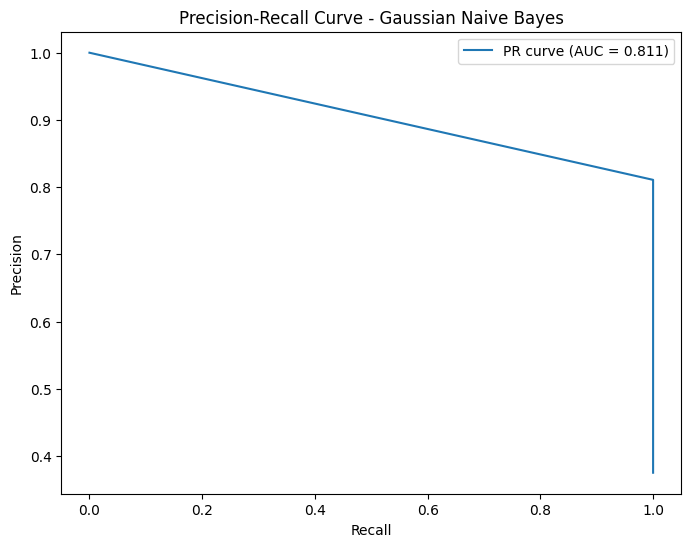

Generating Validation Curve Analysis...
Completed analysis for Gaussian Naive Bayes


 ANALYZING: Bernoulli Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9625
   Precision: 0.9659
   Recall: 0.9625
   F1 Score: 0.9628
   ROC AUC: 0.9973

Generating Confusion Matrix...


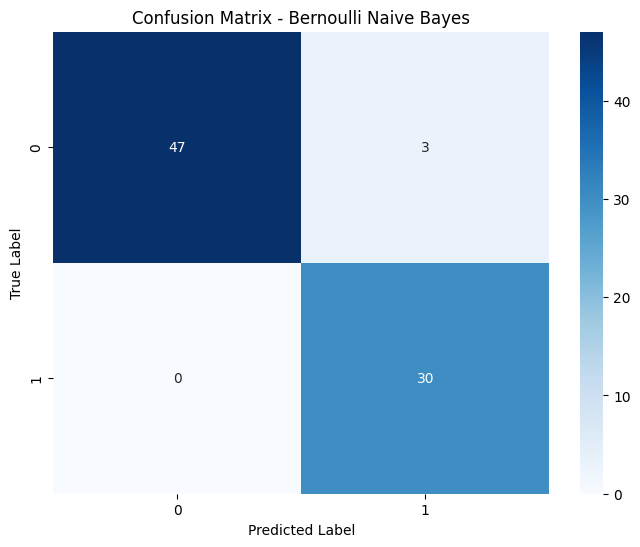

Generating ROC Curve...


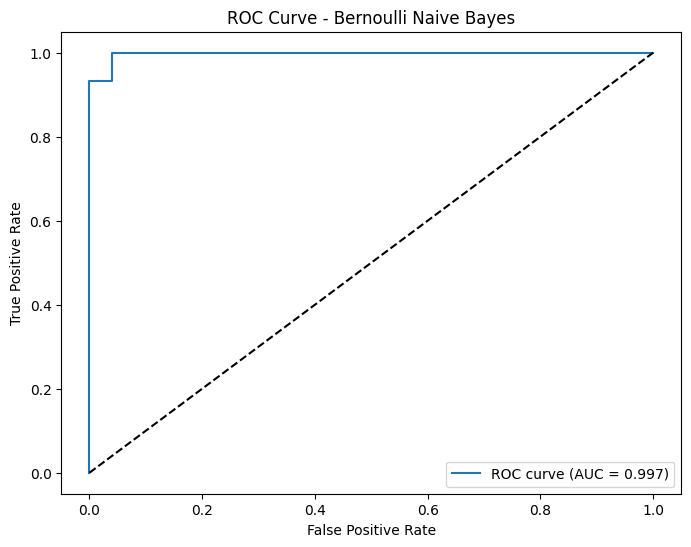

Generating Precision-Recall Curve...


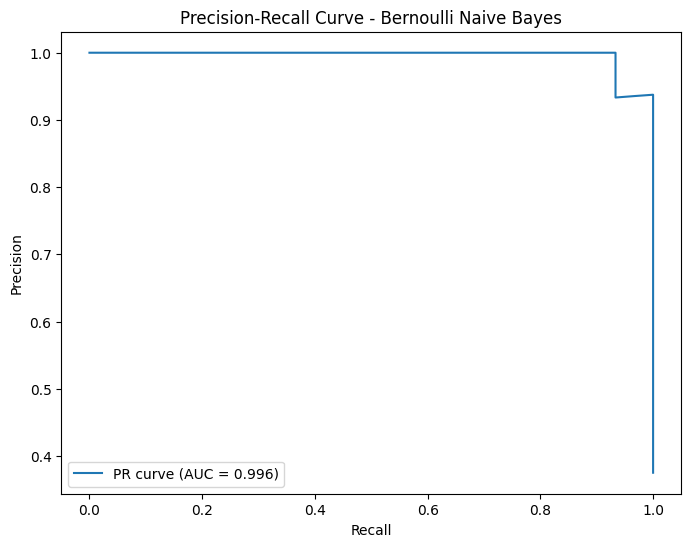

Generating Validation Curve Analysis...
Completed analysis for Bernoulli Naive Bayes


 ANALYZING: Dummy Classifier (Stratified)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.5000
   Precision: 0.4858
   Recall: 0.5000
   F1 Score: 0.4918
   ROC AUC: 0.4533

Generating Confusion Matrix...


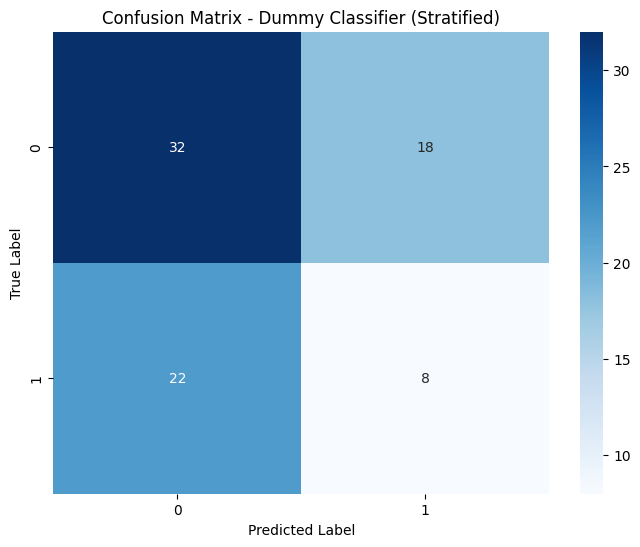

Generating ROC Curve...


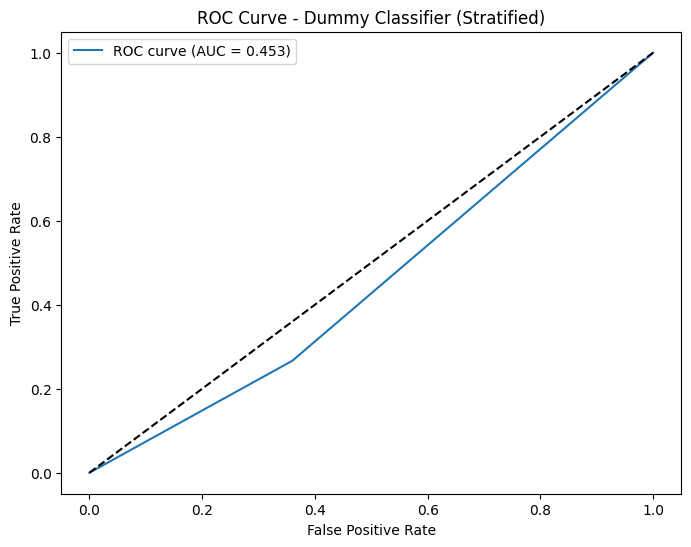

Generating Precision-Recall Curve...


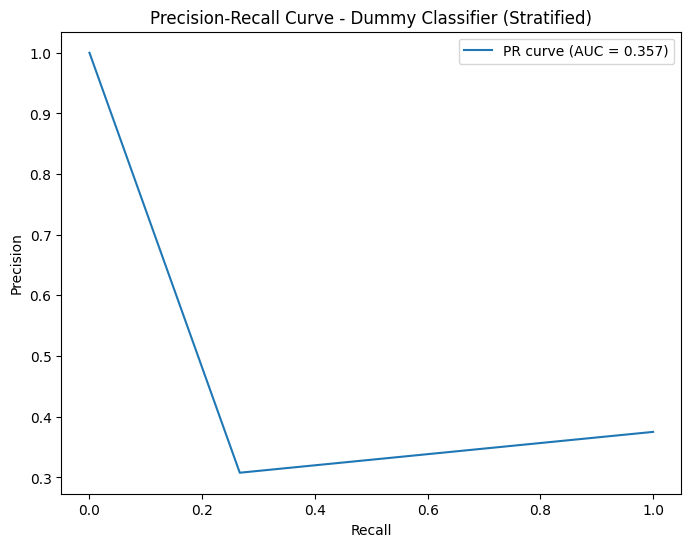

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Stratified)


 ANALYZING: Dummy Classifier (Most Frequent)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.6250
   Precision: 0.3906
   Recall: 0.6250
   F1 Score: 0.4808
   ROC AUC: 0.5000

Generating Confusion Matrix...


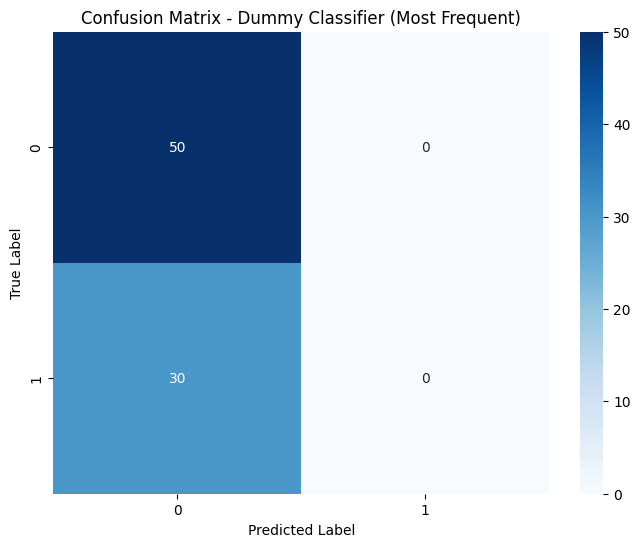

Generating ROC Curve...


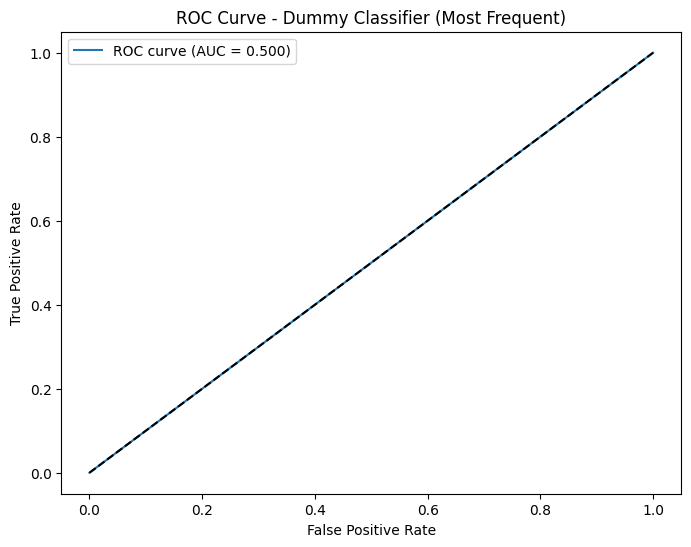

Generating Precision-Recall Curve...


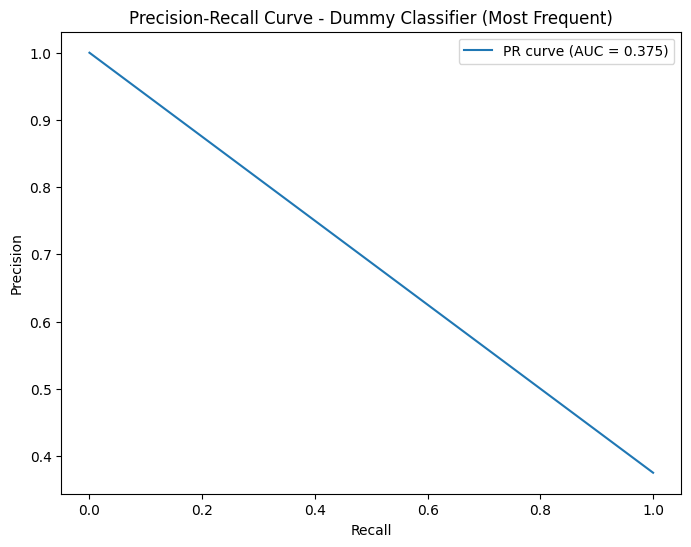

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Most Frequent)


OVERFITTING RISK SUMMARY

Critical CRITICAL OVERFITTING RISK (7 models):
------------------------------------------------------------
   • Logistic Regression
     Score: 1.000
     - High confidence predictions: 91.8% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • SVM (RBF)
     Score: 1.000
     - High confidence predictions: 100.0% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • K-Nearest Neighbors
     Score: 1.000
     - High confidence predictions: 100.0% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • Linear Discriminant Analysis
     Score: 1.000
     - High confidence predictions: 96.8% of training predictions are >95% or <5% confident
     - Perfect test 

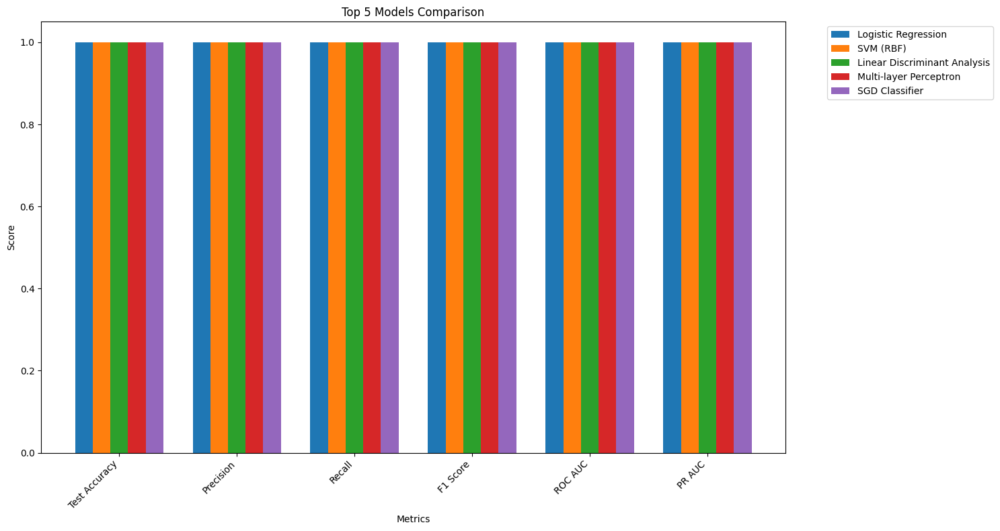

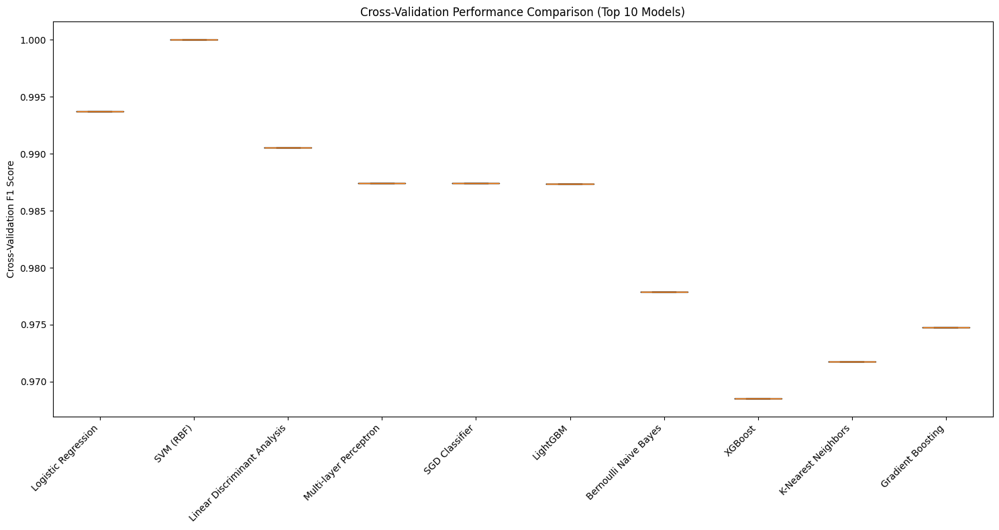


Generating Hyperparameter Tuning Summary Visualization...


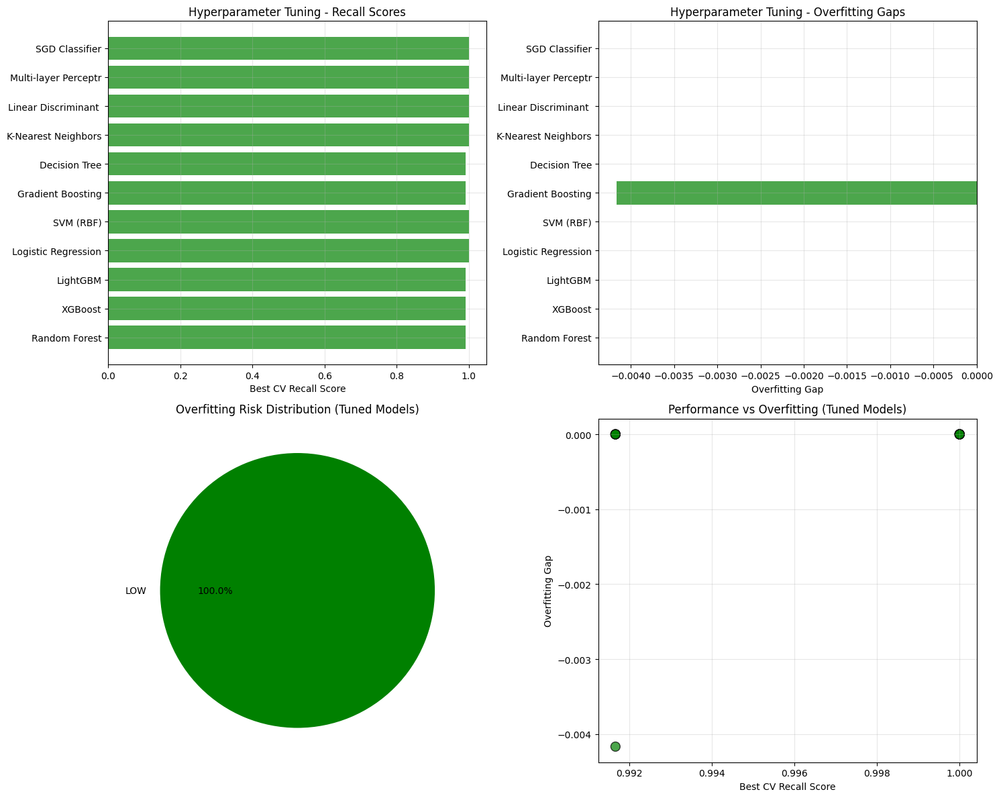


HYPERPARAMETER TUNING STATISTICS:
   Models Tuned: 11
   Best Recall Score: 1.0000
   Lowest Overfitting Gap: -0.0042
   Average Recall Improvement: 0.9962
   Average Overfitting Gap: -0.0004

 FINAL HEALTHCARE RECOMMENDATIONS
RECOMMENDED MODEL: SVM (RBF)
   Healthcare Score: 2.1000
   Recall (Sensitivity): 1.0000
   Precision: 1.0000
   F1 Score: 1.0000
   Overfitting Risk: CRITICAL
   Hyperparameter Optimization:
   Tuning Method: RandomizedSearchCV (n_iter=100)
   CV Recall Score: 1.0000
   Overfitting Gap: 0.0000
\ TOPn 3 SAFE MODELS FOR HEALTHCARE:
   1.   Bernoulli Naive Bayes (Score: 1.1690, Risk: highMEDIUM)
   2.   Gaussian Naive Bayes (Score: 1.0729, Risk: highMEDIUM)
   3.   Gradient Boosting (Score: 1.0718, Risk: highMEDIUM)

MODELS TO AVOID IN HEALTHCARE:
    SVM (RBF) (Overfitting Gap: 0.0000)
    SGD Classifier (Overfitting Gap: 0.0000)
    Logistic Regression (Overfitting Gap: 0.0000)
    Multi-layer Perceptron (Overfitting Gap: 0.0000)
    Linear Discriminant Analysis

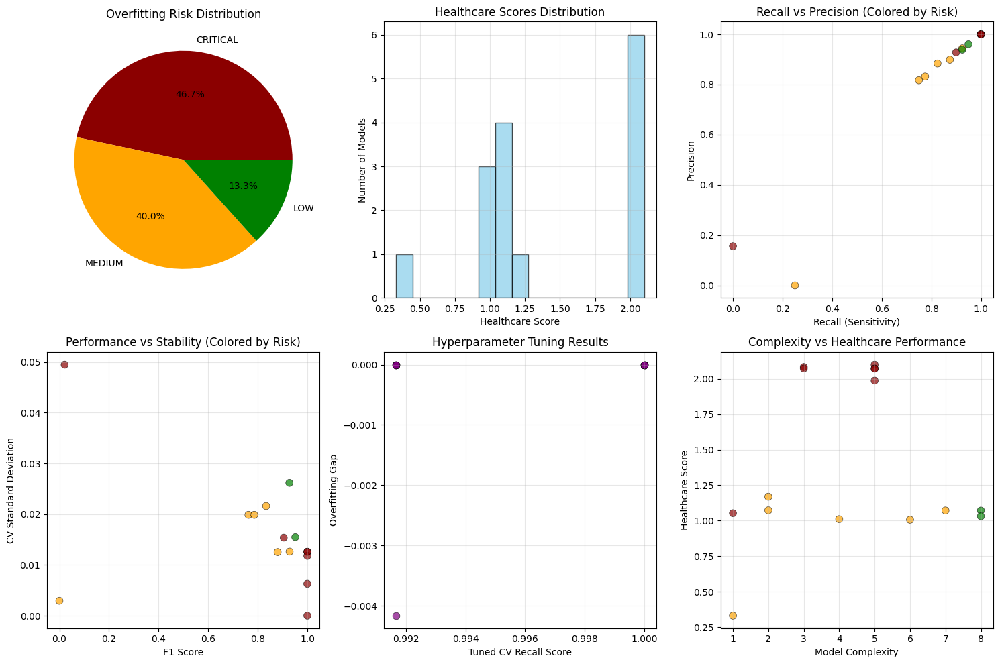


 SUMMARY STATISTICS:
   Total Models Evaluated: 15
   Models with Hyperparameter Tuning: 11
   Low Risk Models: 2
   Medium Risk Models: 6
   High Risk Models: 0
   Critical Risk Models: 7
   Average Healthcare Score: 1.4137
   Average Recall: 0.8117
   Average Precision: 0.8238
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\Random_Forest_v0_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\XGBoost_v0_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\LightGBM_v0_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\Logistic_Regression_v0_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\SVM_RBF_v0_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Predic

In [86]:
results_hyp0 = run_healthcare_ml_pipeline_hyp(X_train,X_test,y_train,y_test,version_tag="v0_hyp")

print(results_hyp0 )

### Version 1


HEALTHCARE ML ANALYSIS PIPELINE
Kidney Disease Detection - Enhanced with Hyperparameter Tuning
   Dataset Info:
   Training samples: 316
   Test samples: 80
   Features: 12
   Classes: 2
   Class distribution: {np.int64(0): np.int64(196), np.int64(1): np.int64(120)}

HEALTHCARE-OPTIMIZED HYPERPARAMETER TUNING
Optimizing for Minimal False Negatives in Kidney Disease Detection

TUNING PRIORITY MODELS (Healthcare Critical):

HEALTHCARE HYPERPARAMETER TUNING: Random Forest
----------------------------------------------------------------------
   Primary Objective: Maximize Recall (Minimize False Negatives)
   Secondary Objective: Minimize Overfitting
   Cross-Validation Folds: 5
   Scoring Metric: recall
   Parameter combinations to test: 81920
   Search Strategy: RandomizedSearchCV (n_iter=100)
   Training in progress...

HYPERPARAMETER TUNING RESULTS:
   Best RECALL Score (CV): 1.0000
   Training Score: 0.9896
   Overfitting Gap: -0.0104
   Overfitting Ratio: -0.0105
   Low risk Overfit

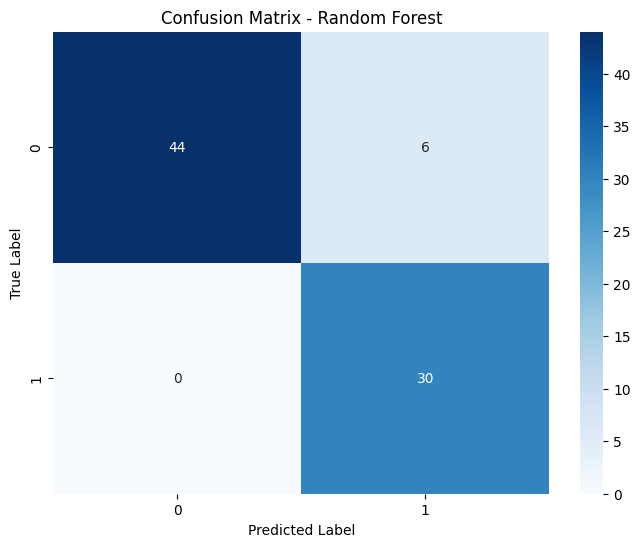

Generating ROC Curve...


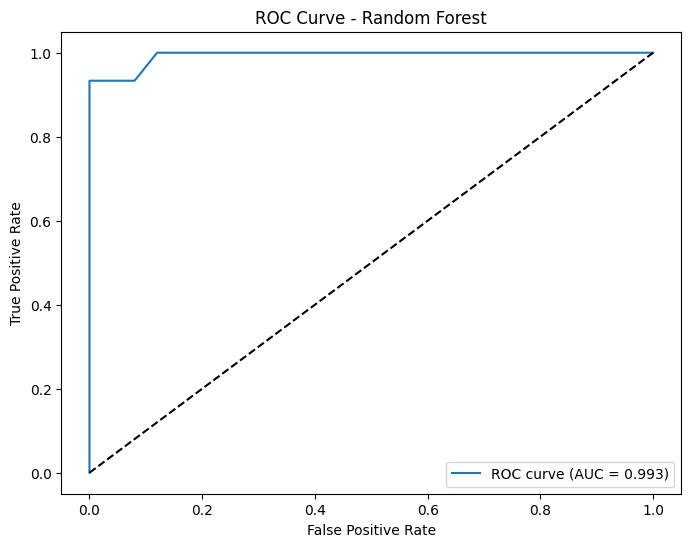

Generating Precision-Recall Curve...


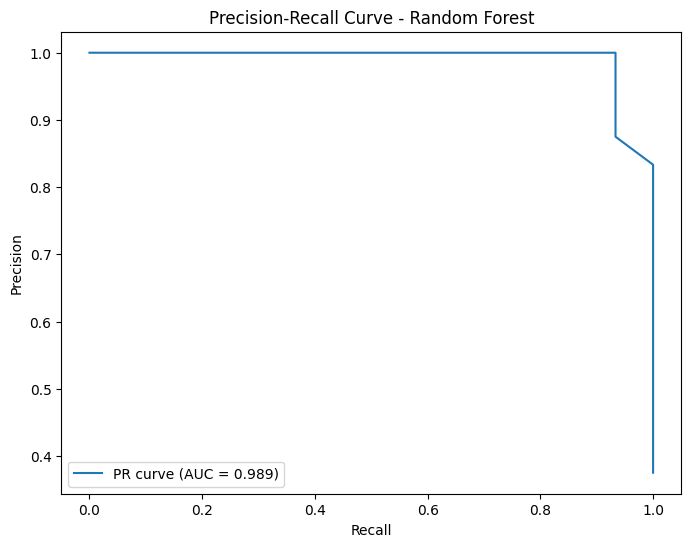

Generating Feature Importance Plot...


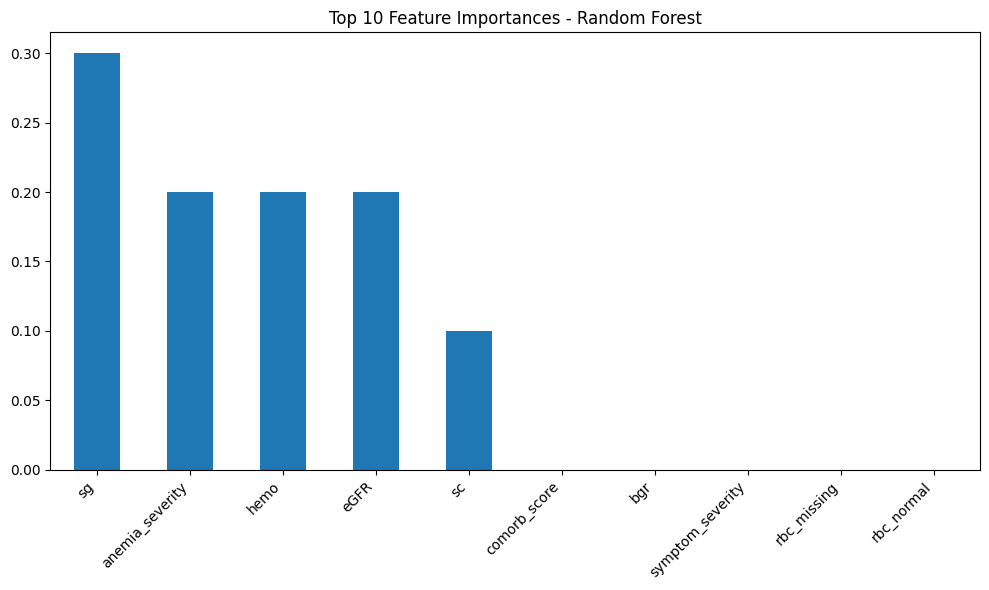

Generating Validation Curve Analysis...


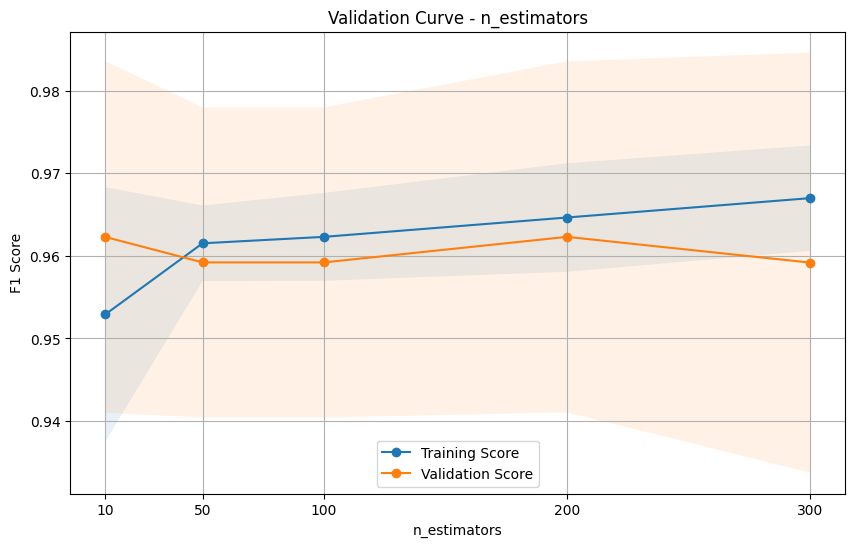

Completed analysis for Random Forest


 ANALYZING: XGBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9625
   Precision: 0.9626
   Recall: 0.9625
   F1 Score: 0.9624
   ROC AUC: 0.9920

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 0.9
scale_pos_weight: 1
reg_lambda: 10

Generating Confusion Matrix...


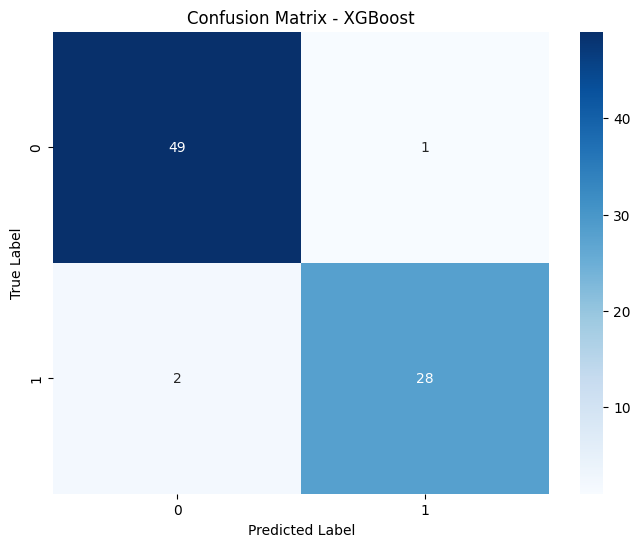

Generating ROC Curve...


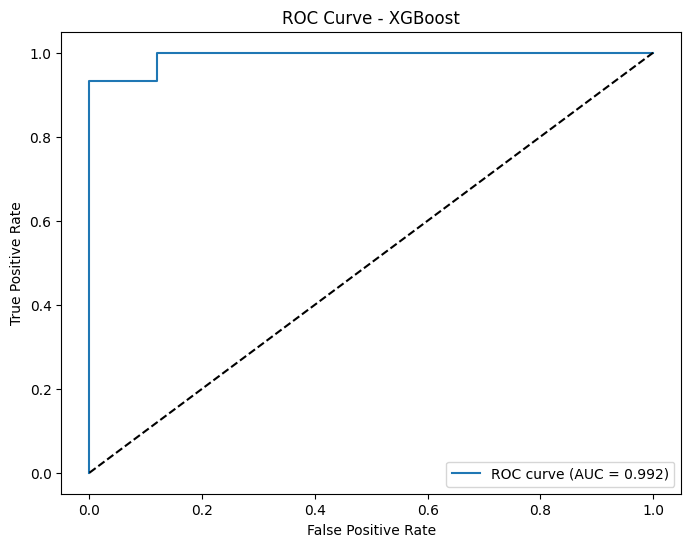

Generating Precision-Recall Curve...


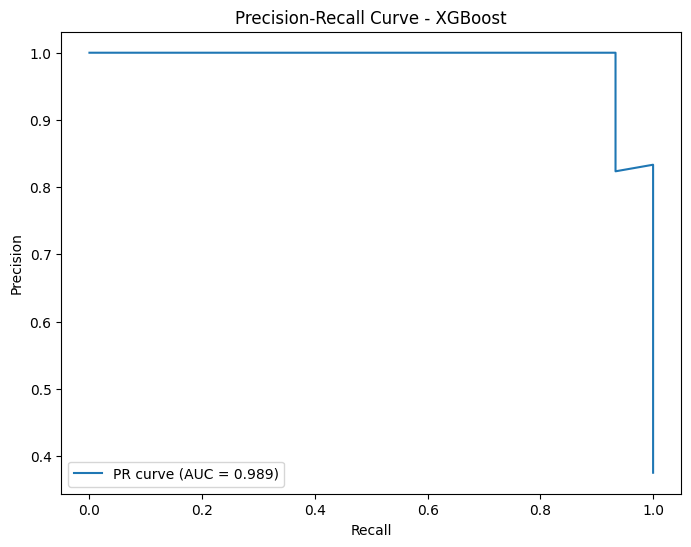

Generating Feature Importance Plot...


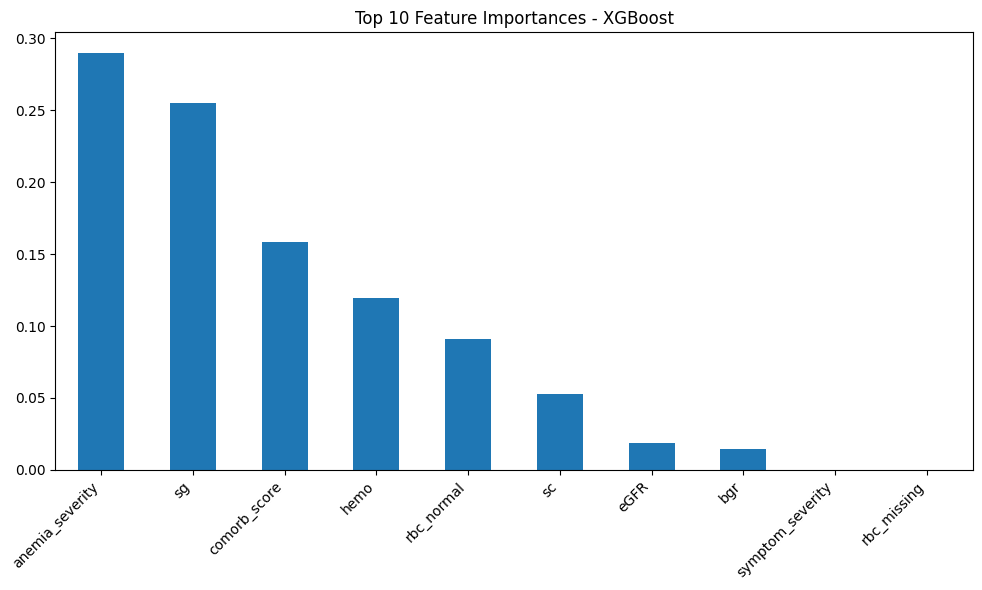

Generating Validation Curve Analysis...


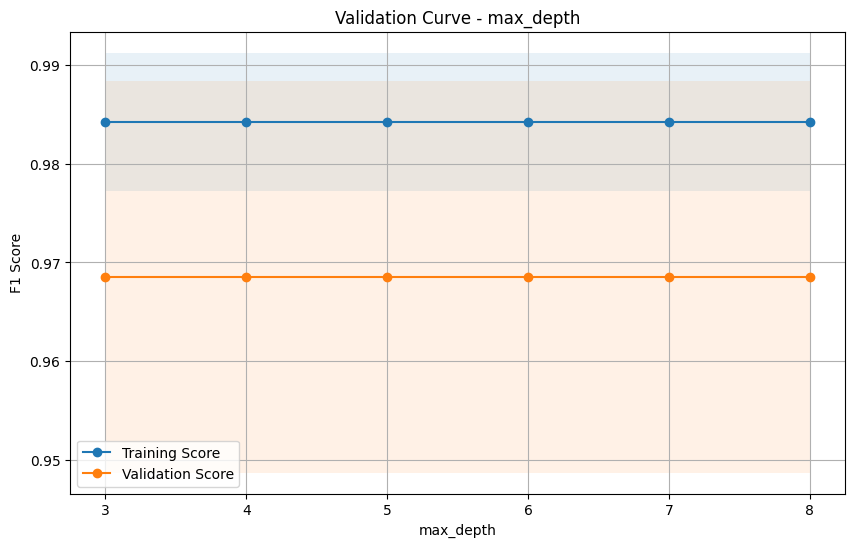

Completed analysis for XGBoost


 ANALYZING: LightGBM
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 0.6
reg_lambda: 0.1
reg_alpha: 0.01

Generating Confusion Matrix...


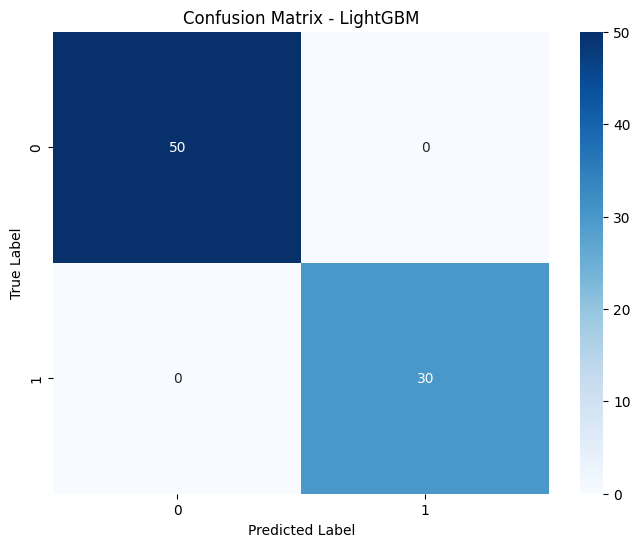

Generating ROC Curve...


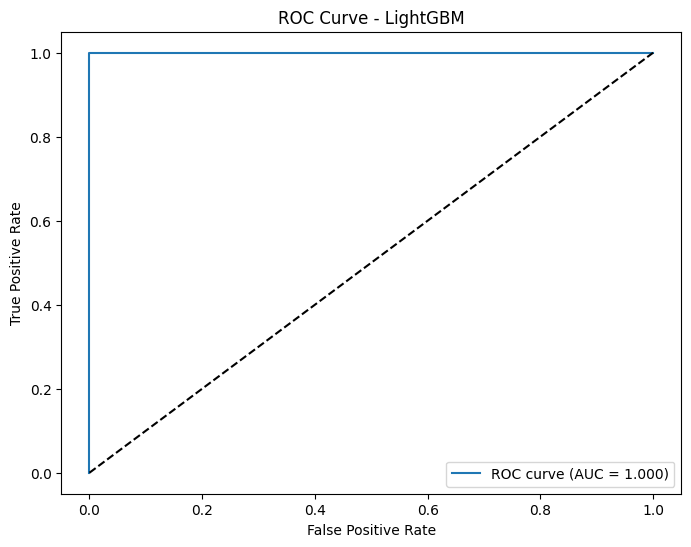

Generating Precision-Recall Curve...


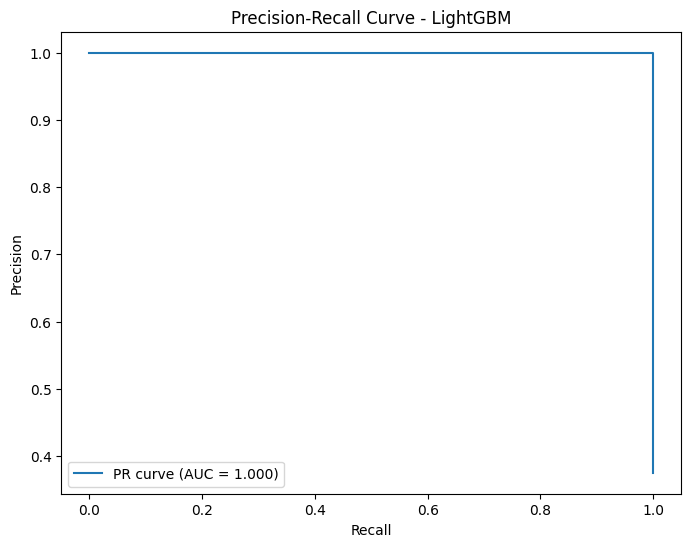

Generating Feature Importance Plot...


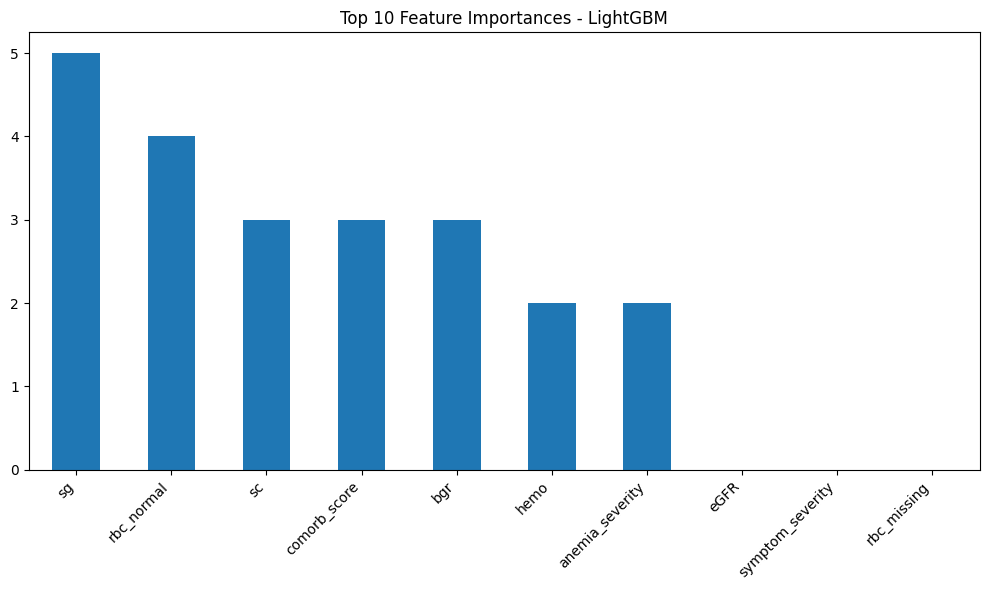

Generating Validation Curve Analysis...


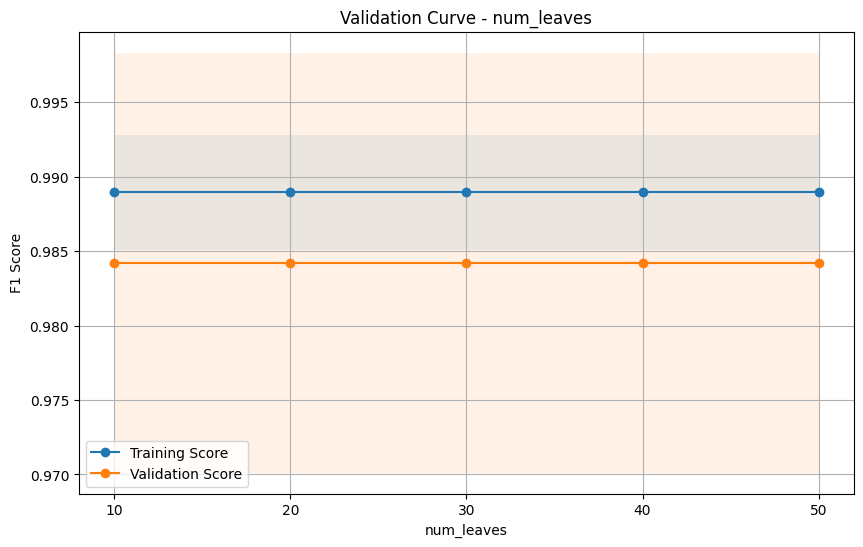

Completed analysis for LightGBM


 ANALYZING: Logistic Regression
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
solver: liblinear
penalty: l2
l1_ratio: 0.5

Generating Confusion Matrix...


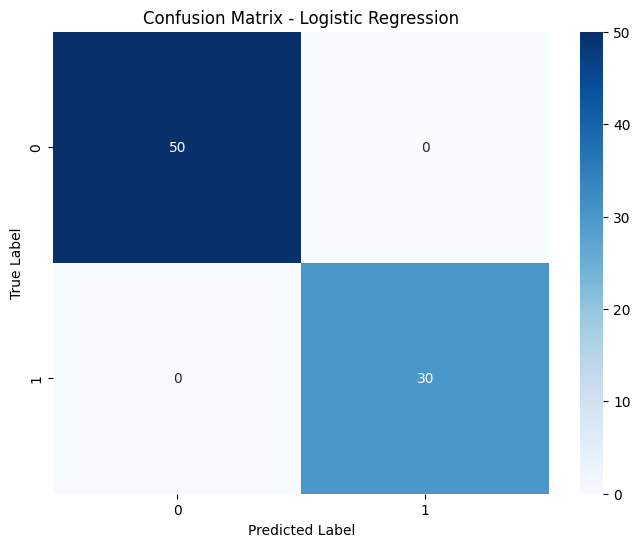

Generating ROC Curve...


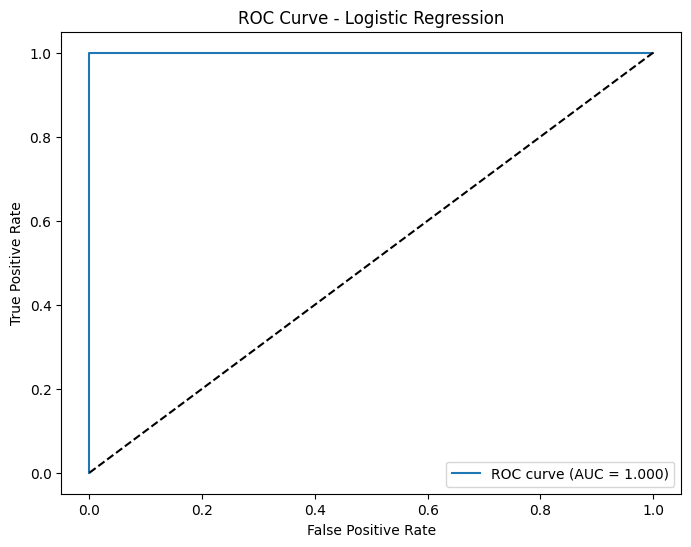

Generating Precision-Recall Curve...


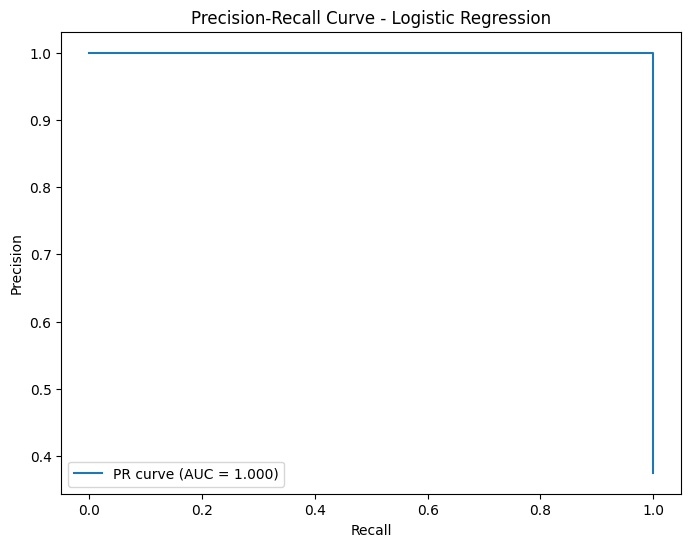

Generating Validation Curve Analysis...


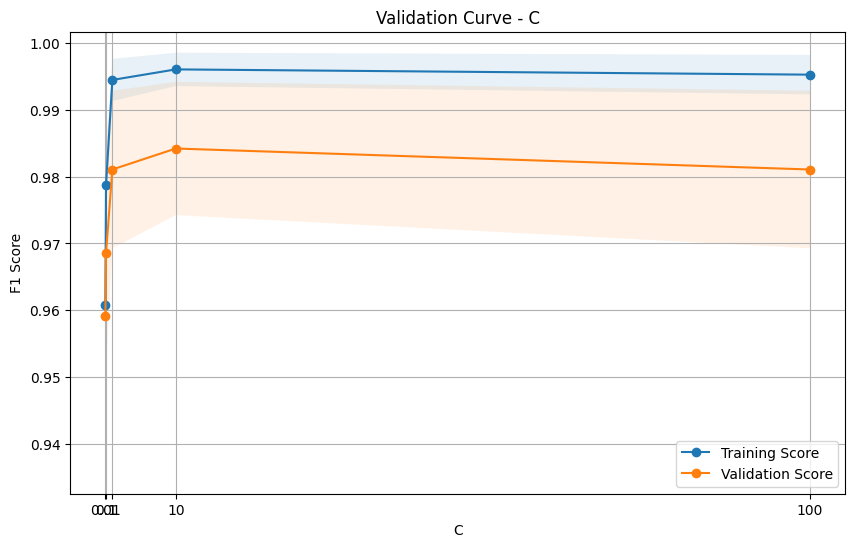

Completed analysis for Logistic Regression


 ANALYZING: SVM (RBF)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
shrinking: False
kernel: rbf
gamma: 0.1

Generating Confusion Matrix...


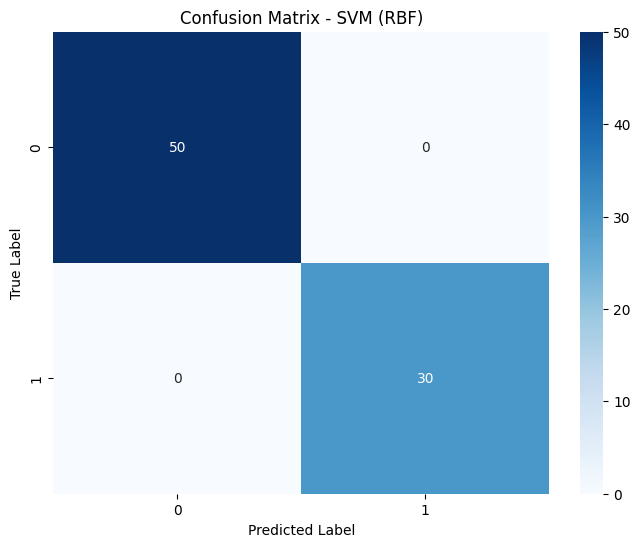

Generating ROC Curve...


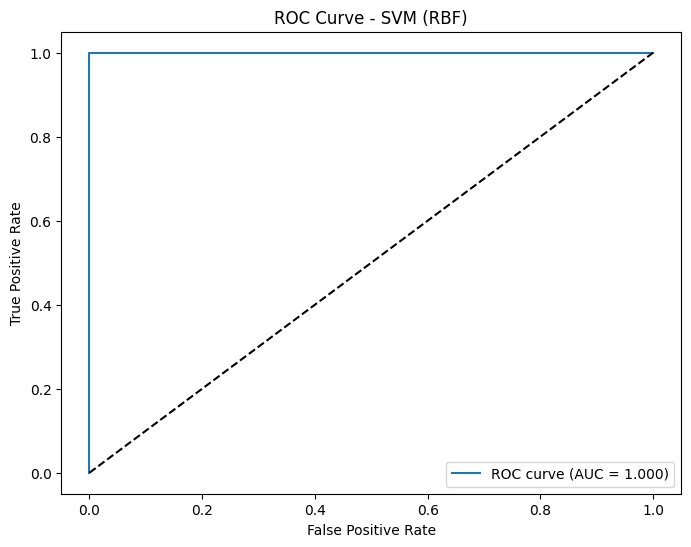

Generating Precision-Recall Curve...


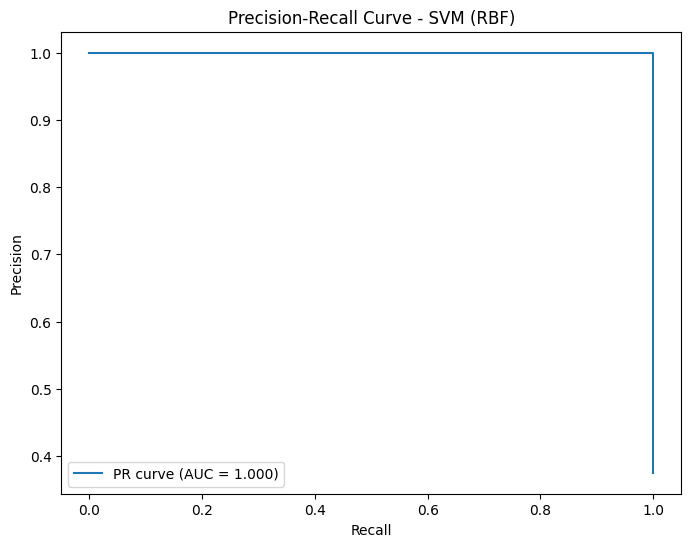

Generating Validation Curve Analysis...


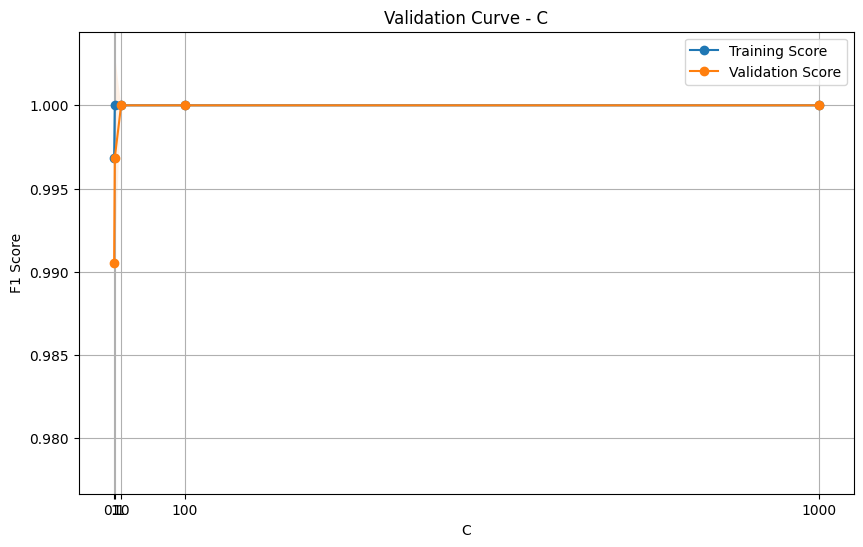

Completed analysis for SVM (RBF)


 ANALYZING: Gradient Boosting
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9500
   Precision: 0.9500
   Recall: 0.9500
   F1 Score: 0.9500
   ROC AUC: 0.9947

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 0.6
n_estimators: 100
min_samples_split: 80

Generating Confusion Matrix...


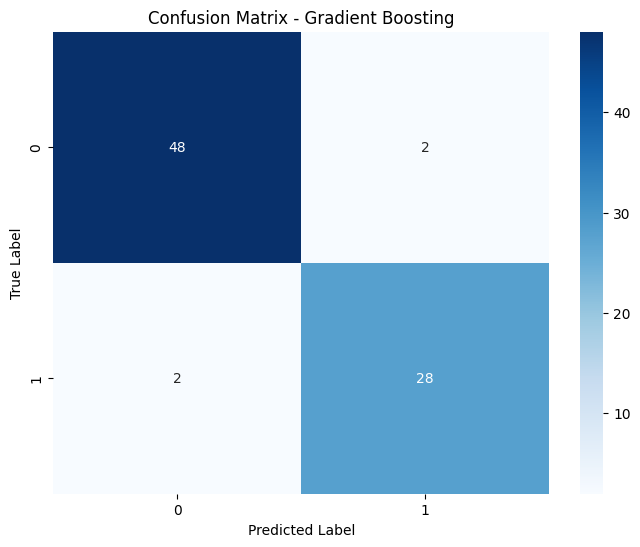

Generating ROC Curve...


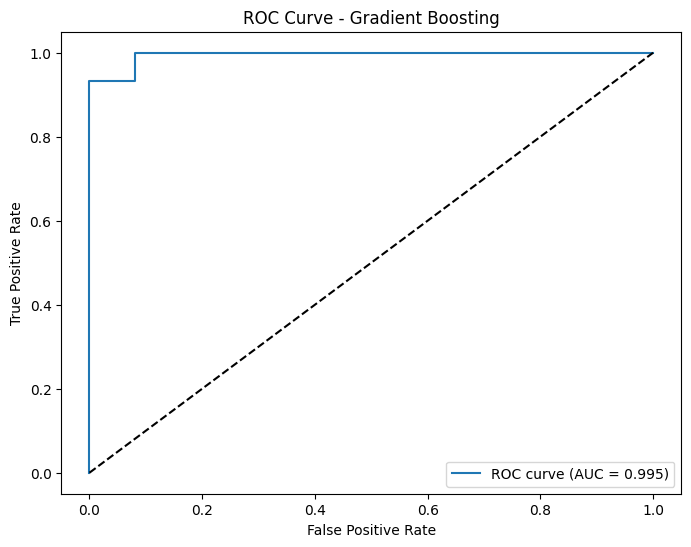

Generating Precision-Recall Curve...


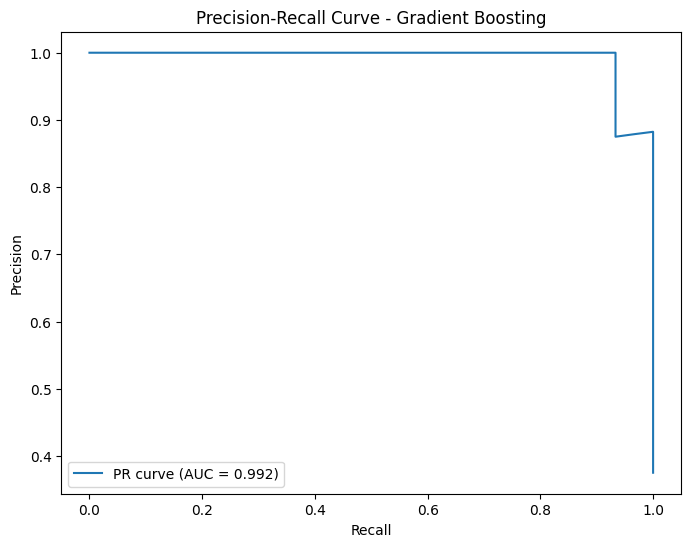

Generating Feature Importance Plot...


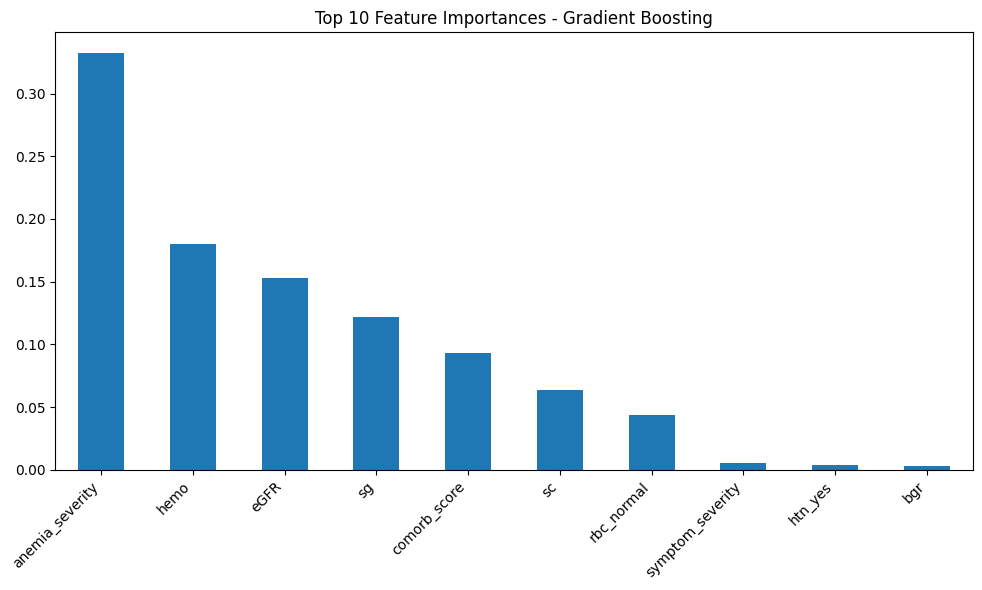

Generating Validation Curve Analysis...
Completed analysis for Gradient Boosting


 ANALYZING: Decision Tree
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.8750
   Precision: 0.8883
   Recall: 0.8750
   F1 Score: 0.8767
   ROC AUC: 0.8867

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
min_samples_split: 40
min_samples_leaf: 40
min_impurity_decrease: 0.05

Generating Confusion Matrix...


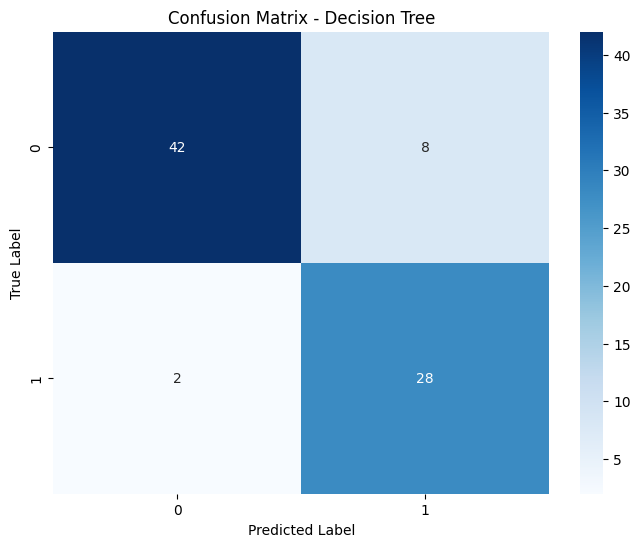

Generating ROC Curve...


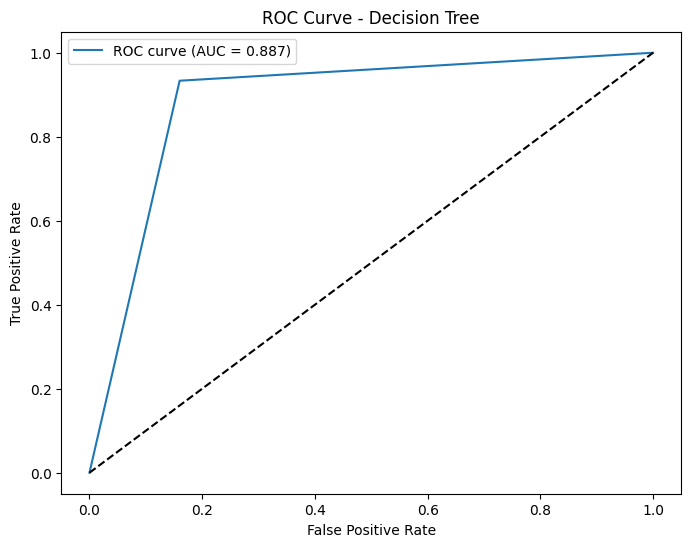

Generating Precision-Recall Curve...


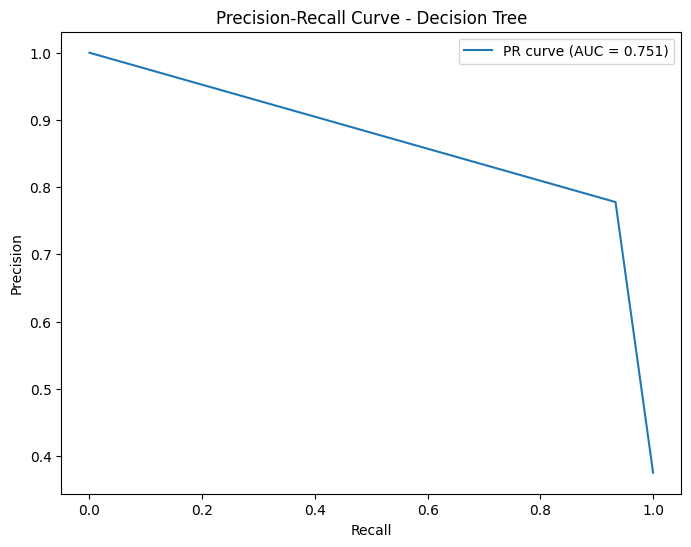

Generating Feature Importance Plot...


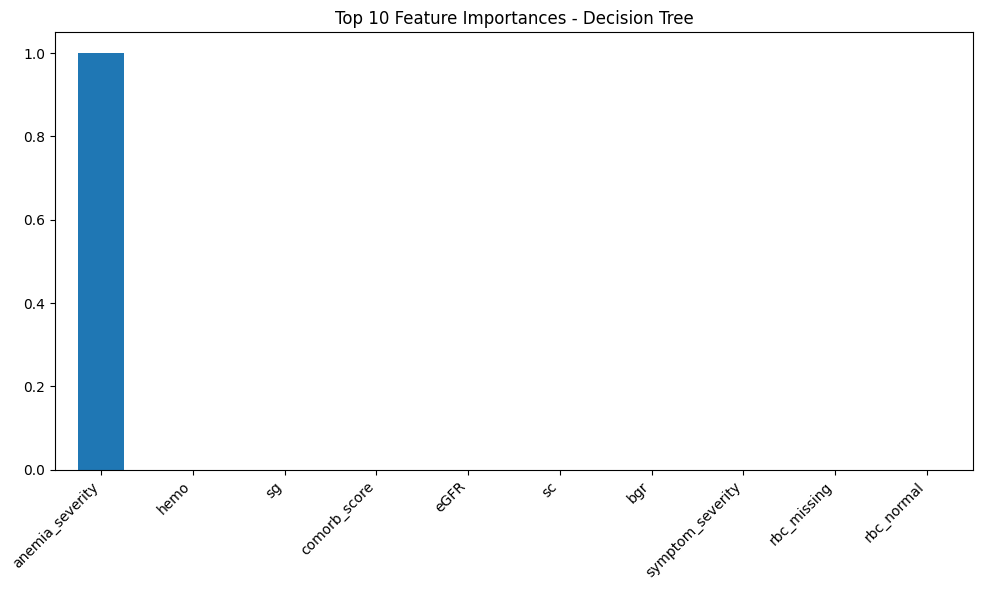

Generating Validation Curve Analysis...
Completed analysis for Decision Tree


 ANALYZING: K-Nearest Neighbors
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
weights: distance
p: 2
n_neighbors: 21

Generating Confusion Matrix...


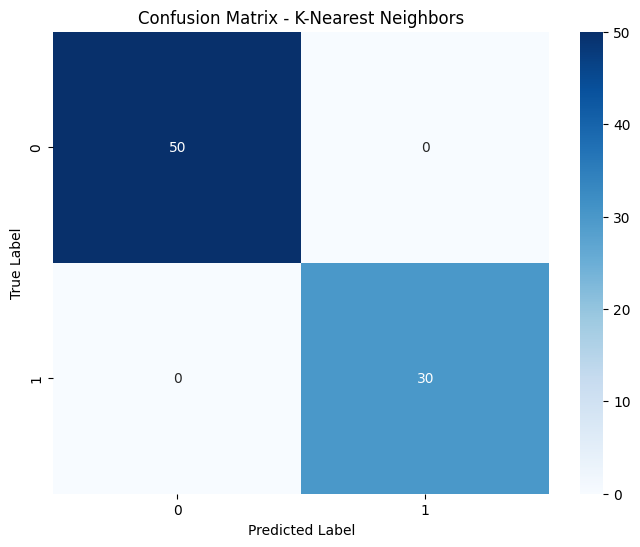

Generating ROC Curve...


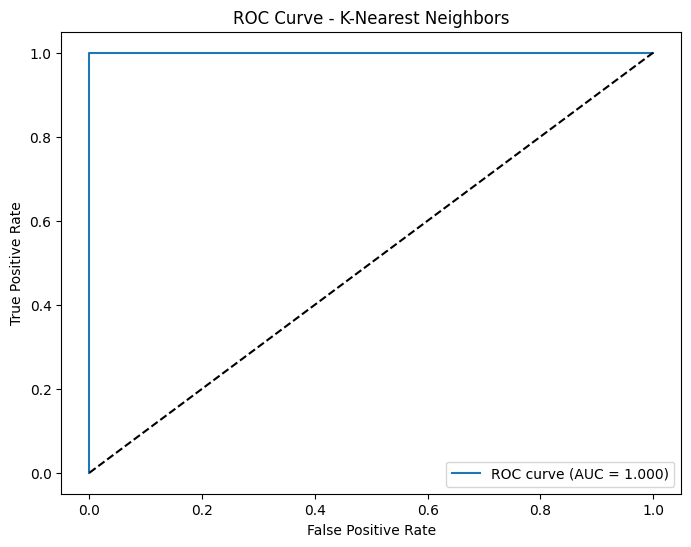

Generating Precision-Recall Curve...


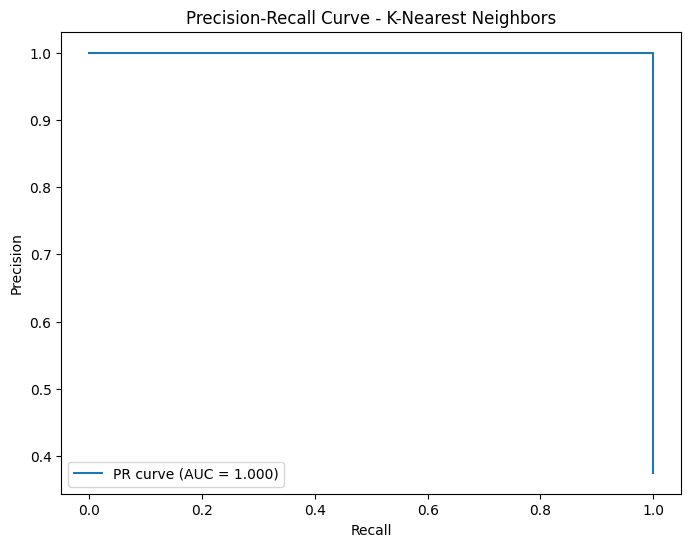

Generating Validation Curve Analysis...
Completed analysis for K-Nearest Neighbors


 ANALYZING: Linear Discriminant Analysis
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: -0.0083
 Search Method: GridSearchCV (exhaustive)
Key Tuned Parameters:
n_components: None
priors: None
shrinkage: 0.3

Generating Confusion Matrix...


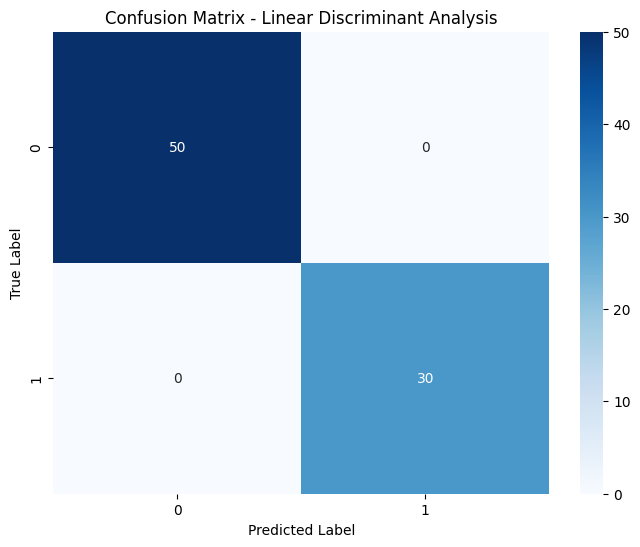

Generating ROC Curve...


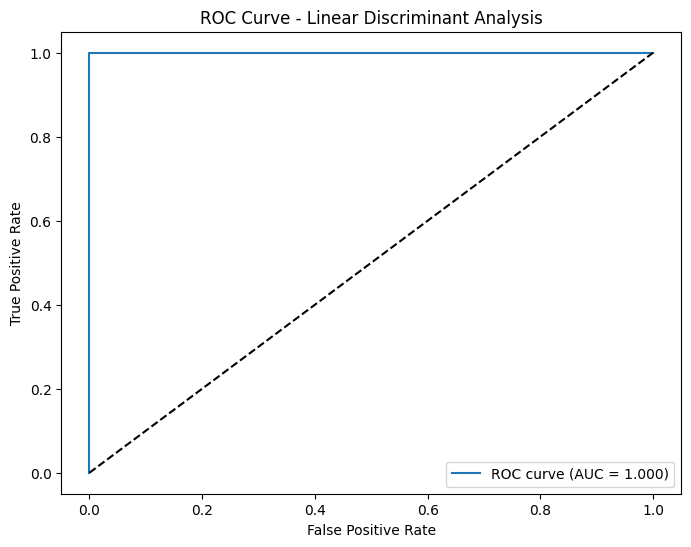

Generating Precision-Recall Curve...


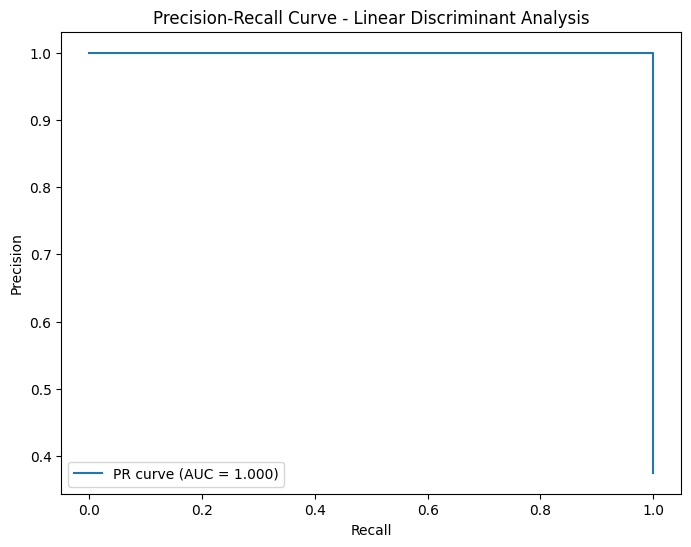

Generating Validation Curve Analysis...
Completed analysis for Linear Discriminant Analysis


 ANALYZING: Multi-layer Perceptron
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
validation_fraction: 0.2
solver: adam
learning_rate_init: 0.001

Generating Confusion Matrix...


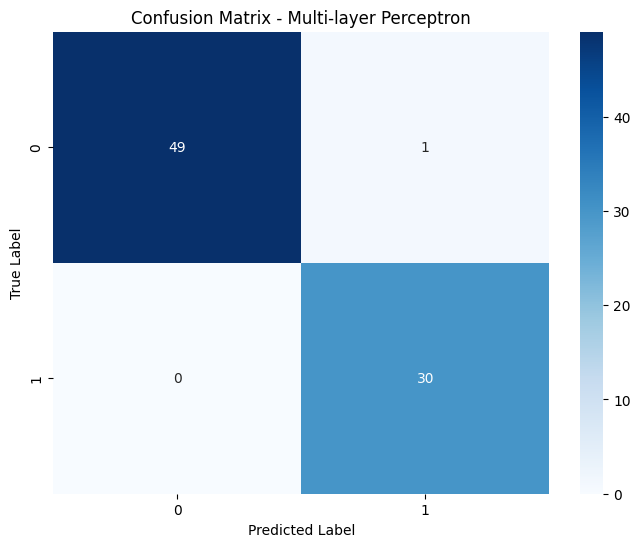

Generating ROC Curve...


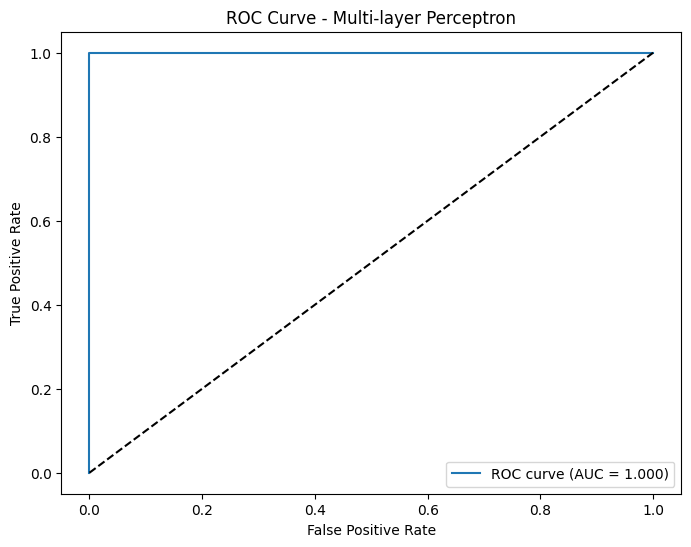

Generating Precision-Recall Curve...


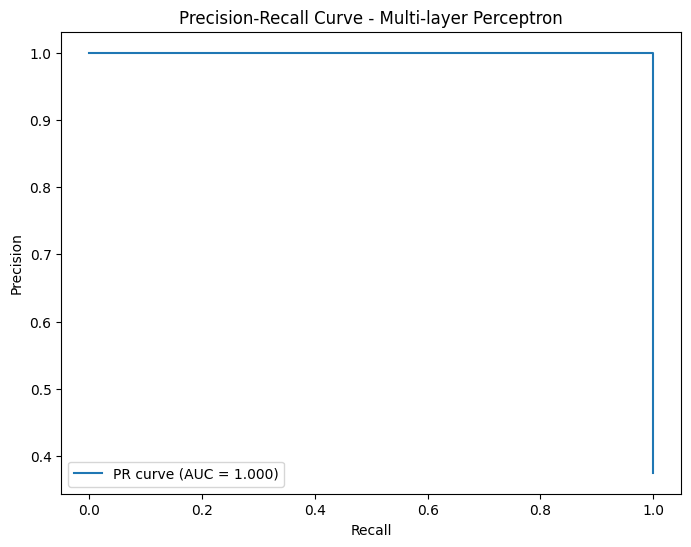

Generating Validation Curve Analysis...
Completed analysis for Multi-layer Perceptron


 ANALYZING: SGD Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 1.0000
   Precision: 1.0000
   Recall: 1.0000
   F1 Score: 1.0000
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
validation_fraction: 0.3
penalty: l1
learning_rate: constant

Generating Confusion Matrix...


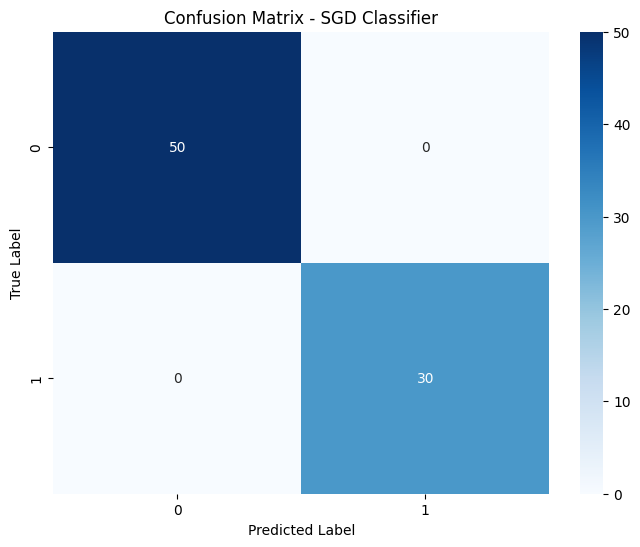

Generating ROC Curve...


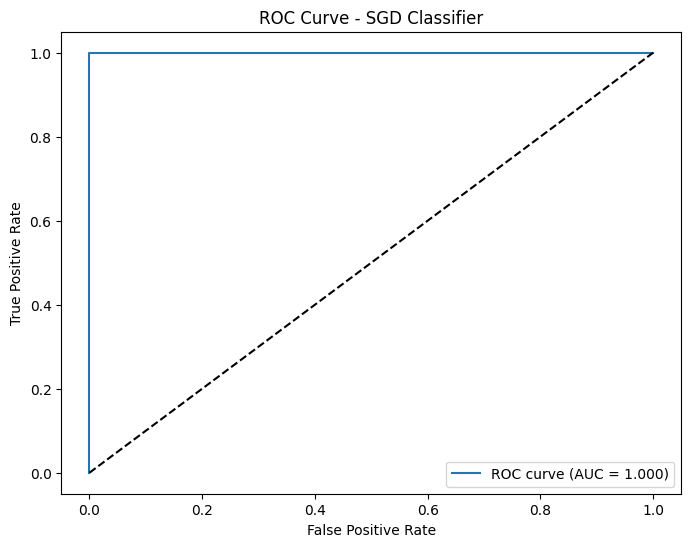

Generating Precision-Recall Curve...


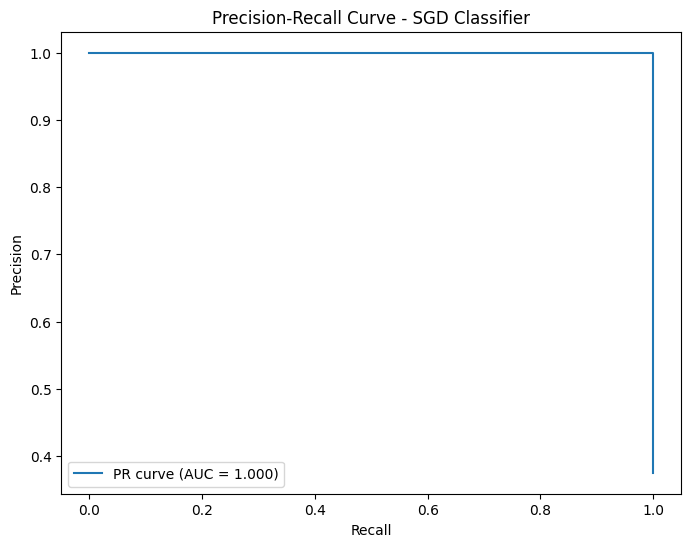

Generating Validation Curve Analysis...
Completed analysis for SGD Classifier


 ANALYZING: Gaussian Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9000
   Precision: 0.9211
   Recall: 0.9000
   F1 Score: 0.9015
   ROC AUC: 1.0000

Generating Confusion Matrix...


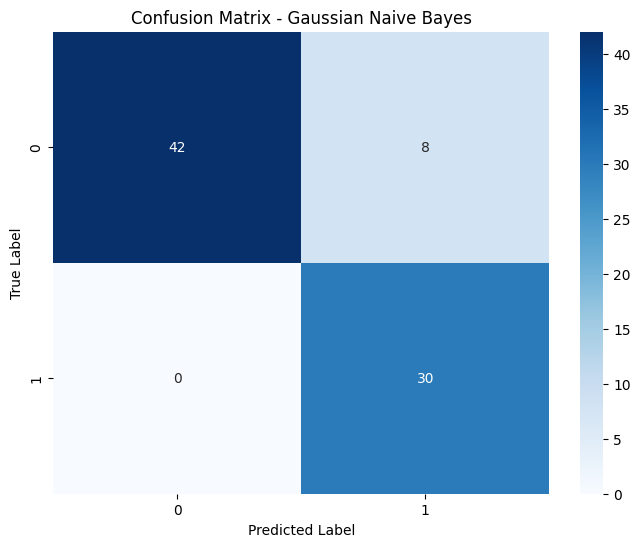

Generating ROC Curve...


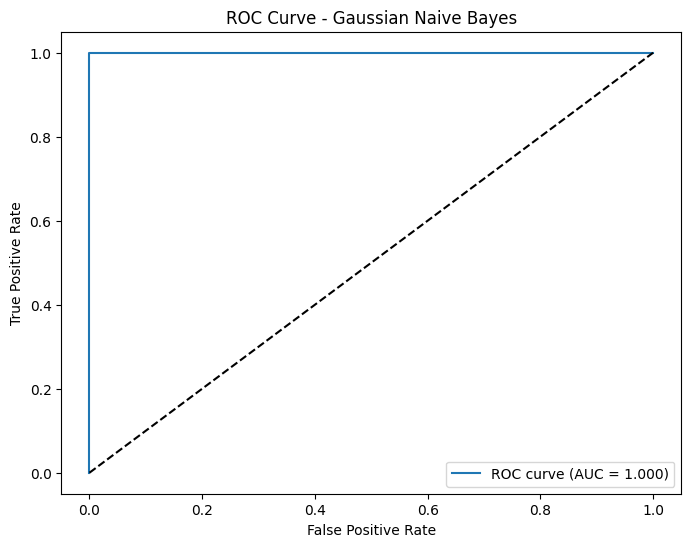

Generating Precision-Recall Curve...


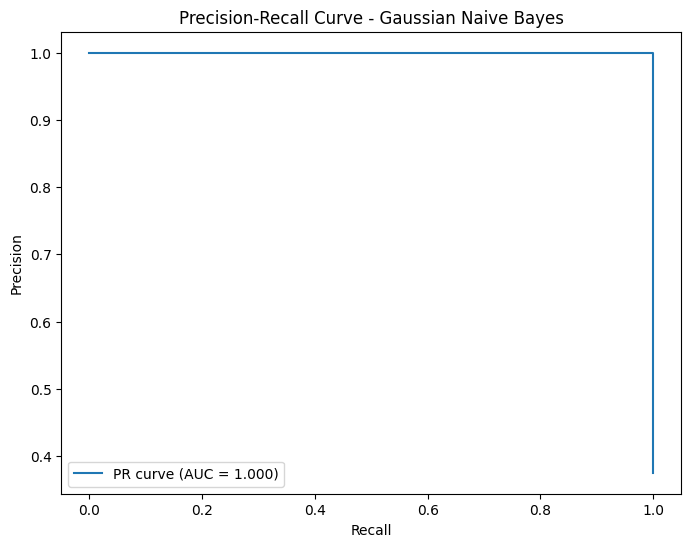

Generating Validation Curve Analysis...
Completed analysis for Gaussian Naive Bayes


 ANALYZING: Bernoulli Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9766
   Recall: 0.9750
   F1 Score: 0.9751
   ROC AUC: 1.0000

Generating Confusion Matrix...


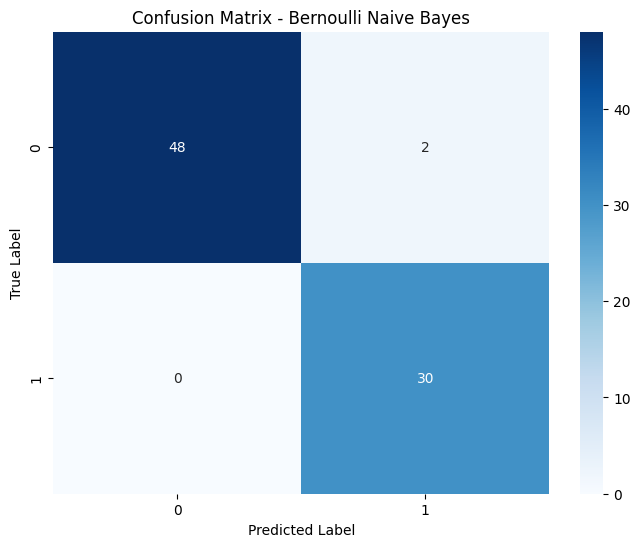

Generating ROC Curve...


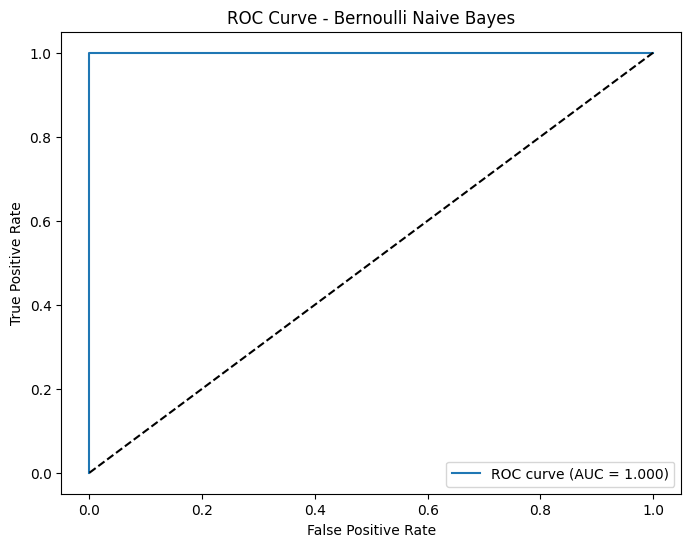

Generating Precision-Recall Curve...


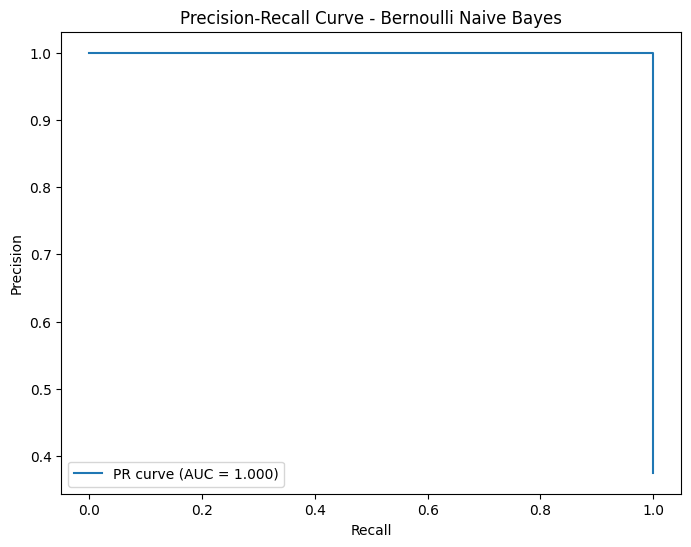

Generating Validation Curve Analysis...
Completed analysis for Bernoulli Naive Bayes


 ANALYZING: Dummy Classifier (Stratified)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.5000
   Precision: 0.4858
   Recall: 0.5000
   F1 Score: 0.4918
   ROC AUC: 0.4533

Generating Confusion Matrix...


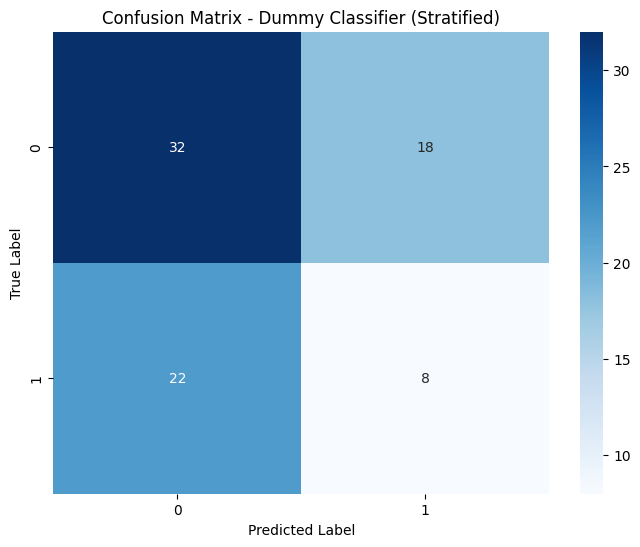

Generating ROC Curve...


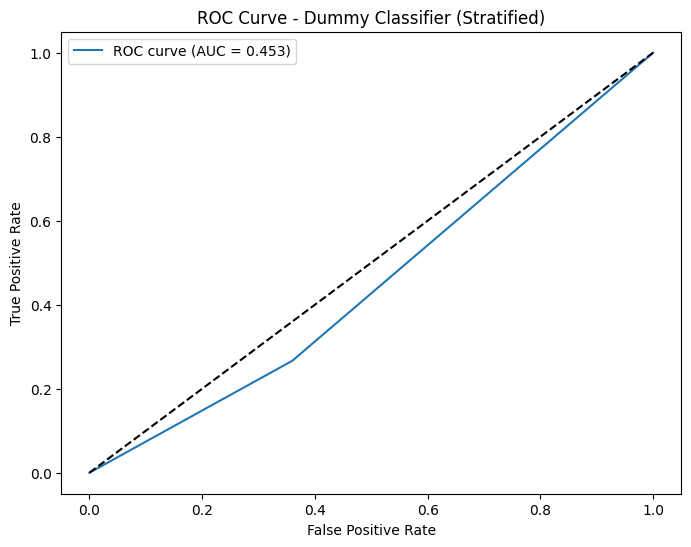

Generating Precision-Recall Curve...


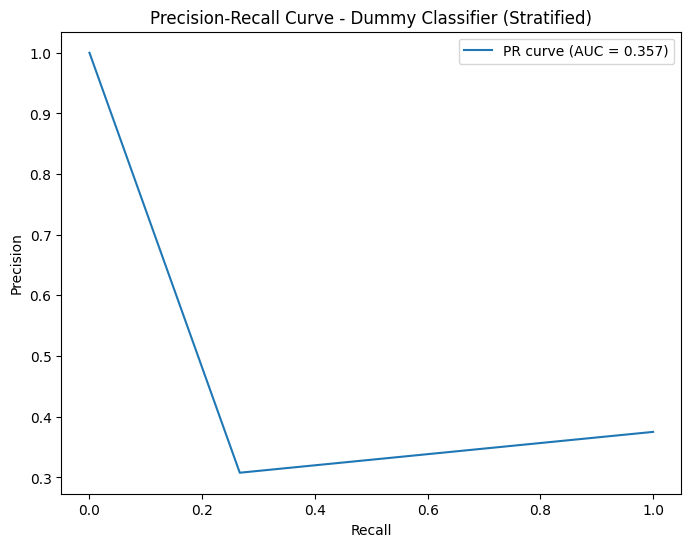

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Stratified)


 ANALYZING: Dummy Classifier (Most Frequent)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.6250
   Precision: 0.3906
   Recall: 0.6250
   F1 Score: 0.4808
   ROC AUC: 0.5000

Generating Confusion Matrix...


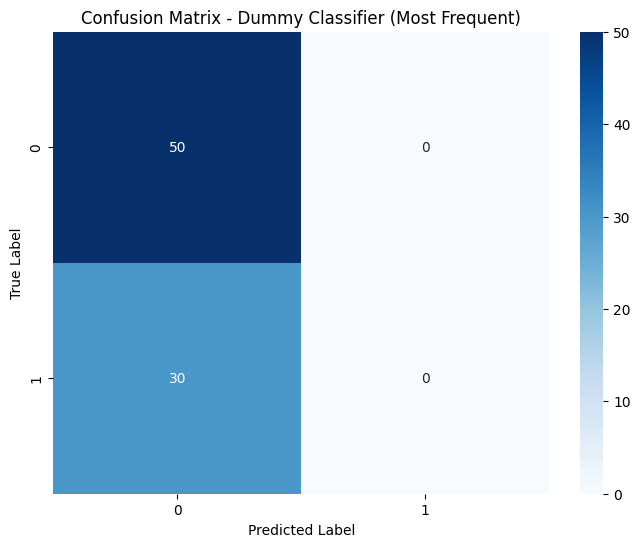

Generating ROC Curve...


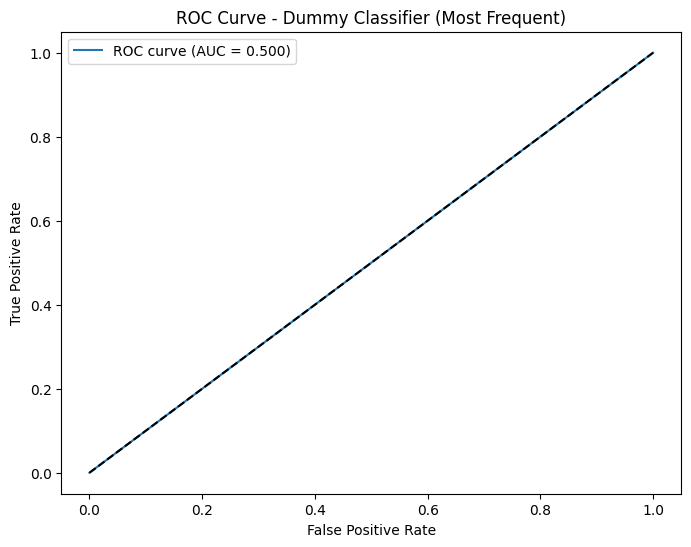

Generating Precision-Recall Curve...


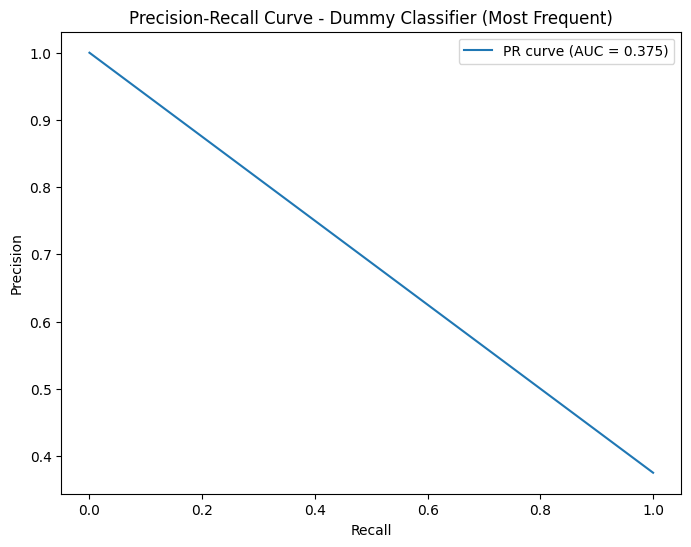

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Most Frequent)


OVERFITTING RISK SUMMARY

Critical CRITICAL OVERFITTING RISK (7 models):
------------------------------------------------------------
   • LightGBM
     Score: 0.800
     - Perfect test score detected (99.9%+) - possible data leakage

   • Logistic Regression
     Score: 1.000
     - High confidence predictions: 87.0% of training predictions are >95% or <5% confident
     - Perfect test score detected (99.9%+) - possible data leakage

   • SVM (RBF)
     Score: 1.000
     - High confidence predictions: 97.5% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • K-Nearest Neighbors
     Score: 1.000
     - High confidence predictions: 100.0% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • Linear Discriminant Analysis
     Score: 1.000
     - High 

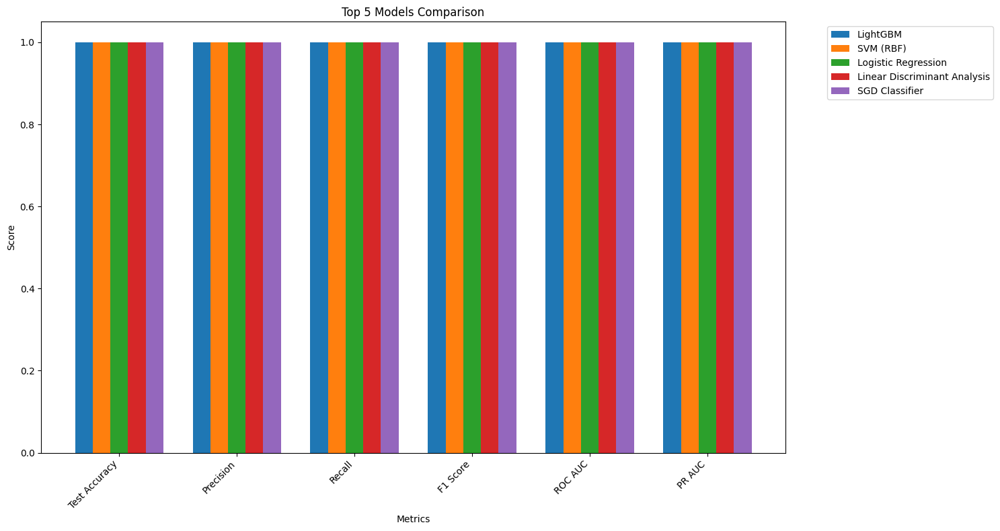

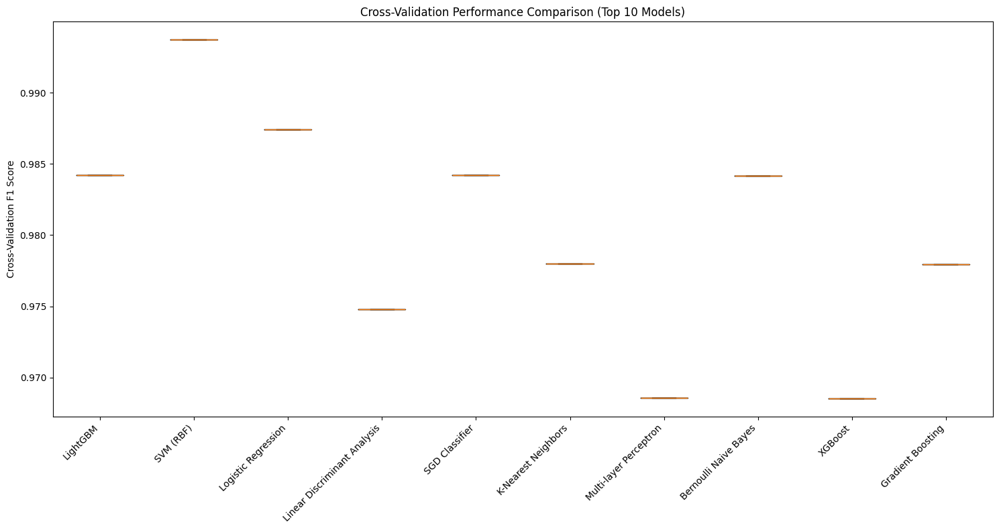


Generating Hyperparameter Tuning Summary Visualization...


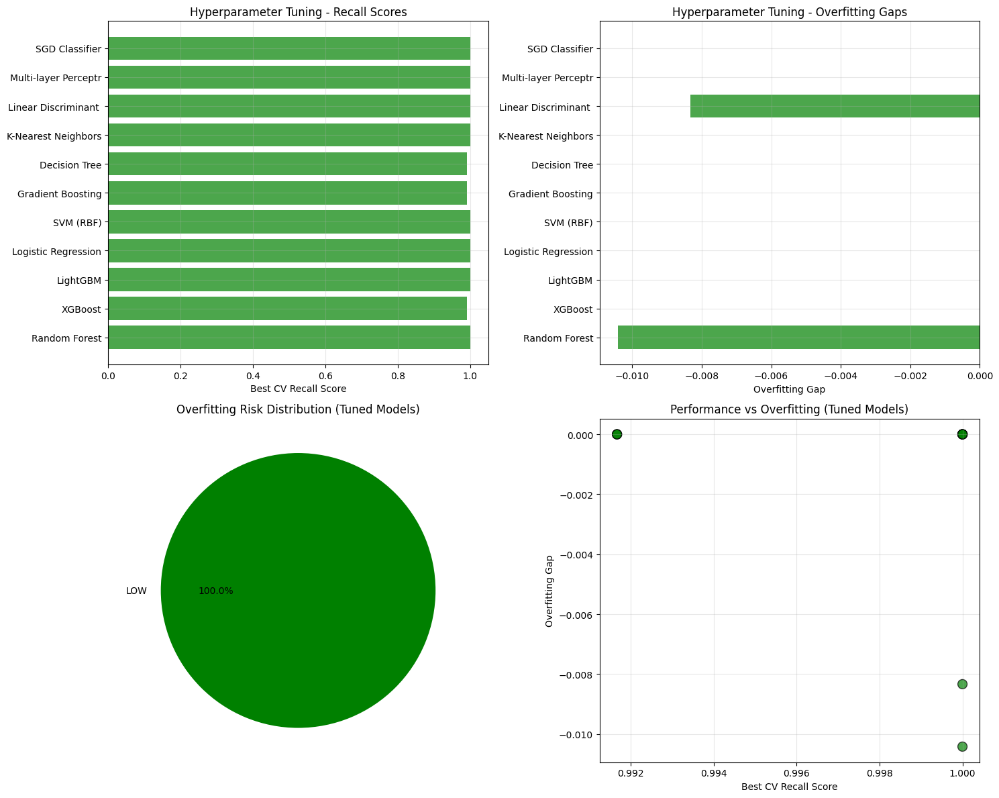


HYPERPARAMETER TUNING STATISTICS:
   Models Tuned: 11
   Best Recall Score: 1.0000
   Lowest Overfitting Gap: -0.0104
   Average Recall Improvement: 0.9977
   Average Overfitting Gap: -0.0017

 FINAL HEALTHCARE RECOMMENDATIONS
RECOMMENDED MODEL: Logistic Regression
   Healthcare Score: 2.0856
   Recall (Sensitivity): 1.0000
   Precision: 1.0000
   F1 Score: 1.0000
   Overfitting Risk: CRITICAL
   Hyperparameter Optimization:
   Tuning Method: RandomizedSearchCV (n_iter=100)
   CV Recall Score: 1.0000
   Overfitting Gap: 0.0000
\ TOPn 3 SAFE MODELS FOR HEALTHCARE:
   1.   Bernoulli Naive Bayes (Score: 1.1844, Risk: highMEDIUM)
   2.   Gradient Boosting (Score: 1.0687, Risk: LowLOW)
   3.   Multi-layer Perceptron (Score: 1.0541, Risk: LowLOW)

MODELS TO AVOID IN HEALTHCARE:
    Logistic Regression (Overfitting Gap: 0.0000)
    SVM (RBF) (Overfitting Gap: 0.0000)
    SGD Classifier (Overfitting Gap: 0.0000)
    K-Nearest Neighbors (Overfitting Gap: 0.0000)
    Linear Discriminant Analysi

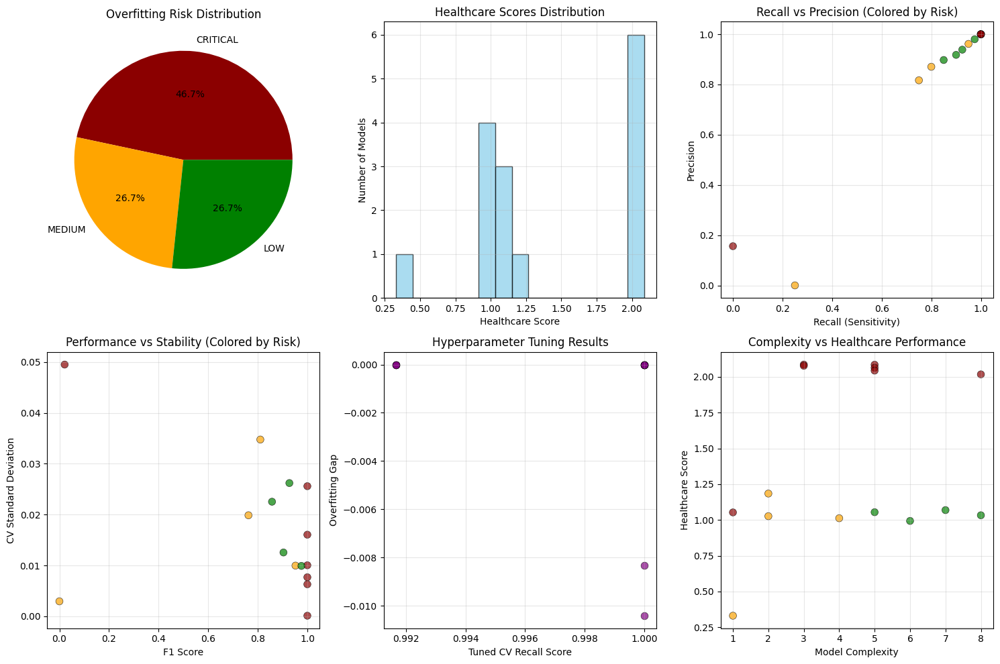


 SUMMARY STATISTICS:
   Total Models Evaluated: 15
   Models with Hyperparameter Tuning: 11
   Low Risk Models: 4
   Medium Risk Models: 4
   High Risk Models: 0
   Critical Risk Models: 7
   Average Healthcare Score: 1.4084
   Average Recall: 0.8267
   Average Precision: 0.8359
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\Random_Forest_v1_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\XGBoost_v1_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\LightGBM_v1_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\Logistic_Regression_v1_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\SVM_RBF_v1_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Predic

In [87]:
results_hyp1 = run_healthcare_ml_pipeline_hyp(X_train_imp1, X_test_imp1, y_train_imp1, y_test_imp1,version_tag="v1_hyp")

print(results_hyp1)

### Version 2


HEALTHCARE ML ANALYSIS PIPELINE
Kidney Disease Detection - Enhanced with Hyperparameter Tuning
   Dataset Info:
   Training samples: 316
   Test samples: 80
   Features: 5
   Classes: 2
   Class distribution: {np.int64(0): np.int64(196), np.int64(1): np.int64(120)}

HEALTHCARE-OPTIMIZED HYPERPARAMETER TUNING
Optimizing for Minimal False Negatives in Kidney Disease Detection

TUNING PRIORITY MODELS (Healthcare Critical):

HEALTHCARE HYPERPARAMETER TUNING: Random Forest
----------------------------------------------------------------------
   Primary Objective: Maximize Recall (Minimize False Negatives)
   Secondary Objective: Minimize Overfitting
   Cross-Validation Folds: 5
   Scoring Metric: recall
   Parameter combinations to test: 81920
   Search Strategy: RandomizedSearchCV (n_iter=100)
   Training in progress...

HYPERPARAMETER TUNING RESULTS:
   Best RECALL Score (CV): 1.0000
   Training Score: 0.9938
   Overfitting Gap: -0.0062
   Overfitting Ratio: -0.0063
   Low risk Overfitt

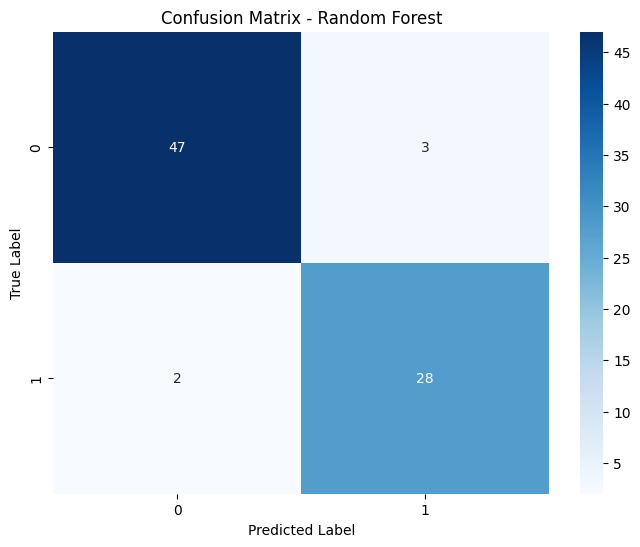

Generating ROC Curve...


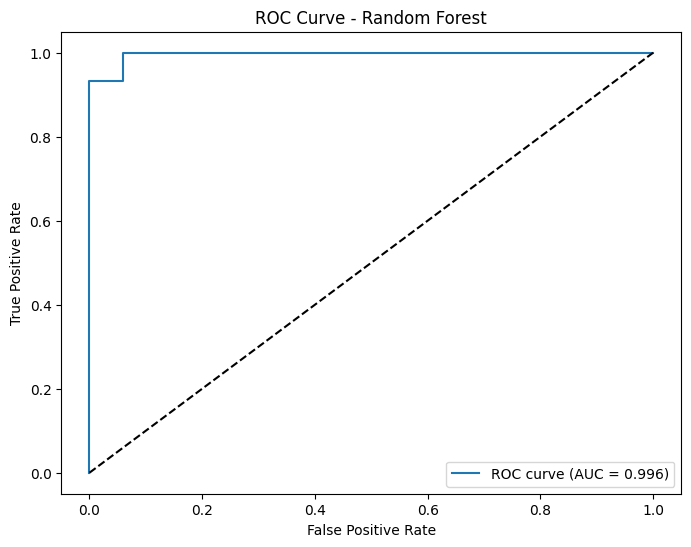

Generating Precision-Recall Curve...


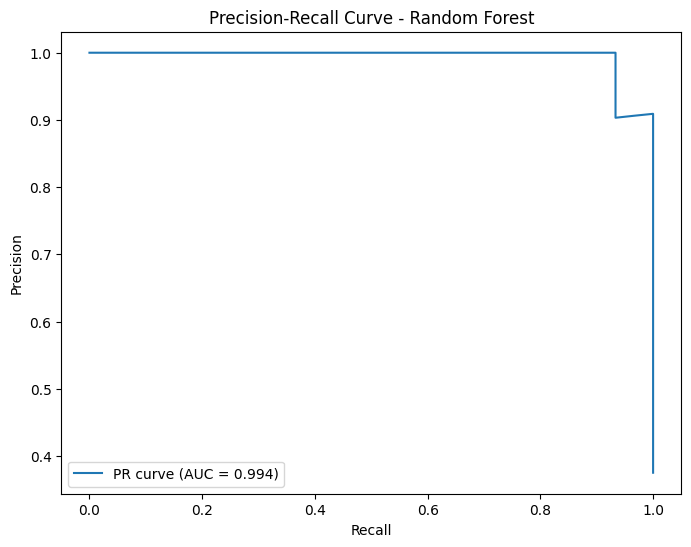

Generating Feature Importance Plot...


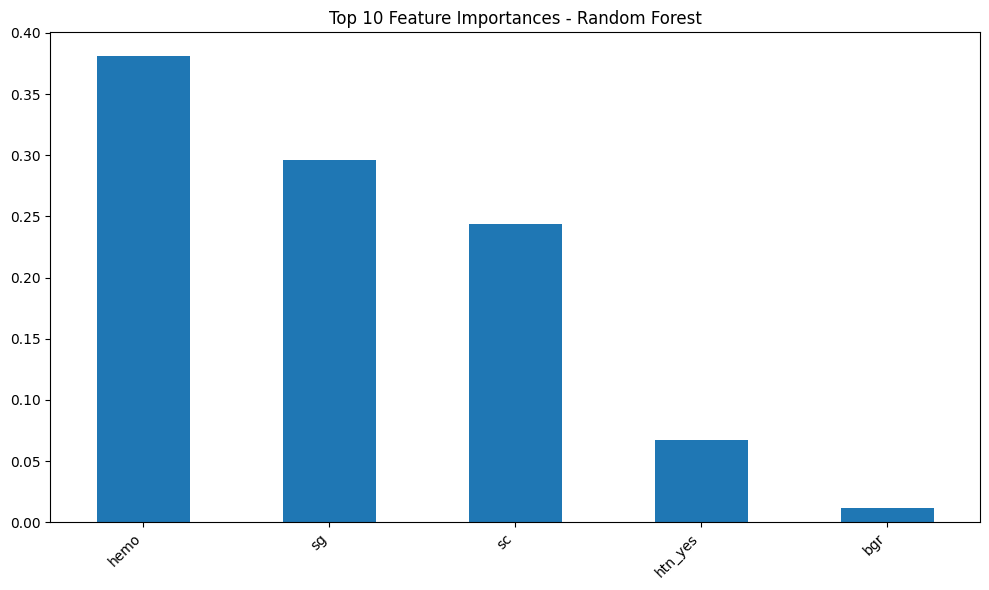

Generating Validation Curve Analysis...


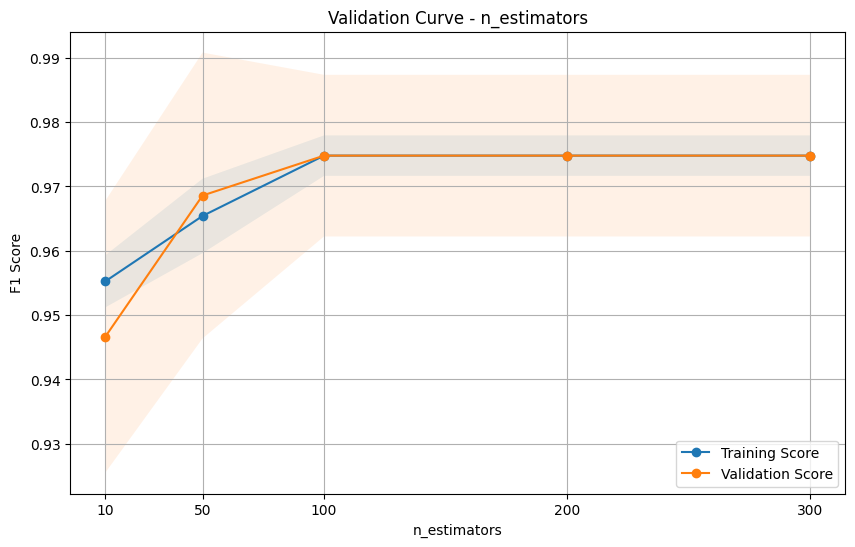

Completed analysis for Random Forest


 ANALYZING: XGBoost
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9953

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 1
scale_pos_weight: 2
reg_lambda: 1

Generating Confusion Matrix...


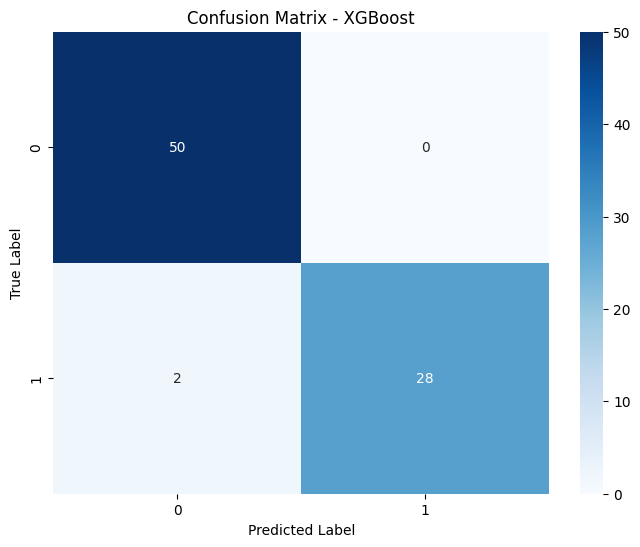

Generating ROC Curve...


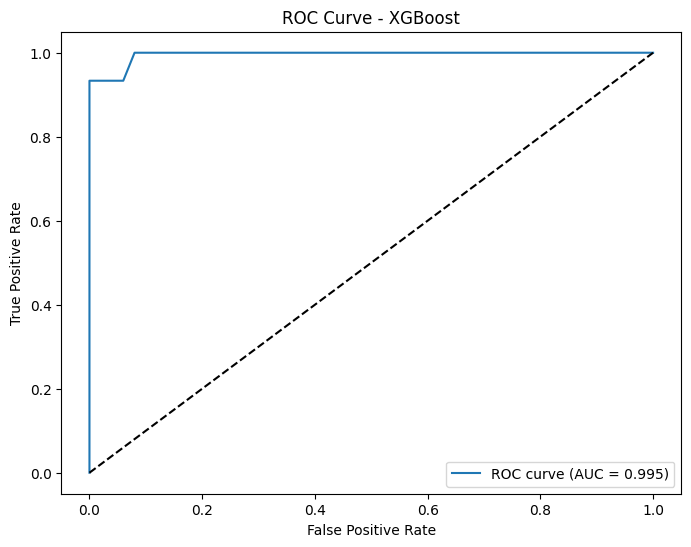

Generating Precision-Recall Curve...


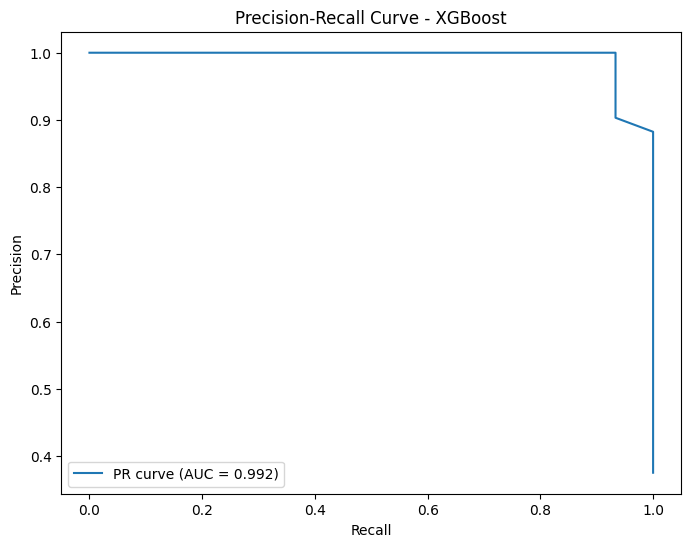

Generating Feature Importance Plot...


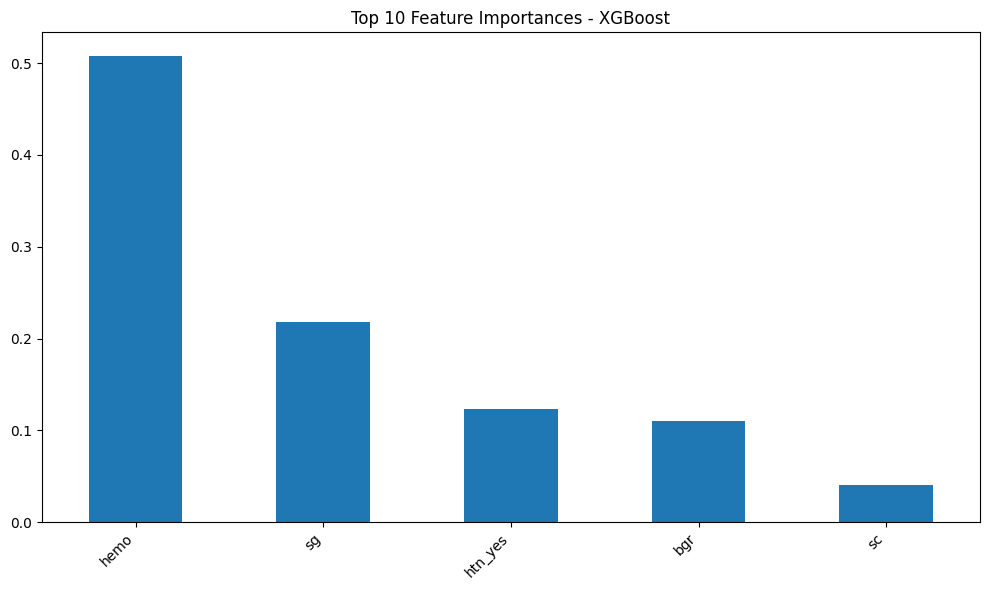

Generating Validation Curve Analysis...


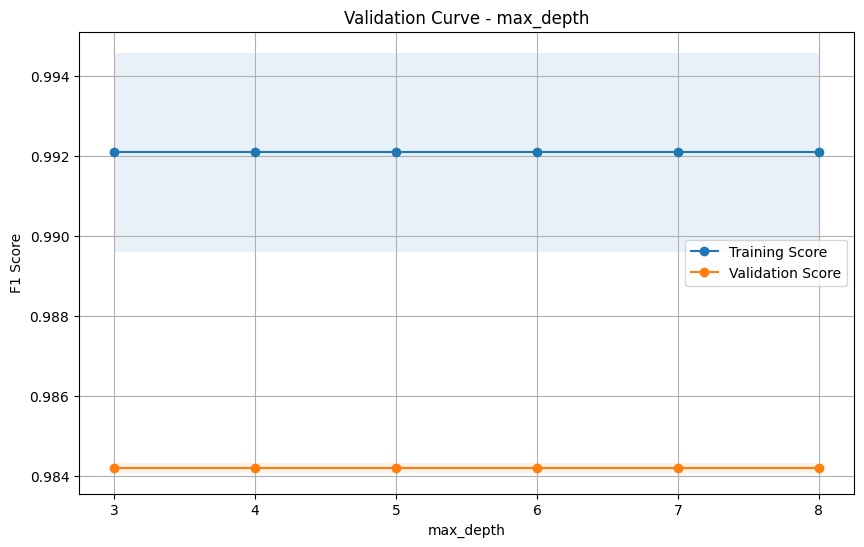

Completed analysis for XGBoost


 ANALYZING: LightGBM
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9920

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 0.9
reg_lambda: 0.1
reg_alpha: 1

Generating Confusion Matrix...


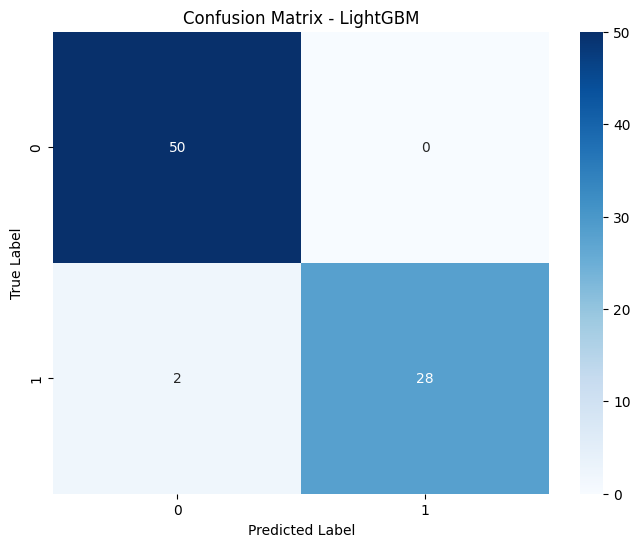

Generating ROC Curve...


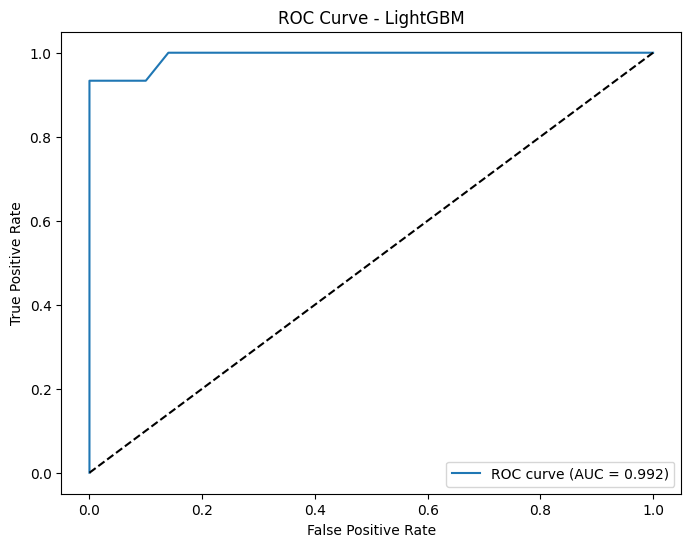

Generating Precision-Recall Curve...


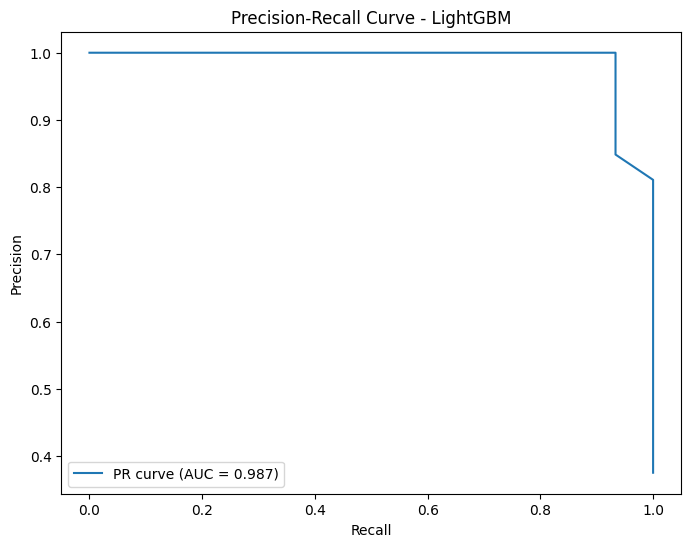

Generating Feature Importance Plot...


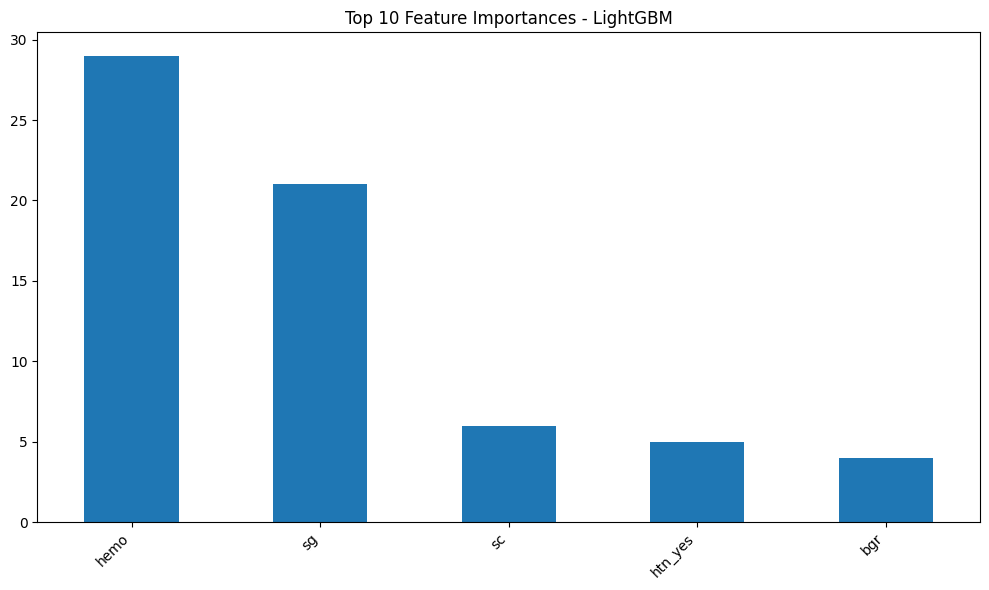

Generating Validation Curve Analysis...


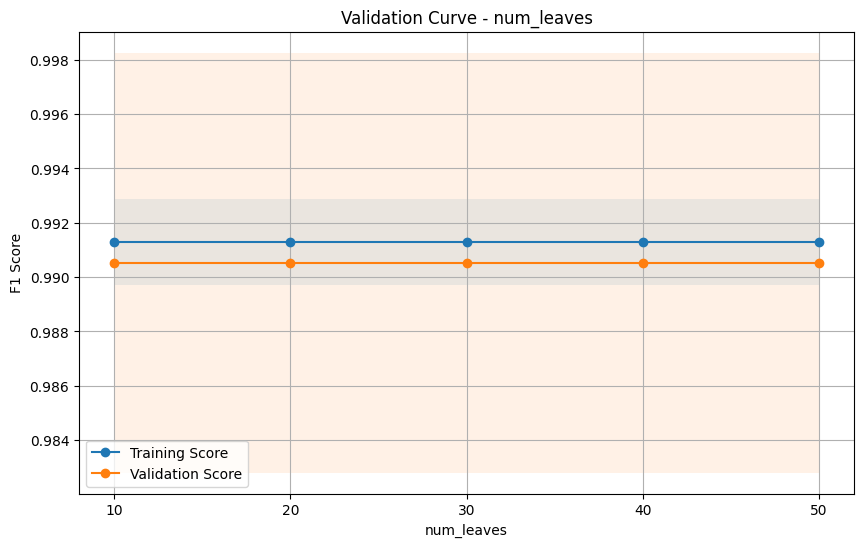

Completed analysis for LightGBM


 ANALYZING: Logistic Regression
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9500
   Precision: 0.9559
   Recall: 0.9500
   F1 Score: 0.9505
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
solver: liblinear
penalty: l2
l1_ratio: 0.5

Generating Confusion Matrix...


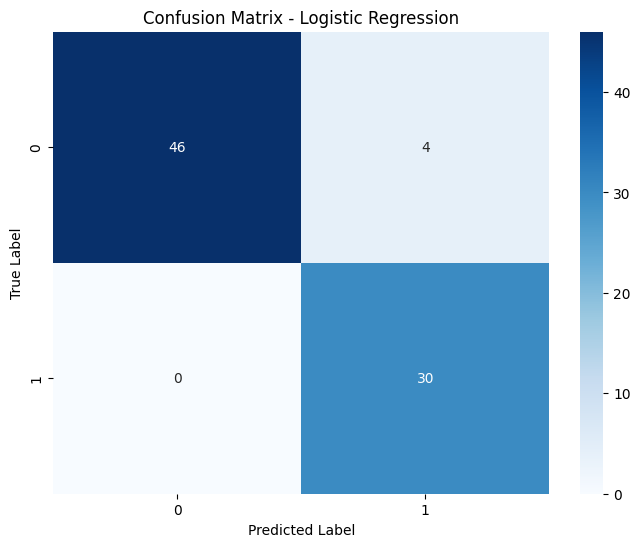

Generating ROC Curve...


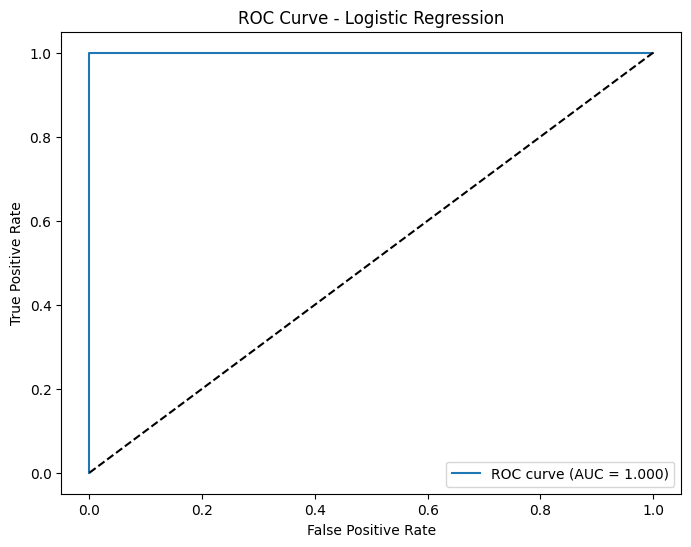

Generating Precision-Recall Curve...


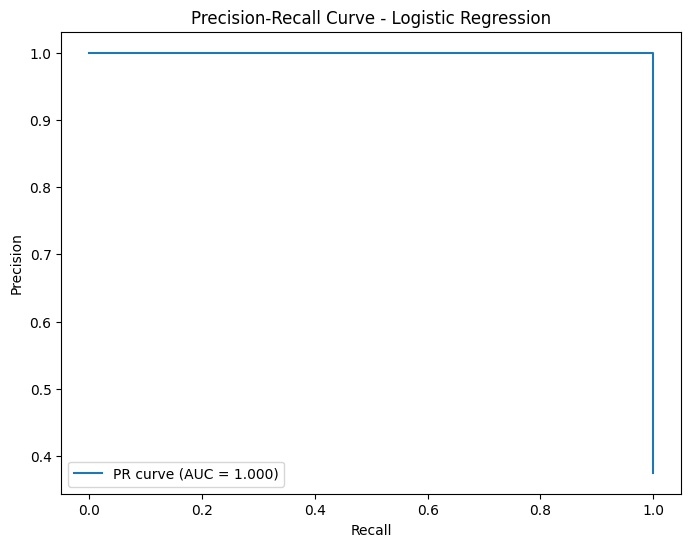

Generating Validation Curve Analysis...


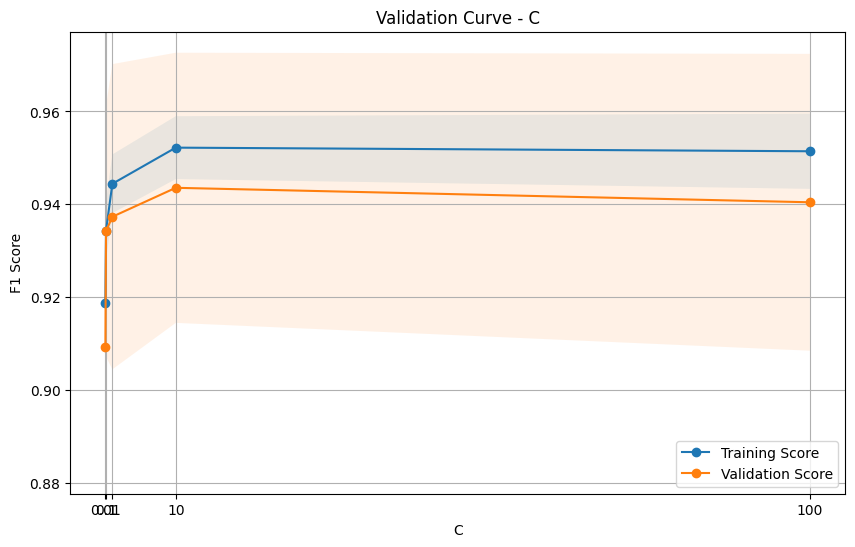

Completed analysis for Logistic Regression


 ANALYZING: SVM (RBF)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
shrinking: True
kernel: rbf
gamma: 0.01

Generating Confusion Matrix...


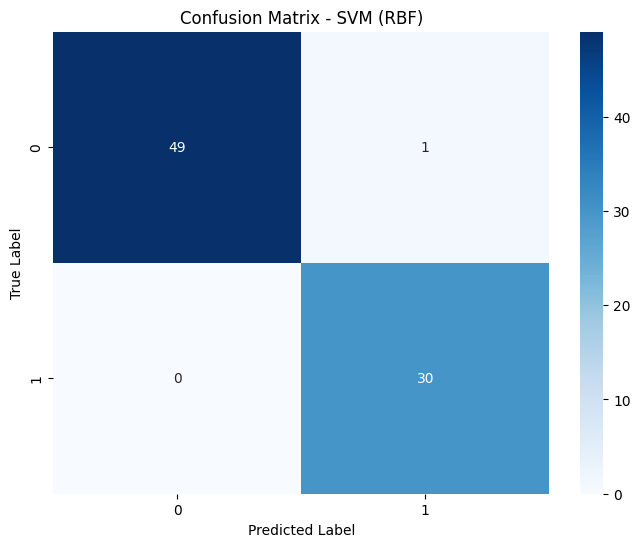

Generating ROC Curve...


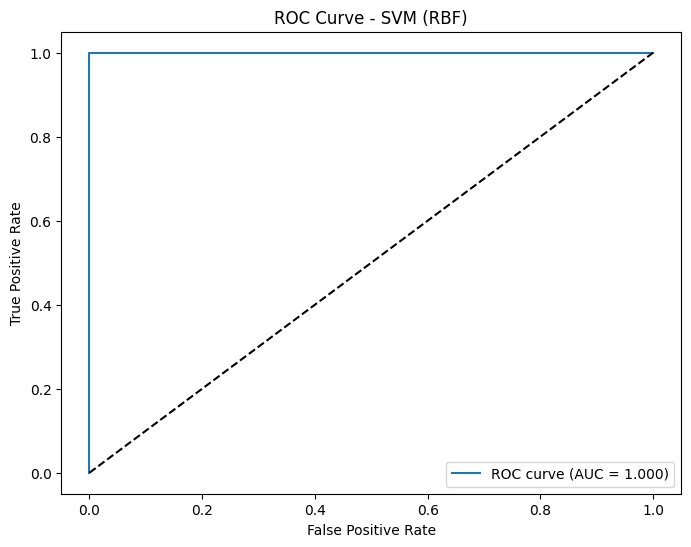

Generating Precision-Recall Curve...


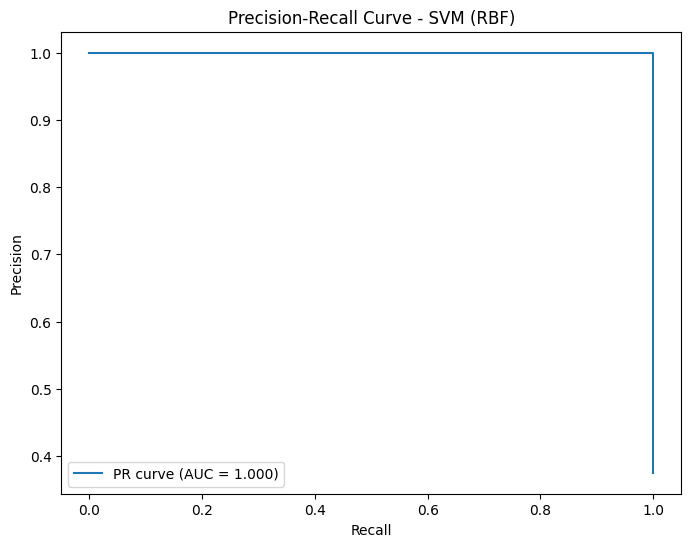

Generating Validation Curve Analysis...


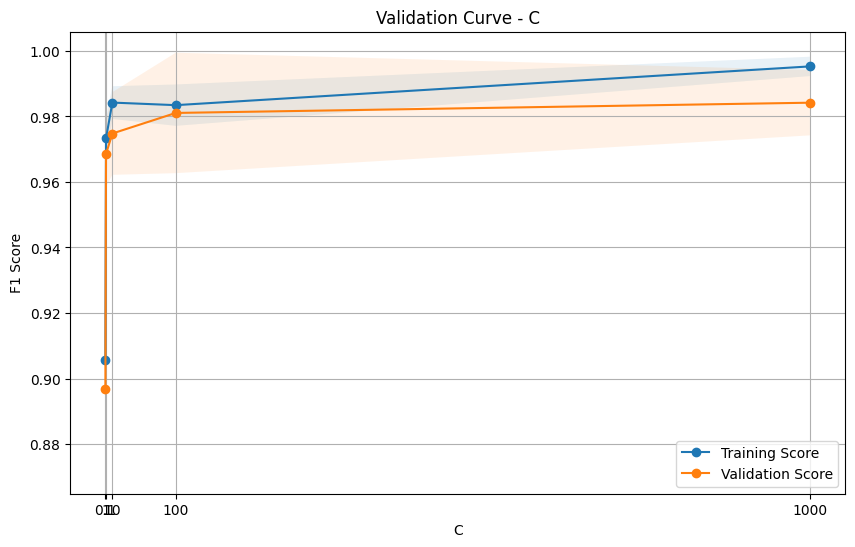

Completed analysis for SVM (RBF)


 ANALYZING: Gradient Boosting
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 0.9993

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9917
 Overfitting Risk: LOW
 Overfitting Gap: -0.0062
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
subsample: 0.8
n_estimators: 10
min_samples_split: 60

Generating Confusion Matrix...


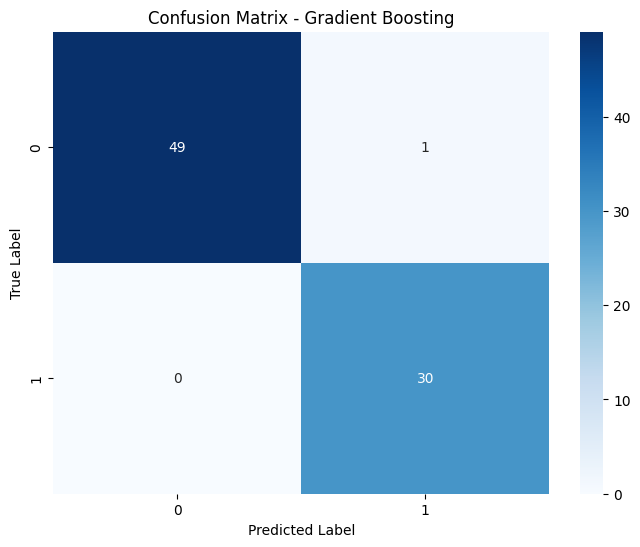

Generating ROC Curve...


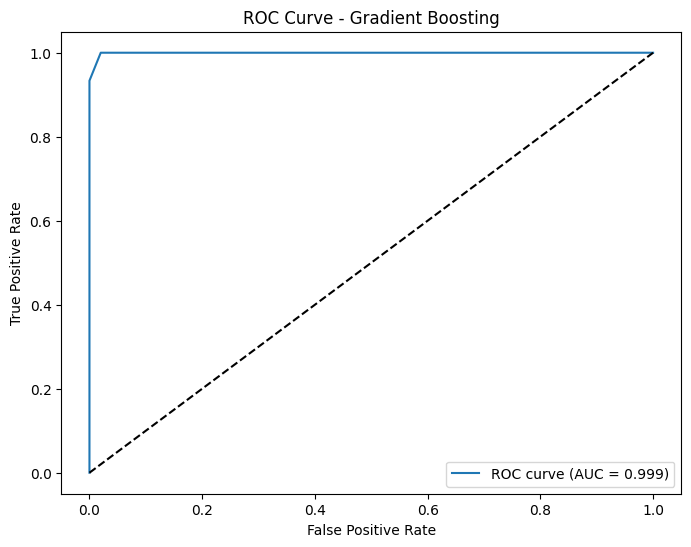

Generating Precision-Recall Curve...


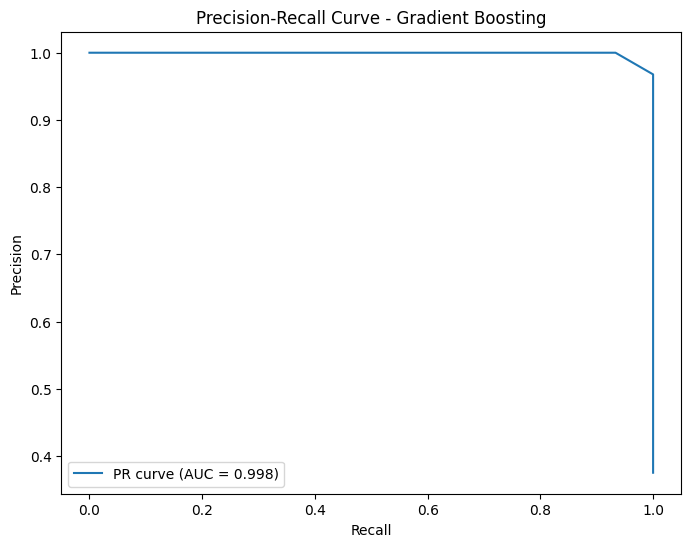

Generating Feature Importance Plot...


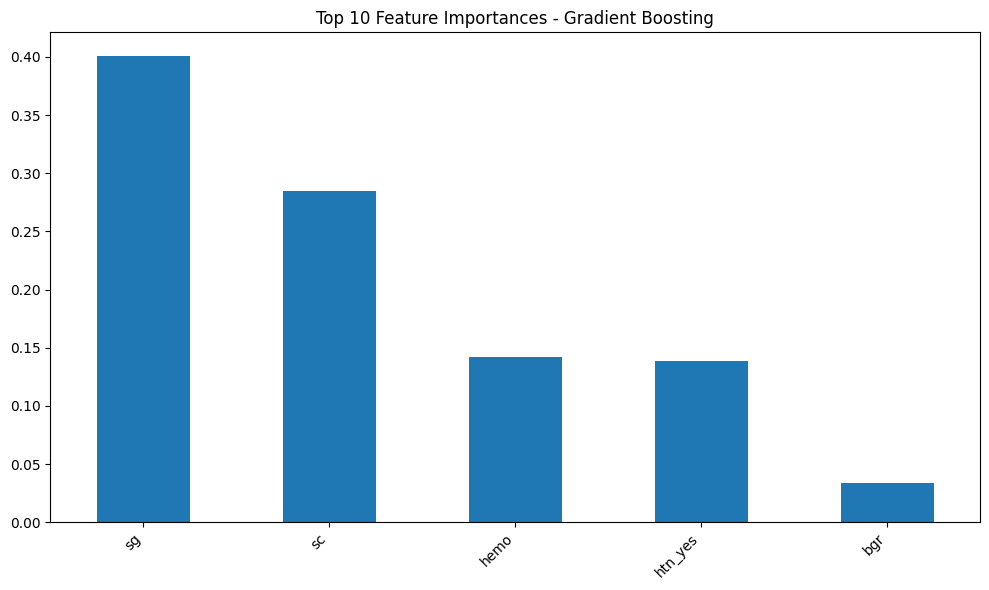

Generating Validation Curve Analysis...
Completed analysis for Gradient Boosting


 ANALYZING: Decision Tree
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.8750
   Precision: 0.8883
   Recall: 0.8750
   F1 Score: 0.8767
   ROC AUC: 0.8867

Hyperparameter Tuning Results:
  Best Recall Score (CV): 0.9750
 Overfitting Risk: LOW
 Overfitting Gap: 0.0146
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
min_samples_split: 40
min_samples_leaf: 40
min_impurity_decrease: 0.05

Generating Confusion Matrix...


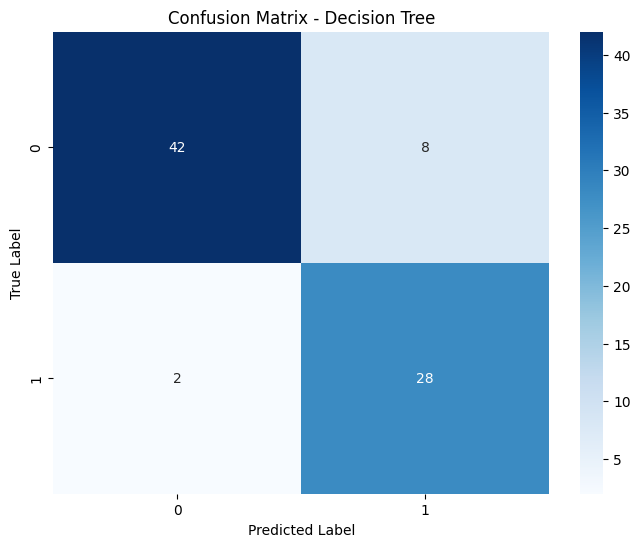

Generating ROC Curve...


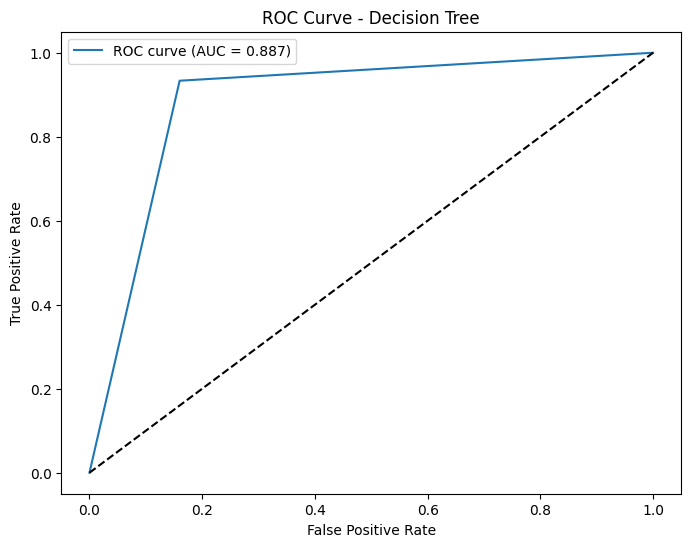

Generating Precision-Recall Curve...


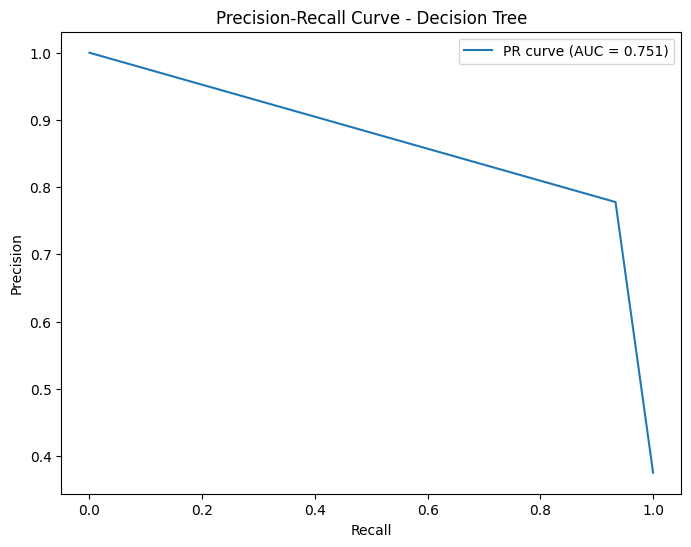

Generating Feature Importance Plot...


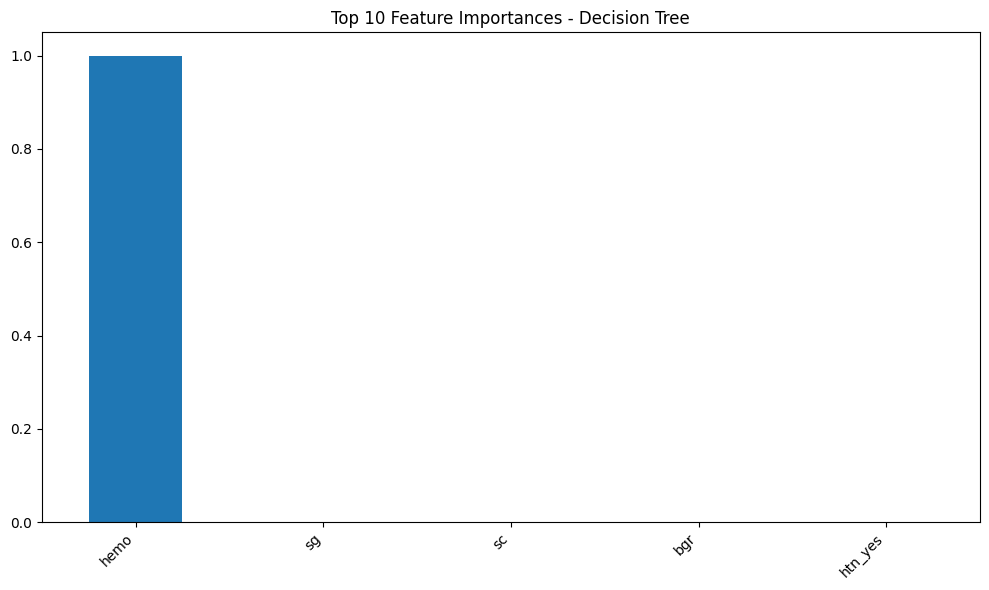

Generating Validation Curve Analysis...
Completed analysis for Decision Tree


 ANALYZING: K-Nearest Neighbors
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9625
   Precision: 0.9659
   Recall: 0.9625
   F1 Score: 0.9628
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
weights: distance
p: 2
n_neighbors: 21

Generating Confusion Matrix...


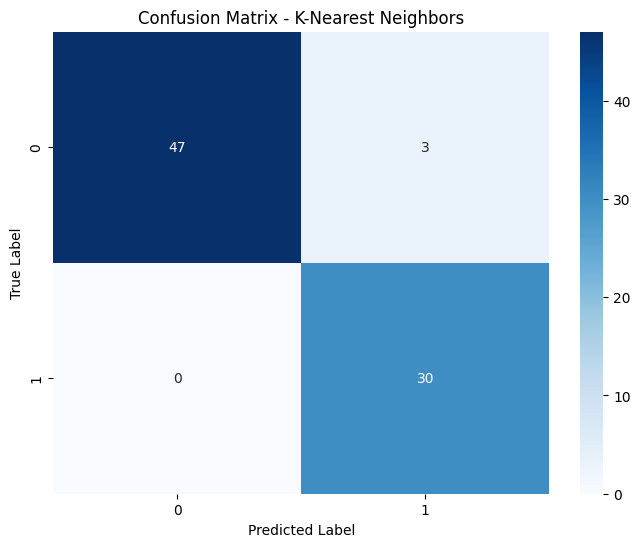

Generating ROC Curve...


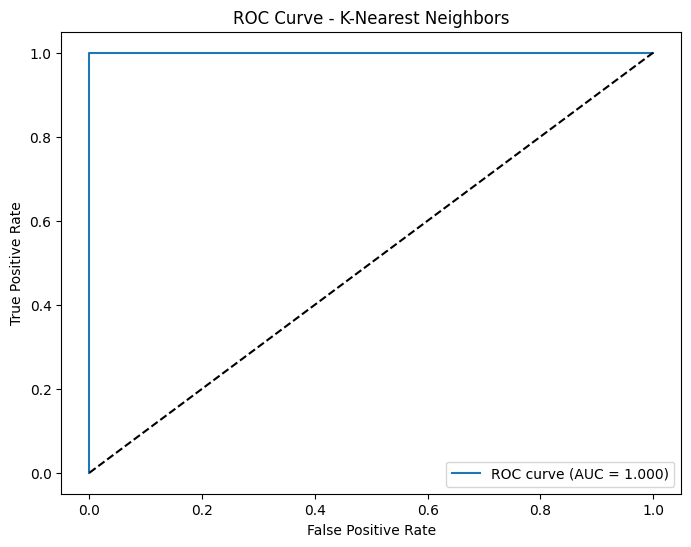

Generating Precision-Recall Curve...


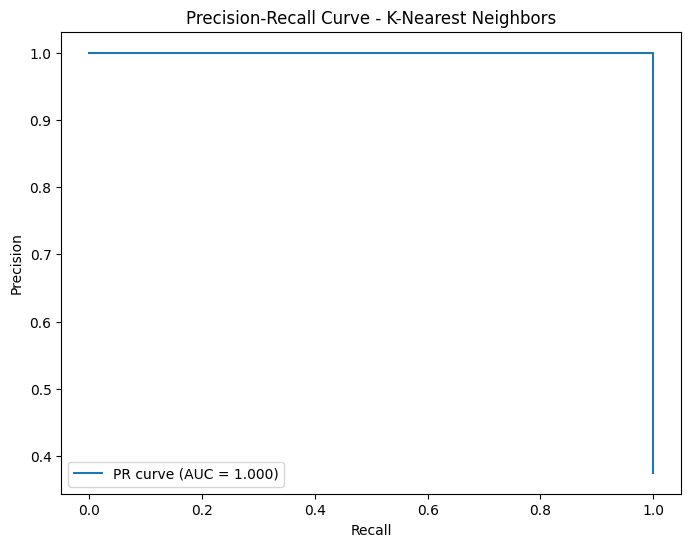

Generating Validation Curve Analysis...
Completed analysis for K-Nearest Neighbors


 ANALYZING: Linear Discriminant Analysis
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: GridSearchCV (exhaustive)
Key Tuned Parameters:
n_components: None
priors: None
shrinkage: None

Generating Confusion Matrix...


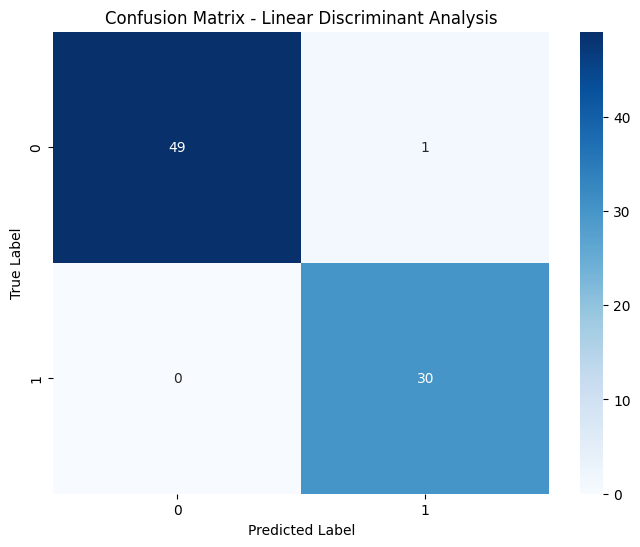

Generating ROC Curve...


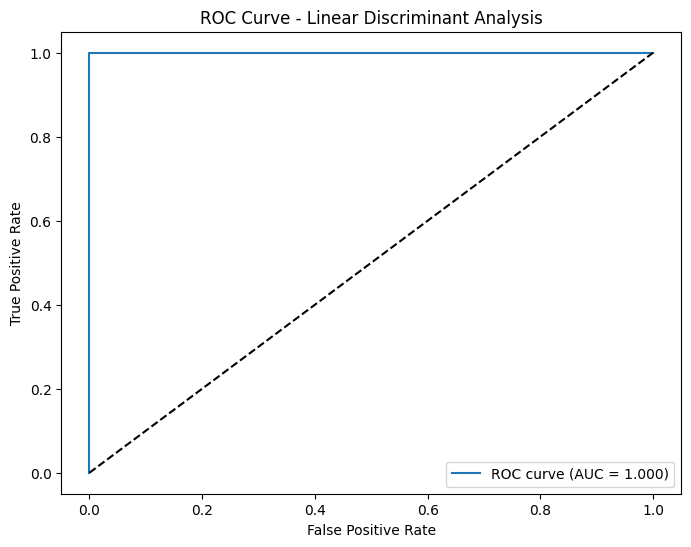

Generating Precision-Recall Curve...


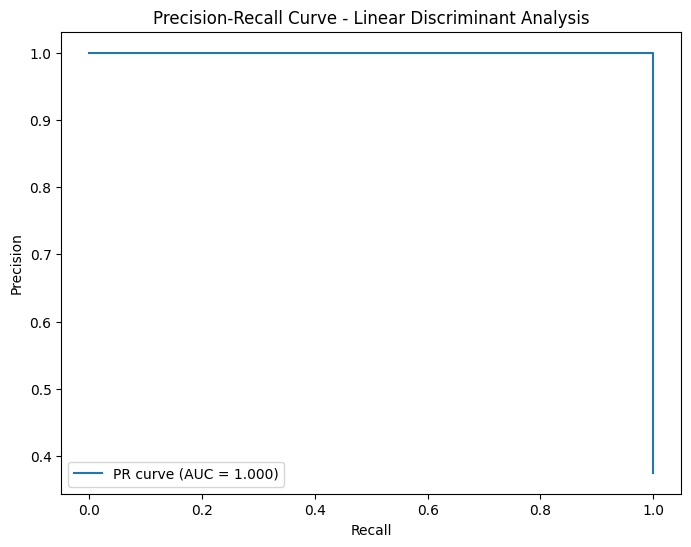

Generating Validation Curve Analysis...
Completed analysis for Linear Discriminant Analysis


 ANALYZING: Multi-layer Perceptron
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: 0.0000
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
validation_fraction: 0.1
solver: adam
learning_rate_init: 0.01

Generating Confusion Matrix...


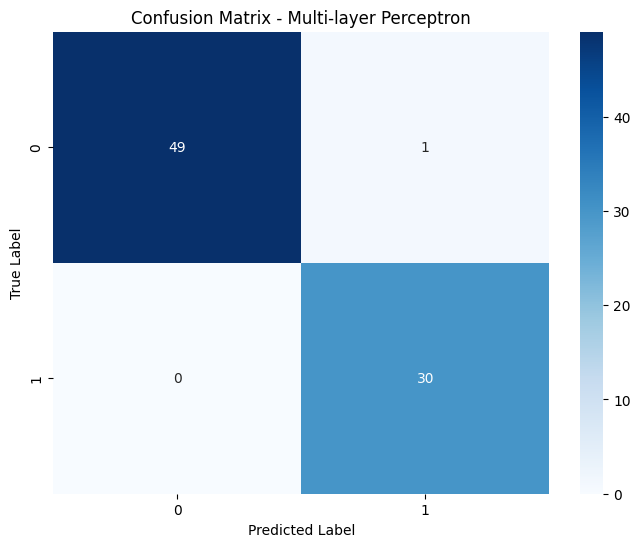

Generating ROC Curve...


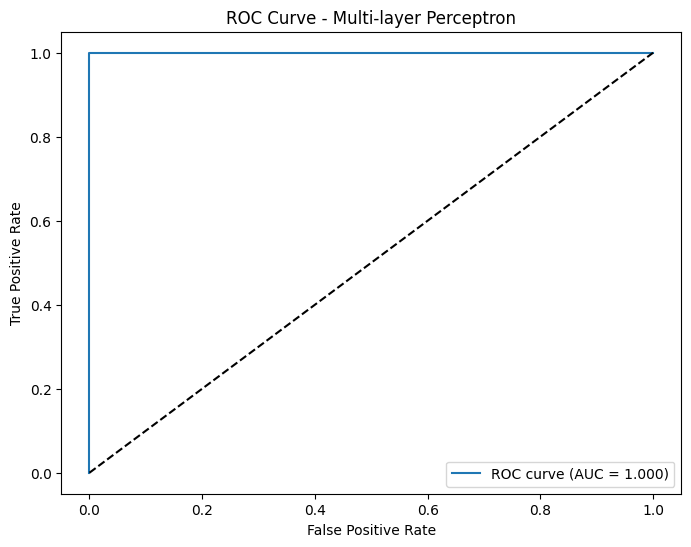

Generating Precision-Recall Curve...


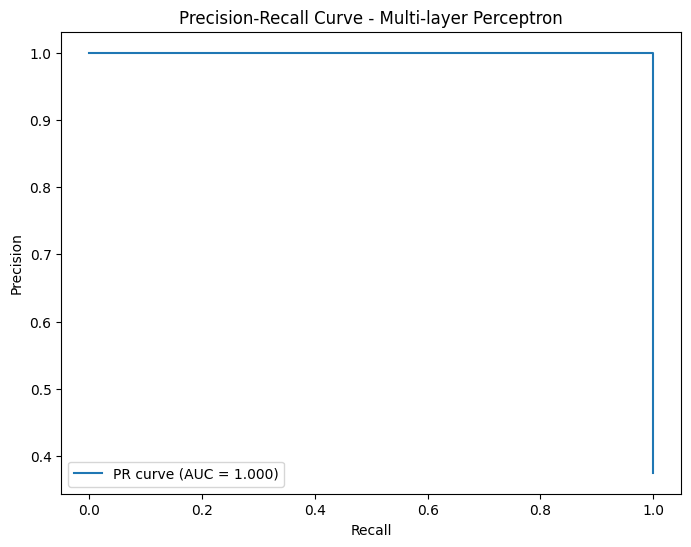

Generating Validation Curve Analysis...
Completed analysis for Multi-layer Perceptron


 ANALYZING: SGD Classifier
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9875
   Precision: 0.9879
   Recall: 0.9875
   F1 Score: 0.9875
   ROC AUC: 1.0000

Hyperparameter Tuning Results:
  Best Recall Score (CV): 1.0000
 Overfitting Risk: LOW
 Overfitting Gap: -0.0042
 Search Method: RandomizedSearchCV (n_iter=100)
Key Tuned Parameters:
validation_fraction: 0.3
penalty: l2
learning_rate: constant

Generating Confusion Matrix...


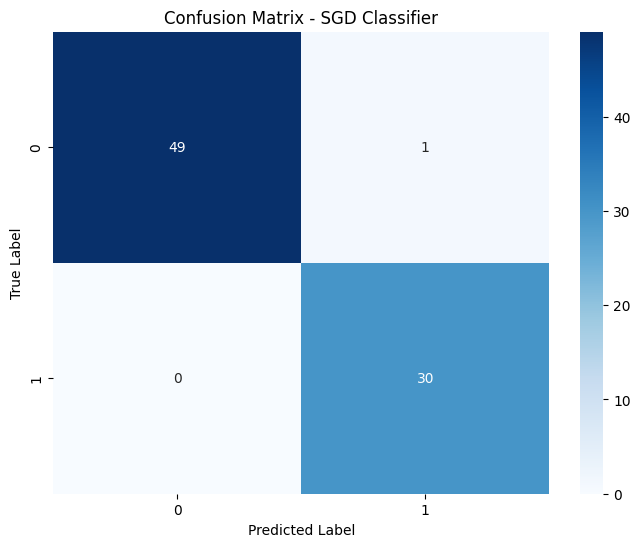

Generating ROC Curve...


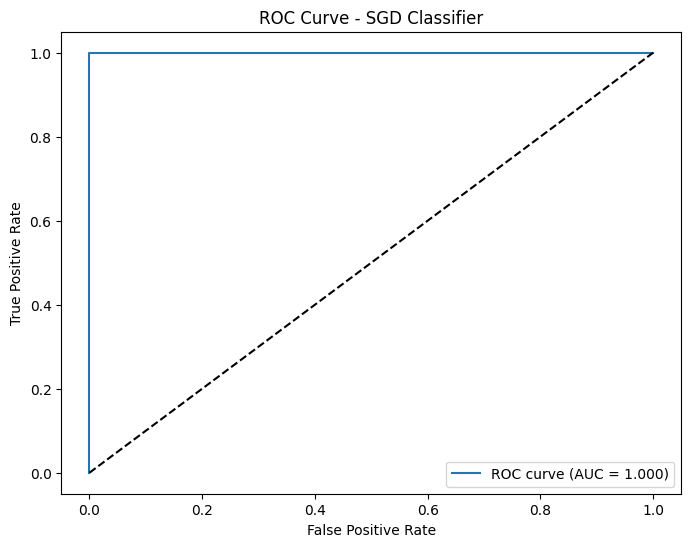

Generating Precision-Recall Curve...


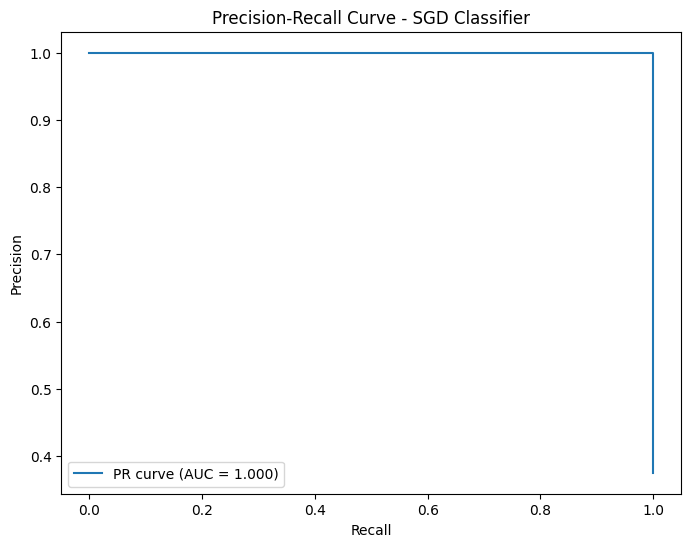

Generating Validation Curve Analysis...
Completed analysis for SGD Classifier


 ANALYZING: Gaussian Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9125
   Precision: 0.9291
   Recall: 0.9125
   F1 Score: 0.9138
   ROC AUC: 1.0000

Generating Confusion Matrix...


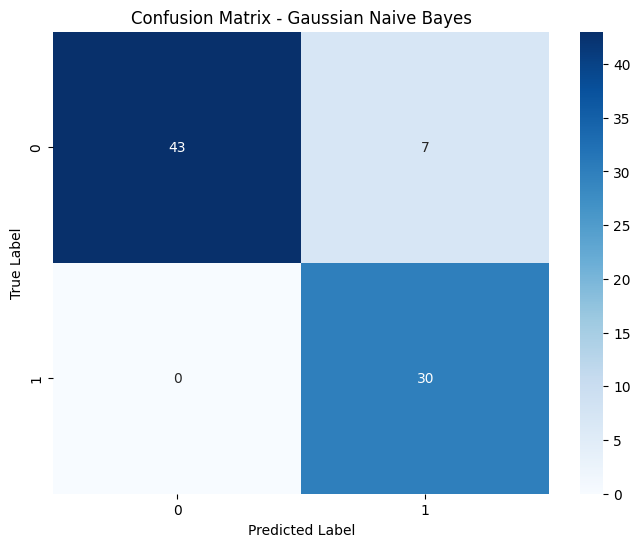

Generating ROC Curve...


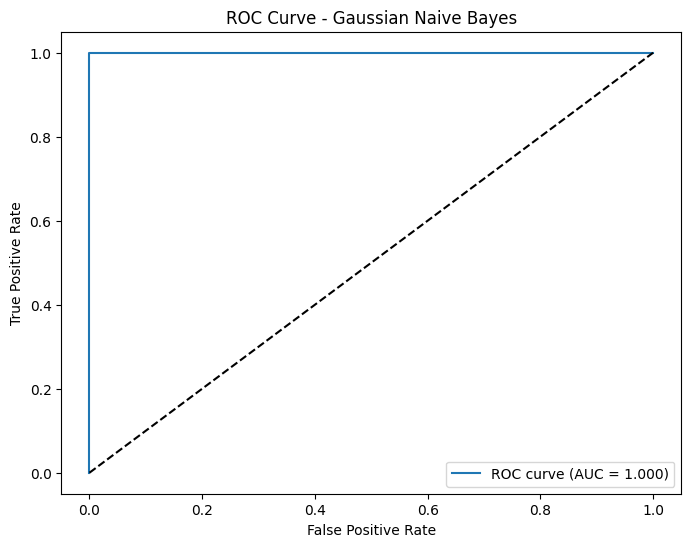

Generating Precision-Recall Curve...


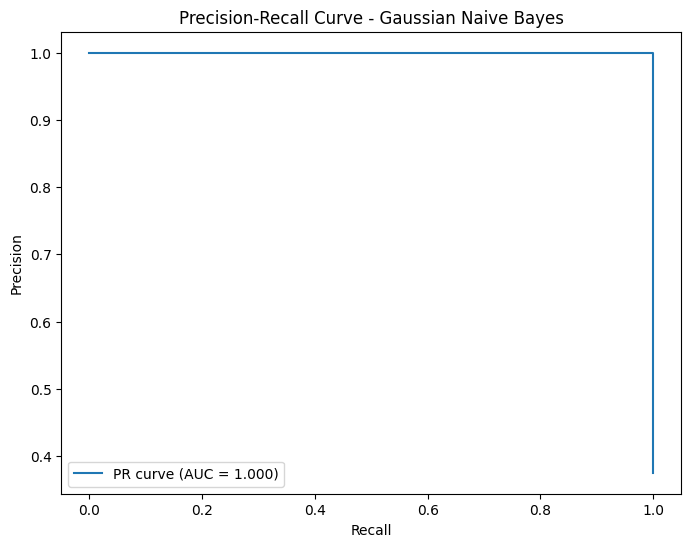

Generating Validation Curve Analysis...
Completed analysis for Gaussian Naive Bayes


 ANALYZING: Bernoulli Naive Bayes
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.9750
   Precision: 0.9760
   Recall: 0.9750
   F1 Score: 0.9748
   ROC AUC: 0.9987

Generating Confusion Matrix...


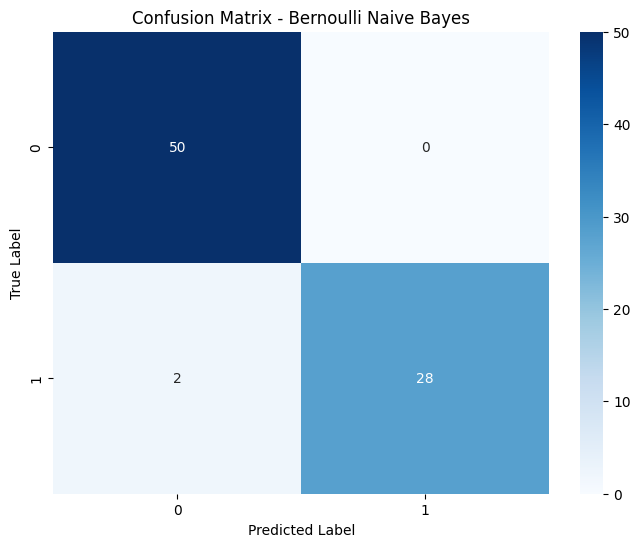

Generating ROC Curve...


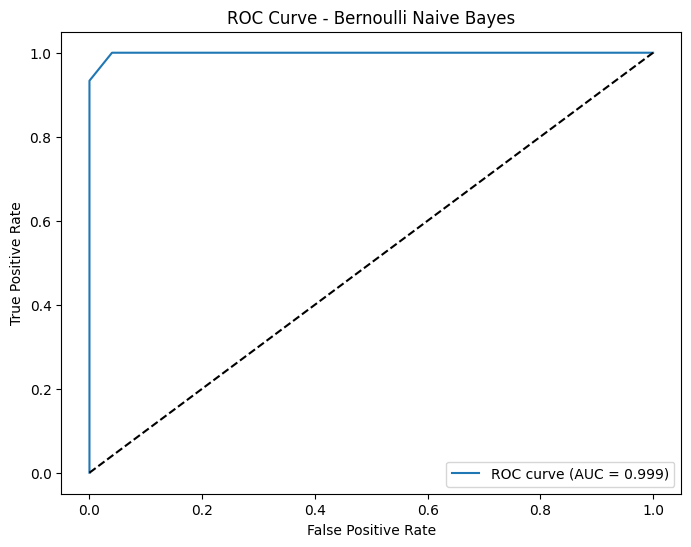

Generating Precision-Recall Curve...


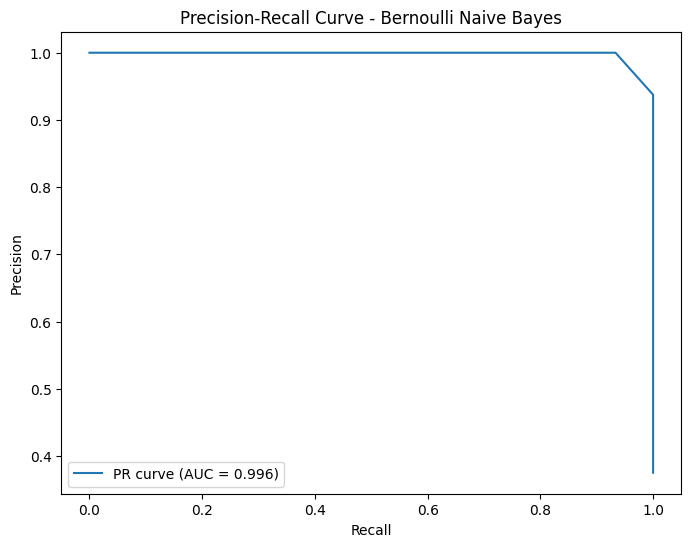

Generating Validation Curve Analysis...
Completed analysis for Bernoulli Naive Bayes


 ANALYZING: Dummy Classifier (Stratified)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.5000
   Precision: 0.4858
   Recall: 0.5000
   F1 Score: 0.4918
   ROC AUC: 0.4533

Generating Confusion Matrix...


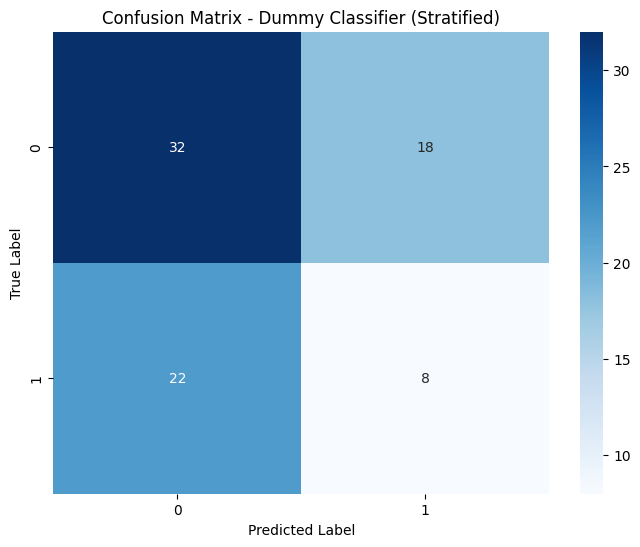

Generating ROC Curve...


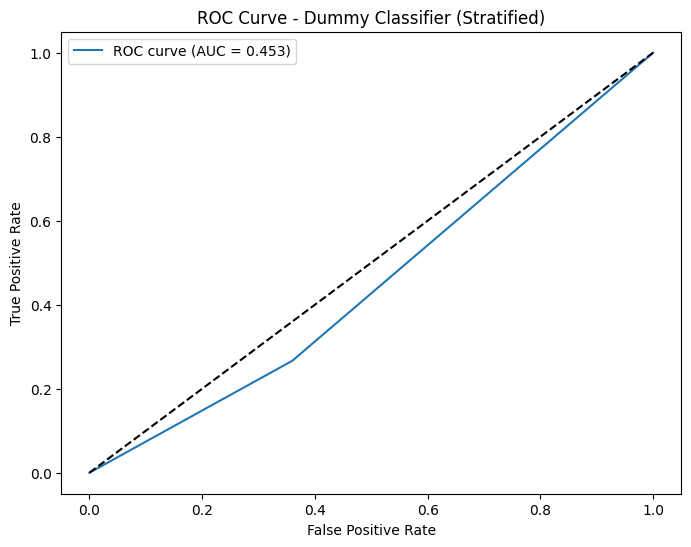

Generating Precision-Recall Curve...


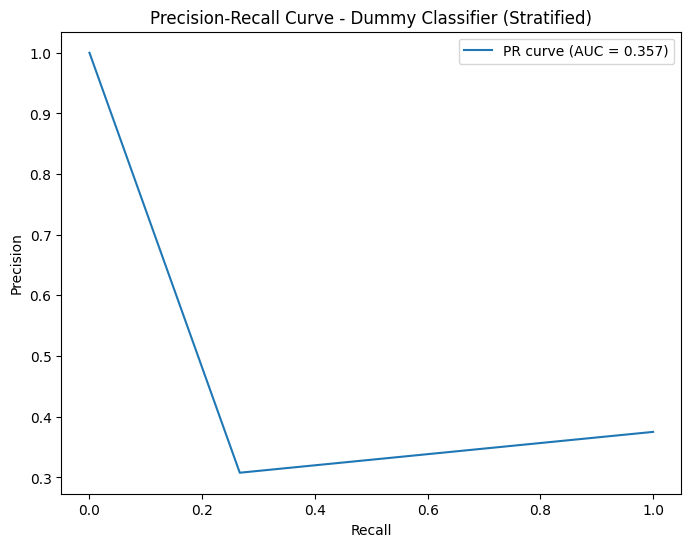

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Stratified)


 ANALYZING: Dummy Classifier (Most Frequent)
------------------------------------------------------------
Model Performance:
   Test Accuracy: 0.6250
   Precision: 0.3906
   Recall: 0.6250
   F1 Score: 0.4808
   ROC AUC: 0.5000

Generating Confusion Matrix...


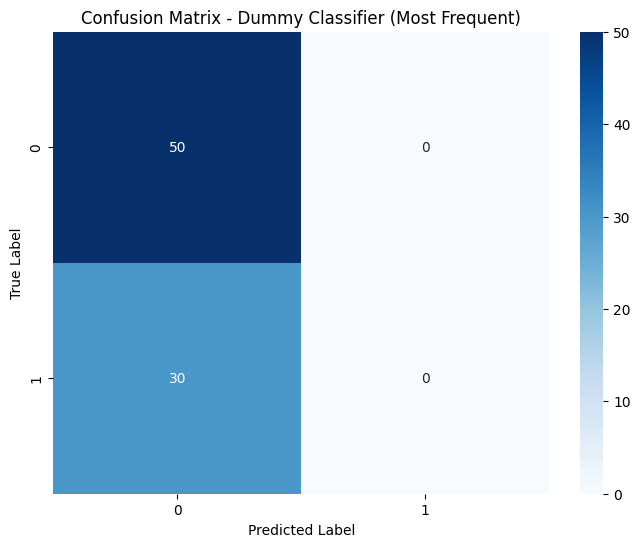

Generating ROC Curve...


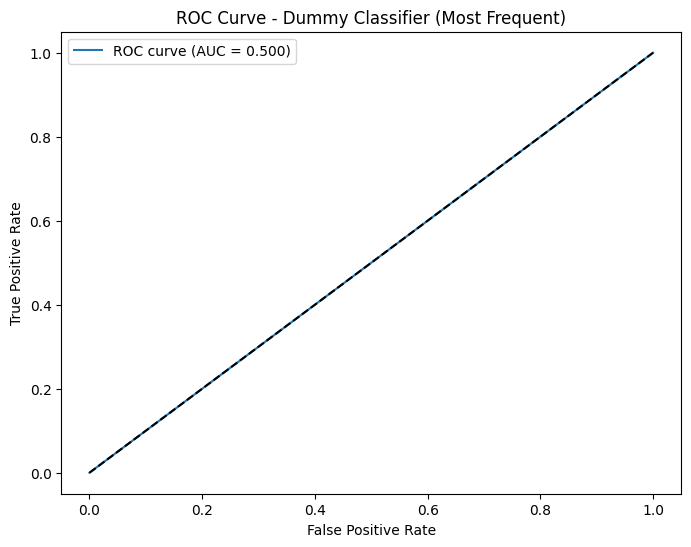

Generating Precision-Recall Curve...


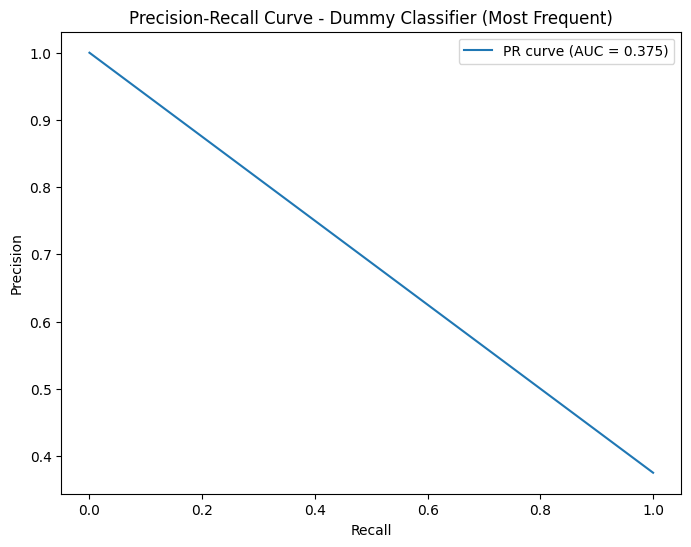

Generating Validation Curve Analysis...
Completed analysis for Dummy Classifier (Most Frequent)


OVERFITTING RISK SUMMARY

Critical CRITICAL OVERFITTING RISK (2 models):
------------------------------------------------------------
   • K-Nearest Neighbors
     Score: 1.000
     - High confidence predictions: 100.0% of training predictions are >95% or <5% confident
     - Perfect training score detected (99.9%+) - highly suspicious

   • Dummy Classifier (Stratified)
     Score: 1.000
     - High confidence predictions: 100.0% of training predictions are >95% or <5% confident
     - Low test performance (0.492) with large gap (0.079) suggests learning noise


Medium MEDIUM OVERFITTING RISK (8 models):
------------------------------------------------------------
   • XGBoost
     Score: 0.394
     - High confidence predictions: 89.2% of training predictions are >95% or <5% confident

   • SVM (RBF)
     Score: 0.300
     - High confidence predictions: 84.2% of training predictions are >

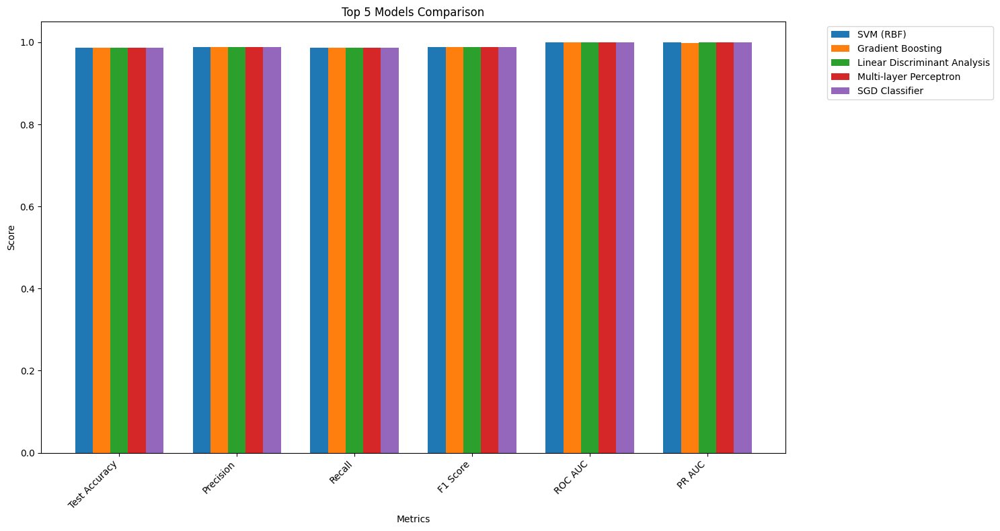

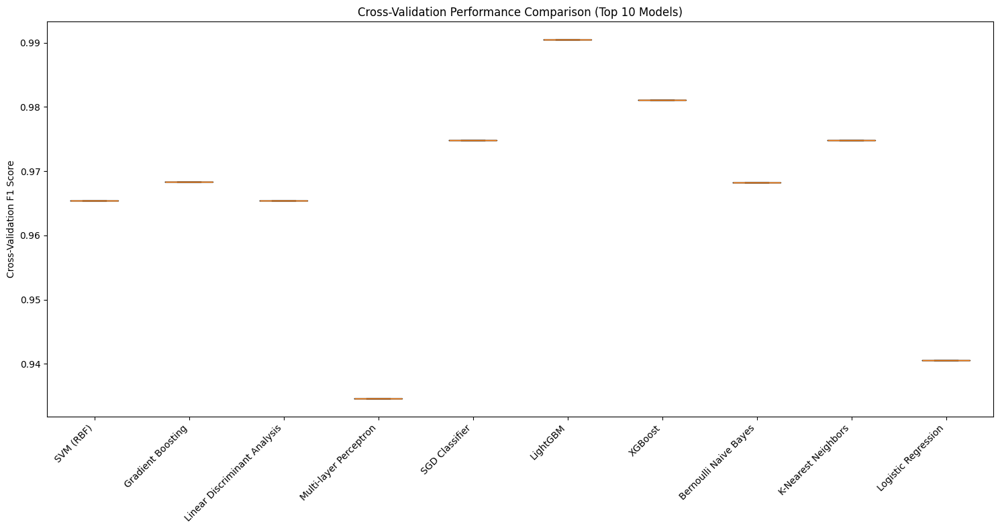


Generating Hyperparameter Tuning Summary Visualization...


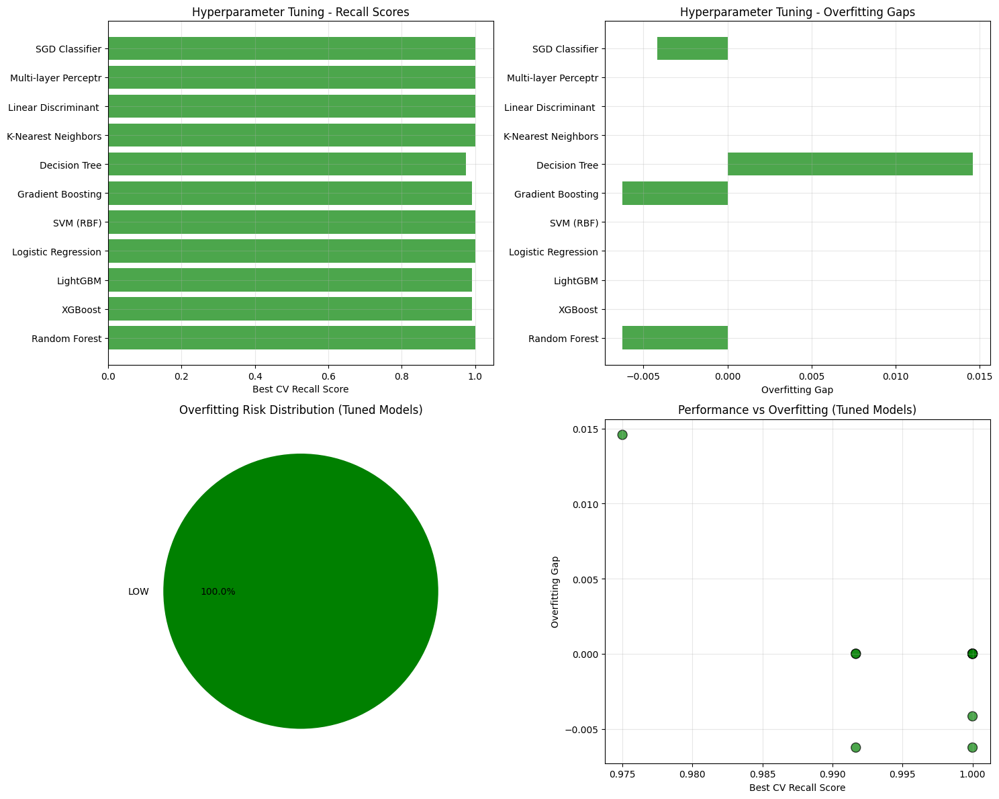


HYPERPARAMETER TUNING STATISTICS:
   Models Tuned: 11
   Best Recall Score: 1.0000
   Lowest Overfitting Gap: -0.0062
   Average Recall Improvement: 0.9955
   Average Overfitting Gap: -0.0002

 FINAL HEALTHCARE RECOMMENDATIONS
RECOMMENDED MODEL: K-Nearest Neighbors
   Healthcare Score: 2.0151
   Recall (Sensitivity): 0.9487
   Precision: 0.9632
   F1 Score: 0.9512
   Overfitting Risk: CRITICAL
   Hyperparameter Optimization:
   Tuning Method: RandomizedSearchCV (n_iter=100)
   CV Recall Score: 1.0000
   Overfitting Gap: 0.0000
\ TOPn 3 SAFE MODELS FOR HEALTHCARE:
   1.   XGBoost (Score: 1.1985, Risk: highMEDIUM)
   2.   SGD Classifier (Score: 1.1903, Risk: highMEDIUM)
   3.   Linear Discriminant Analysis (Score: 1.1892, Risk: highMEDIUM)

MODELS TO AVOID IN HEALTHCARE:
    K-Nearest Neighbors (Overfitting Gap: 0.0000)
   Dummy Classifier (Stratified)

HYPERPARAMETER TUNING INSIGHTS:
  Tuned Models by Risk Level:
      l LOW: 11 models
   Best Tuned Recall: Random Forest (1.0000)
    L

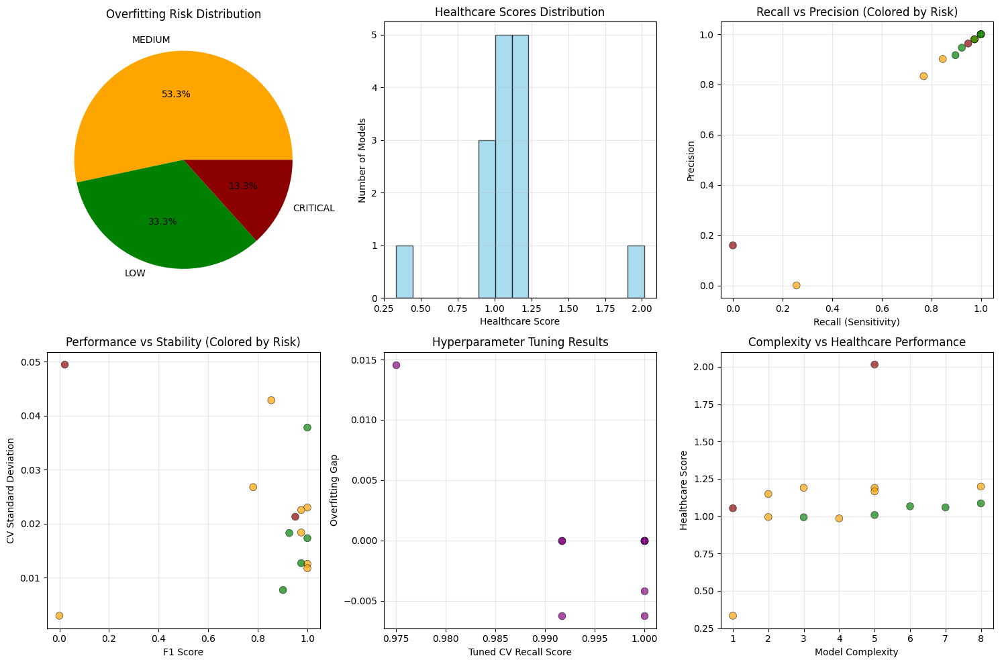


 SUMMARY STATISTICS:
   Total Models Evaluated: 15
   Models with Hyperparameter Tuning: 11
   Low Risk Models: 5
   Medium Risk Models: 8
   High Risk Models: 0
   Critical Risk Models: 2
   Average Healthcare Score: 1.0992
   Average Recall: 0.8376
   Average Precision: 0.8440
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\Random_Forest_v2_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\XGBoost_v2_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\LightGBM_v2_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\Logistic_Regression_v2_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Prediction\CKD-XAI\PickleFiles\SVM_RBF_v2_hyp.pkl
Saved model → c:\Users\CHERISH\DEV\CollegeProjects\Chronic-Kidney-Disease-Predic

In [88]:
results_hyp2 = run_healthcare_ml_pipeline_hyp(X_train_imp2, X_test_imp2, y_train_imp2, y_test_imp2,version_tag="v2_hyp")

print(results_hyp2)

# Results

In [89]:

def build_metric_dataframe_named(metric_name, v0, v1, v2, hyp0, hyp1, hyp2):
    results_dicts = [v0, v1, v2, hyp0, hyp1, hyp2]
    columns = [
        'v0', 
        'v1', 
        'v2', 
        'v0+hyp', 
        'v1+hyp', 
        'v2+hyp'
    ]
    
    # Collect all unique models
    all_models = set()
    for res in results_dicts:
        for r in res['results_list']:
            all_models.add(r['Model'])
    all_models = sorted(all_models)

    # Build DataFrame
    data = {'Model': all_models}
    for col_name, res in zip(columns, results_dicts):
        values = []
        for model in all_models:
            # find metric value for this model
            metric_val = next(
                (r.get(metric_name, None) for r in res['results_list'] if r['Model'] == model), 
                None
            )
            values.append(metric_val)
        data[col_name] = values

    df = pd.DataFrame(data)
    return df


In [90]:
pd.set_option('display.max_columns', None)

# Show all rows 
pd.set_option('display.max_rows', None)

pd.set_option('display.width', 200)

## Accuracy

In [91]:
metric_df_1 = build_metric_dataframe_named(
    'Test Accuracy', 
    v0_results, v1_results, v2_results, 
    results_hyp0, results_hyp1, results_hyp2
)


print(metric_df_1)

                               Model      v0      v1      v2  v0+hyp  v1+hyp  v2+hyp
0                           AdaBoost  1.0000  1.0000  0.9750     NaN     NaN     NaN
1                            Bagging  0.9750  0.9750  0.9750     NaN     NaN     NaN
2              Bernoulli Naive Bayes  0.9625  0.9750  0.9750  0.9625  0.9750  0.9750
3                      Decision Tree  0.9750  0.9750  0.9750  0.8750  0.8750  0.8750
4   Dummy Classifier (Most Frequent)  0.6250  0.6250  0.6250  0.6250  0.6250  0.6250
5      Dummy Classifier (Stratified)  0.5000  0.5000  0.5000  0.5000  0.5000  0.5000
6                        Extra Trees  1.0000  1.0000  1.0000     NaN     NaN     NaN
7               Gaussian Naive Bayes  0.9125  0.9000  0.9125  0.9125  0.9000  0.9125
8                  Gradient Boosting  0.9875  0.9750  0.9750  0.9375  0.9500  0.9875
9                K-Nearest Neighbors  0.9750  1.0000  0.9625  0.9500  1.0000  0.9625
10                          LightGBM  1.0000  1.0000  0.9750  0.9

## Precision

In [92]:
metric_df_2 = build_metric_dataframe_named(
    'Precision', 
    v0_results, v1_results, v2_results, 
    results_hyp0, results_hyp1, results_hyp2
)


print(metric_df_2)

                               Model        v0        v1        v2    v0+hyp    v1+hyp    v2+hyp
0                           AdaBoost  1.000000  1.000000  0.975962       NaN       NaN       NaN
1                            Bagging  0.975962  0.975962  0.975962       NaN       NaN       NaN
2              Bernoulli Naive Bayes  0.965909  0.976562  0.975962  0.965909  0.976562  0.975962
3                      Decision Tree  0.975962  0.975962  0.975962  0.888258  0.888258  0.888258
4   Dummy Classifier (Most Frequent)  0.390625  0.390625  0.390625  0.390625  0.390625  0.390625
5      Dummy Classifier (Stratified)  0.485755  0.485755  0.485755  0.485755  0.485755  0.485755
6                        Extra Trees  1.000000  1.000000  1.000000       NaN       NaN       NaN
7               Gaussian Naive Bayes  0.929054  0.921053  0.929054  0.929054  0.921053  0.929054
8                  Gradient Boosting  0.987745  0.975962  0.975962  0.938199  0.950000  0.987903
9                K-Nearest Nei

## Recall

In [93]:
metric_df_3 = build_metric_dataframe_named(
    'Recall', 
    v0_results, v1_results, v2_results, 
    results_hyp0, results_hyp1, results_hyp2
)


print(metric_df_3)


                               Model      v0      v1      v2  v0+hyp  v1+hyp  v2+hyp
0                           AdaBoost  1.0000  1.0000  0.9750     NaN     NaN     NaN
1                            Bagging  0.9750  0.9750  0.9750     NaN     NaN     NaN
2              Bernoulli Naive Bayes  0.9625  0.9750  0.9750  0.9625  0.9750  0.9750
3                      Decision Tree  0.9750  0.9750  0.9750  0.8750  0.8750  0.8750
4   Dummy Classifier (Most Frequent)  0.6250  0.6250  0.6250  0.6250  0.6250  0.6250
5      Dummy Classifier (Stratified)  0.5000  0.5000  0.5000  0.5000  0.5000  0.5000
6                        Extra Trees  1.0000  1.0000  1.0000     NaN     NaN     NaN
7               Gaussian Naive Bayes  0.9125  0.9000  0.9125  0.9125  0.9000  0.9125
8                  Gradient Boosting  0.9875  0.9750  0.9750  0.9375  0.9500  0.9875
9                K-Nearest Neighbors  0.9750  1.0000  0.9625  0.9500  1.0000  0.9625
10                          LightGBM  1.0000  1.0000  0.9750  0.9

## F1 Score

In [94]:
metric_df_4 = build_metric_dataframe_named(
    'F1 Score', 
    v0_results, v1_results, v2_results, 
    results_hyp0, results_hyp1, results_hyp2
)


print(metric_df_4)

                               Model        v0        v1        v2    v0+hyp    v1+hyp    v2+hyp
0                           AdaBoost  1.000000  1.000000  0.974814       NaN       NaN       NaN
1                            Bagging  0.974814  0.974814  0.974814       NaN       NaN       NaN
2              Bernoulli Naive Bayes  0.962813  0.975148  0.974814  0.962813  0.975148  0.974814
3                      Decision Tree  0.974814  0.974814  0.974814  0.876692  0.876692  0.876692
4   Dummy Classifier (Most Frequent)  0.480769  0.480769  0.480769  0.480769  0.480769  0.480769
5      Dummy Classifier (Stratified)  0.491758  0.491758  0.491758  0.491758  0.491758  0.491758
6                        Extra Trees  1.000000  1.000000  1.000000       NaN       NaN       NaN
7               Gaussian Naive Bayes  0.913778  0.901535  0.913778  0.913778  0.901535  0.913778
8                  Gradient Boosting  0.987456  0.974814  0.974814  0.937697  0.950000  0.987539
9                K-Nearest Nei

# Conclusion

In [95]:
def select_best_version_and_top_models(
    v0, v1, v2, hyp0, hyp1, hyp2, top_k=5
):
    versions = {
        'v0': v0,
        'v1': v1,
        'v2': v2,
        'v0+hyp': hyp0,
        'v1+hyp': hyp1,
        'v2+hyp': hyp2
    }

    version_summary = {}
    version_tables = {}

    for version_name, version_data in versions.items():
        rows = []

        for r in version_data['results_list']:
            # Base healthcare performance score
            perf_score = (
                0.40 * r.get('Recall', 0) +
                0.25 * r.get('F1 Score', 0) +
                0.20 * r.get('Test Accuracy', 0) +
                0.15 * r.get('ROC AUC', 0)
            )

            # Overfitting penalty (already computed earlier)
            risk = r.get('Overfitting Risk', 'LOW')
            penalty = {
                'LOW': 0.00,
                'MEDIUM': 0.05,
                'HIGH': 0.15,
                'CRITICAL': 0.30
            }.get(risk, 0.10)

            final_score = perf_score - penalty

            rows.append({
                'Model': r['Model'],
                'Final Score': final_score,
                'Overfitting Risk': risk,
                'Recall': r.get('Recall'),
                'F1 Score': r.get('F1 Score'),
                'Accuracy': r.get('Test Accuracy')
            })

        df = pd.DataFrame(rows).sort_values(
            by='Final Score', ascending=False
        )

        version_tables[version_name] = df
        version_summary[version_name] = df['Final Score'].mean()

    best_version = max(version_summary, key=version_summary.get)

    # Top models from best version
    top_models = version_tables[best_version].head(top_k)

    return best_version, top_models, version_tables


In [96]:
best_version, top_models, all_version_tables = select_best_version_and_top_models(
    v0_results,
    v1_results,
    v2_results,
    results_hyp0,
    results_hyp1,
    results_hyp2,
    top_k=5
)

print(" BEST VERSION OVERALL:", best_version)
print("\n TOP 5 MODELS IN BEST VERSION:\n")
print(top_models)


 BEST VERSION OVERALL: v2+hyp

 TOP 5 MODELS IN BEST VERSION:

                    Model  Final Score Overfitting Risk  Recall  F1 Score  Accuracy
9  Multi-layer Perceptron     0.989385              LOW  0.9875  0.987539    0.9875
5       Gradient Boosting     0.989285              LOW  0.9875  0.987539    0.9875
2                LightGBM     0.977504              LOW  0.9750  0.974814    0.9750
3     Logistic Regression     0.957630              LOW  0.9500  0.950521    0.9500
0           Random Forest     0.946324              LOW  0.9375  0.937697    0.9375
